## Credit Card Fraud Detection

Problem Statement - to predict fraudulent credit card transactions with the help of machine learning models.

In [22]:
# Importing necessary libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn import metrics
from sklearn import preprocessing

## Exploratory data analysis

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [4]:
CC_df = pd.read_csv('/content/drive/MyDrive/creditcard.csv')
CC_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
CC_df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,9.170318e-16,-1.810658e-15,1.693438e-15,1.479045e-15,3.482336e-15,1.392007e-15,-7.528491e-16,4.328772e-16,9.049732e-16,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [5]:
# checking for null values in dataset
CC_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

Understanding the distribution of normal and Fraudlent classes

In [6]:
classes=CC_df['Class'].value_counts()

normal_share=classes[0]/CC_df['Class'].count()*100
fraud_share=classes[1]/CC_df['Class'].count()*100

print("Percentage of normal case - ", normal_share)
print("Percentage of Fraudlent case - ", fraud_share)



Percentage of normal case -  99.82725143693798
Percentage of Fraudlent case -  0.1727485630620034


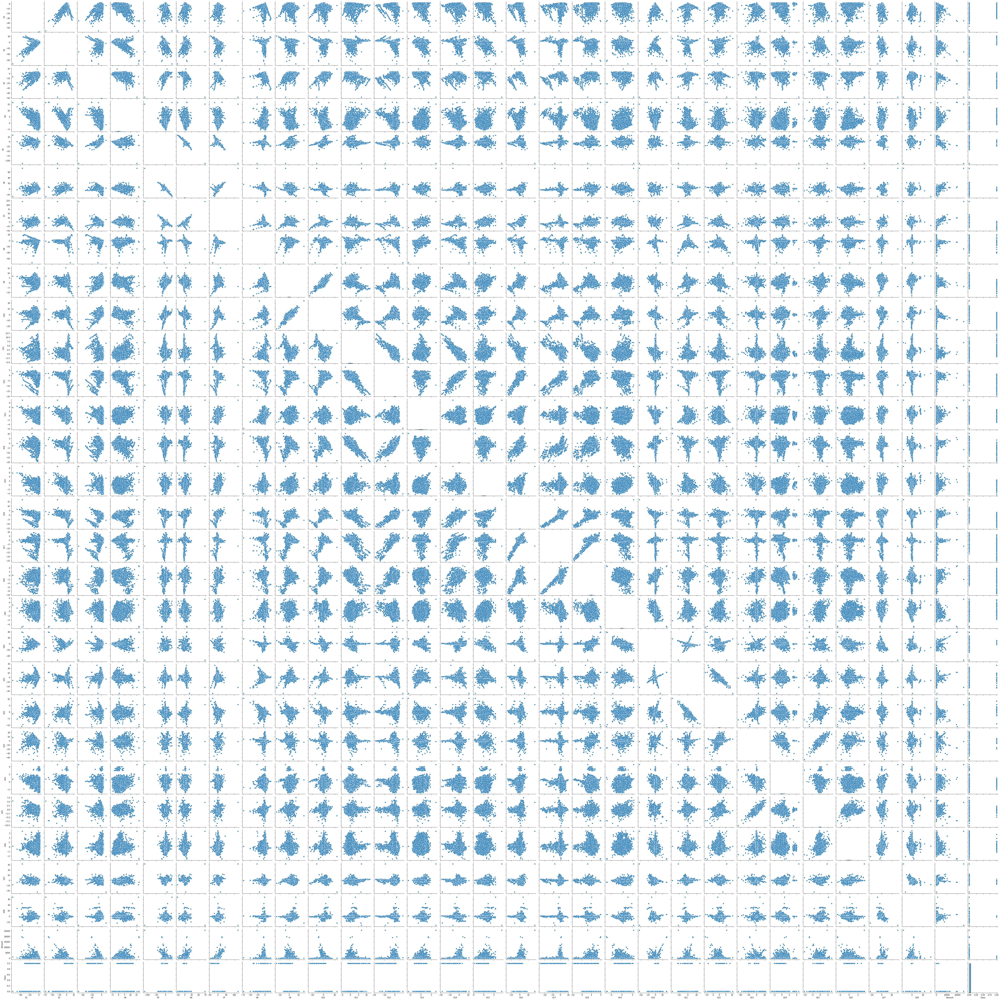

In [ ]:
sns.pairplot(data=CC_df,hue='Class')

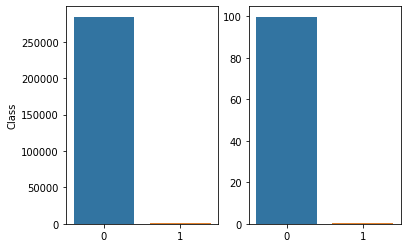

In [7]:
# Visualization of number and percentage of fraudulent vs non-fraudulent transcations
Trans_percentage = [normal_share,fraud_share]

fig,ax = plt.subplots(1,2,figsize=(6,4))
ax1, ax2 = ax.flatten()
sns.barplot(x=[0,1],y=classes,ax = ax1)
sns.barplot(x=[0,1],y=Trans_percentage,ax = ax2)


# Distribution of classes with time and amount

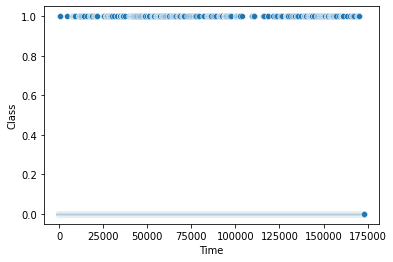

In [ ]:
# Time 
sns.scatterplot(data=CC_df,x='Time',y='Class')

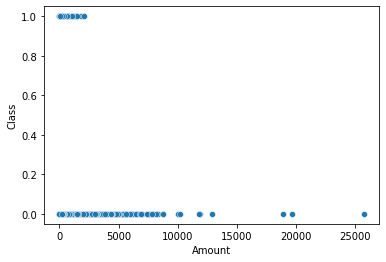

In [ ]:
# Amount
sns.scatterplot(data=CC_df,x='Amount',y='Class')

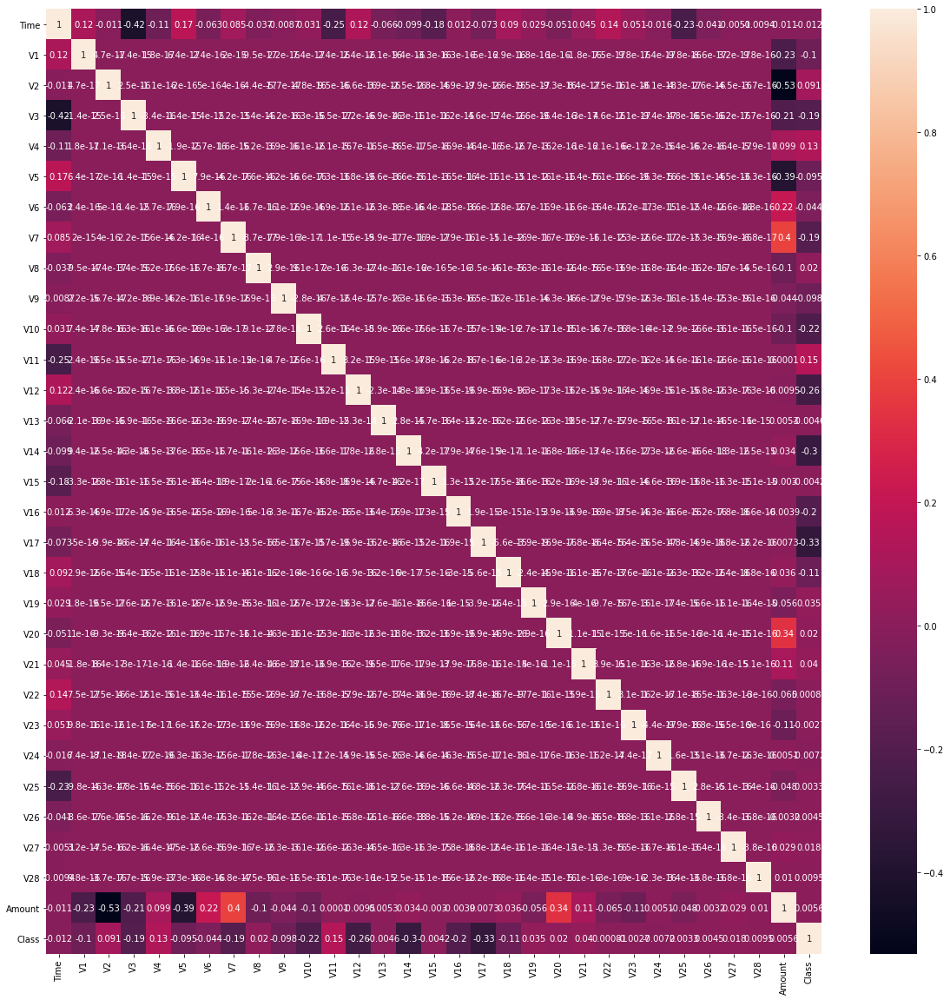

In [ ]:
# Checking variable correlation
plt.figure(figsize=(20,20))
sns.heatmap(data=CC_df.corr(),annot=True)
plt.show()

In [8]:
# Drop unnecessary columns - Time as it strongly correleated with other variables in dataset

CC_df = CC_df.drop(columns='Time')
CC_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [9]:
X = CC_df.drop(columns='Class')

### Splitting the data into train & test data

In [10]:
y= CC_df.Class
y

0         0
1         0
2         0
3         0
4         0
         ..
284802    0
284803    0
284804    0
284805    0
284806    0
Name: Class, Length: 284807, dtype: int64

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=100,stratify=y)

##### Preserve X_test & y_test to evaluate on the test data once you build the model

In [10]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

492
369
123


### Plotting the distribution of a variable

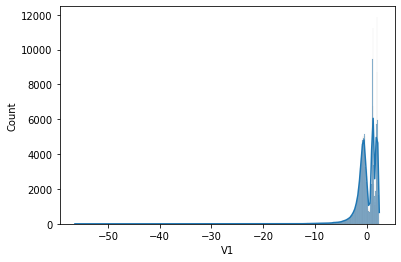

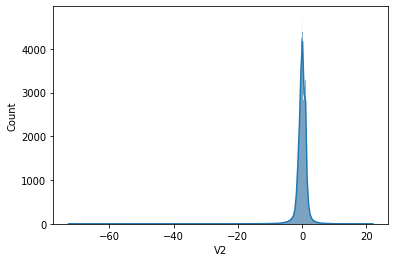

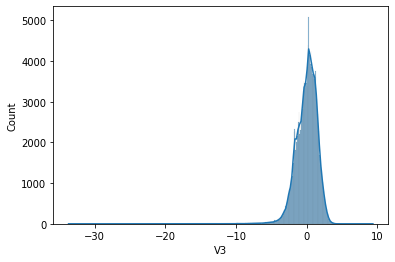

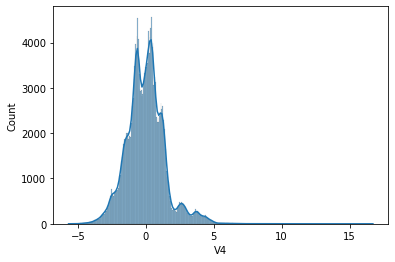

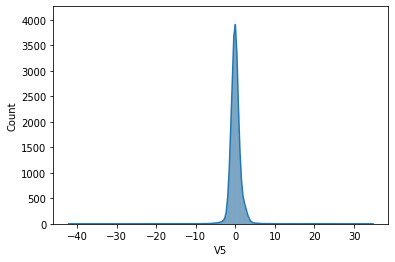

...

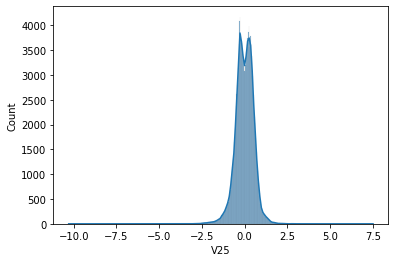

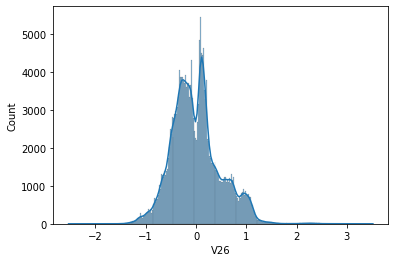

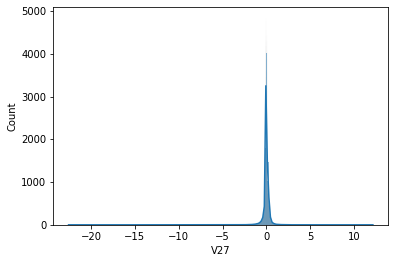

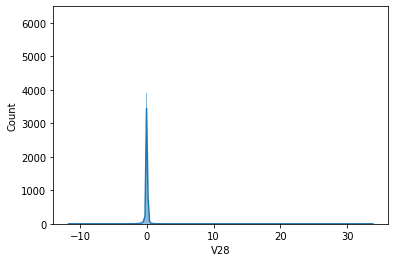

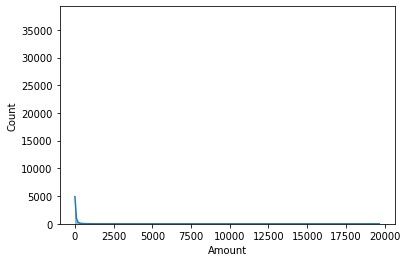

In [ ]:
# plot the histogram of a variable from the dataset to see the skewness
for col in X_train.columns :
  sns.histplot(data=X_train,x=col,kde=True)
  plt.show()

### Transforming data with Power Transform to avoid data skewness
- <b>Power Transformer</b> package present in the <b>preprocessing library provided by sklearn</b> to make distribution more gaussian

In [12]:
# - Apply : preprocessing.PowerTransformer(copy=False) to fit & transform the train & test data
from sklearn.preprocessing import PowerTransformer

transf = PowerTransformer(method='yeo-johnson',copy=False)
transf.fit_transform(X_train)
transf.transform(X_test)

array([[ 1.11660077, -0.24624807, -1.21126569, ..., -0.09942353,
        -0.02426017,  1.11998389],
       [-0.8007408 ,  0.44011381,  0.62206941, ..., -0.11903135,
        -0.02932256, -1.4485192 ],
       [ 1.42613473,  0.11607881, -1.26746513, ..., -0.10881017,
        -0.23037544, -0.39489373],
       ...,
       [ 1.34967801, -0.27895312, -1.02259027, ..., -0.28713909,
        -0.22180959,  0.59394613],
       [-0.60181077,  0.80366937, -0.16233207, ..., -0.58853555,
         0.48508476, -0.72555558],
       [ 0.46727185, -0.4919582 ,  0.00805671, ..., -0.09422002,
         0.10855538,  1.15551083]])

In [ ]:
transf.lambdas_

array([ 1.48229395,  1.21081118,  1.33811436,  0.8225053 ,  0.99982347,
        0.7260803 ,  1.0422929 ,  1.29576956,  0.8529526 ,  0.87017512,
        0.87230934,  1.53624954,  0.96918961,  1.25764971,  1.17649211,
        1.27263562,  1.13659699,  1.06855696,  0.96508265,  1.01735831,
        0.89925298,  1.07679522,  1.08371977,  1.41121313,  1.19028269,
        0.5221509 ,  1.16660369,  0.85908724, -0.0441169 ])

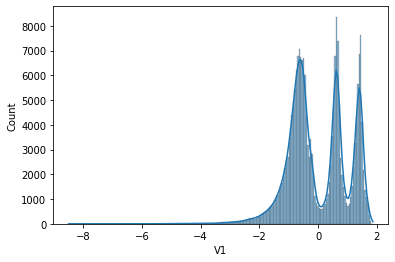

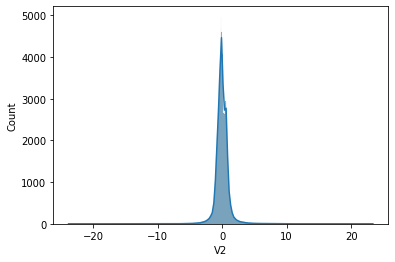

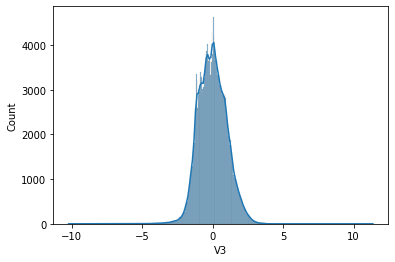

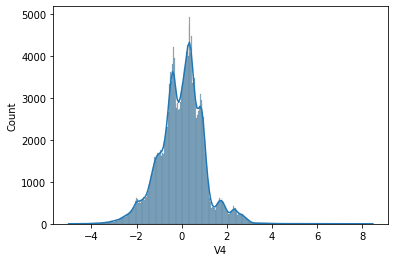

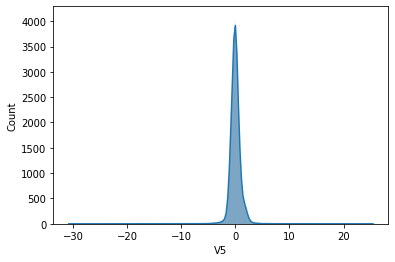

...

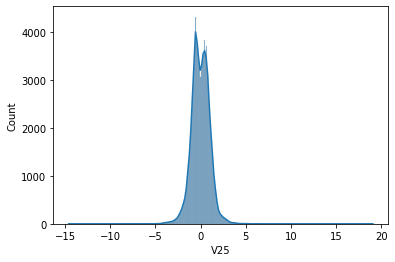

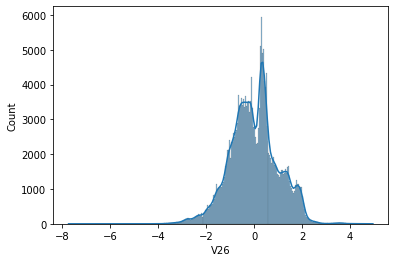

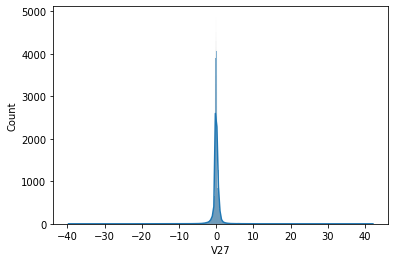

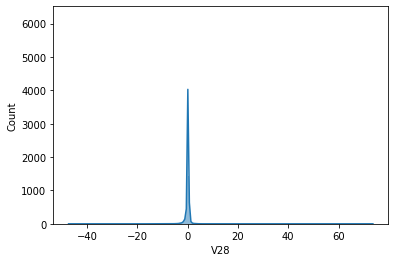

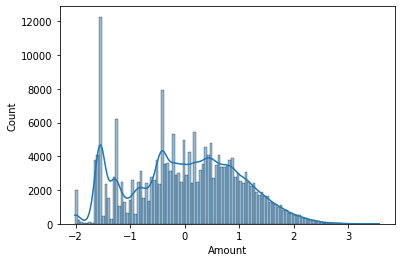

In [ ]:
# plot the histogram of a variable from the dataset again to see the result 

for col in X_train.columns:
  sns.histplot(data=X_train,x=col,kde=True)
  plt.show()

## Model Building
- Build different models on the imbalanced dataset 

In [13]:
from sklearn import model_selection 
no_of_split = 3
st_kfold = model_selection.StratifiedKFold(n_splits=no_of_split,shuffle=True,random_state=100)


Logistic Regression

In [18]:
# Logistic Regression

from sklearn import linear_model #import the package
from sklearn import metrics

num_C = [0.001,0.01,0.1,1,10,100,1000] #--> list of values
cv_num = 0
roc = np.zeros((len(num_C),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx], X_train.iloc[test_idx]
    y_train_cv, y_test_cv = y_train.iloc[train_idx], y_train.iloc[test_idx]
    for id,val in enumerate(num_C):
      clf = linear_model.LogisticRegression(C=val,n_jobs=-1, random_state= 0,max_iter=1000)
      clf.fit(X_train_cv,y_train_cv)
      roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv,y_score=clf.predict_proba(X_test_cv)[:,1])
    cv_num +=1
print("AUC score ", roc)

print("Best num_C ", num_C[np.argmax(np.mean(roc,axis=1))])
print("AUC score corresponding to Best num_C ", np.max(np.mean(roc,axis=1)))

AUC score  [[0.97885326 0.98280535 0.96911363]
 [0.98200239 0.98251505 0.97642988]
 [0.97977951 0.98176551 0.97469481]
 [0.97841872 0.98127539 0.97352731]
 [0.97822016 0.98120573 0.9733634 ]
 [0.97820369 0.98119715 0.97334716]
 [0.97820106 0.98119623 0.97334533]]
Best num_C  0.01
AUC score corresponding to Best num_C  0.9803157721974033


KNN

In [17]:
# KNN

from sklearn import neighbors

neigh = 31 
roc = np.zeros((len(range(1, neigh+1, 2)), no_of_split)) 
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx], X_train.iloc[test_idx]
    y_train_cv, y_test_cv = y_train.iloc[train_idx], y_train.iloc[test_idx]
    for id, k in enumerate(range(1, neigh+1, 2)):
        clf = neighbors.KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
        clf.fit(X_train_cv, y_train_cv)
        roc[id, cv_num] = metrics.roc_auc_score(y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
        print('Neighbour =', k, '; auc =', roc[id, cv_num], "k_fold ",cv_num)
    cv_num += 1

print('Best neighbour k:', 2*np.argmax(np.mean(roc,axis=1))+1)
print('Best auc score corresponding to Best neighbour:', np.max(np.mean(roc,axis=1)))

Neighbour = 1 ; auc = 0.8860944486708194 k_fold  0
Neighbour = 3 ; auc = 0.910493957427651 k_fold  0
Neighbour = 5 ; auc = 0.9226413825358868 k_fold  0
Neighbour = 7 ; auc = 0.9266736530531641 k_fold  0
Neighbour = 9 ; auc = 0.9307093549979943 k_fold  0
Neighbour = 11 ; auc = 0.934736592754861 k_fold  0
Neighbour = 13 ; auc = 0.9347110286195928 k_fold  0
Neighbour = 15 ; auc = 0.938745929897994 k_fold  0
Neighbour = 17 ; auc = 0.9387134457171609 k_fold  0
Neighbour = 19 ; auc = 0.9427412553786197 k_fold  0
Neighbour = 21 ; auc = 0.9427285590966744 k_fold  0
Neighbour = 23 ; auc = 0.9427198089564148 k_fold  0
Neighbour = 25 ; auc = 0.9426957317730861 k_fold  0
Neighbour = 27 ; auc = 0.9467272588143938 k_fold  0
Neighbour = 29 ; auc = 0.9467193093405631 k_fold  0
Neighbour = 31 ; auc = 0.9466834509226365 k_fold  0
Neighbour = 1 ; auc = 0.8942174955451493 k_fold  1
Neighbour = 3 ; auc = 0.9267307863219181 k_fold  1
Neighbour = 5 ; auc = 0.9429767084991999 k_fold  1
Neighbour = 7 ; auc = 0

SVM

In [ ]:
# SVM

from sklearn import svm

num_C = [0.001,0.01,0.1,1,10,100,1000] #--> list of values
cv_num = 0
roc = np.zeros((len(num_C),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx], X_train.iloc[test_idx]
    y_train_cv, y_test_cv = y_train.iloc[train_idx], y_train.iloc[test_idx]
    for id,val in enumerate(num_C):
      clf = svm.SVC(C=val, random_state= 100,probability=True,verbose=True)
      clf.fit(X_train_cv,y_train_cv)
      roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv,y_score=clf.predict_proba(X_test_cv)[:,1])
      print('Val =', val, '; auc =', roc[id, cv_num], '; cv_num =', cv_num)
    cv_num +=1

print("Best num_C ", num_C[np.argmax(np.mean(roc,axis=1))])
print("AUC score corresponding to Best num_C ", np.max(np.mean(roc,axis=1)))


#[LibSVM]Val = 0.001 ; auc = 0.9264573015459611 ; cv_num = 0
#[LibSVM]Val = 0.01 ; auc = 0.9261400088782469 ; cv_num = 0
#[LibSVM]Val = 0.1 ; auc = 0.9797978134257348 ; cv_num = 0
#[LibSVM]Val = 1 ; auc = 0.982898680124268 ; cv_num = 0
#[LibSVM]Val = 10 ; auc = 0.9659367905880976 ; cv_num = 0
#[LibSVM]Val = 100 ; auc = 0.9489305212555776 ; cv_num = 0
#[LibSVM]Val = 1000 ; auc = 0.942532738964329 ; cv_num = 0
#[LibSVM]Val = 0.001 ; auc = 0.9047126882867191 ; cv_num = 1
#[LibSVM]Val = 0.01 ; auc = 0.9312821174470133 ; cv_num = 1
#[LibSVM]Val = 0.1 ; auc = 0.9794395723892241 ; cv_num = 1
#[LibSVM]Val = 1 ; auc = 0.9731283764532239 ; cv_num = 1
#[LibSVM]Val = 10 ; auc = 0.9700969389721753 ; cv_num = 1
#[LibSVM]Val = 100 ; auc = 0.962274885484684 ; cv_num = 1
#[LibSVM]Val = 1000 ; auc = 0.9579564339095044 ; cv_num = 1
#[LibSVM]Val = 0.001 ; auc = 0.950415174260637 ; cv_num = 2
#[LibSVM]Val = 0.01 ; auc = 0.9436126737670765 ; cv_num = 2
#[LibSVM]Val = 0.1 ; auc = 0.9782306601450326 ; cv_num = 2
#[LibSVM]Val = 1 ; auc = 0.9692828009627349 ; cv_num = 2
#[LibSVM]Val = 10 ; auc = 0.9572486724191928 ; cv_num = 2
#[LibSVM]Val = 100 ; auc = 0.942098935396062 ; cv_num = 2
#[LibSVM]Val = 1000 ; auc = 0.9241521452328679 ; cv_num = 2
#Best num_C  0.1
#AUC score corresponding to Best num_C  0.9791560153199971

Decision Tree

In [ ]:
#Decision Tree

from sklearn import tree

no_depth = range(2, 7)
no_min_samp_leaf = [30,50,100]
no_min_samp_split = [2,31]
roc = np.zeros((len(no_depth)*len(no_min_samp_leaf)*len(no_min_samp_split), no_of_split))
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx], X_train.iloc[test_idx]
    y_train_cv, y_test_cv = y_train.iloc[train_idx], y_train.iloc[test_idx]
    for dep_id, depth in enumerate(no_depth):
        for leaf_id, samp_leaf in enumerate(no_min_samp_leaf):
            for split_id, samp_split in enumerate(no_min_samp_split):
                clf = tree.DecisionTreeClassifier(criterion='entropy', max_depth=depth,
                        min_samples_leaf=samp_leaf, min_samples_split=samp_split, random_state=0)
                clf.fit(X_train_cv, y_train_cv)
                id = dep_id*len(no_min_samp_leaf)*len(no_min_samp_split)+\
                      leaf_id*len(no_min_samp_split)+split_id
                roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv,y_score=clf.predict_proba(X_test_cv)[:,1])
                print("Depth - ", depth, "; min_sample_leaf  ", samp_leaf, "; min_sample_split  ", samp_split,"roc ",
                      roc[id,cv_num], "cv_num ", cv_num)
    cv_num += 1
depth_id = np.argmax(np.mean(roc, axis=1))//(len(no_min_samp_leaf)*len(no_min_samp_split))
min_samples_leaf_id = (np.argmax(np.mean(roc, axis=1)) - depth_id*len(no_min_samp_leaf)*len(no_min_samp_split))//len(
                       no_min_samp_split)
min_samples_split_id = (np.argmax(np.mean(roc, axis=1)) - depth_id*len(no_min_samp_leaf)*len(no_min_samp_split))%len(
                       no_min_samp_split)
print('Optimal depth:', no_depth[depth_id])
print('Optimal minimum samples leaf:', no_min_samp_leaf[leaf_id])
print('Optimal minimum samples split:', no_min_samp_leaf[split_id])
print('Optimal auc corresponding to optimal depth,minimum samples leaf,minimum samples split ', np.max(np.mean(roc, axis=1)))

# Depth -  2 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9305334371454549 cv_num  0
# Depth -  2 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9305334371454549 cv_num  0
# Depth -  2 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9305534538061795 cv_num  0
# Depth -  2 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9305534538061795 cv_num  0
# Depth -  2 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9305496792358714 cv_num  0
# Depth -  2 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9305496792358714 cv_num  0
# Depth -  3 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.940397933502823 cv_num  0
# Depth -  3 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.940397933502823 cv_num  0
# Depth -  3 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9403637336082136 cv_num  0
# Depth -  3 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9403637336082136 cv_num  0
# Depth -  3 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9402682255413277 cv_num  0
# Depth -  3 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9402682255413277 cv_num  0
# Depth -  4 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9458301120807181 cv_num  0
# Depth -  4 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9458301120807181 cv_num  0
# Depth -  4 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9457584524353241 cv_num  0
# Depth -  4 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9457584524353241 cv_num  0
# Depth -  4 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9455780165365069 cv_num  0
# Depth -  4 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9455780165365069 cv_num  0
# Depth -  5 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9541139213358959 cv_num  0
# Depth -  5 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9541139213358959 cv_num  0
# Depth -  5 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.954042261690502 cv_num  0
# Depth -  5 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.954042261690502 cv_num  0
# Depth -  5 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9538618257916847 cv_num  0
# Depth -  5 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9538618257916847 cv_num  0
# Depth -  6 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9477836237865185 cv_num  0
# Depth -  6 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9477836237865185 cv_num  0
# Depth -  6 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9477807070730986 cv_num  0
# Depth -  6 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9477807070730986 cv_num  0
# Depth -  6 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9475371900977694 cv_num  0
# Depth -  6 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9475371900977694 cv_num  0
# Depth -  2 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9346237559788336 cv_num  1
# Depth -  2 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9346237559788336 cv_num  1
# Depth -  2 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9346196382657702 cv_num  1
# Depth -  2 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9346196382657702 cv_num  1
# Depth -  2 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9386427011191143 cv_num  1
# Depth -  2 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9386427011191143 cv_num  1
# Depth -  3 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9498701033099894 cv_num  1
# Depth -  3 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9498701033099894 cv_num  1
# Depth -  3 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9498620966456994 cv_num  1
# Depth -  3 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9498620966456994 cv_num  1
# Depth -  3 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9582004084085073 cv_num  1
# Depth -  3 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9582004084085073 cv_num  1
# Depth -  4 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9542070274034948 cv_num  1
# Depth -  4 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9542070274034948 cv_num  1
# Depth -  4 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9541999357865524 cv_num  1
# Depth -  4 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9541999357865524 cv_num  1
# Depth -  4 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9625950948658181 cv_num  1
# Depth -  4 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9625950948658181 cv_num  1
# Depth -  5 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9722656583759947 cv_num  1
# Depth -  5 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9722656583759947 cv_num  1
# Depth -  5 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9647436260375349 cv_num  1
# Depth -  5 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9647436260375349 cv_num  1
# Depth -  5 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9731244303115382 cv_num  1
# Depth -  5 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9731244303115382 cv_num  1
# Depth -  6 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9453378737982713 cv_num  1
# Depth -  6 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9453378737982713 cv_num  1
# Depth -  6 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9453081919499395 cv_num  1
# Depth -  6 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9453081919499395 cv_num  1
# Depth -  6 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9531007923509363 cv_num  1
# Depth -  6 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9531007923509363 cv_num  1
# Depth -  2 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9102120034397114 cv_num  2
# Depth -  2 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9102120034397114 cv_num  2
# Depth -  2 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9102041110453031 cv_num  2
# Depth -  2 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9102041110453031 cv_num  2
# Depth -  2 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.910209487024103 cv_num  2
# Depth -  2 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.910209487024103 cv_num  2
# Depth -  3 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9449941859361192 cv_num  2
# Depth -  3 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9449941859361192 cv_num  2
# Depth -  3 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9450488035930755 cv_num  2
# Depth -  3 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9450488035930755 cv_num  2
# Depth -  3 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9448538957659477 cv_num  2
# Depth -  3 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9448538957659477 cv_num  2
# Depth -  4 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9495187012001244 cv_num  2
# Depth -  4 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9495187012001244 cv_num  2
# Depth -  4 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9494389193870835 cv_num  2
# Depth -  4 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9494389193870835 cv_num  2
# Depth -  4 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9492440115599559 cv_num  2
# Depth -  4 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9492440115599559 cv_num  2
# Depth -  5 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9498065448309736 cv_num  2
# Depth -  5 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9498065448309736 cv_num  2
# Depth -  5 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9497264198703498 cv_num  2
# Depth -  5 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9497264198703498 cv_num  2
# Depth -  5 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9495368880220219 cv_num  2
# Depth -  5 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9495368880220219 cv_num  2
# Depth -  6 ; min_sample_leaf   30 ; min_sample_split   2 roc  0.9347582651098747 cv_num  2
# Depth -  6 ; min_sample_leaf   30 ; min_sample_split   31 roc  0.9347582651098747 cv_num  2
# Depth -  6 ; min_sample_leaf   50 ; min_sample_split   2 roc  0.9346630416556002 cv_num  2
# Depth -  6 ; min_sample_leaf   50 ; min_sample_split   31 roc  0.9346630416556002 cv_num  2
# Depth -  6 ; min_sample_leaf   100 ; min_sample_split   2 roc  0.9343762846587638 cv_num  2
# Depth -  6 ; min_sample_leaf   100 ; min_sample_split   31 roc  0.9343762846587638 cv_num  2
# Optimal depth: 2
# Optimal minimum samples leaf: 100
# Optimal minimum samples split: 50
# Optimal auc corresponding to optimal depth,minimum samples leaf,minimum samples split  0.9588410480417483


Random Forest

In [ ]:
# Random Forest

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

cv_num=0
no_trees = range(801,900,1)
roc = np.zeros((len(no_trees),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train,y_train):
  X_train_cv, X_test_cv = X_train.iloc[train_idx],X_train.iloc[test_idx]
  y_train_cv, y_test_cv = y_train.iloc[train_idx],y_train.iloc[test_idx]
  clf = RandomForestClassifier(criterion='entropy',min_samples_leaf=30,n_jobs=-1,warm_start=True)
  for id, tree in enumerate(no_trees):
    clf.set_params(n_estimators=tree)
    clf.fit(X_train_cv,y_train_cv)
    roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
    print('tree_no =', tree, '; auc =', roc[id, cv_num], '; cv_num =', cv_num)
  cv_num += 1

print('Optimal num_trees ', no_trees[np.argmax(np.mean(roc,axis=1))])
print('Best auc corresponding to Best num_trees :', np.max(np.mean(roc,axis=1)))

#tree_no = 801 ; auc = 0.9420147077847768 ; cv_num = 0 
#tree_no = 802 ; auc = 0.942012362975949 ; cv_num = 0 
#tree_no = 803 ; auc = 0.9420081308819672 ; cv_num = 0 
#tree_no = 804 ; auc = 0.9419922891247652 ; cv_num = 0 
#tree_no = 805 ; auc = 0.9419905734109889 ; cv_num = 0 
#tree_no = 806 ; auc = 0.9419886861258349 ; cv_num = 0 
#tree_no = 807 ; auc = 0.9419851403173637 ; cv_num = 0 
#tree_no = 808 ; auc = 0.9419765045580224 ; cv_num = 0 
#tree_no = 809 ; auc = 0.9419714146071525 ; cv_num = 0 
#tree_no = 810 ; auc = 0.9419666677990378 ; cv_num = 0 
#tree_no = 811 ; auc = 0.9419632363714849 ; cv_num = 0 
#tree_no = 812 ; auc = 0.9419598621343914 ; cv_num = 0 
#tree_no = 813 ; auc = 0.9419582036110742 ; cv_num = 0 
#tree_no = 814 ; auc = 0.9419547721835213 ; cv_num = 0 
#tree_no = 815 ; auc = 0.9419528848983674 ; cv_num = 0 
#tree_no = 816 ; auc = 0.941947966518875 ; cv_num = 0 
#tree_no = 817 ; auc = 0.9419456217100474 ; cv_num = 0 
#tree_no = 818 ; auc = 0.9419432197107603 ; cv_num = 0 
#tree_no = 819 ; auc = 0.9419394451404524 ; cv_num = 0 
#tree_no = 820 ; auc = 0.9419376722362166 ; cv_num = 0 
#tree_no = 821 ; auc = 0.9419340120468271 ; cv_num = 0 
#tree_no = 822 ; auc = 0.9419333257613167 ; cv_num = 0 
#tree_no = 823 ; auc = 0.9419296655719269 ; cv_num = 0 
#tree_no = 824 ; auc = 0.9419239465260056 ; cv_num = 0 
#tree_no = 825 ; auc = 0.9419209726221265 ; cv_num = 0 
#tree_no = 826 ; auc = 0.9419167405281448 ; cv_num = 0 
#tree_no = 827 ; auc = 0.9419151391952868 ; cv_num = 0 
#tree_no = 828 ; auc = 0.9419123940532446 ; cv_num = 0 
#tree_no = 829 ; auc = 0.9419085622924773 ; cv_num = 0 
#tree_no = 830 ; auc = 0.9419056455790573 ; cv_num = 0 
#tree_no = 831 ; auc = 0.9419014134850756 ; cv_num = 0 
#tree_no = 832 ; auc = 0.9418997549617585 ; cv_num = 0 
#tree_no = 833 ; auc = 0.9418955228677767 ; cv_num = 0 
#tree_no = 834 ; auc = 0.9418922630116016 ; cv_num = 0 
#tree_no = 835 ; auc = 0.9418870586798131 ; cv_num = 0 
#tree_no = 836 ; auc = 0.9418844851091485 ; cv_num = 0 
#tree_no = 837 ; auc = 0.9418837988236379 ; cv_num = 0 
#tree_no = 838 ; auc = 0.9418814540148103 ; cv_num = 0 
#tree_no = 839 ; auc = 0.9418781369681759 ; cv_num = 0 
#tree_no = 840 ; auc = 0.9418767643971548 ; cv_num = 0 
#tree_no = 841 ; auc = 0.9418756205879706 ; cv_num = 0 
#tree_no = 842 ; auc = 0.9418747627310824 ; cv_num = 0 
#tree_no = 843 ; auc = 0.941870645018019 ; cv_num = 0 
#tree_no = 844 ; auc = 0.9418697299706716 ; cv_num = 0 
#tree_no = 845 ; auc = 0.9418683573996505 ; cv_num = 0 
#tree_no = 846 ; auc = 0.9418664701144964 ; cv_num = 0 
#tree_no = 847 ; auc = 0.9418644684484241 ; cv_num = 0 
#tree_no = 848 ; auc = 0.9418568621173485 ; cv_num = 0 
#tree_no = 849 ; auc = 0.9418548604512762 ; cv_num = 0 
#tree_no = 850 ; auc = 0.9418536594516328 ; cv_num = 0 
#tree_no = 851 ; auc = 0.9418525156424484 ; cv_num = 0 
#tree_no = 852 ; auc = 0.9419358421415219 ; cv_num = 0 
#tree_no = 853 ; auc = 0.9419330969994796 ; cv_num = 0 
#tree_no = 854 ; auc = 0.9419320103807545 ; cv_num = 0 
#tree_no = 855 ; auc = 0.9419282358104465 ; cv_num = 0 
#tree_no = 856 ; auc = 0.9419224023836068 ; cv_num = 0 
#tree_no = 857 ; auc = 0.9419190281465132 ; cv_num = 0 
#tree_no = 858 ; auc = 0.9419321819521322 ; cv_num = 0 
#tree_no = 859 ; auc = 0.9419312097143256 ; cv_num = 0 
#tree_no = 860 ; auc = 0.9419252047161083 ; cv_num = 0 
#tree_no = 861 ; auc = 0.9419193712892685 ; cv_num = 0
# tree_no = 862 ; auc = 0.9419170264804408 ; cv_num = 0
# tree_no = 863 ; auc = 0.9419146244811538 ; cv_num = 0
# tree_no = 864 ; auc = 0.9419137666242656 ; cv_num = 0
# tree_no = 865 ; auc = 0.9419106211490089 ; cv_num = 0
# tree_no = 866 ; auc = 0.9419079903878851 ; cv_num = 0 
#tree_no = 867 ; auc = 0.9419051308649244 ; cv_num = 0 
#tree_no = 868 ; auc = 0.9419038154843626 ; cv_num = 0 
#tree_no = 869 ; auc = 0.941900155294973 ; cv_num = 0 
#tree_no = 870 ; auc = 0.9418984395811965 ; cv_num = 0
# tree_no = 871 ; auc = 0.9418960375819095 ; cv_num = 0
# tree_no = 872 ; auc = 0.9418947793918069 ; cv_num = 0
# tree_no = 873 ; auc = 0.9418911192024173 ; cv_num = 0
# tree_no = 874 ; auc = 0.9418861436324657 ; cv_num = 0 
#tree_no = 875 ; auc = 0.9418836844427196 ; cv_num = 0
# tree_no = 876 ; auc = 0.9418820259194024 ; cv_num = 0 
#tree_no = 877 ; auc = 0.9418737904932757 ; cv_num = 0 
#tree_no = 878 ; auc = 0.9418693868279162 ; cv_num = 0 
#tree_no = 879 ; auc = 0.9418645828293424 ; cv_num = 0 
#tree_no = 880 ; auc = 0.9418624095918923 ; cv_num = 0 
#tree_no = 881 ; auc = 0.9418613229731673 ; cv_num = 0 
#tree_no = 882 ; auc = 0.9418570908791855 ; cv_num = 0 
#tree_no = 883 ; auc = 0.9418531447374998 ; cv_num = 0
# tree_no = 884 ; auc = 0.9418473113106599 ; cv_num = 0 
#tree_no = 885 ; auc = 0.9418447949304547 ; cv_num = 0
# tree_no = 886 ; auc = 0.9418426788834638 ; cv_num = 0
# tree_no = 887 ; auc = 0.9418394190272887 ; cv_num = 0 
#tree_no = 888 ; auc = 0.9418373601707569 ; cv_num = 0 
#tree_no = 889 ; auc = 0.941830668887029 ; cv_num = 0 
#tree_no = 890 ; auc = 0.9418274662213131 ; cv_num = 0 
#tree_no = 891 ; auc = 0.941824721079271 ; cv_num = 0 
#tree_no = 892 ; auc = 0.9418218615563102 ; cv_num = 0 
#tree_no = 893 ; auc = 0.9418190020333497 ; cv_num = 0 
#tree_no = 894 ; auc = 0.9418140264633981 ; cv_num = 0 
#tree_no = 895 ; auc = 0.9418108809881413 ; cv_num = 0 
#tree_no = 896 ; auc = 0.9418057338468121 ; cv_num = 0 
#tree_no = 897 ; auc = 0.9418017877051263 ; cv_num = 0
# tree_no = 898 ; auc = 0.941796869325634 ; cv_num = 0 
#tree_no = 899 ; auc = 0.9417928088030301 ; cv_num = 0 
#tree_no = 801 ; auc = 0.9704526636284807 ; cv_num = 1 
#tree_no = 802 ; auc = 0.970447916820366 ; cv_num = 1 
#tree_no = 803 ; auc = 0.9704456292019974 ; cv_num = 1 
#tree_no = 804 ; auc = 0.9704403104892907 ; cv_num = 1 
#tree_no = 805 ; auc = 0.9704367646808195 ; cv_num = 1 
#tree_no = 806 ; auc = 0.970433676396022 ; cv_num = 1 
#tree_no = 807 ; auc = 0.9704283004928559 ; cv_num = 1 
#tree_no = 808 ; auc = 0.9704223526850977 ; cv_num = 1 
#tree_no = 809 ; auc = 0.9704169195914725 ; cv_num = 1 
#tree_no = 810 ; auc = 0.9704125159261131 ; cv_num = 1 
#tree_no = 811 ; auc = 0.9704233249229044 ; cv_num = 1 
#tree_no = 812 ; auc = 0.9707088196952961 ; cv_num = 1 
#tree_no = 813 ; auc = 0.9707024143638643 ; cv_num = 1 
#tree_no = 814 ; auc = 0.9707003555073326 ; cv_num = 1 
#tree_no = 815 ; auc = 0.9706916053670729 ; cv_num = 1 
#tree_no = 816 ; auc = 0.9706881739395201 ; cv_num = 1 
#tree_no = 817 ; auc = 0.9706834843218647 ; cv_num = 1 
#tree_no = 818 ; auc = 0.9706772505618104 ; cv_num = 1
# tree_no = 819 ; auc = 0.9706734759915024 ; cv_num = 1
# tree_no = 820 ; auc = 0.9706709024208378 ; cv_num = 1 
#tree_no = 821 ; auc = 0.9706667847077745 ; cv_num = 1
# tree_no = 822 ; auc = 0.9706648402321612 ; cv_num = 1
# tree_no = 823 ; auc = 0.9706600362335873 ; cv_num = 1
# tree_no = 824 ; auc = 0.9706558613300648 ; cv_num = 1
# tree_no = 825 ; auc = 0.9706499707127658 ; cv_num = 1
# tree_no = 826 ; auc = 0.9706498563318473 ; cv_num = 1
# tree_no = 827 ; auc = 0.9706427647149051 ; cv_num = 1
# tree_no = 828 ; auc = 0.9706358446693403 ; cv_num = 1
# tree_no = 829 ; auc = 0.9706313266230624 ; cv_num = 1
# tree_no = 830 ; auc = 0.9706281239573463 ; cv_num = 1
# tree_no = 831 ; auc = 0.970626122291274 ; cv_num = 1 
#tree_no = 832 ; auc = 0.9706241778156607 ; cv_num = 1
# tree_no = 833 ; auc = 0.9706226908637212 ; cv_num = 1
# tree_no = 834 ; auc = 0.9706196025789238 ; cv_num = 1
# tree_no = 835 ; auc = 0.9706198885312197 ; cv_num = 1
# tree_no = 836 ; auc = 0.970615656437238 ; cv_num = 1 
#tree_no = 837 ; auc = 0.9706133116284101 ; cv_num = 1
# tree_no = 838 ; auc = 0.9706095370581023 ; cv_num = 1
# tree_no = 839 ; auc = 0.9706141694852983 ; cv_num = 1
# tree_no = 840 ; auc = 0.9706103377245312 ; cv_num = 1
# tree_no = 841 ; auc = 0.9706045042976914 ; cv_num = 1
# tree_no = 842 ; auc = 0.9706013016319756 ; cv_num = 1
# tree_no = 843 ; auc = 0.9705988996326885 ; cv_num = 1
# tree_no = 844 ; auc = 0.9705935237295225 ; cv_num = 1 
#tree_no = 845 ; auc = 0.9705894632069184 ; cv_num = 1 
#tree_no = 846 ; auc = 0.970586946826713 ; cv_num = 1 
#tree_no = 847 ; auc = 0.9705870612076314 ; cv_num = 1
# tree_no = 848 ; auc = 0.9705835153991602 ; cv_num = 1 
#tree_no = 849 ; auc = 0.9705786542101271 ; cv_num = 1 
#tree_no = 850 ; auc = 0.9705791689242601 ; cv_num = 1
# tree_no = 851 ; auc = 0.9705752227825744 ; cv_num = 1 
#tree_no = 852 ; auc = 0.9705728779737466 ; cv_num = 1 
#tree_no = 853 ; auc = 0.970568188356091 ; cv_num = 1 
#tree_no = 854 ; auc = 0.970563613119354 ; cv_num = 1 
#tree_no = 855 ; auc = 0.9705673876896621 ; cv_num = 1
# tree_no = 856 ; auc = 0.9705661294995594 ; cv_num = 1 
#tree_no = 857 ; auc = 0.9705637846907318 ; cv_num = 1 
#tree_no = 858 ; auc = 0.9705596097872092 ; cv_num = 1 
#tree_no = 859 ; auc = 0.970557436549759 ; cv_num = 1 
#tree_no = 860 ; auc = 0.9705535475985326 ; cv_num = 1 
#tree_no = 861 ; auc = 0.9705601816918015 ; cv_num = 1
# tree_no = 862 ; auc = 0.9705564071214933 ; cv_num = 1
# tree_no = 863 ; auc = 0.9705514315515418 ; cv_num = 1
# tree_no = 864 ; auc = 0.970546398791131 ; cv_num = 1 
#tree_no = 865 ; auc = 0.970538620888678 ; cv_num = 1 
#tree_no = 866 ; auc = 0.9705339312710225 ; cv_num = 1
# tree_no = 867 ; auc = 0.9705410228879651 ; cv_num = 1 
#tree_no = 868 ; auc = 0.9705385636982188 ; cv_num = 1 
#tree_no = 869 ; auc = 0.9705351894611252 ; cv_num = 1 
#tree_no = 870 ; auc = 0.9705277547014275 ; cv_num = 1 
#tree_no = 871 ; auc = 0.970522550369639 ; cv_num = 1 
#tree_no = 872 ; auc = 0.9705165453714217 ; cv_num = 1 
#tree_no = 873 ; auc = 0.9705149440385638 ; cv_num = 1 
#tree_no = 874 ; auc = 0.9705097397067753 ; cv_num = 1
# tree_no = 875 ; auc = 0.9705063082792226 ; cv_num = 1
# tree_no = 876 ; auc = 0.9705048785177424 ; cv_num = 1
# tree_no = 877 ; auc = 0.9705017902329448 ; cv_num = 1
# tree_no = 878 ; auc = 0.9704976725198815 ; cv_num = 1 
#tree_no = 879 ; auc = 0.9704927541403892 ; cv_num = 1 
#tree_no = 880 ; auc = 0.9704858340948244 ; cv_num = 1
# tree_no = 881 ; auc = 0.970476626430891 ; cv_num = 1 
#tree_no = 882 ; auc = 0.9704718796227763 ; cv_num = 1 
#tree_no = 883 ; auc = 0.9704665609100694 ; cv_num = 1 
#tree_no = 884 ; auc = 0.9704619856733324 ; cv_num = 1
# tree_no = 885 ; auc = 0.9704601555786376 ; cv_num = 1
# tree_no = 886 ; auc = 0.9704577535793506 ; cv_num = 1
# tree_no = 887 ; auc = 0.9704542077708795 ; cv_num = 1 
#tree_no = 888 ; auc = 0.9704520345334294 ; cv_num = 1 
#tree_no = 889 ; auc = 0.9704498612959792 ; cv_num = 1 
#tree_no = 890 ; auc = 0.9704461439161305 ; cv_num = 1
# tree_no = 891 ; auc = 0.9704942982827878 ; cv_num = 1 
#tree_no = 892 ; auc = 0.9704876069990599 ; cv_num = 1 
#tree_no = 893 ; auc = 0.9704839468096702 ; cv_num = 1 
#tree_no = 894 ; auc = 0.9704816591913018 ; cv_num = 1 
#tree_no = 895 ; auc = 0.9704790284301781 ; cv_num = 1 
#tree_no = 896 ; auc = 0.9704737669079303 ; cv_num = 1 
#tree_no = 897 ; auc = 0.9704687913379787 ; cv_num = 1 
#tree_no = 898 ; auc = 0.9704647308153747 ; cv_num = 1 
#tree_no = 899 ; auc = 0.970462386006547 ; cv_num = 1 
#tree_no = 801 ; auc = 0.9807790456699694 ; cv_num = 2
# tree_no = 802 ; auc = 0.9807757285766673 ; cv_num = 2 
#tree_no = 803 ; auc = 0.980773841264961 ; cv_num = 2 
#tree_no = 804 ; auc = 0.9807722399095737 ; cv_num = 2
#tree_no = 805 ; auc = 0.9807702954066035 ; cv_num = 2 
#tree_no = 806 ; auc = 0.9807673214608844 ; cv_num = 2 
#tree_no = 807 ; auc = 0.9807644047064293 ; cv_num = 2 
#tree_no = 808 ; auc = 0.9807630321160974 ; cv_num = 2 
#tree_no = 809 ; auc = 0.9807608588480718 ; cv_num = 2 
#tree_no = 810 ; auc = 0.9807593146839485 ; cv_num = 2 
#tree_no = 811 ; auc = 0.9807581136674081 ; cv_num = 2
# tree_no = 812 ; auc = 0.980754796574106 ; cv_num = 2
# tree_no = 813 ; auc = 0.9807515938633318 ; cv_num = 2
# tree_no = 814 ; auc = 0.9807477048573915 ; cv_num = 2 
#tree_no = 815 ; auc = 0.980744788102936 ; cv_num = 2 
#tree_no = 816 ; auc = 0.9807423288785915 ; cv_num = 2 
#tree_no = 817 ; auc = 0.9807409562882595 ; cv_num = 2 
#tree_no = 818 ; auc = 0.9807393549328722 ; cv_num = 2 
#tree_no = 819 ; auc = 0.9807384398726511 ; cv_num = 2 
#tree_no = 820 ; auc = 0.9807368957085277 ; cv_num = 2 
#tree_no = 821 ; auc = 0.9807344364841831 ; cv_num = 2 
#tree_no = 822 ; auc = 0.9807310050083535 ; cv_num = 2 
#tree_no = 823 ; auc = 0.9807271731936767 ; cv_num = 2 
#tree_no = 824 ; auc = 0.9807240276741663 ; cv_num = 2 
#tree_no = 825 ; auc = 0.9807223119362514 ; cv_num = 2 
#tree_no = 826 ; auc = 0.9807732693523227 ; cv_num = 2 
#tree_no = 827 ; auc = 0.9807706957454505 ; cv_num = 2
# tree_no = 828 ; auc = 0.9807679505647866 ; cv_num = 2
# tree_no = 829 ; auc = 0.9807660632530802 ; cv_num = 2
# tree_no = 830 ; auc = 0.9807633180724165 ; cv_num = 2 
#tree_no = 831 ; auc = 0.9807608588480718 ; cv_num = 2 
#tree_no = 832 ; auc = 0.9807584568149911 ; cv_num = 2 
#tree_no = 833 ; auc = 0.9807565123120209 ; cv_num = 2 
#tree_no = 834 ; auc = 0.9807540530876763 ; cv_num = 2
# tree_no = 835 ; auc = 0.9807496493603616 ; cv_num = 2 
#tree_no = 836 ; auc = 0.9807624602034591 ; cv_num = 2
# tree_no = 837 ; auc = 0.9807610876131271 ; cv_num = 2
# tree_no = 838 ; auc = 0.9807597150227954 ; cv_num = 2 
#tree_no = 839 ; auc = 0.9807574273722423 ; cv_num = 2 
#tree_no = 840 ; auc = 0.9807647478540122 ; cv_num = 2
# tree_no = 841 ; auc = 0.9807629177335697 ; cv_num = 2 
#tree_no = 842 ; auc = 0.98076217424714 ; cv_num = 2 
#tree_no = 843 ; auc = 0.9807602869354336 ; cv_num = 2 
#tree_no = 844 ; auc = 0.9807581136674082 ; cv_num = 2 
#tree_no = 845 ; auc = 0.9807552541042167 ; cv_num = 2 
#tree_no = 846 ; auc = 0.9807522801584976 ; cv_num = 2 
#tree_no = 847 ; auc = 0.9807497065516254 ; cv_num = 2 
#tree_no = 848 ; auc = 0.9807508503769019 ; cv_num = 2 
#tree_no = 849 ; auc = 0.980747132944753 ; cv_num = 2 
#tree_no = 850 ; auc = 0.9807452456330467 ; cv_num = 2 
#tree_no = 851 ; auc = 0.9807432439388127 ; cv_num = 2 
#tree_no = 852 ; auc = 0.9807426148349105 ; cv_num = 2 
#tree_no = 853 ; auc = 0.9807396408891915 ; cv_num = 2 
#tree_no = 854 ; auc = 0.9807380967250681 ; cv_num = 2
# tree_no = 855 ; auc = 0.980734779631766 ; cv_num = 2
# tree_no = 856 ; auc = 0.9807339217628086 ; cv_num = 2
# tree_no = 857 ; auc = 0.9807297468005491 ; cv_num = 2
# tree_no = 858 ; auc = 0.9807275735325237 ; cv_num = 2 
#tree_no = 859 ; auc = 0.9807249427343876 ; cv_num = 2 
#tree_no = 860 ; auc = 0.9807227122750983 ; cv_num = 2 
#tree_no = 861 ; auc = 0.9807206533896005 ; cv_num = 2
# tree_no = 862 ; auc = 0.9807183085477835 ; cv_num = 2 
#tree_no = 863 ; auc = 0.9807145911156345 ; cv_num = 2 
#tree_no = 864 ; auc = 0.9807108164922219 ; cv_num = 2
# tree_no = 865 ; auc = 0.9807079569290305 ; cv_num = 2
# tree_no = 866 ; auc = 0.9807060124260603 ; cv_num = 2
# tree_no = 867 ; auc = 0.9807038391580349 ; cv_num = 2
# tree_no = 868 ; auc = 0.9807020662288561 ; cv_num = 2 
#tree_no = 869 ; auc = 0.980700464873469 ; cv_num = 2 
#tree_no = 870 ; auc = 0.98069943543072 ; cv_num = 2 
#tree_no = 871 ; auc = 0.9806974909277497 ; cv_num = 2 
#tree_no = 872 ; auc = 0.9806953748509882 ; cv_num = 2 
#tree_no = 873 ; auc = 0.9806936019218095 ; cv_num = 2 
#tree_no = 874 ; auc = 0.9806916002275755 ; cv_num = 2
# tree_no = 875 ; auc = 0.9807033244366603 ; cv_num = 2 
#tree_no = 876 ; auc = 0.9807009795948434 ; cv_num = 2 
#tree_no = 877 ; auc = 0.9806979484578604 ; cv_num = 2 
#tree_no = 878 ; auc = 0.9806959467636265 ; cv_num = 2
# tree_no = 879 ; auc = 0.9806940594519201 ; cv_num = 2
# tree_no = 880 ; auc = 0.9806918289926307 ; cv_num = 2 
#tree_no = 881 ; auc = 0.9806897129158691 ; cv_num = 2
# tree_no = 882 ; auc = 0.9806873108827884 ; cv_num = 2
# tree_no = 883 ; auc = 0.980685137614763 ; cv_num = 2 
#tree_no = 884 ; auc = 0.9806818777127246 ; cv_num = 2 
#tree_no = 885 ; auc = 0.9806798760184907 ; cv_num = 2 
#tree_no = 886 ; auc = 0.980677759941729 ; cv_num = 2
# tree_no = 887 ; auc = 0.9806749003785376 ; cv_num = 2
# tree_no = 888 ; auc = 0.9806720408153461 ; cv_num = 2
# tree_no = 889 ; auc = 0.9806690096783632 ; cv_num = 2
# tree_no = 890 ; auc = 0.9806659785413803 ; cv_num = 2
# tree_no = 891 ; auc = 0.9806633477432442 ; cv_num = 2
# tree_no = 892 ; auc = 0.9806609457101634 ; cv_num = 2 
#tree_no = 893 ; auc = 0.980657399851806 ; cv_num = 2 
#tree_no = 894 ; auc = 0.9806554553488359 ; cv_num = 2 
#tree_no = 895 ; auc = 0.9806531676982828 ; cv_num = 2 
#tree_no = 896 ; auc = 0.9806519094904784 ; cv_num = 2 
#tree_no = 897 ; auc = 0.9806494502661339 ; cv_num = 2 
#tree_no = 898 ; auc = 0.9806481920583296 ; cv_num = 2 
#tree_no = 899 ; auc = 0.9806453896864019 ; cv_num = 2 
#Optimal num_trees 812 
#Best auc corresponding to Best num_trees : 0.9644744928012644


XGBoost

In [ ]:
# XGBoost

from xgboost import XGBClassifier

num_depth = [3, 4]
learning_rate = [0.1, 0.2, 0.3]
initial_trees = 50
num_trees = 150
tree_increment = 1
trees = range(initial_trees, num_trees+1, tree_increment)
auc = np.zeros((len(trees)*len(num_depth)*len(learning_rate), no_of_split))
cv_num = 0
for train_index, test_index in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_cv, y_test_cv = y_train.iloc[train_index], y_train.iloc[test_index]
    for lr_id, lr in enumerate(learning_rate):
        for depth_id, depth in enumerate(num_depth):
            clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30, n_estimators=initial_trees,
                                n_jobs=56)
            clf.fit(X_train_cv, y_train_cv)
            clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(initial_trees)+'_cv_num_'+str(cv_num)+\
                           '.model')
            auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)
            auc[auc_id, cv_num] = metrics.roc_auc_score(
                y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
            print('learning rate =', lr, '; depth =', depth, '; num_trees = ', initial_trees, '; auc =', auc[auc_id,
                    cv_num], '; cv_num =', cv_num)
            for tree_id,tree in enumerate(trees[1:]):
                clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30,
                                    n_estimators=tree_increment, n_jobs=56)
                clf.fit(X_train_cv, y_train_cv, xgb_model=(
                    'lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(trees[tree_id])+'_cv_num_'+str(cv_num)+'.model'))
                clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(tree)+'_cv_num_'+str(cv_num)+'.model')
                auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)+tree_id+1
                auc[auc_id, cv_num] = metrics.roc_auc_score(
                    y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
                print('learning rate =', lr, '; depth =', depth, '; num_trees =', tree, '; auc =', auc[auc_id,
                        cv_num], '; cv_num =', cv_num)
    cv_num += 1
mean_auc = np.mean(auc, axis=1)
lr_id = np.argmax(mean_auc)//(len(num_depth)*len(trees))
depth_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))//len(trees)
tree_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))%len(trees)
print('Best Learning Rate:', learning_rate[lr_id])
print('Best Depth:', num_depth[depth_id])
print('Best Trees:', trees[tree_id])
print('Best auc corresponding to Best Learning Rate, Depth & Trees :', mean_auc[np.argmax(mean_auc)])

#learning rate = 0.1 ; depth = 3 ; num_trees =  50 ; auc = 0.968908120896513 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 51 ; auc = 0.9689130392760054 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 52 ; auc = 0.9690800354169076 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 53 ; auc = 0.969046636188727 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 54 ; auc = 0.9690665384685332 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 55 ; auc = 0.9687980864529872 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 56 ; auc = 0.9688104395921773 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 57 ; auc = 0.9688479565334209 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 58 ; auc = 0.968342564445355 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 59 ; auc = 0.9683048187422744 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 60 ; auc = 0.9715564966817523 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 61 ; auc = 0.9704149179254001 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 62 ; auc = 0.9699561360615928 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 63 ; auc = 0.9715138325991796 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 64 ; auc = 0.9713840102567658 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 65 ; auc = 0.9745734077861608 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 66 ; auc = 0.9760656784384076 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 67 ; auc = 0.9770500406223831 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 68 ; auc = 0.9781482690106519 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 69 ; auc = 0.9785933823547073 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 70 ; auc = 0.9787336133606978 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 71 ; auc = 0.9791500742846876 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 72 ; auc = 0.980079362056441 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 73 ; auc = 0.9811890857270114 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 74 ; auc = 0.9810003572116082 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 75 ; auc = 0.9813880513346137 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 76 ; auc = 0.981351621012095 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 77 ; auc = 0.981345215680663 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 78 ; auc = 0.9812259735732037 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 79 ; auc = 0.9816327121191273 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 80 ; auc = 0.9814918520180855 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 81 ; auc = 0.9821302119238218 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 82 ; auc = 0.9818041119253887 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 83 ; auc = 0.9821147704998343 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 84 ; auc = 0.9822830820212983 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 85 ; auc = 0.9823881980853322 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 86 ; auc = 0.9820680458946573 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 87 ; auc = 0.9821883746208415 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 88 ; auc = 0.982048143614851 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 89 ; auc = 0.9819782568736927 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 90 ; auc = 0.9824848499614022 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 91 ; auc = 0.9825990021179913 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 92 ; auc = 0.9819163196063648 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 93 ; auc = 0.9829486645856201 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 94 ; auc = 0.9833455091821 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 95 ; auc = 0.9833093648118771 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 96 ; auc = 0.9834594325768522 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 97 ; auc = 0.9833910327876334 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 98 ; auc = 0.9834543998164413 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 99 ; auc = 0.9836590272795059 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 100 ; auc = 0.9832089383654989 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 101 ; auc = 0.9833686141276218 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 102 ; auc = 0.9833051327178954 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 103 ; auc = 0.9833775358392591 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 104 ; auc = 0.9835675225447649 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 105 ; auc = 0.9836108729128485 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 106 ; auc = 0.9834743020962476 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 107 ; auc = 0.9835319500791344 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 108 ; auc = 0.9835036979922831 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 109 ; auc = 0.9837732938170137 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 110 ; auc = 0.9831958417503392 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 111 ; auc = 0.9830678495026202 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 112 ; auc = 0.9834817940464047 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 113 ; auc = 0.9835116474661137 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 114 ; auc = 0.9835974331549333 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 115 ; auc = 0.9835282898897448 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 116 ; auc = 0.9836732105133907 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 117 ; auc = 0.9836579978512401 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 118 ; auc = 0.9834041294027932 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 119 ; auc = 0.9835993204400875 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 120 ; auc = 0.9835683232111939 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 121 ; auc = 0.9830372526069413 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 122 ; auc = 0.9830395402253099 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 123 ; auc = 0.9830184941363194 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 124 ; auc = 0.9831746240899711 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 125 ; auc = 0.9832791682494125 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 126 ; auc = 0.9831487740024069 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 127 ; auc = 0.9830422853673522 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 128 ; auc = 0.9826408083436762 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 129 ; auc = 0.9826728350008356 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 130 ; auc = 0.9829536401555719 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 131 ; auc = 0.9830529227927657 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 132 ; auc = 0.9830657906460886 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 133 ; auc = 0.9830633886468017 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 134 ; auc = 0.9833031310518229 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 135 ; auc = 0.9832860882949774 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 136 ; auc = 0.9833016440998834 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 137 ; auc = 0.9833542593223594 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 138 ; auc = 0.9833213176178528 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 139 ; auc = 0.9833298961867346 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 140 ; auc = 0.9836556530424123 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 141 ; auc = 0.983533151078778 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 142 ; auc = 0.9834041294027932 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 143 ; auc = 0.983628430383827 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 144 ; auc = 0.9836414698085275 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 145 ; auc = 0.9837194775948942 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 146 ; auc = 0.9833803381717605 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 147 ; auc = 0.9836205381004555 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 148 ; auc = 0.9836514209484306 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 149 ; auc = 0.9836562249470044 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees = 150 ; auc = 0.9838730911683404 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees =  50 ; auc = 0.9687923674070659 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 51 ; auc = 0.968802089785132 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 52 ; auc = 0.9688587655302122 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 53 ; auc = 0.9688408077260193 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 54 ; auc = 0.9688616822436321 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 55 ; auc = 0.9689488405034729 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 56 ; auc = 0.9690025995351331 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 57 ; auc = 0.9690047727725832 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 58 ; auc = 0.9689641675465419 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 59 ; auc = 0.9687391230895385 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 60 ; auc = 0.9721119876120891 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 61 ; auc = 0.972335545117153 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 62 ; auc = 0.9710173050322914 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 63 ; auc = 0.9720892829997815 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 64 ; auc = 0.9716933534506491 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 65 ; auc = 0.971184930268245 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 66 ; auc = 0.9755095584130197 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 67 ; auc = 0.9766771016378546 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 68 ; auc = 0.9773502333427928 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 69 ; auc = 0.9773417691548292 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 70 ; auc = 0.9788141375272698 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 71 ; auc = 0.9790408405075904 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 72 ; auc = 0.9790064118511441 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 73 ; auc = 0.9785879492610822 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 74 ; auc = 0.9802133021119178 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 75 ; auc = 0.9804962233136448 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 76 ; auc = 0.9803602244016363 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 77 ; auc = 0.980588585905274 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 78 ; auc = 0.9805523271541328 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 79 ; auc = 0.9805752033378181 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 80 ; auc = 0.980467799655416 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 81 ; auc = 0.9805956775222163 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 82 ; auc = 0.9810428497228034 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 83 ; auc = 0.9809014749076288 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 84 ; auc = 0.9810544021955644 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 85 ; auc = 0.9809532894636759 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 86 ; auc = 0.9810296387267251 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 87 ; auc = 0.9810991251346692 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 88 ; auc = 0.9810593205750567 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 89 ; auc = 0.9829125202153974 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 90 ; auc = 0.9829726845784896 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 91 ; auc = 0.9824962880532447 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 92 ; auc = 0.9830429144624033 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 93 ; auc = 0.9831068533958036 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 94 ; auc = 0.9833485402764381 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 95 ; auc = 0.9829570143926653 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 96 ; auc = 0.9831545502387873 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 97 ; auc = 0.9830639605513937 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 98 ; auc = 0.9831071393480997 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 99 ; auc = 0.9832776812974731 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 100 ; auc = 0.9832058500807015 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 101 ; auc = 0.9832392493088817 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 102 ; auc = 0.9833924053586547 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 103 ; auc = 0.983089524686662 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 104 ; auc = 0.9835359534112793 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 105 ; auc = 0.9837124431684109 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 106 ; auc = 0.983686707461765 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 107 ; auc = 0.9837584242976183 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 108 ; auc = 0.9837829018141614 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 109 ; auc = 0.983465551955988 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 110 ; auc = 0.9832650422059871 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 111 ; auc = 0.9834897435202352 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 112 ; auc = 0.9834522265789913 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 113 ; auc = 0.9835949739651872 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 114 ; auc = 0.983508730752694 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 115 ; auc = 0.9837861044798775 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 116 ; auc = 0.9837292571634196 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 117 ; auc = 0.9837093548836133 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 118 ; auc = 0.9837943970964633 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 119 ; auc = 0.9838084659494297 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 120 ; auc = 0.9833905752639598 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 121 ; auc = 0.9833729606025221 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 122 ; auc = 0.9835437313137323 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 123 ; auc = 0.9835014103739147 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 124 ; auc = 0.9835181099880048 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 125 ; auc = 0.9835749573044628 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 126 ; auc = 0.9834348406793906 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 127 ; auc = 0.9834548573401152 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 128 ; auc = 0.9830095724246821 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 129 ; auc = 0.9833402476598523 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 130 ; auc = 0.9835836502542631 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 131 ; auc = 0.9835935442037068 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 132 ; auc = 0.9835782171606378 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 133 ; auc = 0.9835829067782933 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 134 ; auc = 0.9836339206679114 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 135 ; auc = 0.9835117046565729 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 136 ; auc = 0.9833641532718033 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 137 ; auc = 0.9832264386460182 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 138 ; auc = 0.983328923948928 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 139 ; auc = 0.9835407574098534 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 140 ; auc = 0.9836690928003273 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 141 ; auc = 0.9836894526038074 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 142 ; auc = 0.9837056946942239 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 143 ; auc = 0.9839772921850266 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 144 ; auc = 0.9839445792423569 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 145 ; auc = 0.9837891355742158 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 146 ; auc = 0.9840865259621236 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 147 ; auc = 0.9837521905375641 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 148 ; auc = 0.9839802660889058 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 149 ; auc = 0.9839755764712503 ; cv_num = 0
#learning rate = 0.1 ; depth = 4 ; num_trees = 150 ; auc = 0.9841871811703387 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees =  50 ; auc = 0.9810965515640047 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 51 ; auc = 0.9813582551053637 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 52 ; auc = 0.9813875366204807 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 53 ; auc = 0.9809811412173126 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 54 ; auc = 0.9813264572100413 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 55 ; auc = 0.9812286615247867 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 56 ; auc = 0.9811952622966064 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 57 ; auc = 0.9814123572797793 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 58 ; auc = 0.9809367042305039 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 59 ; auc = 0.9819577826892945 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 60 ; auc = 0.9816725738691987 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 61 ; auc = 0.9816398609265289 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 62 ; auc = 0.980635539272288 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 63 ; auc = 0.9810304393931543 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 64 ; auc = 0.9810610362888333 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 65 ; auc = 0.9810229474429975 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 66 ; auc = 0.9814718353573608 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 67 ; auc = 0.9811214294137622 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 68 ; auc = 0.9811859974422139 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 69 ; auc = 0.9812376976173425 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 70 ; auc = 0.9817699120307795 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 71 ; auc = 0.9818253867762161 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 72 ; auc = 0.9810351290108098 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 73 ; auc = 0.9809548336060747 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 74 ; auc = 0.9805806936219028 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 75 ; auc = 0.9812068147693674 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 76 ; auc = 0.9808073966022233 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 77 ; auc = 0.9809910351667566 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 78 ; auc = 0.9811894860602259 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 79 ; auc = 0.9814468431266847 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 80 ; auc = 0.9817130647143217 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 81 ; auc = 0.9817441763241337 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 82 ; auc = 0.9822043307589621 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 83 ; auc = 0.9821075645019735 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 84 ; auc = 0.982183627812727 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 85 ; auc = 0.9822029581879408 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 86 ; auc = 0.9818392268673457 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 87 ; auc = 0.9816479247812779 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 88 ; auc = 0.9821310125902508 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 89 ; auc = 0.9818412857238774 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 90 ; auc = 0.9822063896154938 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 91 ; auc = 0.9821538887739361 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 92 ; auc = 0.9816196155039675 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 93 ; auc = 0.9820209781467248 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 94 ; auc = 0.9821329570658641 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 95 ; auc = 0.9819060253237066 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 96 ; auc = 0.9820838876518593 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 97 ; auc = 0.981988265204055 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 98 ; auc = 0.9819168915109571 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 99 ; auc = 0.9819350780769869 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 100 ; auc = 0.982109852120342 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 101 ; auc = 0.9822678121686885 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 102 ; auc = 0.9822006705695724 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 103 ; auc = 0.9820952113627833 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 104 ; auc = 0.9824595145879709 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 105 ; auc = 0.9824500209717414 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 106 ; auc = 0.9825143030478969 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 107 ; auc = 0.982000847105082 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 108 ; auc = 0.9821240353542268 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 109 ; auc = 0.9824046117471262 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 110 ; auc = 0.9828322820011217 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 111 ; auc = 0.982785385824567 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 112 ; auc = 0.9826719199534881 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 113 ; auc = 0.9829394569216869 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 114 ; auc = 0.9828830671289028 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 115 ; auc = 0.9830410271772493 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 116 ; auc = 0.9831005624452902 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 117 ; auc = 0.9833277229492846 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 118 ; auc = 0.9830749411195627 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 119 ; auc = 0.9829268178302009 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 120 ; auc = 0.9831855474676808 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 121 ; auc = 0.9830214680401985 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 122 ; auc = 0.9830191804218299 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 123 ; auc = 0.9831006196357494 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 124 ; auc = 0.9828640798964441 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 125 ; auc = 0.9828040299142703 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 126 ; auc = 0.982447504591536 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 127 ; auc = 0.9825168194281023 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 128 ; auc = 0.9824763285829794 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 129 ; auc = 0.9824341220240802 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 130 ; auc = 0.9822675834068517 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 131 ; auc = 0.9821577777251624 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 132 ; auc = 0.9823995789867155 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 133 ; auc = 0.9826338311076522 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 134 ; auc = 0.9828574458031754 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 135 ; auc = 0.9829323653047446 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 136 ; auc = 0.9828894724603346 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 137 ; auc = 0.9826619688135851 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 138 ; auc = 0.9825971148328374 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 139 ; auc = 0.9828166118152971 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 140 ; auc = 0.982597801118348 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 141 ; auc = 0.9827060054671792 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 142 ; auc = 0.9827623952599632 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 143 ; auc = 0.9828399455226561 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 144 ; auc = 0.9829036556942196 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 145 ; auc = 0.9828911881741111 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 146 ; auc = 0.9825108716203441 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 147 ; auc = 0.9824587139215418 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 148 ; auc = 0.982368352995985 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 149 ; auc = 0.982567490174965 ; cv_num = 0
#learning rate = 0.2 ; depth = 3 ; num_trees = 150 ; auc = 0.9826917650428351 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees =  50 ; auc = 0.9805142954987561 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 51 ; auc = 0.981196005772576 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 52 ; auc = 0.9810996970392613 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 53 ; auc = 0.9815766654690984 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 54 ; auc = 0.9815381190995889 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 55 ; auc = 0.9813751262908315 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 56 ; auc = 0.9816114944587592 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 57 ; auc = 0.981321881973304 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 58 ; auc = 0.9815430946695404 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 59 ; auc = 0.981501631586611 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 60 ; auc = 0.9822965217792134 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 61 ; auc = 0.982355199190366 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 62 ; auc = 0.9816528431607703 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 63 ; auc = 0.981612237934729 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 64 ; auc = 0.9822545439821512 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 65 ; auc = 0.9823557710949582 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 66 ; auc = 0.9827510143585798 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 67 ; auc = 0.9828059171994243 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 68 ; auc = 0.9827020593254935 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 69 ; auc = 0.9829581582018495 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 70 ; auc = 0.9831949267029918 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 71 ; auc = 0.9832673298243555 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 72 ; auc = 0.9833897174070716 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 73 ; auc = 0.9831251543427518 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 74 ; auc = 0.9825403247068388 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 75 ; auc = 0.9826115840190184 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 76 ; auc = 0.9826303424896403 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 77 ; auc = 0.9825554229880711 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 78 ; auc = 0.9828108355789168 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 79 ; auc = 0.982818727862288 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 80 ; auc = 0.9831656451878746 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 81 ; auc = 0.9830155774228996 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 82 ; auc = 0.9831025069209034 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 83 ; auc = 0.9829842370512508 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 84 ; auc = 0.9833218895224449 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 85 ; auc = 0.9834275774910706 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 86 ; auc = 0.9834742449057883 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 87 ; auc = 0.9834065314020802 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 88 ; auc = 0.9837536774895035 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 89 ; auc = 0.9840699407289519 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 90 ; auc = 0.9839281083901035 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 91 ; auc = 0.983979808565232 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 92 ; auc = 0.9835428734568441 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 93 ; auc = 0.9838217341359671 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 94 ; auc = 0.9836990034104959 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 95 ; auc = 0.9834593753863932 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 96 ; auc = 0.9834752743340542 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 97 ; auc = 0.9835223992724459 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 98 ; auc = 0.9835522526921551 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 99 ; auc = 0.9834924314718183 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 100 ; auc = 0.9836667479914996 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 101 ; auc = 0.9836791011306896 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 102 ; auc = 0.9837424681594977 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 103 ; auc = 0.9839848413256428 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 104 ; auc = 0.9840360839770979 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 105 ; auc = 0.9840499240682273 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 106 ; auc = 0.9842938985672303 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 107 ; auc = 0.9841721972700249 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 108 ; auc = 0.9841215265231621 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 109 ; auc = 0.9845387881135808 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 110 ; auc = 0.9841773444113541 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 111 ; auc = 0.9842720518118109 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 112 ; auc = 0.9845287225927593 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 113 ; auc = 0.9845844261000328 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 114 ; auc = 0.9845876287657487 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 115 ; auc = 0.9847629747136959 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 116 ; auc = 0.9845898020031988 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 117 ; auc = 0.9847049835880539 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 118 ; auc = 0.9844970390783552 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 119 ; auc = 0.9845520563001182 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 120 ; auc = 0.9845628081064501 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 121 ; auc = 0.9847238564395943 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 122 ; auc = 0.9846291490391375 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 123 ; auc = 0.984639786464551 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 124 ; auc = 0.9846577442687439 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 125 ; auc = 0.9846723850263024 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 126 ; auc = 0.9846178253282132 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 127 ; auc = 0.9845918608597304 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 128 ; auc = 0.9846385282744483 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 129 ; auc = 0.9844330429544956 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 130 ; auc = 0.9843830584931436 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 131 ; auc = 0.9840566153519552 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 132 ; auc = 0.9842142322575465 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 133 ; auc = 0.984185122313807 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 134 ; auc = 0.9839895309432982 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 135 ; auc = 0.9842078841165739 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 136 ; auc = 0.9843538341684857 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 137 ; auc = 0.9843160884654051 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 138 ; auc = 0.9843688180687994 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 139 ; auc = 0.9843596675953253 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 140 ; auc = 0.9841853510756439 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 141 ; auc = 0.9841441739450104 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 142 ; auc = 0.9839372588635775 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 143 ; auc = 0.9839068335392761 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 144 ; auc = 0.9840681678247163 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 145 ; auc = 0.9840150950785665 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 146 ; auc = 0.984024359932959 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 147 ; auc = 0.9837417818739872 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 148 ; auc = 0.9837032355044777 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 149 ; auc = 0.9837149023581572 ; cv_num = 0
#learning rate = 0.2 ; depth = 4 ; num_trees = 150 ; auc = 0.9837472721580716 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees =  50 ; auc = 0.9827044613247804 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 51 ; auc = 0.982548445752047 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 52 ; auc = 0.9829542692506231 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 53 ; auc = 0.9819697926857291 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 54 ; auc = 0.9821234062591755 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 55 ; auc = 0.9821676716746064 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 56 ; auc = 0.9823303213406085 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 57 ; auc = 0.9828573886127162 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 58 ; auc = 0.9830619016948621 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 59 ; auc = 0.9830225546589235 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 60 ; auc = 0.9825988305466138 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 61 ; auc = 0.9822774201658363 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 62 ; auc = 0.9829683952940488 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 63 ; auc = 0.9833091360500403 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 64 ; auc = 0.9837292571634195 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 65 ; auc = 0.9839617935705799 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 66 ; auc = 0.9838741777870655 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 67 ; auc = 0.9836629162307324 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 68 ; auc = 0.9834364420122487 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 69 ; auc = 0.9839168418696385 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 70 ; auc = 0.9839667119500722 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 71 ; auc = 0.9839961078461077 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 72 ; auc = 0.984221381064948 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 73 ; auc = 0.9839932483231472 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 74 ; auc = 0.9843882056344727 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 75 ; auc = 0.9846228008981647 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 76 ; auc = 0.9840508963060339 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 77 ; auc = 0.9842010784519275 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 78 ; auc = 0.9841250151411741 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 79 ; auc = 0.9840337391682701 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 80 ; auc = 0.9836501055678687 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 81 ; auc = 0.9837791272438534 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 82 ; auc = 0.9839560745246586 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 83 ; auc = 0.9840293926933699 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 84 ; auc = 0.9833864575508964 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 85 ; auc = 0.9834394731065869 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 86 ; auc = 0.9833801094099237 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 87 ; auc = 0.9829760016251241 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 88 ; auc = 0.9827686290200175 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 89 ; auc = 0.9827049188484541 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 90 ; auc = 0.9829949888575829 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 91 ; auc = 0.9830018517126884 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 92 ; auc = 0.9829419161114332 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 93 ; auc = 0.9832747645840532 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 94 ; auc = 0.9835253731763249 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 95 ; auc = 0.9835051277537634 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 96 ; auc = 0.9834220872069861 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 97 ; auc = 0.9830982748269217 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 98 ; auc = 0.9832636696349659 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 99 ; auc = 0.9833250921881607 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 100 ; auc = 0.9831775408033909 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 101 ; auc = 0.9834175119702491 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 102 ; auc = 0.9829593020110339 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 103 ; auc = 0.9830751698813996 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 104 ; auc = 0.9830162637084101 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 105 ; auc = 0.9829369977319408 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 106 ; auc = 0.982817355291267 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 107 ; auc = 0.9828238750036173 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 108 ; auc = 0.9828139238637142 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 109 ; auc = 0.9826969121841642 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 110 ; auc = 0.9825700637456297 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 111 ; auc = 0.9826062081158523 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 112 ; auc = 0.9825398671831651 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 113 ; auc = 0.9825332330898964 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 114 ; auc = 0.9826614540994522 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 115 ; auc = 0.9829337950662249 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 116 ; auc = 0.9831301299127033 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 117 ; auc = 0.983324348712191 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 118 ; auc = 0.9828936473638573 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 119 ; auc = 0.9828951343157968 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 120 ; auc = 0.9828243325272911 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 121 ; auc = 0.9827836129203312 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 122 ; auc = 0.9822745034524164 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 123 ; auc = 0.9822051886158503 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 124 ; auc = 0.9819553806900074 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 125 ; auc = 0.9818892685191571 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 126 ; auc = 0.981658104683018 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 127 ; auc = 0.9817668809364412 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 128 ; auc = 0.9817436616100007 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 129 ; auc = 0.9815784955637934 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 130 ; auc = 0.9814788697838441 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 131 ; auc = 0.9814076104716647 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 132 ; auc = 0.981378214575629 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 133 ; auc = 0.9813697503876655 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 134 ; auc = 0.9816299669770852 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 135 ; auc = 0.9815967965107415 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 136 ; auc = 0.9814648009308777 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 137 ; auc = 0.981591878131249 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 138 ; auc = 0.9815967965107415 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 139 ; auc = 0.9816138392675869 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 140 ; auc = 0.981631568309943 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 141 ; auc = 0.98175315522623 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 142 ; auc = 0.9816892162928297 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 143 ; auc = 0.9816458659247462 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 144 ; auc = 0.9815788387065486 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 145 ; auc = 0.9817079747634516 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 146 ; auc = 0.9816523856370964 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 147 ; auc = 0.9820577516119988 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 148 ; auc = 0.9821595506293983 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 149 ; auc = 0.9818077149243193 ; cv_num = 0
#learning rate = 0.3 ; depth = 3 ; num_trees = 150 ; auc = 0.9820351041901505 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees =  50 ; auc = 0.9818737699047105 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 51 ; auc = 0.9821346155891812 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 52 ; auc = 0.9822171986122851 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 53 ; auc = 0.9828527561855199 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 54 ; auc = 0.9828038011524335 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 55 ; auc = 0.9829072015026907 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 56 ; auc = 0.9828316529060703 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 57 ; auc = 0.9829955035717157 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 58 ; auc = 0.9833392182315863 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 59 ; auc = 0.983353630227308 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 60 ; auc = 0.9833782221247698 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 61 ; auc = 0.9832823709151285 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 62 ; auc = 0.9824949726726829 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 63 ; auc = 0.9829371693033184 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 64 ; auc = 0.9827230482240247 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 65 ; auc = 0.9834966635658 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 66 ; auc = 0.9834140805426963 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 67 ; auc = 0.9839352000070458 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 68 ; auc = 0.9838720617400746 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 69 ; auc = 0.9843435398858273 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 70 ; auc = 0.9846815354997766 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 71 ; auc = 0.9847663489507896 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 72 ; auc = 0.9847275738194431 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 73 ; auc = 0.9846333239426599 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 74 ; auc = 0.9846150801861709 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 75 ; auc = 0.9847332356749052 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 76 ; auc = 0.9847250002487785 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 77 ; auc = 0.9847308336756183 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 78 ; auc = 0.9843739652101285 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 79 ; auc = 0.9837374353990871 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 80 ; auc = 0.9838553621259845 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 81 ; auc = 0.9841909557406467 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 82 ; auc = 0.9843025915170307 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 83 ; auc = 0.9842397963928148 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 84 ; auc = 0.9845661251530846 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 85 ; auc = 0.9841796320297226 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 86 ; auc = 0.9844907481278418 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 87 ; auc = 0.984338621506335 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 88 ; auc = 0.9842734243828319 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 89 ; auc = 0.9845752756265587 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 90 ; auc = 0.9844269235753599 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 91 ; auc = 0.98440439053443 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 92 ; auc = 0.9843218075113265 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 93 ; auc = 0.983703635837692 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 94 ; auc = 0.9835458473607233 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 95 ; auc = 0.983777411530077 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 96 ; auc = 0.9837627707725185 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 97 ; auc = 0.9836205952909146 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 98 ; auc = 0.9835910278235016 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 99 ; auc = 0.9835031832781503 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 100 ; auc = 0.9834557151970034 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 101 ; auc = 0.9835425303140888 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 102 ; auc = 0.9835225136533643 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 103 ; auc = 0.9835910278235016 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 104 ; auc = 0.9839044315399893 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 105 ; auc = 0.9838326003232176 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 106 ; auc = 0.9838864737357964 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 107 ; auc = 0.9839603066186404 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 108 ; auc = 0.9839653393790511 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 109 ; auc = 0.9838899623538084 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 110 ; auc = 0.9835979478690663 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 111 ; auc = 0.9837177046906584 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 112 ; auc = 0.9839023154929983 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 113 ; auc = 0.9834748168103806 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 114 ; auc = 0.9835751288758404 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 115 ; auc = 0.9835264026045908 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 116 ; auc = 0.9833621516057307 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 117 ; auc = 0.9836211100050476 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 118 ; auc = 0.9836718951328288 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 119 ; auc = 0.9836387246664853 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 120 ; auc = 0.9837275986401023 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 121 ; auc = 0.9838623393620085 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 122 ; auc = 0.983805835188306 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 123 ; auc = 0.9839182716311188 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 124 ; auc = 0.9838646269803768 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 125 ; auc = 0.983828139467399 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 126 ; auc = 0.9837144448344833 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 127 ; auc = 0.9836661760869075 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 128 ; auc = 0.9836260283845399 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 129 ; auc = 0.98352136984418 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 130 ; auc = 0.983507415372132 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 131 ; auc = 0.9830564114107777 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 132 ; auc = 0.9831865768959467 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 133 ; auc = 0.9831610699511376 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 134 ; auc = 0.9831014774926377 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 135 ; auc = 0.983052751221388 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 136 ; auc = 0.9830623592185358 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 137 ; auc = 0.9829985346660541 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 138 ; auc = 0.9826321725843351 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 139 ; auc = 0.982634288631326 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 140 ; auc = 0.9828726012748668 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 141 ; auc = 0.9829725701975713 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 142 ; auc = 0.9828990232670234 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 143 ; auc = 0.9831283570084677 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 144 ; auc = 0.9830966734940636 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 145 ; auc = 0.9829079449786606 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 146 ; auc = 0.9827722892094071 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 147 ; auc = 0.9823943746549271 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 148 ; auc = 0.9825243685687184 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 149 ; auc = 0.9824772436303268 ; cv_num = 0
#learning rate = 0.3 ; depth = 4 ; num_trees = 150 ; auc = 0.9828426906646983 ; cv_num = 0
#learning rate = 0.1 ; depth = 3 ; num_trees =  50 ; auc = 0.9837977141430977 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 51 ; auc = 0.9838813837849264 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 52 ; auc = 0.9838837857842132 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 53 ; auc = 0.9835582004999133 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 54 ; auc = 0.9839777497087006 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 55 ; auc = 0.9844182878160189 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 56 ; auc = 0.9846809064047253 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 57 ; auc = 0.9847601151907354 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 58 ; auc = 0.984688055212127 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 59 ; auc = 0.9865667617972765 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 60 ; auc = 0.9855468271476705 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 61 ; auc = 0.9855154867760215 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 62 ; auc = 0.9872484720710965 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 63 ; auc = 0.9874248474473095 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 64 ; auc = 0.9866705624807484 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 65 ; auc = 0.9872872472024429 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 66 ; auc = 0.9877567808725821 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 67 ; auc = 0.9879344144388982 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 68 ; auc = 0.9879787942352474 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 69 ; auc = 0.9881061573879151 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 70 ; auc = 0.9879618086688612 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 71 ; auc = 0.9879272084410373 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 72 ; auc = 0.9872967980091314 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 73 ; auc = 0.9871858485182581 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 74 ; auc = 0.9872937097243341 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 75 ; auc = 0.9869407874005299 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 76 ; auc = 0.9868929761766279 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 77 ; auc = 0.9869486796839015 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 78 ; auc = 0.98505264438961 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 79 ; auc = 0.9852211274824518 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 80 ; auc = 0.9854931253064694 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 81 ; auc = 0.9849834439339624 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 82 ; auc = 0.9845598342025712 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 83 ; auc = 0.9845843117191142 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 84 ; auc = 0.9848889081048833 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 85 ; auc = 0.9848764405847747 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 86 ; auc = 0.9847174511081624 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 87 ; auc = 0.9846233156122977 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 88 ; auc = 0.9841932433590151 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 89 ; auc = 0.9839619651419576 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 90 ; auc = 0.9836266002891321 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 91 ; auc = 0.9839859851348272 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 92 ; auc = 0.9838829279273251 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 93 ; auc = 0.9837303437821445 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 94 ; auc = 0.9838921355912584 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 95 ; auc = 0.9835897124429397 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 96 ; auc = 0.9834316380136747 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 97 ; auc = 0.983376163268238 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 98 ; auc = 0.9833389894697495 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 99 ; auc = 0.9831087406809575 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 100 ; auc = 0.9827603935938908 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 101 ; auc = 0.9826724918580803 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 102 ; auc = 0.9822690703587911 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 103 ; auc = 0.9819385095045396 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 104 ; auc = 0.9820246383361145 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 105 ; auc = 0.9819643595921039 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 106 ; auc = 0.9817672240791964 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 107 ; auc = 0.9817188409507023 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 108 ; auc = 0.9814078392335015 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 109 ; auc = 0.9814371779390778 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 110 ; auc = 0.9815245649607554 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 111 ; auc = 0.981612523887025 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 112 ; auc = 0.9812947736956372 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 113 ; auc = 0.9811562584034232 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 114 ; auc = 0.980936132325912 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 115 ; auc = 0.9808357058795338 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 116 ; auc = 0.9809177169980454 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 117 ; auc = 0.9809939518801765 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 118 ; auc = 0.9809610101756697 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 119 ; auc = 0.9810835121393041 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 120 ; auc = 0.9810445082461208 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 121 ; auc = 0.9808135731718184 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 122 ; auc = 0.9808906659108376 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 123 ; auc = 0.9806839795912415 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 124 ; auc = 0.9810377025814745 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 125 ; auc = 0.9811056448470196 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 126 ; auc = 0.9810213461101395 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 127 ; auc = 0.9808048230315587 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 128 ; auc = 0.9809009030030368 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 129 ; auc = 0.9807544954274513 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 130 ; auc = 0.9808844321507834 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 131 ; auc = 0.9810238624903448 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 132 ; auc = 0.9810875726619082 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 133 ; auc = 0.981052114577196 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 134 ; auc = 0.9808748241536356 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 135 ; auc = 0.9809290407089696 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 136 ; auc = 0.9810283233461634 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 137 ; auc = 0.9810913472322162 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 138 ; auc = 0.9809826853597114 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 139 ; auc = 0.9807470034772943 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 140 ; auc = 0.9808859762931821 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 141 ; auc = 0.9809446537043347 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 142 ; auc = 0.9809003882889038 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 143 ; auc = 0.9807347647190228 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 144 ; auc = 0.9805517552495409 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 145 ; auc = 0.9805569023908701 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 146 ; auc = 0.9804536164215313 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 147 ; auc = 0.9805002838362491 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 148 ; auc = 0.9808116286962051 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 149 ; auc = 0.980669910738275 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees = 150 ; auc = 0.9805118363090101 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees =  50 ; auc = 0.9839001994460075 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 51 ; auc = 0.9839279368187258 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 52 ; auc = 0.9839046031113668 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 53 ; auc = 0.9835446463610799 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 54 ; auc = 0.9839138679657594 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 55 ; auc = 0.9841351378524549 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 56 ; auc = 0.9847677787122698 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 57 ; auc = 0.9847791024231942 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 58 ; auc = 0.9847573700486932 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 59 ; auc = 0.9863995940849966 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 60 ; auc = 0.9852746577522755 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 61 ; auc = 0.9854385656083801 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 62 ; auc = 0.9861751215325852 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 63 ; auc = 0.9853586133464003 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 64 ; auc = 0.9865251271429694 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 65 ; auc = 0.9863762603776378 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 66 ; auc = 0.9875293344162919 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 67 ; auc = 0.9876067702980664 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 68 ; auc = 0.9877999596692882 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 69 ; auc = 0.9878239796621576 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 70 ; auc = 0.987704909126076 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 71 ; auc = 0.9871501616717092 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 72 ; auc = 0.9870691227910041 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 73 ; auc = 0.9871444426257878 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 74 ; auc = 0.9868851410837157 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 75 ; auc = 0.9869248312624098 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 76 ; auc = 0.9868618073763566 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 77 ; auc = 0.9868671832795226 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 78 ; auc = 0.9850930780442738 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 79 ; auc = 0.984474448846966 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 80 ; auc = 0.9845074477419319 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 81 ; auc = 0.9848407537382259 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 82 ; auc = 0.9843722494963522 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 83 ; auc = 0.9844316131930155 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 84 ; auc = 0.984298359423049 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 85 ; auc = 0.9846225149458687 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 86 ; auc = 0.9844554044240479 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 87 ; auc = 0.9839978807503434 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 88 ; auc = 0.983886130593041 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 89 ; auc = 0.983699575315088 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 90 ; auc = 0.984062963492928 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 91 ; auc = 0.9837169040242295 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 92 ; auc = 0.9836307751926545 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 93 ; auc = 0.9835789606366074 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 94 ; auc = 0.983605096676468 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 95 ; auc = 0.9832254664082115 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 96 ; auc = 0.982935968303675 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 97 ; auc = 0.9827492986448034 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 98 ; auc = 0.9826396073440329 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 99 ; auc = 0.9826087244960577 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 100 ; auc = 0.9821580064869995 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 101 ; auc = 0.9821520014887821 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 102 ; auc = 0.9817848387406342 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 103 ; auc = 0.9817339392319344 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 104 ; auc = 0.9814050369009999 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 105 ; auc = 0.9813949713801786 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 106 ; auc = 0.9814835022110403 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 107 ; auc = 0.9813101007387063 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 108 ; auc = 0.9813600852000586 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 109 ; auc = 0.9810733322375641 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 110 ; auc = 0.9808855187695084 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 111 ; auc = 0.9809957819748711 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 112 ; auc = 0.9811206859377926 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 113 ; auc = 0.9810772211887906 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 114 ; auc = 0.980851890779491 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 115 ; auc = 0.9807665626143452 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 116 ; auc = 0.9805991661402285 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 117 ; auc = 0.9807413416218322 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 118 ; auc = 0.9808704776787354 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 119 ; auc = 0.9809690740304187 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 120 ; auc = 0.9809306420418276 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 121 ; auc = 0.9810017297826295 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 122 ; auc = 0.9808179196467185 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 123 ; auc = 0.980951974083114 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 124 ; auc = 0.9810274654892752 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 125 ; auc = 0.9809416798004558 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 126 ; auc = 0.9807307613868778 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 127 ; auc = 0.9806903849226734 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 128 ; auc = 0.9804942788380318 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 129 ; auc = 0.9808325604042771 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 130 ; auc = 0.9808875776260402 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 131 ; auc = 0.9809848014067023 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 132 ; auc = 0.9811448203115805 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 133 ; auc = 0.9809814843600679 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 134 ; auc = 0.9810727603329721 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 135 ; auc = 0.9809520884640325 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 136 ; auc = 0.980800076223444 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 137 ; auc = 0.9805868701914977 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 138 ; auc = 0.9805170978312578 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 139 ; auc = 0.9805828668593528 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 140 ; auc = 0.9807162350102376 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 141 ; auc = 0.9805487813456618 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 142 ; auc = 0.9805017707881887 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 143 ; auc = 0.9805545003915832 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 144 ; auc = 0.980522816877179 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 145 ; auc = 0.9805900728572137 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 146 ; auc = 0.9805516980590816 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 147 ; auc = 0.9805949340462468 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 148 ; auc = 0.980452758564643 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 149 ; auc = 0.9807323055292765 ; cv_num = 1
#learning rate = 0.1 ; depth = 4 ; num_trees = 150 ; auc = 0.9807530084755117 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees =  50 ; auc = 0.9826965118509497 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 51 ; auc = 0.98266597214573 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 52 ; auc = 0.9825114435249362 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 53 ; auc = 0.9824349226905091 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 54 ; auc = 0.982614443541979 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 55 ; auc = 0.9818126333038117 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 56 ; auc = 0.9814524477916877 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 57 ; auc = 0.9808444560197935 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 58 ; auc = 0.9810065909716625 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 59 ; auc = 0.9818620458605718 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 60 ; auc = 0.981680694914407 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 61 ; auc = 0.9811396731702514 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 62 ; auc = 0.9812482206618378 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 63 ; auc = 0.9813778142424145 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 64 ; auc = 0.9814969991594146 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 65 ; auc = 0.9812453611388772 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 66 ; auc = 0.9813948569992601 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 67 ; auc = 0.9812926004581872 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 68 ; auc = 0.9807285881494276 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 69 ; auc = 0.9808396520212195 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 70 ; auc = 0.981174216207616 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 71 ; auc = 0.9811069602275815 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 72 ; auc = 0.9811985793432407 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 73 ; auc = 0.9807766853256259 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 74 ; auc = 0.9803981988665538 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 75 ; auc = 0.9805166974980432 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 76 ; auc = 0.9806883260661416 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 77 ; auc = 0.9806917574936944 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 78 ; auc = 0.9813882800964506 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 79 ; auc = 0.9815748353744036 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 80 ; auc = 0.9814768681177716 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 81 ; auc = 0.9811165682247291 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 82 ; auc = 0.9808113999343682 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 83 ; auc = 0.980734307195349 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 84 ; auc = 0.9806645920255683 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 85 ; auc = 0.980747175048672 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 86 ; auc = 0.9808602977769955 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 87 ; auc = 0.9804155847661544 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 88 ; auc = 0.9807337924812161 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 89 ; auc = 0.9807412272409138 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 90 ; auc = 0.9807995615093111 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 91 ; auc = 0.98060923166105 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 92 ; auc = 0.9807548385702065 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 93 ; auc = 0.9804089506728859 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 94 ; auc = 0.9802681477623032 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 95 ; auc = 0.9803335736476431 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 96 ; auc = 0.9802581966224002 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 97 ; auc = 0.9799372437652962 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 98 ; auc = 0.9799047023940041 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 99 ; auc = 0.9801318628979985 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 100 ; auc = 0.9800399006395838 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 101 ; auc = 0.9800040994121165 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 102 ; auc = 0.9805518696304594 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 103 ; auc = 0.9806843227339967 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 104 ; auc = 0.9807378530038202 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 105 ; auc = 0.9803384348366762 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 106 ; auc = 0.9801491344166808 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 107 ; auc = 0.9802056385903832 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 108 ; auc = 0.9799382160031028 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 109 ; auc = 0.9799061893459436 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 110 ; auc = 0.9799238040073812 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 111 ; auc = 0.9801319772789168 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 112 ; auc = 0.9798309267016192 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 113 ; auc = 0.9803439251207606 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 114 ; auc = 0.9805604481993413 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 115 ; auc = 0.9803122987968158 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 116 ; auc = 0.9803491866430081 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 117 ; auc = 0.9802956563731846 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 118 ; auc = 0.9800988068125732 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 119 ; auc = 0.979839734032338 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 120 ; auc = 0.979960520282196 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 121 ; auc = 0.9799542293316825 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 122 ; auc = 0.9801354087064696 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 123 ; auc = 0.9799851121796577 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 124 ; auc = 0.9800097040771193 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 125 ; auc = 0.9800362404501941 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 126 ; auc = 0.9801676641254659 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 127 ; auc = 0.9797780827173063 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 128 ; auc = 0.9795596151631123 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 129 ; auc = 0.9795044263699717 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 130 ; auc = 0.9793812381208268 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 131 ; auc = 0.9793648816494918 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 132 ; auc = 0.9795441165486657 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 133 ; auc = 0.979873533593733 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 134 ; auc = 0.9797964408547137 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 135 ; auc = 0.9797084819284441 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 136 ; auc = 0.97987810883047 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 137 ; auc = 0.9797106551658942 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 138 ; auc = 0.9799000699668079 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 139 ; auc = 0.9796468306134124 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 140 ; auc = 0.9797015046924201 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 141 ; auc = 0.9795752281584775 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 142 ; auc = 0.979334570706109 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 143 ; auc = 0.979215957693701 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 144 ; auc = 0.9791299432430445 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 145 ; auc = 0.9789926861409332 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 146 ; auc = 0.9792951092892519 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 147 ; auc = 0.9794379710563661 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 148 ; auc = 0.9791513896652494 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 149 ; auc = 0.9791186767225796 ; cv_num = 1
#learning rate = 0.2 ; depth = 3 ; num_trees = 150 ; auc = 0.9792359171639664 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees =  50 ; auc = 0.9837533915372074 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 51 ; auc = 0.9838675436937968 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 52 ; auc = 0.9831274991515795 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 53 ; auc = 0.9831065674435076 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 54 ; auc = 0.9833499700379185 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 55 ; auc = 0.9828936473638572 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 56 ; auc = 0.9821633251997062 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 57 ; auc = 0.9815020319198255 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 58 ; auc = 0.9812900268875224 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 59 ; auc = 0.9813533939163306 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 60 ; auc = 0.9815449819546944 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 61 ; auc = 0.9814644577881224 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 62 ; auc = 0.9816001135573759 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 63 ; auc = 0.9818636471934298 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 64 ; auc = 0.9819861491570641 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 65 ; auc = 0.9815782668019564 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 66 ; auc = 0.9811568874984744 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 67 ; auc = 0.9806860384477732 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 68 ; auc = 0.9806263316083548 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 69 ; auc = 0.9807508924285209 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 70 ; auc = 0.98039265139201 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 71 ; auc = 0.980991950214104 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 72 ; auc = 0.9807636459009254 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 73 ; auc = 0.9809802833604244 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 74 ; auc = 0.9808187203131475 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 75 ; auc = 0.9809325293269816 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 76 ; auc = 0.9808716214879195 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 77 ; auc = 0.9809717047915425 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 78 ; auc = 0.9807439723829561 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 79 ; auc = 0.9807558108080132 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 80 ; auc = 0.9805897297144583 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 81 ; auc = 0.9802623143354635 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 82 ; auc = 0.9800436752098919 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 83 ; auc = 0.9801879095480273 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 84 ; auc = 0.9804660839416397 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 85 ; auc = 0.9805557585816858 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 86 ; auc = 0.9806345670344815 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 87 ; auc = 0.9802639156683213 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 88 ; auc = 0.9802109573030902 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 89 ; auc = 0.9803479284529055 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 90 ; auc = 0.9805882427625188 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 91 ; auc = 0.9805297941132031 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 92 ; auc = 0.9806058574239565 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 93 ; auc = 0.980482554793893 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 94 ; auc = 0.980481182222872 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 95 ; auc = 0.9809980695932397 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 96 ; auc = 0.9806924437792051 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 97 ; auc = 0.9805308807319282 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 98 ; auc = 0.9805923032851228 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 99 ; auc = 0.9807067985844675 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 100 ; auc = 0.9804407485682084 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 101 ; auc = 0.9801831627399125 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 102 ; auc = 0.9798188595147252 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 103 ; auc = 0.9801681788395988 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 104 ; auc = 0.9802263415366184 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 105 ; auc = 0.9802534498142854 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 106 ; auc = 0.9802205081097787 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 107 ; auc = 0.9802014064964015 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 108 ; auc = 0.9801125325227845 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 109 ; auc = 0.9803178462713593 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 110 ; auc = 0.9800675808218429 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 111 ; auc = 0.9798995552526749 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 112 ; auc = 0.9800904570055282 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 113 ; auc = 0.980154853462602 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 114 ; auc = 0.9801192238065124 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 115 ; auc = 0.9804282810480998 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 116 ; auc = 0.9806214704193217 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 117 ; auc = 0.9806623044071997 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 118 ; auc = 0.9805168118789618 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 119 ; auc = 0.9804728896062862 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 120 ; auc = 0.980452758564643 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 121 ; auc = 0.9802078690182925 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 122 ; auc = 0.9806629906927102 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 123 ; auc = 0.9802957135636439 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 124 ; auc = 0.9802540217188775 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 125 ; auc = 0.9802887935180792 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 126 ; auc = 0.9803809845383304 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 127 ; auc = 0.9801907118805288 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 128 ; auc = 0.9799136812961005 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 129 ; auc = 0.9796952137419066 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 130 ; auc = 0.9798775369258779 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 131 ; auc = 0.9798293825592205 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 132 ; auc = 0.979866556357709 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 133 ; auc = 0.9795892970114439 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 134 ; auc = 0.979466909428728 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 135 ; auc = 0.9794001109723671 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 136 ; auc = 0.9794587883835197 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 137 ; auc = 0.9794372847708556 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 138 ; auc = 0.9795960454856312 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 139 ; auc = 0.9799001843477262 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 140 ; auc = 0.9796963575510907 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 141 ; auc = 0.9795665352086772 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 142 ; auc = 0.979469883332607 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 143 ; auc = 0.9794149804917625 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 144 ; auc = 0.9793485251781567 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 145 ; auc = 0.9791959410329765 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 146 ; auc = 0.9793611070791838 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 147 ; auc = 0.9793683130770445 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 148 ; auc = 0.9794682819997491 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 149 ; auc = 0.9796491182317808 ; cv_num = 1
#learning rate = 0.2 ; depth = 4 ; num_trees = 150 ; auc = 0.9794044574472672 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees =  50 ; auc = 0.9791193630080901 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 51 ; auc = 0.9789745567653625 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 52 ; auc = 0.9800569433964292 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 53 ; auc = 0.9799220882936048 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 54 ; auc = 0.9800129067428351 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 55 ; auc = 0.9804370311883596 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 56 ; auc = 0.9803696608274064 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 57 ; auc = 0.9804820972702193 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 58 ; auc = 0.9803181322236555 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 59 ; auc = 0.9796204086212559 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 60 ; auc = 0.9788961486457814 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 61 ; auc = 0.979209266409973 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 62 ; auc = 0.9791083824399212 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 63 ; auc = 0.9793889588328206 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 64 ; auc = 0.9794148089203848 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 65 ; auc = 0.9787842269171014 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 66 ; auc = 0.97860991039742 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 67 ; auc = 0.979397423020784 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 68 ; auc = 0.9794996223713978 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 69 ; auc = 0.9789970326158333 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 70 ; auc = 0.9793657966968392 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 71 ; auc = 0.9789841647625103 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 72 ; auc = 0.9786924934205236 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 73 ; auc = 0.9788444484706529 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 74 ; auc = 0.9791577949966812 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 75 ; auc = 0.9791421820013162 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 76 ; auc = 0.9793699144099026 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 77 ; auc = 0.9791267405773286 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 78 ; auc = 0.9788929459800655 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 79 ; auc = 0.9783871535587849 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 80 ; auc = 0.9781586204837696 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 81 ; auc = 0.9779569669245842 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 82 ; auc = 0.978718629460384 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 83 ; auc = 0.9785910947363389 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 84 ; auc = 0.9785578098890768 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 85 ; auc = 0.9783786893708215 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 86 ; auc = 0.9779865915824566 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 87 ; auc = 0.9782573312163714 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 88 ; auc = 0.9782558442644317 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 89 ; auc = 0.9784494911593273 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 90 ; auc = 0.9787808526800078 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 91 ; auc = 0.9783449469998857 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 92 ; auc = 0.9781356299191658 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 93 ; auc = 0.9781443228689664 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 94 ; auc = 0.9782074611359376 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 95 ; auc = 0.9785058809521113 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 96 ; auc = 0.9789814768109274 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 97 ; auc = 0.9788242030480914 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 98 ; auc = 0.9783590158528521 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 99 ; auc = 0.9781761207642887 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 100 ; auc = 0.9783860097496008 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 101 ; auc = 0.9779657742553031 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 102 ; auc = 0.9784179220258415 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 103 ; auc = 0.9784863218150605 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 104 ; auc = 0.9787635811613256 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 105 ; auc = 0.9783847515594981 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 106 ; auc = 0.978389326796235 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 107 ; auc = 0.978351466712236 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 108 ; auc = 0.9785328748488599 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 109 ; auc = 0.97838097698919 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 110 ; auc = 0.9785161752347697 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 111 ; auc = 0.9782808936855671 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 112 ; auc = 0.9779822451075564 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 113 ; auc = 0.9778102162062434 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 114 ; auc = 0.9777594310784622 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 115 ; auc = 0.9778151345857358 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 116 ; auc = 0.9777914577356215 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 117 ; auc = 0.9776767336744402 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 118 ; auc = 0.9775887747481704 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 119 ; auc = 0.9775351300974284 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 120 ; auc = 0.9774141150857337 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 121 ; auc = 0.9776940051931226 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 122 ; auc = 0.9780691746055603 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 123 ; auc = 0.9777024693810861 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 124 ; auc = 0.977827258963089 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 125 ; auc = 0.9781480974392743 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 126 ; auc = 0.9777815065957185 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 127 ; auc = 0.9778997764653712 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 128 ; auc = 0.9777054432849651 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 129 ; auc = 0.9775912911283757 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 130 ; auc = 0.9775713888485698 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 131 ; auc = 0.9776889724327118 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 132 ; auc = 0.9777141362347654 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 133 ; auc = 0.9778308047715601 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 134 ; auc = 0.977777617644492 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 135 ; auc = 0.9780174744304315 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 136 ; auc = 0.977862945809638 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 137 ; auc = 0.9780238797618636 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 138 ; auc = 0.9779760685379614 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 139 ; auc = 0.9781339142053895 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 140 ; auc = 0.9780897631708769 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 141 ; auc = 0.9779541074016236 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 142 ; auc = 0.9781199597333414 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 143 ; auc = 0.978235770413248 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 144 ; auc = 0.9782723151166852 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 145 ; auc = 0.9782060885649164 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 146 ; auc = 0.9779232245536487 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 147 ; auc = 0.9781900752363367 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 148 ; auc = 0.978335339002738 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 149 ; auc = 0.97825161217045 ; cv_num = 1
#learning rate = 0.3 ; depth = 3 ; num_trees = 150 ; auc = 0.9782033434228742 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees =  50 ; auc = 0.9791383502405488 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 51 ; auc = 0.979162027090663 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 52 ; auc = 0.979498592943132 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 53 ; auc = 0.9794002825437447 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 54 ; auc = 0.9804415492346373 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 55 ; auc = 0.9807970451291057 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 56 ; auc = 0.980735622575911 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 57 ; auc = 0.9800306357851913 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 58 ; auc = 0.9802740955700614 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 59 ; auc = 0.9800296063569255 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 60 ; auc = 0.9801477618456597 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 61 ; auc = 0.980726529292896 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 62 ; auc = 0.9801069278577815 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 63 ; auc = 0.9801691510774054 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 64 ; auc = 0.9801291177559561 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 65 ; auc = 0.9800240016919226 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 66 ; auc = 0.9799256341020761 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 67 ; auc = 0.9793403469424895 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 68 ; auc = 0.9797596673894398 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 69 ; auc = 0.9793689421720959 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 70 ; auc = 0.978881793840519 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 71 ; auc = 0.9785771402642909 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 72 ; auc = 0.9793883297377691 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 73 ; auc = 0.9787591203055068 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 74 ; auc = 0.9788740159380659 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 75 ; auc = 0.9788592607995891 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 76 ; auc = 0.9789914279508304 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 77 ; auc = 0.9793103219514026 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 78 ; auc = 0.979020823846866 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 79 ; auc = 0.9788444484706528 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 80 ; auc = 0.9785486594156028 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 81 ; auc = 0.9786354745326882 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 82 ; auc = 0.9788777333179148 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 83 ; auc = 0.9794107483977808 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 84 ; auc = 0.9793084918567077 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 85 ; auc = 0.9789087305468083 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 86 ; auc = 0.9792412358766732 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 87 ; auc = 0.9790300887012584 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 88 ; auc = 0.9792881320532278 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 89 ; auc = 0.9792845862447567 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 90 ; auc = 0.9792613669183162 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 91 ; auc = 0.9792426084476942 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 92 ; auc = 0.9788545139914743 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 93 ; auc = 0.9790692069753602 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 94 ; auc = 0.9788614912274983 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 95 ; auc = 0.9793463519407067 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 96 ; auc = 0.9792315134986069 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 97 ; auc = 0.9790457588870829 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 98 ; auc = 0.9785733656939827 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 99 ; auc = 0.9781302540159997 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 100 ; auc = 0.9784269581183973 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 101 ; auc = 0.978507139142214 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 102 ; auc = 0.9788076178149197 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 103 ; auc = 0.9783853234640902 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 104 ; auc = 0.9782242751309462 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 105 ; auc = 0.9784255855473762 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 106 ; auc = 0.9783884117488876 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 107 ; auc = 0.9785614700784664 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 108 ; auc = 0.9785775977879645 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 109 ; auc = 0.9782847826367936 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 110 ; auc = 0.9783296199568166 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 111 ; auc = 0.9780964544546048 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 112 ; auc = 0.9782473228860089 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 113 ; auc = 0.9781852140473036 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 114 ; auc = 0.978066715415814 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 115 ; auc = 0.9779802434414838 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 116 ; auc = 0.9778258863920678 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 117 ; auc = 0.9781022306909855 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 118 ; auc = 0.9780882762189376 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 119 ; auc = 0.9781093223079278 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 120 ; auc = 0.9785035933337428 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 121 ; auc = 0.9786546905269837 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 122 ; auc = 0.9785244106608963 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 123 ; auc = 0.9789080442612976 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 124 ; auc = 0.9785236099944674 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 125 ; auc = 0.9785150314255855 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 126 ; auc = 0.9783861241305192 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 127 ; auc = 0.978157934198259 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 128 ; auc = 0.9777248880410976 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 129 ; auc = 0.9776635798688211 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 130 ; auc = 0.9778236559641584 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 131 ; auc = 0.9779239680296182 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 132 ; auc = 0.9778202245366058 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 133 ; auc = 0.9777791045964316 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 134 ; auc = 0.9777287769923241 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 135 ; auc = 0.9778695799029067 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 136 ; auc = 0.9777778464063289 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 137 ; auc = 0.9776278930222722 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 138 ; auc = 0.977845788671874 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 139 ; auc = 0.9775239207674229 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 140 ; auc = 0.9773620717678497 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 141 ; auc = 0.9775349013355917 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 142 ; auc = 0.9774717630686205 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 143 ; auc = 0.9776421906370755 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 144 ; auc = 0.9775657841835668 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 145 ; auc = 0.9772578707511634 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 146 ; auc = 0.9773003060718995 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 147 ; auc = 0.977382545952248 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 148 ; auc = 0.9773456009155964 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 149 ; auc = 0.9774989857272058 ; cv_num = 1
#learning rate = 0.3 ; depth = 4 ; num_trees = 150 ; auc = 0.9774495731704459 ; cv_num = 1
#learning rate = 0.1 ; depth = 3 ; num_trees =  50 ; auc = 0.9445739445295068 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 51 ; auc = 0.9446343385041098 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 52 ; auc = 0.9587696168894496 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 53 ; auc = 0.9587943235154236 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 54 ; auc = 0.9588306971592185 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 55 ; auc = 0.9588099939217126 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 56 ; auc = 0.9585445120750202 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 57 ; auc = 0.9584521481839372 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 58 ; auc = 0.958454893364601 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 59 ; auc = 0.9652726639256038 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 60 ; auc = 0.9644771906370124 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 61 ; auc = 0.9644316663910047 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 62 ; auc = 0.9644636934987487 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 63 ; auc = 0.9689042519874537 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 64 ; auc = 0.9686177237556726 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 65 ; auc = 0.9743989026597826 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 66 ; auc = 0.9758049498810077 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 67 ; auc = 0.9750670681950916 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 68 ; auc = 0.9754123890460884 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 69 ; auc = 0.9764688832627937 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 70 ; auc = 0.9753912282784719 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 71 ; auc = 0.9768618444365595 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 72 ; auc = 0.974916140449848 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 73 ; auc = 0.976138489331656 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 74 ; auc = 0.9756683771429852 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 75 ; auc = 0.976337000208405 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 76 ; auc = 0.9761147549571672 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 77 ; auc = 0.9788912764335161 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 78 ; auc = 0.9783319458732729 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 79 ; auc = 0.9799793402278545 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 80 ; auc = 0.9797376499469151 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 81 ; auc = 0.9791556716461955 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 82 ; auc = 0.9801167136435707 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 83 ; auc = 0.9798578659834827 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 84 ; auc = 0.9799423946714212 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 85 ; auc = 0.9799453686171402 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 86 ; auc = 0.9797737948256545 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 87 ; auc = 0.9790269913025813 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 88 ; auc = 0.9792090882866116 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 89 ; auc = 0.9788721745513973 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 90 ; auc = 0.9781901687302419 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 91 ; auc = 0.9781780441823102 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 92 ; auc = 0.9786654853239211 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 93 ; auc = 0.9781404695219749 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 94 ; auc = 0.9778693829314273 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 95 ; auc = 0.9780054981393395 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 96 ; auc = 0.977986625022276 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 97 ; auc = 0.9777576312019064 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 98 ; auc = 0.9776644666331298 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 99 ; auc = 0.9776610351573001 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 100 ; auc = 0.9773161146451499 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 101 ; auc = 0.9770225518879179 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 102 ; auc = 0.9766550408265556 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 103 ; auc = 0.9766478347273131 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 104 ; auc = 0.9768611581413936 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 105 ; auc = 0.976849376741045 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 106 ; auc = 0.9765946468519526 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 107 ; auc = 0.9766151213244033 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 108 ; auc = 0.9762614505488875 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 109 ; auc = 0.9762273645556456 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 110 ; auc = 0.9763938483246506 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 111 ; auc = 0.9764706561919723 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 112 ; auc = 0.9764600186169002 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 113 ; auc = 0.976335341661754 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 114 ; auc = 0.9763560448992599 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 115 ; auc = 0.9764444625931388 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 116 ; auc = 0.9767830920662678 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 117 ; auc = 0.9769975593056248 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 118 ; auc = 0.977454860651198 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 119 ; auc = 0.9774562332415299 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 120 ; auc = 0.977255720670547 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 121 ; auc = 0.9774125391159649 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 122 ; auc = 0.9773094804585458 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 123 ; auc = 0.9770247823472072 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 124 ; auc = 0.9770399952233857 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 125 ; auc = 0.9772884340734569 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 126 ; auc = 0.9774604653950533 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 127 ; auc = 0.9772755088478317 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 128 ; auc = 0.9776650957370319 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 129 ; auc = 0.9774926068853249 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 130 ; auc = 0.977247713893611 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 131 ; auc = 0.9775018146788013 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 132 ; auc = 0.977699696451648 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 133 ; auc = 0.9778330664788963 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 134 ; auc = 0.9777990948681822 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 135 ; auc = 0.97800864365885 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 136 ; auc = 0.978053024079581 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 137 ; auc = 0.9780407279578578 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 138 ; auc = 0.9778687538275254 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 139 ; auc = 0.9781272583400304 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 140 ; auc = 0.9780892261495844 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 141 ; auc = 0.9782503339397894 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 142 ; auc = 0.9782889952341376 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 143 ; auc = 0.9782820178999505 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 144 ; auc = 0.9784927105158949 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 145 ; auc = 0.9786733777183293 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 146 ; auc = 0.9784005753898671 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 147 ; auc = 0.9781994909062459 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 148 ; auc = 0.9784162457961562 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 149 ; auc = 0.9783744961735612 ; cv_num = 2
#learning rate = 0.1 ; depth = 3 ; num_trees = 150 ; auc = 0.9784041212482244 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees =  50 ; auc = 0.9444405173109949 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 51 ; auc = 0.9444592760455306 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 52 ; auc = 0.9586393351904482 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 53 ; auc = 0.9586595808978435 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 54 ; auc = 0.9586890915899791 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 55 ; auc = 0.9587155139538679 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 56 ; auc = 0.95842052141504 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 57 ; auc = 0.9583398817330417 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 58 ; auc = 0.9650169045937624 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 59 ; auc = 0.9651755531596229 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 60 ; auc = 0.9644175401488391 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 61 ; auc = 0.9643740747883294 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 62 ; auc = 0.9643969512938609 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 63 ; auc = 0.9691449700169081 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 64 ; auc = 0.968547206927372 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 65 ; auc = 0.9727310338327503 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 66 ; auc = 0.9736625079467262 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 67 ; auc = 0.975470266605083 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 68 ; auc = 0.974309055184308 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 69 ; auc = 0.9739939313206126 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 70 ; auc = 0.9736567316290794 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 71 ; auc = 0.9749974664270125 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 72 ; auc = 0.9748980108192145 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 73 ; auc = 0.975380876659719 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 74 ; auc = 0.9758712345557852 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 75 ; auc = 0.9756439564733306 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 76 ; auc = 0.9788001135589735 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 77 ; auc = 0.9785850744069782 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 78 ; auc = 0.9798448835665937 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 79 ; auc = 0.9793708823719827 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 80 ; auc = 0.9789688277872676 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 81 ; auc = 0.980005819783007 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 82 ; auc = 0.9800769657152097 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 83 ; auc = 0.9800924645477075 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 84 ; auc = 0.9797830598103948 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 85 ; auc = 0.9796923544659628 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 86 ; auc = 0.9786192747827476 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 87 ; auc = 0.9788100648388796 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 88 ; auc = 0.9786096666504244 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 89 ; auc = 0.9781139899668221 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 90 ; auc = 0.977763464710817 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 91 ; auc = 0.9777532846658554 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 92 ; auc = 0.9781261145147538 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 93 ; auc = 0.9778670380896104 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 94 ; auc = 0.977528580190273 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 95 ; auc = 0.9773409928449152 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 96 ; auc = 0.9773459112936047 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 97 ; auc = 0.9769092559942736 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 98 ; auc = 0.9769049094582225 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 99 ; auc = 0.976829016651122 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 100 ; auc = 0.9768213530217691 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 101 ; auc = 0.9764102622173694 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 102 ; auc = 0.9760250218642202 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 103 ; auc = 0.9762802664746871 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 104 ; auc = 0.9761518148961281 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 105 ; auc = 0.9761411773210562 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 106 ; auc = 0.9762635666256491 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 107 ; auc = 0.9760657992353301 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 108 ; auc = 0.9761999699402718 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 109 ; auc = 0.9764641935791597 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 110 ; auc = 0.9763291078139966 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 111 ; auc = 0.9763230455400308 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 112 ; auc = 0.9759909930622421 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 113 ; auc = 0.9757844182172934 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 114 ; auc = 0.9760060915558928 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 115 ; auc = 0.9762219313855819 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 116 ; auc = 0.9763370002084051 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 117 ; auc = 0.9766517237332535 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 118 ; auc = 0.977122236260771 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 119 ; auc = 0.9771192623150521 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 120 ; auc = 0.9774309547029177 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 121 ; auc = 0.9776177413705818 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 122 ; auc = 0.9774429648683217 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 123 ; auc = 0.9774894041745505 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 124 ; auc = 0.9772303277494072 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 125 ; auc = 0.977092611186108 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 126 ; auc = 0.9772439392701984 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 127 ; auc = 0.977486544611359 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 128 ; auc = 0.977823172390254 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 129 ; auc = 0.9779150787512265 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 130 ; auc = 0.9781120454638521 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 131 ; auc = 0.9779394422296174 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 132 ; auc = 0.978005326565548 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 133 ; auc = 0.9778372986324195 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 134 ; auc = 0.9780168220095774 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 135 ; auc = 0.9780610880477808 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 136 ; auc = 0.9778239730679475 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 137 ; auc = 0.9780511367678747 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 138 ; auc = 0.9783492176349492 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 139 ; auc = 0.9783292006926092 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 140 ; auc = 0.9782853349932525 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 141 ; auc = 0.978493739958644 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 142 ; auc = 0.9785258814489155 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 143 ; auc = 0.9785307998976047 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 144 ; auc = 0.9783291435013453 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 145 ; auc = 0.9784781839348825 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 146 ; auc = 0.9782592557769467 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 147 ; auc = 0.9780041827402715 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 148 ; auc = 0.9780123038997349 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 149 ; auc = 0.9781898255826589 ; cv_num = 2
#learning rate = 0.1 ; depth = 4 ; num_trees = 150 ; auc = 0.9783881648856163 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees =  50 ; auc = 0.9743645879014855 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 51 ; auc = 0.9738382567004713 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 52 ; auc = 0.9742845773233895 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 53 ; auc = 0.9734578204134838 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 54 ; auc = 0.974359783835324 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 55 ; auc = 0.9743724802958939 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 56 ; auc = 0.9748370449319732 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 57 ; auc = 0.9744840604516234 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 58 ; auc = 0.9749788792662681 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 59 ; auc = 0.9754467038043858 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 60 ; auc = 0.9750226877743609 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 61 ; auc = 0.9752585445463899 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 62 ; auc = 0.9756386376857944 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 63 ; auc = 0.9756292583185266 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 64 ; auc = 0.9763761190328637 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 65 ; auc = 0.9770681333251893 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 66 ; auc = 0.9773257227774731 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 67 ; auc = 0.9769607281317193 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 68 ; auc = 0.9763877860506847 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 69 ; auc = 0.9764622490761896 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 70 ; auc = 0.9760428655385347 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 71 ; auc = 0.9759167588017927 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 72 ; auc = 0.9756486461569644 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 73 ; auc = 0.9757217937834011 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 74 ; auc = 0.9760737488210021 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 75 ; auc = 0.9765475212505579 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 76 ; auc = 0.9764920457246442 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 77 ; auc = 0.9765900715508463 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 78 ; auc = 0.9769788005710891 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 79 ; auc = 0.976934134194039 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 80 ; auc = 0.9769805735002678 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 81 ; auc = 0.9772301561756156 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 82 ; auc = 0.9775747907314466 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 83 ; auc = 0.9776712152022614 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 84 ; auc = 0.9780885970456824 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 85 ; auc = 0.977608991107216 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 86 ; auc = 0.9774344433700113 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 87 ; auc = 0.977424148942522 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 88 ; auc = 0.9770320456377135 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 89 ; auc = 0.9766647633414065 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 90 ; auc = 0.9768399401825134 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 91 ; auc = 0.9771101117128395 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 92 ; auc = 0.9773043332448013 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 93 ; auc = 0.9773999570379226 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 94 ; auc = 0.9775212025172391 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 95 ; auc = 0.9776023569206119 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 96 ; auc = 0.9775848563938804 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 97 ; auc = 0.9778946042787758 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 98 ; auc = 0.9781903974952971 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 99 ; auc = 0.9782645173732191 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 100 ; auc = 0.9786069786610244 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 101 ; auc = 0.9790239601655985 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 102 ; auc = 0.9789169553109751 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 103 ; auc = 0.9786220771546752 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 104 ; auc = 0.9787940512850076 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 105 ; auc = 0.9786765804291038 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 106 ; auc = 0.978743608590311 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 107 ; auc = 0.9788824117876227 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 108 ; auc = 0.9791412594477108 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 109 ; auc = 0.9789694568911698 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 110 ; auc = 0.9789134094526178 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 111 ; auc = 0.9790061736825478 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 112 ; auc = 0.9792327654698365 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 113 ; auc = 0.9793908421230586 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 114 ; auc = 0.9794013653156032 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 115 ; auc = 0.979358014337621 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 116 ; auc = 0.9793482918227703 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 117 ; auc = 0.9793239283443793 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 118 ; auc = 0.9794523799229383 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 119 ; auc = 0.9795069975798945 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 120 ; auc = 0.9791159237178347 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 121 ; auc = 0.9790458644196448 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 122 ; auc = 0.9789496687138852 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 123 ; auc = 0.9790094907758498 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 124 ; auc = 0.9790273344501643 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 125 ; auc = 0.9793680800000549 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 126 ; auc = 0.9795142608704007 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 127 ; auc = 0.9792284189337856 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 128 ; auc = 0.9792978491280734 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 129 ; auc = 0.97955383722497 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 130 ; auc = 0.9794953877533373 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 131 ; auc = 0.979605595318735 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 132 ; auc = 0.9796510051822148 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 133 ; auc = 0.97961657604139 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 134 ; auc = 0.9797166607530899 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 135 ; auc = 0.979764701414706 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 136 ; auc = 0.9796838329676524 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 137 ; auc = 0.9794402553750066 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 138 ; auc = 0.979378031279961 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 139 ; auc = 0.9792519817344828 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 140 ; auc = 0.9792001664494542 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 141 ; auc = 0.9792021109524245 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 142 ; auc = 0.9796377368090066 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 143 ; auc = 0.9792184104626155 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 144 ; auc = 0.9796537503628786 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 145 ; auc = 0.9792461482255724 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 146 ; auc = 0.979675597425661 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 147 ; auc = 0.9792788044372185 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 148 ; auc = 0.9791894716831183 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 149 ; auc = 0.9796285290155301 ; cv_num = 2
#learning rate = 0.2 ; depth = 3 ; num_trees = 150 ; auc = 0.9792257309443856 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees =  50 ; auc = 0.9755505631394983 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 51 ; auc = 0.9751028699262484 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 52 ; auc = 0.9756718658100787 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 53 ; auc = 0.9756781568491 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 54 ; auc = 0.9765117767106649 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 55 ; auc = 0.976057106163228 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 56 ; auc = 0.9754352083603562 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 57 ; auc = 0.9757869918241656 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 58 ; auc = 0.9762792942232019 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 59 ; auc = 0.9765482075457238 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 60 ; auc = 0.9765342528773497 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 61 ; auc = 0.9762352569500541 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 62 ; auc = 0.9771435114109154 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 63 ; auc = 0.9772675020708956 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 64 ; auc = 0.9776085907683691 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 65 ; auc = 0.9772562353919214 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 66 ; auc = 0.9777970931739481 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 67 ; auc = 0.9772924374619248 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 68 ; auc = 0.9774372457419388 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 69 ; auc = 0.9769854919489571 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 70 ; auc = 0.9776108212276585 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 71 ; auc = 0.9774864302288314 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 72 ; auc = 0.9771005607717801 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 73 ; auc = 0.977101933362112 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 74 ; auc = 0.977416542504433 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 75 ; auc = 0.9773996710816034 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 76 ; auc = 0.9770061951864629 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 77 ; auc = 0.9772896922812612 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 78 ; auc = 0.9773958964581908 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 79 ; auc = 0.9774464535354153 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 80 ; auc = 0.9775244624192774 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 81 ; auc = 0.9771905798210463 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 82 ; auc = 0.9775551741279533 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 83 ; auc = 0.9779878832300802 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 84 ; auc = 0.977949908230898 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 85 ; auc = 0.9783711218889954 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 86 ; auc = 0.9785441826533408 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 87 ; auc = 0.9786267668383091 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 88 ; auc = 0.9781672922247103 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 89 ; auc = 0.9783490460611576 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 90 ; auc = 0.9785019755006351 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 91 ; auc = 0.9782920263711204 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 92 ; auc = 0.9785854175545611 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 93 ; auc = 0.9785760381872932 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 94 ; auc = 0.978520677043907 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 95 ; auc = 0.9787990841162246 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 96 ; auc = 0.9788762923223931 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 97 ; auc = 0.9791996517280798 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 98 ; auc = 0.9794730831604441 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 99 ; auc = 0.9795365654632938 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 100 ; auc = 0.9794308760077386 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 101 ; auc = 0.9795492619238638 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 102 ; auc = 0.979322670136575 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 103 ; auc = 0.9794677643729082 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 104 ; auc = 0.9798778829258227 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 105 ; auc = 0.9798703336789973 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 106 ; auc = 0.9799357604848172 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 107 ; auc = 0.9798205772794665 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 108 ; auc = 0.9798246950504621 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 109 ; auc = 0.9799310708011832 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 110 ; auc = 0.9801409627394342 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 111 ; auc = 0.9800586073195209 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 112 ; auc = 0.9799805984356588 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 113 ; auc = 0.9794996199068605 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 114 ; auc = 0.9798055931683434 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 115 ; auc = 0.9797586963320041 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 116 ; auc = 0.9797358198264725 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 117 ; auc = 0.9797880926416118 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 118 ; auc = 0.9796573534124997 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 119 ; auc = 0.9797010475380649 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 120 ; auc = 0.979594557404816 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 121 ; auc = 0.979771392792574 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 122 ; auc = 0.9798309860894834 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 123 ; auc = 0.9798033055177903 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 124 ; auc = 0.979938162517898 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 125 ; auc = 0.9794822337626568 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 126 ; auc = 0.9792582727735041 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 127 ; auc = 0.9790129222516796 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 128 ; auc = 0.979155557263668 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 129 ; auc = 0.979462102437789 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 130 ; auc = 0.9796390522080746 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 131 ; auc = 0.9796918969358522 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 132 ; auc = 0.9796125154616582 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 133 ; auc = 0.9795057965633541 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 134 ; auc = 0.9796848052191375 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 135 ; auc = 0.9797439409859362 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 136 ; auc = 0.9796932695261841 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 137 ; auc = 0.9797816872200631 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 138 ; auc = 0.9798642714050314 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 139 ; auc = 0.9799509733609956 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 140 ; auc = 0.9799962688419479 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 141 ; auc = 0.9799645848817868 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 142 ; auc = 0.9799421659063661 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 143 ; auc = 0.9803631507994081 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 144 ; auc = 0.9799683023139356 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 145 ; auc = 0.9803823670640545 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 146 ; auc = 0.9800515727940701 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 147 ; auc = 0.9800502002037381 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 148 ; auc = 0.9804527123185636 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 149 ; auc = 0.9800704459111335 ; cv_num = 2
#learning rate = 0.2 ; depth = 4 ; num_trees = 150 ; auc = 0.9801841421436246 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees =  50 ; auc = 0.976521785181835 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 51 ; auc = 0.9761653120343916 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 52 ; auc = 0.9764473793475941 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 53 ; auc = 0.9766334797200923 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 54 ; auc = 0.97727339277107 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 55 ; auc = 0.9781309185809154 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 56 ; auc = 0.9782687495267423 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 57 ; auc = 0.9784199632283049 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 58 ; auc = 0.9786743499698145 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 59 ; auc = 0.9779410435850047 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 60 ; auc = 0.9770643015105128 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 61 ; auc = 0.9774857439336655 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 62 ; auc = 0.9773049051574395 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 63 ; auc = 0.9772667013932022 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 64 ; auc = 0.9766268455334881 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 65 ; auc = 0.9773803404344295 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 66 ; auc = 0.9779182814620009 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 67 ; auc = 0.9778503382405725 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 68 ; auc = 0.977765123257468 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 69 ; auc = 0.977868181914887 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 70 ; auc = 0.9778090461480884 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 71 ; auc = 0.9779101031112734 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 72 ; auc = 0.9778990651973544 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 73 ; auc = 0.9784066948550968 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 74 ; auc = 0.9784803000116441 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 75 ; auc = 0.9785691752356337 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 76 ; auc = 0.9783798721523611 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 77 ; auc = 0.9783918251265012 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 78 ; auc = 0.9779254875612432 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 79 ; auc = 0.9777289211874646 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 80 ; auc = 0.9780584000583809 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 81 ; auc = 0.9778480505900193 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 82 ; auc = 0.9782491901145128 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 83 ; auc = 0.9783276565284856 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 84 ; auc = 0.9782097281424713 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 85 ; auc = 0.9788163558779007 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 86 ; auc = 0.9786466693981214 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 87 ; auc = 0.9788344855085345 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 88 ; auc = 0.9789174128410858 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 89 ; auc = 0.9789964511676968 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 90 ; auc = 0.978843636110747 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 91 ; auc = 0.9790376288776536 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 92 ; auc = 0.9790716004883677 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 93 ; auc = 0.9792868684054183 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 94 ; auc = 0.979004057605786 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 95 ; auc = 0.978800914236667 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 96 ; auc = 0.9795021935137328 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 97 ; auc = 0.9788168134080114 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 98 ; auc = 0.9795191221278261 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 99 ; auc = 0.9788520432265297 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 100 ; auc = 0.9795406260430257 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 101 ; auc = 0.9789003126532011 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 102 ; auc = 0.9791838669392631 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 103 ; auc = 0.9791217572267452 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 104 ; auc = 0.9790796644565675 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 105 ; auc = 0.9791490946508554 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 106 ; auc = 0.979040774397164 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 107 ; auc = 0.9788528439042233 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 108 ; auc = 0.9794548391472828 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 109 ; auc = 0.9788433501544279 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 110 ; auc = 0.9788205308401602 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 111 ; auc = 0.9784044072045437 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 112 ; auc = 0.9790139516944285 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 113 ; auc = 0.9789352565154004 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 114 ; auc = 0.9789936487957693 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 115 ; auc = 0.979053470857734 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 116 ; auc = 0.9790089760544753 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 117 ; auc = 0.9786049769667904 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 118 ; auc = 0.9786587367547892 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 119 ; auc = 0.9787935937548969 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 120 ; auc = 0.9782251125924412 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 121 ; auc = 0.9788012573842501 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 122 ; auc = 0.9782323186916836 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 123 ; auc = 0.9788077771883265 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 124 ; auc = 0.978250162365998 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 125 ; auc = 0.9788189866760368 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 126 ; auc = 0.9782690354830614 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 127 ; auc = 0.9788347714648535 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 128 ; auc = 0.9787937081374247 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 129 ; auc = 0.978849298045866 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 130 ; auc = 0.9783042653015799 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 131 ; auc = 0.9785060360803669 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 132 ; auc = 0.9786225918760496 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 133 ; auc = 0.9783410392842216 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 134 ; auc = 0.9781728969685657 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 135 ; auc = 0.9782370655665812 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 136 ; auc = 0.978778609643774 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 137 ; auc = 0.9785730642415741 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 138 ; auc = 0.9784608549819424 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 139 ; auc = 0.9779204547300263 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 140 ; auc = 0.9784971714344735 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 141 ; auc = 0.9779674659488934 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 142 ; auc = 0.9785187897322007 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 143 ; auc = 0.9785564215838 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 144 ; auc = 0.9780290037487729 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 145 ; auc = 0.9780780738531378 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 146 ; auc = 0.9780224839446965 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 147 ; auc = 0.9781683788587232 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 148 ; auc = 0.9777116494257884 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 149 ; auc = 0.9777805077074379 ; cv_num = 2
#learning rate = 0.3 ; depth = 3 ; num_trees = 150 ; auc = 0.9779950893293227 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees =  50 ; auc = 0.9752798768877978 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 51 ; auc = 0.9754584852047344 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 52 ; auc = 0.9761697157617064 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 53 ; auc = 0.9767610734296936 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 54 ; auc = 0.9775717595944635 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 55 ; auc = 0.9771839456344422 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 56 ; auc = 0.976763361080247 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 57 ; auc = 0.9759848735970125 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 58 ; auc = 0.9756593409233003 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 59 ; auc = 0.9758247380582925 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 60 ; auc = 0.97597766749777 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 61 ; auc = 0.9760268519846627 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 62 ; auc = 0.9761431790152899 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 63 ; auc = 0.9760762652366105 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 64 ; auc = 0.9760743207336404 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 65 ; auc = 0.9758874768747124 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 66 ; auc = 0.9764926748285463 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 67 ; auc = 0.976851721582862 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 68 ; auc = 0.9769637020774383 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 69 ; auc = 0.9769861210528592 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 70 ; auc = 0.9777433333859492 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 71 ; auc = 0.9776386161818791 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 72 ; auc = 0.9779203975387625 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 73 ; auc = 0.9778403297694026 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 74 ; auc = 0.9776521705114066 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 75 ; auc = 0.9781085567967585 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 76 ; auc = 0.9782090990385691 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 77 ; auc = 0.978150420801881 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 78 ; auc = 0.9778426174199557 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 79 ; auc = 0.9781440153803321 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 80 ; auc = 0.9776435918218324 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 81 ; auc = 0.9773999570379226 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 82 ; auc = 0.9776924331611418 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 83 ; auc = 0.9782400967035642 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 84 ; auc = 0.9780218548407944 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 85 ; auc = 0.97823883849576 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 86 ; auc = 0.9787854725954335 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 87 ; auc = 0.9781259429409624 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 88 ; auc = 0.9780763009239593 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 89 ; auc = 0.9781633460275063 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 90 ; auc = 0.9781189656067752 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 91 ; auc = 0.9777847398609613 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 92 ; auc = 0.9774932931804907 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 93 ; auc = 0.9777628927981786 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 94 ; auc = 0.9776648669719765 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 95 ; auc = 0.9777165678744776 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 96 ; auc = 0.9779274892554772 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 97 ; auc = 0.9774394190099643 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 98 ; auc = 0.9776389593294622 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 99 ; auc = 0.9783702068287742 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 100 ; auc = 0.9776212300376753 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 101 ; auc = 0.9783577391332595 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 102 ; auc = 0.9776420476577089 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 103 ; auc = 0.9783700924462465 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 104 ; auc = 0.9776785356840316 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 105 ; auc = 0.977913248630784 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 106 ; auc = 0.977979590496825 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 107 ; auc = 0.977936582666426 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 108 ; auc = 0.9779000946401034 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 109 ; auc = 0.978588448691544 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 110 ; auc = 0.9779293765671837 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 111 ; auc = 0.9778367267197813 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 112 ; auc = 0.9785221640167667 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 113 ; auc = 0.9785512743700554 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 114 ; auc = 0.978517016803022 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 115 ; auc = 0.9779002662138949 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 116 ; auc = 0.978538406335694 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 117 ; auc = 0.9779290906108645 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 118 ; auc = 0.9785539623594554 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 119 ; auc = 0.9779525390290342 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 120 ; auc = 0.978565743759804 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 121 ; auc = 0.9779732422665401 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 122 ; auc = 0.9777564301853661 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 123 ; auc = 0.9777157671967839 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 124 ; auc = 0.9777752461111656 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 125 ; auc = 0.977766781804119 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 126 ; auc = 0.9774096795527735 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 127 ; auc = 0.977115602074167 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 128 ; auc = 0.9770112852089438 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 129 ; auc = 0.9776260341038369 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 130 ; auc = 0.9770554368646194 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 131 ; auc = 0.9772557206705469 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 132 ; auc = 0.9773171440878988 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 133 ; auc = 0.9777331533409878 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 134 ; auc = 0.9783151316417072 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 135 ; auc = 0.9777461929491407 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 136 ; auc = 0.9783463580717576 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 137 ; auc = 0.9777851973910718 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 138 ; auc = 0.9783763262940038 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 139 ; auc = 0.9785212489565455 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 140 ; auc = 0.9783384656773493 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 141 ; auc = 0.9781398976093365 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 142 ; auc = 0.9775777074859018 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 143 ; auc = 0.9776298659185135 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 144 ; auc = 0.9778182539415647 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 145 ; auc = 0.9779195968610689 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 146 ; auc = 0.9785019183093714 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 147 ; auc = 0.9783976014441481 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 148 ; auc = 0.9784551358555595 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 149 ; auc = 0.9784337463228877 ; cv_num = 2
#learning rate = 0.3 ; depth = 4 ; num_trees = 150 ; auc = 0.9778556570281086 ; cv_num = 2
#Best Learning Rate: 0.1
#Best Depth: 3
#Best Trees: 85
#Best auc corresponding to Best Learning Rate, Depth & Trees : 0.9824033357624158


#### After analysing different models the XGBoost seems to perform well with AUC of 0.9824

In [21]:
# After analysing different models the XgBoost seems to perform well with AUC of 0.9824
from xgboost import XGBClassifier

clf = XGBClassifier(learning_rate=0.1, max_depth=3, min_child_weight=30,
                                    n_estimators=85, n_jobs=56)  #initialise the model with optimum hyperparameters
clf.fit(X_train, y_train)
print("Test Metrics score ",metrics.roc_auc_score(
                    y_true = y_test, y_score = clf.predict_proba(X_test)[:,1]))

Test Metrics score  0.9583345200353619


### Print the important features of the best model to understand the dataset


Top var = 17
2nd Top var = 12
3rd Top var = 10


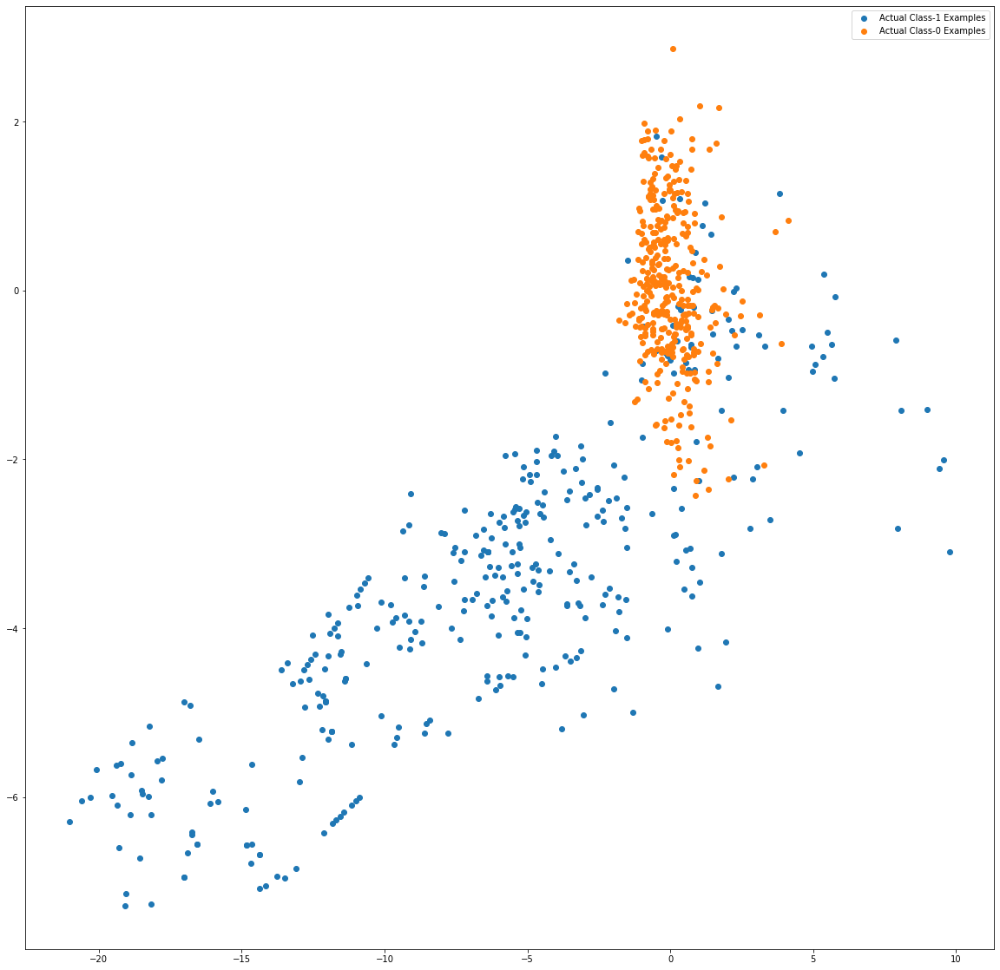

In [22]:
var_imp = []
for i in clf.feature_importances_:
    var_imp.append(i)
print('Top var =', var_imp.index(np.sort(clf.feature_importances_)[-1])+1)
print('2nd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-2])+1)
print('3rd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-3])+1)

# Variable on Index-16 and Index-13 seems to be the top 2 variables
top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-1])
second_top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-2])

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]

np.random.shuffle(X_train_0)

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]

plt.scatter(X_train_1[:, top_var_index], X_train_1[:, second_top_var_index], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], top_var_index], X_train_0[:X_train_1.shape[0], second_top_var_index],
            label='Actual Class-0 Examples')
plt.legend()

## Model building with balancing Classes

##### Perform class balancing with :
- Random Oversampling
- SMOTE
- ADASYN

## Model Building

### Random Oversampling

In [32]:
from imblearn import over_sampling
import warnings
warnings.filterwarnings("ignore")

In [19]:
# Random Oversampling Logistic Regression
import warnings
warnings.filterwarnings("ignore")

from imblearn import over_sampling #- import the packages
from sklearn import linear_model #import the package
from sklearn import metrics

num_C = [0.01,0.02] #--> list of values
cv_num = 0
roc = np.zeros((len(num_C),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    rand_samp = over_sampling.RandomOverSampler(random_state=0)
    X_train_cv,y_train_cv = rand_samp.fit_resample(X_train_cv,y_train_cv)
    for id,val in enumerate(num_C):
      clf = linear_model.LogisticRegression(C=val,n_jobs=-1, random_state= 0,max_iter=1000)
      clf.fit(X_train_cv,y_train_cv)
      roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv,y_score=clf.predict_proba(X_test_cv)[:,1])
    cv_num +=1
print("AUC score ", roc)

print("Best num_C ", num_C[np.argmax(np.mean(roc,axis=1))])
print("AUC score corresponding to Best num_C ", np.max(np.mean(roc,axis=1)))


AUC score  [[0.97829714 0.98315152 0.97411849]
 [0.97819048 0.98331834 0.97379462]]
Best num_C  0.01
AUC score corresponding to Best num_C  0.9785223829378878


In [ ]:
# Random Oversampling KNN

from sklearn import neighbors

neigh = 39
roc = np.zeros((len(range(1, neigh+1, 3)), no_of_split)) 
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    rand_samp = over_sampling.RandomOverSampler(random_state=0)
    X_train_cv,y_train_cv = rand_samp.fit_resample(X_train_cv,y_train_cv)
    for id, k in enumerate(range(1, neigh+1, 3)):
        clf = neighbors.KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
        clf.fit(X_train_cv, y_train_cv)
        roc[id, cv_num] = metrics.roc_auc_score(y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
        print('Neighbour =', k, '; auc =', roc[id, cv_num], "k_fold ",cv_num)
    cv_num += 1

print('Optimal k:', 2*np.argmax(np.mean(roc,axis=1))+1)
print('Best auc score corresponding to Best neighbour:', np.max(np.mean(roc,axis=1)))

#Neighbour = 1 ; auc = 0.8860944486708194 k_fold  0
#Neighbour = 4 ; auc = 0.9104169790695502 k_fold  0
#Neighbour = 7 ; auc = 0.9266180639268091 k_fold  0
#Neighbour = 10 ; auc = 0.9306407836373979 k_fold  0
#Neighbour = 13 ; auc = 0.9346617876342103 k_fold  0
#Neighbour = 16 ; auc = 0.9386835351069924 k_fold  0
#Neighbour = 19 ; auc = 0.9426949882971164 k_fold  0
#Neighbour = 22 ; auc = 0.9426709683042469 k_fold  0
#Neighbour = 25 ; auc = 0.9426501509770933 k_fold  0
#Neighbour = 28 ; auc = 0.9466682382604859 k_fold  0
#Neighbour = 31 ; auc = 0.9466370122697555 k_fold  0
#Neighbour = 34 ; auc = 0.9466124775627531 k_fold  0
#Neighbour = 37 ; auc = 0.9465968645673879 k_fold  0
#Neighbour = 1 ; auc = 0.8942174955451493 k_fold  1
#Neighbour = 4 ; auc = 0.9429124264230445 k_fold  1
#Neighbour = 7 ; auc = 0.9469504159862432 k_fold  1
#Neighbour = 10 ; auc = 0.9469258812792407 k_fold  1
#Neighbour = 13 ; auc = 0.9509494588467177 k_fold  1
#Neighbour = 16 ; auc = 0.9509240662828272 k_fold  1
#Neighbour = 19 ; auc = 0.9508993600044471 k_fold  1
#Neighbour = 22 ; auc = 0.9508773988681093 k_fold  1
#Neighbour = 25 ; auc = 0.9508609280158559 k_fold  1
#Neighbour = 28 ; auc = 0.9508362217374758 k_fold  1
#Neighbour = 31 ; auc = 0.9508142606011379 k_fold  1
#Neighbour = 34 ; auc = 0.9507874954662262 k_fold  1
#Neighbour = 37 ; auc = 0.9507655343298885 k_fold  1
#Neighbour = 1 ; auc = 0.8820223723073495 k_fold  2
#Neighbour = 4 ; auc = 0.9063507924535897 k_fold  2
#Neighbour = 7 ; auc = 0.9062942302936633 k_fold  2
#Neighbour = 10 ; auc = 0.9103115734300369 k_fold  2
#Neighbour = 13 ; auc = 0.9102813764427355 k_fold  2
#Neighbour = 16 ; auc = 0.9143076414162661 k_fold  2
#Neighbour = 19 ; auc = 0.9142692088869733 k_fold  2
#Neighbour = 22 ; auc = 0.9142343794073017 k_fold  2
#Neighbour = 25 ; auc = 0.9141971478945493 k_fold  2
#Neighbour = 28 ; auc = 0.9141731275637413 k_fold  2
#Neighbour = 31 ; auc = 0.9222467610871556 k_fold  2
#Neighbour = 34 ; auc = 0.9222272016749263 k_fold  2
#Neighbour = 37 ; auc = 0.9222043823606587 k_fold  2
#Optimal k: 21
#Best auc score corresponding to Best neighbour: 0.939899344652683

In [37]:
# Random Oversampling Decision Tree

from sklearn import tree

no_depth = range(2, 5)
no_min_samp_leaf = [80,90]
no_min_samp_split = [31,50]
roc = np.zeros((len(no_depth)*len(no_min_samp_leaf)*len(no_min_samp_split), no_of_split))
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx], X_train.iloc[test_idx]
    y_train_cv, y_test_cv = y_train.iloc[train_idx], y_train.iloc[test_idx]
    rand_samp = over_sampling.RandomOverSampler(random_state=0)
    X_train_cv, y_train_cv = rand_samp.fit_resample(X_train_cv,y_train_cv)
    for dep_id, depth in enumerate(no_depth):
        for leaf_id, samp_leaf in enumerate(no_min_samp_leaf):
            for split_id, samp_split in enumerate(no_min_samp_split):
                clf = tree.DecisionTreeClassifier(criterion='entropy', max_depth=depth,
                        min_samples_leaf=samp_leaf, min_samples_split=samp_split, random_state=0)
                clf.fit(X_train_cv, y_train_cv)
                id = dep_id*len(no_min_samp_leaf)*len(no_min_samp_split)+\
                      leaf_id*len(no_min_samp_split)+split_id
                roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv,y_score=clf.predict_proba(X_test_cv)[:,1])
                print("Depth - ", depth, "; min_sample_leaf  ", samp_leaf, "; min_sample_split  ", samp_split,"roc ",
                      roc[id,cv_num], "cv_num ", cv_num)
    cv_num += 1
depth_id = np.argmax(np.mean(roc, axis=1))//(len(no_min_samp_leaf)*len(no_min_samp_split))
min_samples_leaf_id = (np.argmax(np.mean(roc, axis=1)) - depth_id*len(no_min_samp_leaf)*len(no_min_samp_split))//len(
                       no_min_samp_split)
min_samples_split_id = (np.argmax(np.mean(roc, axis=1)) - depth_id*len(no_min_samp_leaf)*len(no_min_samp_split))%len(
                       no_min_samp_split)
print('Optimal depth:', no_depth[depth_id])
print('Optimal minimum samples leaf:', no_min_samp_leaf[leaf_id])
print('Optimal minimum samples split:', no_min_samp_leaf[split_id])
print('Optimal auc corresponding to optimal depth,minimum samples leaf,minimum samples split ', np.max(np.mean(roc, axis=1)))

Depth -  2 ; min_sample_leaf   80 ; min_sample_split   31 roc  0.9641605693058577 cv_num  0
Depth -  2 ; min_sample_leaf   80 ; min_sample_split   50 roc  0.9641605693058577 cv_num  0
Depth -  2 ; min_sample_leaf   90 ; min_sample_split   31 roc  0.9641605693058577 cv_num  0
Depth -  2 ; min_sample_leaf   90 ; min_sample_split   50 roc  0.9641605693058577 cv_num  0
Depth -  3 ; min_sample_leaf   80 ; min_sample_split   31 roc  0.963449920659676 cv_num  0
Depth -  3 ; min_sample_leaf   80 ; min_sample_split   50 roc  0.963449920659676 cv_num  0
Depth -  3 ; min_sample_leaf   90 ; min_sample_split   31 roc  0.963449920659676 cv_num  0
Depth -  3 ; min_sample_leaf   90 ; min_sample_split   50 roc  0.963449920659676 cv_num  0
Depth -  4 ; min_sample_leaf   80 ; min_sample_split   31 roc  0.9391412875425339 cv_num  0
Depth -  4 ; min_sample_leaf   80 ; min_sample_split   50 roc  0.9391412875425339 cv_num  0
Depth -  4 ; min_sample_leaf   90 ; min_sample_split   31 roc  0.9391412875425339 cv

In [ ]:
#Random Oversampling Random Forest

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from imblearn import over_sampling

cv_num=0
no_trees = range(550,900,1)
roc = np.zeros((len(no_trees),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train,y_train):
  X_train_cv, X_test_cv = X_train.iloc[train_idx],X_train.iloc[test_idx]
  y_train_cv, y_test_cv = y_train.iloc[train_idx],y_train.iloc[test_idx]
  rand_samp = over_sampling.RandomOverSampler(random_state=0)
  X_train_cv,y_train_cv = rand_samp.fit_resample(X_train_cv,y_train_cv)
  clf = RandomForestClassifier(criterion='entropy',min_samples_leaf=30,n_jobs=-1,warm_start=True)
  for id, tree in enumerate(no_trees):
    clf.set_params(n_estimators=tree)
    clf.fit(X_train_cv,y_train_cv)
    roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
    print('tree_no =', tree, '; auc =', roc[id, cv_num], '; cv_num =', cv_num)
  cv_num += 1

print('Optimal num_trees ', no_trees[np.argmax(np.mean(roc,axis=1))])
print('Best auc corresponding to Best num_trees :', np.max(np.mean(roc,axis=1)))

#tree_no = 550 ; auc = 0.9859185651325556 ; cv_num = 0
#tree_no = 551 ; auc = 0.985911473515613 ; cv_num = 0
#tree_no = 552 ; auc = 0.9859044962795891 ; cv_num = 0
#tree_no = 553 ; auc = 0.9858979765672389 ; cv_num = 0
#tree_no = 554 ; auc = 0.9858885973319279 ; cv_num = 0
#tree_no = 555 ; auc = 0.9858824207623329 ; cv_num = 0
#tree_no = 556 ; auc = 0.9858680087666112 ; cv_num = 0
#tree_no = 557 ; auc = 0.9858638910535478 ; cv_num = 0
#tree_no = 558 ; auc = 0.9858677800047742 ; cv_num = 0
#tree_no = 559 ; auc = 0.9858576001030344 ; cv_num = 0
#tree_no = 560 ; auc = 0.9858483352486418 ; cv_num = 0
#tree_no = 561 ; auc = 0.985852910485379 ; cv_num = 0
#tree_no = 562 ; auc = 0.9858487927723156 ; cv_num = 0
#tree_no = 563 ; auc = 0.9858396422988415 ; cv_num = 0
#tree_no = 564 ; auc = 0.9858310637299594 ; cv_num = 0
#tree_no = 565 ; auc = 0.9858285473497541 ; cv_num = 0
#tree_no = 566 ; auc = 0.9858309493490411 ; cv_num = 0
#tree_no = 567 ; auc = 0.9858238577320988 ; cv_num = 0
#tree_no = 568 ; auc = 0.9858175667815854 ; cv_num = 0
#tree_no = 569 ; auc = 0.9858514235334392 ; cv_num = 0
#tree_no = 570 ; auc = 0.9858519954380315 ; cv_num = 0
#tree_no = 571 ; auc = 0.9858442175355786 ; cv_num = 0
#tree_no = 572 ; auc = 0.9858383841087388 ; cv_num = 0
#tree_no = 573 ; auc = 0.9858333513483281 ; cv_num = 0
#tree_no = 574 ; auc = 0.985828776111591 ; cv_num = 0
#tree_no = 575 ; auc = 0.9858211125900564 ; cv_num = 0
#tree_no = 576 ; auc = 0.9858127627830116 ; cv_num = 0
#tree_no = 577 ; auc = 0.9858065862134162 ; cv_num = 0
#tree_no = 578 ; auc = 0.9858101320218875 ; cv_num = 0
#tree_no = 579 ; auc = 0.9858044129759661 ; cv_num = 0
#tree_no = 580 ; auc = 0.9857986939300449 ; cv_num = 0
#tree_no = 581 ; auc = 0.9857950337406554 ; cv_num = 0
#tree_no = 582 ; auc = 0.9857956056452474 ; cv_num = 0
#tree_no = 583 ; auc = 0.9857948049788184 ; cv_num = 0
#tree_no = 584 ; auc = 0.9857958344070843 ; cv_num = 0
#tree_no = 585 ; auc = 0.9857964063116764 ; cv_num = 0
#tree_no = 586 ; auc = 0.9857956056452473 ; cv_num = 0
#tree_no = 587 ; auc = 0.9857893146947341 ; cv_num = 0
#tree_no = 588 ; auc = 0.9857832525060574 ; cv_num = 0
#tree_no = 589 ; auc = 0.9857757033654413 ; cv_num = 0
#tree_no = 590 ; auc = 0.985772615080644 ; cv_num = 0
#tree_no = 591 ; auc = 0.9857674679393147 ; cv_num = 0
#tree_no = 592 ; auc = 0.985760376322372 ; cv_num = 0
#tree_no = 593 ; auc = 0.985754428514614 ; cv_num = 0
#tree_no = 594 ; auc = 0.9857472225167532 ; cv_num = 0
#tree_no = 595 ; auc = 0.9857375001386869 ; cv_num = 0
#tree_no = 596 ; auc = 0.9857277777606208 ; cv_num = 0
#tree_no = 597 ; auc = 0.9857424185181792 ; cv_num = 0
#tree_no = 598 ; auc = 0.9857411603280766 ; cv_num = 0
#tree_no = 599 ; auc = 0.9857318954736838 ; cv_num = 0
#tree_no = 600 ; auc = 0.9857224018574545 ; cv_num = 0
#tree_no = 601 ; auc = 0.9857135945267357 ; cv_num = 0
#tree_no = 602 ; auc = 0.9857061597670381 ; cv_num = 0
#tree_no = 603 ; auc = 0.9858143641158692 ; cv_num = 0
#tree_no = 604 ; auc = 0.9858097888791323 ; cv_num = 0
#tree_no = 605 ; auc = 0.9858045273568847 ; cv_num = 0
#tree_no = 606 ; auc = 0.9857973213590238 ; cv_num = 0
#tree_no = 607 ; auc = 0.9857908016466735 ; cv_num = 0
#tree_no = 608 ; auc = 0.9857956056452473 ; cv_num = 0
#tree_no = 609 ; auc = 0.9858193968762801 ; cv_num = 0
#tree_no = 610 ; auc = 0.985812419640256 ; cv_num = 0
#tree_no = 611 ; auc = 0.9858060143088241 ; cv_num = 0
#tree_no = 612 ; auc = 0.985802239738516 ; cv_num = 0
#tree_no = 613 ; auc = 0.9857965206925948 ; cv_num = 0
#tree_no = 614 ; auc = 0.9857892003138156 ; cv_num = 0
#tree_no = 615 ; auc = 0.9857816511731995 ; cv_num = 0
#tree_no = 616 ; auc = 0.9857755889845227 ; cv_num = 0
#tree_no = 617 ; auc = 0.9857694124149278 ; cv_num = 0
#tree_no = 618 ; auc = 0.9857651803209461 ; cv_num = 0
#tree_no = 619 ; auc = 0.985763235845333 ; cv_num = 0
#tree_no = 620 ; auc = 0.9857587749895144 ; cv_num = 0
#tree_no = 621 ; auc = 0.9857601475605354 ; cv_num = 0
#tree_no = 622 ; auc = 0.9858270603978146 ; cv_num = 0
#tree_no = 623 ; auc = 0.9858236289702618 ; cv_num = 0
#tree_no = 624 ; auc = 0.9858147072586245 ; cv_num = 0
#tree_no = 625 ; auc = 0.9859115878965317 ; cv_num = 0
#tree_no = 626 ; auc = 0.9859083852308157 ; cv_num = 0
#tree_no = 627 ; auc = 0.9859032380894864 ; cv_num = 0
#tree_no = 628 ; auc = 0.9858969471389731 ; cv_num = 0
#tree_no = 629 ; auc = 0.9858920287594807 ; cv_num = 0
#tree_no = 630 ; auc = 0.9858864240944777 ; cv_num = 0
#tree_no = 631 ; auc = 0.9858817344768223 ; cv_num = 0
#tree_no = 632 ; auc = 0.9858726983842665 ; cv_num = 0
#tree_no = 633 ; auc = 0.9858691525757954 ; cv_num = 0
#tree_no = 634 ; auc = 0.98586228972069 ; cv_num = 0
#tree_no = 635 ; auc = 0.9859400687452198 ; cv_num = 0
#tree_no = 636 ; auc = 0.9859343496992984 ; cv_num = 0
#tree_no = 637 ; auc = 0.9859239410357217 ; cv_num = 0
#tree_no = 638 ; auc = 0.9859192514180661 ; cv_num = 0
#tree_no = 639 ; auc = 0.985920852750924 ; cv_num = 0
#tree_no = 640 ; auc = 0.9859157056095949 ; cv_num = 0
#tree_no = 641 ; auc = 0.9859093002781627 ; cv_num = 0
#tree_no = 642 ; auc = 0.9859056400887733 ; cv_num = 0
#tree_no = 643 ; auc = 0.9858979765672388 ; cv_num = 0
#tree_no = 644 ; auc = 0.985896146472544 ; cv_num = 0
#tree_no = 645 ; auc = 0.9858922575213174 ; cv_num = 0
#tree_no = 646 ; auc = 0.9858826495241697 ; cv_num = 0
#tree_no = 647 ; auc = 0.985877388001922 ; cv_num = 0
#tree_no = 648 ; auc = 0.985869038194877 ; cv_num = 0
#tree_no = 649 ; auc = 0.9858724696224299 ; cv_num = 0
#tree_no = 650 ; auc = 0.9858675512429376 ; cv_num = 0
#tree_no = 651 ; auc = 0.9858564562938502 ; cv_num = 0
#tree_no = 652 ; auc = 0.9858525673426236 ; cv_num = 0
#tree_no = 653 ; auc = 0.9858490215341524 ; cv_num = 0
#tree_no = 654 ; auc = 0.9858421586790468 ; cv_num = 0
#tree_no = 655 ; auc = 0.9858360964903703 ; cv_num = 0
#tree_no = 656 ; auc = 0.9858315212536333 ; cv_num = 0
#tree_no = 657 ; auc = 0.9858253446840382 ; cv_num = 0
#tree_no = 658 ; auc = 0.9858228283038329 ; cv_num = 0
#tree_no = 659 ; auc = 0.9858179099243405 ; cv_num = 0
#tree_no = 660 ; auc = 0.9858153935441352 ; cv_num = 0
#tree_no = 661 ; auc = 0.9858097888791322 ; cv_num = 0
#tree_no = 662 ; auc = 0.9858041842141294 ; cv_num = 0
#tree_no = 663 ; auc = 0.9857936611696343 ; cv_num = 0
#tree_no = 664 ; auc = 0.9857853113625891 ; cv_num = 0
#tree_no = 665 ; auc = 0.9857811936495258 ; cv_num = 0
#tree_no = 666 ; auc = 0.9857811936495258 ; cv_num = 0
#tree_no = 667 ; auc = 0.9857750170799306 ; cv_num = 0
#tree_no = 668 ; auc = 0.9857696411767647 ; cv_num = 0
#tree_no = 669 ; auc = 0.985764379654517 ; cv_num = 0
#tree_no = 670 ; auc = 0.9857567161329825 ; cv_num = 0
#tree_no = 671 ; auc = 0.9857533990863481 ; cv_num = 0
#tree_no = 672 ; auc = 0.9857492813732849 ; cv_num = 0
#tree_no = 673 ; auc = 0.98574310480369 ; cv_num = 0
#tree_no = 674 ; auc = 0.9857369282340946 ; cv_num = 0
#tree_no = 675 ; auc = 0.9857314379500104 ; cv_num = 0
#tree_no = 676 ; auc = 0.9857475656595083 ; cv_num = 0
#tree_no = 677 ; auc = 0.9857391014715449 ; cv_num = 0
#tree_no = 678 ; auc = 0.9857315523309288 ; cv_num = 0
#tree_no = 679 ; auc = 0.9857248038567415 ; cv_num = 0
#tree_no = 680 ; auc = 0.9857162252878597 ; cv_num = 0
#tree_no = 681 ; auc = 0.9857143951931647 ; cv_num = 0
#tree_no = 682 ; auc = 0.9857105062419381 ; cv_num = 0
#tree_no = 683 ; auc = 0.9857050159578539 ; cv_num = 0
#tree_no = 684 ; auc = 0.9856997544356062 ; cv_num = 0
#tree_no = 685 ; auc = 0.9856908327239691 ; cv_num = 0
#tree_no = 686 ; auc = 0.9856836267261082 ; cv_num = 0
#tree_no = 687 ; auc = 0.9856895745338664 ; cv_num = 0
#tree_no = 688 ; auc = 0.9856829404405976 ; cv_num = 0
#tree_no = 689 ; auc = 0.9856795090130448 ; cv_num = 0
#tree_no = 690 ; auc = 0.9856719598724287 ; cv_num = 0
#tree_no = 691 ; auc = 0.9856678421593652 ; cv_num = 0
#tree_no = 692 ; auc = 0.9856618943516071 ; cv_num = 0
#tree_no = 693 ; auc = 0.985655946543849 ; cv_num = 0
#tree_no = 694 ; auc = 0.9856499987360908 ; cv_num = 0
#tree_no = 695 ; auc = 0.9856454234993539 ; cv_num = 0
#tree_no = 696 ; auc = 0.9856426783573118 ; cv_num = 0
#tree_no = 697 ; auc = 0.9856377599778194 ; cv_num = 0
#tree_no = 698 ; auc = 0.9856337566456742 ; cv_num = 0
#tree_no = 699 ; auc = 0.9856286095043452 ; cv_num = 0
#tree_no = 700 ; auc = 0.9856230048393424 ; cv_num = 0
#tree_no = 701 ; auc = 0.9856209459828107 ; cv_num = 0
#tree_no = 702 ; auc = 0.9856156844605628 ; cv_num = 0
#tree_no = 703 ; auc = 0.985617285793421 ; cv_num = 0
#tree_no = 704 ; auc = 0.9856101941764787 ; cv_num = 0
#tree_no = 705 ; auc = 0.9856035600832098 ; cv_num = 0
#tree_no = 706 ; auc = 0.9855996711319832 ; cv_num = 0
#tree_no = 707 ; auc = 0.985603331321373 ; cv_num = 0
#tree_no = 708 ; auc = 0.9855952102761649 ; cv_num = 0
#tree_no = 709 ; auc = 0.9855898343729987 ; cv_num = 0
#tree_no = 710 ; auc = 0.985584000946159 ; cv_num = 0
#tree_no = 711 ; auc = 0.9855809126613614 ; cv_num = 0
#tree_no = 712 ; auc = 0.9855749648536034 ; cv_num = 0
#tree_no = 713 ; auc = 0.9855661575228846 ; cv_num = 0
#tree_no = 714 ; auc = 0.9885774067718307 ; cv_num = 0
#tree_no = 715 ; auc = 0.9885725455827977 ; cv_num = 0
#tree_no = 716 ; auc = 0.9885653395849368 ; cv_num = 0
#tree_no = 717 ; auc = 0.9885601924436075 ; cv_num = 0
#tree_no = 718 ; auc = 0.988553615540798 ; cv_num = 0
#tree_no = 719 ; auc = 0.9885488687326833 ; cv_num = 0
#tree_no = 720 ; auc = 0.9885421774489555 ; cv_num = 0
#tree_no = 721 ; auc = 0.9885343423560433 ; cv_num = 0
#tree_no = 722 ; auc = 0.9885254778348653 ; cv_num = 0
#tree_no = 723 ; auc = 0.9885205022649136 ; cv_num = 0
#tree_no = 724 ; auc = 0.9885152407426663 ; cv_num = 0
#tree_no = 725 ; auc = 0.9885092357444486 ; cv_num = 0
#tree_no = 726 ; auc = 0.9885105511250105 ; cv_num = 0
#tree_no = 727 ; auc = 0.9885058615073552 ; cv_num = 0
#tree_no = 728 ; auc = 0.9885028304130169 ; cv_num = 0
#tree_no = 729 ; auc = 0.9885024872702616 ; cv_num = 0
#tree_no = 730 ; auc = 0.9885111230296026 ; cv_num = 0
#tree_no = 731 ; auc = 0.9885065477928655 ; cv_num = 0
#tree_no = 732 ; auc = 0.9884979120335244 ; cv_num = 0
#tree_no = 733 ; auc = 0.9884930508444913 ; cv_num = 0
#tree_no = 734 ; auc = 0.9884889331314279 ; cv_num = 0
#tree_no = 735 ; auc = 0.988481898704945 ; cv_num = 0
#tree_no = 736 ; auc = 0.9884724622791746 ; cv_num = 0
#tree_no = 737 ; auc = 0.9884884184172953 ; cv_num = 0
#tree_no = 738 ; auc = 0.9884851585611201 ; cv_num = 0
#tree_no = 739 ; auc = 0.9884851585611201 ; cv_num = 0
#tree_no = 740 ; auc = 0.9884776094205038 ; cv_num = 0
#tree_no = 741 ; auc = 0.9884708037558575 ; cv_num = 0
#tree_no = 742 ; auc = 0.9884683445661115 ; cv_num = 0
#tree_no = 743 ; auc = 0.9884724050887155 ; cv_num = 0
#tree_no = 744 ; auc = 0.9884677726615194 ; cv_num = 0
#tree_no = 745 ; auc = 0.9884624539488124 ; cv_num = 0
#tree_no = 746 ; auc = 0.9884565633315135 ; cv_num = 0
#tree_no = 747 ; auc = 0.9884479847626315 ; cv_num = 0
#tree_no = 748 ; auc = 0.9884422085262512 ; cv_num = 0
#tree_no = 749 ; auc = 0.988436546670789 ; cv_num = 0
#tree_no = 750 ; auc = 0.9884279681019068 ; cv_num = 0
#tree_no = 751 ; auc = 0.9884224206273633 ; cv_num = 0
#tree_no = 752 ; auc = 0.9884176166287895 ; cv_num = 0
#tree_no = 753 ; auc = 0.9884124122970009 ; cv_num = 0
#tree_no = 754 ; auc = 0.98841321296343 ; cv_num = 0
#tree_no = 755 ; auc = 0.9884066932510795 ; cv_num = 0
#tree_no = 756 ; auc = 0.9884127554397563 ; cv_num = 0
#tree_no = 757 ; auc = 0.9884063501083244 ; cv_num = 0
#tree_no = 758 ; auc = 0.988399315681841 ; cv_num = 0
#tree_no = 759 ; auc = 0.9883953123496962 ; cv_num = 0
#tree_no = 760 ; auc = 0.9883854184002523 ; cv_num = 0
#tree_no = 761 ; auc = 0.988378098021473 ; cv_num = 0
#tree_no = 762 ; auc = 0.9883730652610624 ; cv_num = 0
#tree_no = 763 ; auc = 0.9883660308345792 ; cv_num = 0
#tree_no = 764 ; auc = 0.9883916521603064 ; cv_num = 0
#tree_no = 765 ; auc = 0.9883866193998959 ; cv_num = 0
#tree_no = 766 ; auc = 0.9883825588772917 ; cv_num = 0
#tree_no = 767 ; auc = 0.9883763823076969 ; cv_num = 0
#tree_no = 768 ; auc = 0.9883700913571835 ; cv_num = 0
#tree_no = 769 ; auc = 0.9883644295017213 ; cv_num = 0
#tree_no = 770 ; auc = 0.9883639719780474 ; cv_num = 0
#tree_no = 771 ; auc = 0.9883576810275341 ; cv_num = 0
#tree_no = 772 ; auc = 0.9883506466010509 ; cv_num = 0
#tree_no = 773 ; auc = 0.9883486449349785 ; cv_num = 0
#tree_no = 774 ; auc = 0.9883524766957457 ; cv_num = 0
#tree_no = 775 ; auc = 0.9883457854120178 ; cv_num = 0
#tree_no = 776 ; auc = 0.9883377215572686 ; cv_num = 0
#tree_no = 777 ; auc = 0.9883328031777764 ; cv_num = 0
#tree_no = 778 ; auc = 0.9883488736968155 ; cv_num = 0
#tree_no = 779 ; auc = 0.98834269712722 ; cv_num = 0
#tree_no = 780 ; auc = 0.9883385222236977 ; cv_num = 0
#tree_no = 781 ; auc = 0.9883317737495105 ; cv_num = 0
#tree_no = 782 ; auc = 0.988334862034308 ; cv_num = 0
#tree_no = 783 ; auc = 0.9883281707505802 ; cv_num = 0
#tree_no = 784 ; auc = 0.9883215938477706 ; cv_num = 0
#tree_no = 785 ; auc = 0.9883172473728704 ; cv_num = 0
#tree_no = 786 ; auc = 0.9883112423746532 ; cv_num = 0
#tree_no = 787 ; auc = 0.9883017487584238 ; cv_num = 0
#tree_no = 788 ; auc = 0.9882941424273484 ; cv_num = 0
#tree_no = 789 ; auc = 0.9882893384287742 ; cv_num = 0
#tree_no = 790 ; auc = 0.9882835050019345 ; cv_num = 0
#tree_no = 791 ; auc = 0.9882786438129014 ; cv_num = 0
#tree_no = 792 ; auc = 0.9882686926729984 ; cv_num = 0
#tree_no = 793 ; auc = 0.9914570607741279 ; cv_num = 0
#tree_no = 794 ; auc = 0.9914515704900433 ; cv_num = 0
#tree_no = 795 ; auc = 0.9914482534434088 ; cv_num = 0
#tree_no = 796 ; auc = 0.9915160813280357 ; cv_num = 0
#tree_no = 797 ; auc = 0.9915165388517095 ; cv_num = 0
#tree_no = 798 ; auc = 0.9915102479011959 ; cv_num = 0
#tree_no = 799 ; auc = 0.9915091040920117 ; cv_num = 0
#tree_no = 800 ; auc = 0.9915046432361933 ; cv_num = 0
#tree_no = 801 ; auc = 0.9914996104757823 ; cv_num = 0
#tree_no = 802 ; auc = 0.9914942345726163 ; cv_num = 0
#tree_no = 803 ; auc = 0.9915099047584408 ; cv_num = 0
#tree_no = 804 ; auc = 0.9915061301881325 ; cv_num = 0
#tree_no = 805 ; auc = 0.9914990385711901 ; cv_num = 0
#tree_no = 806 ; auc = 0.9914933195252689 ; cv_num = 0
#tree_no = 807 ; auc = 0.9914914894305741 ; cv_num = 0
#tree_no = 808 ; auc = 0.9914825677189367 ; cv_num = 0
#tree_no = 809 ; auc = 0.9914857703846527 ; cv_num = 0
#tree_no = 810 ; auc = 0.9914792506723025 ; cv_num = 0
#tree_no = 811 ; auc = 0.991475590482913 ; cv_num = 0
#tree_no = 812 ; auc = 0.991469185151481 ; cv_num = 0
#tree_no = 813 ; auc = 0.9914646099147439 ; cv_num = 0
#tree_no = 814 ; auc = 0.9914660968666834 ; cv_num = 0
#tree_no = 815 ; auc = 0.9914615216299464 ; cv_num = 0
#tree_no = 816 ; auc = 0.9914634661055596 ; cv_num = 0
#tree_no = 817 ; auc = 0.991459577154333 ; cv_num = 0
#tree_no = 818 ; auc = 0.9914543156320854 ; cv_num = 0
#tree_no = 819 ; auc = 0.991446080205959 ; cv_num = 0
#tree_no = 820 ; auc = 0.9924064223970649 ; cv_num = 0
#tree_no = 821 ; auc = 0.992399216399204 ; cv_num = 0
#tree_no = 822 ; auc = 0.992394069257875 ; cv_num = 0
#tree_no = 823 ; auc = 0.9923884645928722 ; cv_num = 0
#tree_no = 824 ; auc = 0.9923893796402194 ; cv_num = 0
#tree_no = 825 ; auc = 0.9923846900225639 ; cv_num = 0
#tree_no = 826 ; auc = 0.992433301912895 ; cv_num = 0
#tree_no = 827 ; auc = 0.992433073151058 ; cv_num = 0
#tree_no = 828 ; auc = 0.9924276972478921 ; cv_num = 0
#tree_no = 829 ; auc = 0.9924250664867684 ; cv_num = 0
#tree_no = 830 ; auc = 0.9924201481072762 ; cv_num = 0
#tree_no = 831 ; auc = 0.9924188899171733 ; cv_num = 0
#tree_no = 832 ; auc = 0.9924084812535966 ; cv_num = 0
#tree_no = 833 ; auc = 0.9924343313411608 ; cv_num = 0
#tree_no = 834 ; auc = 0.9924287266761579 ; cv_num = 0
#tree_no = 835 ; auc = 0.9924202624881944 ; cv_num = 0
#tree_no = 836 ; auc = 0.9924116839193124 ; cv_num = 0
#tree_no = 837 ; auc = 0.9924059648733912 ; cv_num = 0
#tree_no = 838 ; auc = 0.992412942109415 ; cv_num = 0
#tree_no = 839 ; auc = 0.9924071086825754 ; cv_num = 0
#tree_no = 840 ; auc = 0.9924047066832886 ; cv_num = 0
#tree_no = 841 ; auc = 0.9924023046840016 ; cv_num = 0
#tree_no = 842 ; auc = 0.9923957849716512 ; cv_num = 0
#tree_no = 843 ; auc = 0.992390866592159 ; cv_num = 0
#tree_no = 844 ; auc = 0.9923867488790956 ; cv_num = 0
#tree_no = 845 ; auc = 0.9923829743087875 ; cv_num = 0
#tree_no = 846 ; auc = 0.9923758826918451 ; cv_num = 0
#tree_no = 847 ; auc = 0.992370506788679 ; cv_num = 0
#tree_no = 848 ; auc = 0.9923732519307213 ; cv_num = 0
#tree_no = 849 ; auc = 0.9923751964063345 ; cv_num = 0
#tree_no = 850 ; auc = 0.9923722225024555 ; cv_num = 0
#tree_no = 851 ; auc = 0.9923613563152048 ; cv_num = 0
#tree_no = 852 ; auc = 0.9923543790791809 ; cv_num = 0
#tree_no = 853 ; auc = 0.9923487744141781 ; cv_num = 0
#tree_no = 854 ; auc = 0.9923416827972356 ; cv_num = 0
#tree_no = 855 ; auc = 0.9923351630848853 ; cv_num = 0
#tree_no = 856 ; auc = 0.9923315028954958 ; cv_num = 0
#tree_no = 857 ; auc = 0.9923244112785533 ; cv_num = 0
#tree_no = 858 ; auc = 0.9923192641372243 ; cv_num = 0
#tree_no = 859 ; auc = 0.9923121725202819 ; cv_num = 0
#tree_no = 860 ; auc = 0.9923079404263001 ; cv_num = 0
#tree_no = 861 ; auc = 0.9923055384270131 ; cv_num = 0
#tree_no = 862 ; auc = 0.9922974173818048 ; cv_num = 0
#tree_no = 863 ; auc = 0.9922930709069044 ; cv_num = 0
#tree_no = 864 ; auc = 0.9922896394793518 ; cv_num = 0
#tree_no = 865 ; auc = 0.9922866655754727 ; cv_num = 0
#tree_no = 866 ; auc = 0.9922831197670017 ; cv_num = 0
#tree_no = 867 ; auc = 0.9922783157684276 ; cv_num = 0
#tree_no = 868 ; auc = 0.992287809384657 ; cv_num = 0
#tree_no = 869 ; auc = 0.9922820903387357 ; cv_num = 0
#tree_no = 870 ; auc = 0.9922786589111829 ; cv_num = 0
#tree_no = 871 ; auc = 0.9922695084377086 ; cv_num = 0
#tree_no = 872 ; auc = 0.9922607011069902 ; cv_num = 0
#tree_no = 873 ; auc = 0.9922786589111829 ; cv_num = 0
#tree_no = 874 ; auc = 0.9922755706263855 ; cv_num = 0
#tree_no = 875 ; auc = 0.9922683646285245 ; cv_num = 0
#tree_no = 876 ; auc = 0.9922636750108691 ; cv_num = 0
#tree_no = 877 ; auc = 0.9922649332009719 ; cv_num = 0
#tree_no = 878 ; auc = 0.9922589853932138 ; cv_num = 0
#tree_no = 879 ; auc = 0.9922485767296368 ; cv_num = 0
#tree_no = 880 ; auc = 0.9922453740639209 ; cv_num = 0
#tree_no = 881 ; auc = 0.99224034130351 ; cv_num = 0
#tree_no = 882 ; auc = 0.9922339359720782 ; cv_num = 0
#tree_no = 883 ; auc = 0.9922286744498306 ; cv_num = 0
#tree_no = 884 ; auc = 0.9922232985466646 ; cv_num = 0
#tree_no = 885 ; auc = 0.9922216972138065 ; cv_num = 0
#tree_no = 886 ; auc = 0.9922122035975773 ; cv_num = 0
#tree_no = 887 ; auc = 0.9922052263615535 ; cv_num = 0
#tree_no = 888 ; auc = 0.9921983635064477 ; cv_num = 0
#tree_no = 889 ; auc = 0.992193902650629 ; cv_num = 0
#tree_no = 890 ; auc = 0.9921908143658315 ; cv_num = 0
#tree_no = 891 ; auc = 0.992184980938992 ; cv_num = 0
#tree_no = 892 ; auc = 0.9921792618930705 ; cv_num = 0
#tree_no = 893 ; auc = 0.9921754873227626 ; cv_num = 0
#tree_no = 894 ; auc = 0.9921695395150045 ; cv_num = 0
#tree_no = 895 ; auc = 0.9921711408478623 ; cv_num = 0
#tree_no = 896 ; auc = 0.9921699970386779 ; cv_num = 0
#tree_no = 897 ; auc = 0.9921627910408171 ; cv_num = 0
#tree_no = 898 ; auc = 0.9921589020895907 ; cv_num = 0
#tree_no = 899 ; auc = 0.992153640567343 ; cv_num = 0
#tree_no = 550 ; auc = 0.9907742638815827 ; cv_num = 1
#tree_no = 551 ; auc = 0.990768430454743 ; cv_num = 1
#tree_no = 552 ; auc = 0.9907576214579519 ; cv_num = 1
#tree_no = 553 ; auc = 0.9907517308406528 ; cv_num = 1
#tree_no = 554 ; auc = 0.990744810795088 ; cv_num = 1
#tree_no = 555 ; auc = 0.9907414365579942 ; cv_num = 1
#tree_no = 556 ; auc = 0.9907376047972272 ; cv_num = 1
#tree_no = 557 ; auc = 0.9907312566562545 ; cv_num = 1
#tree_no = 558 ; auc = 0.9907238790870162 ; cv_num = 1
#tree_no = 559 ; auc = 0.990715529279971 ; cv_num = 1
#tree_no = 560 ; auc = 0.9907094099008352 ; cv_num = 1
#tree_no = 561 ; auc = 0.9907051778068534 ; cv_num = 1
#tree_no = 562 ; auc = 0.9906960273333792 ; cv_num = 1
#tree_no = 563 ; auc = 0.9906896220019473 ; cv_num = 1
#tree_no = 564 ; auc = 0.9906841889083221 ; cv_num = 1
#tree_no = 565 ; auc = 0.9906798996238813 ; cv_num = 1
#tree_no = 566 ; auc = 0.9906742949588784 ; cv_num = 1
#tree_no = 567 ; auc = 0.9906704060076517 ; cv_num = 1
#tree_no = 568 ; auc = 0.9906626281051988 ; cv_num = 1
#tree_no = 569 ; auc = 0.9906573665829511 ; cv_num = 1
#tree_no = 570 ; auc = 0.9906525053939182 ; cv_num = 1
#tree_no = 571 ; auc = 0.9906444415391691 ; cv_num = 1
#tree_no = 572 ; auc = 0.9906543926790722 ; cv_num = 1
#tree_no = 573 ; auc = 0.9906466719670783 ; cv_num = 1
#tree_no = 574 ; auc = 0.9906399234928912 ; cv_num = 1
#tree_no = 575 ; auc = 0.9906359773512055 ; cv_num = 1
#tree_no = 576 ; auc = 0.9906316880667646 ; cv_num = 1
#tree_no = 577 ; auc = 0.9906281994487525 ; cv_num = 1
#tree_no = 578 ; auc = 0.9906221372600761 ; cv_num = 1
#tree_no = 579 ; auc = 0.9906148740717559 ; cv_num = 1
#tree_no = 580 ; auc = 0.9906141877862453 ; cv_num = 1
#tree_no = 581 ; auc = 0.9906091550258347 ; cv_num = 1
#tree_no = 582 ; auc = 0.9906077824548135 ; cv_num = 1
#tree_no = 583 ; auc = 0.9906033215989949 ; cv_num = 1
#tree_no = 584 ; auc = 0.9906005764569527 ; cv_num = 1
#tree_no = 585 ; auc = 0.9905943426968984 ; cv_num = 1
#tree_no = 586 ; auc = 0.9905881089368442 ; cv_num = 1
#tree_no = 587 ; auc = 0.9905819895577084 ; cv_num = 1
#tree_no = 588 ; auc = 0.9905755842262766 ; cv_num = 1
#tree_no = 589 ; auc = 0.9905702083231105 ; cv_num = 1
#tree_no = 590 ; auc = 0.9905638601821379 ; cv_num = 1
#tree_no = 591 ; auc = 0.9905619728969838 ; cv_num = 1
#tree_no = 592 ; auc = 0.9905581983266758 ; cv_num = 1
#tree_no = 593 ; auc = 0.9905491622341202 ; cv_num = 1
#tree_no = 594 ; auc = 0.9905417274744225 ; cv_num = 1
#tree_no = 595 ; auc = 0.9905384104277879 ; cv_num = 1
#tree_no = 596 ; auc = 0.9905330917150812 ; cv_num = 1
#tree_no = 597 ; auc = 0.9905267435741085 ; cv_num = 1
#tree_no = 598 ; auc = 0.9905203382426767 ; cv_num = 1
#tree_no = 599 ; auc = 0.9905156486250213 ; cv_num = 1
#tree_no = 600 ; auc = 0.9905092432935891 ; cv_num = 1
#tree_no = 601 ; auc = 0.9905062121992511 ; cv_num = 1
#tree_no = 602 ; auc = 0.9904993493441454 ; cv_num = 1
#tree_no = 603 ; auc = 0.9904937446791425 ; cv_num = 1
#tree_no = 604 ; auc = 0.9904869390144961 ; cv_num = 1
#tree_no = 605 ; auc = 0.9904775597791852 ; cv_num = 1
#tree_no = 606 ; auc = 0.9904701250194875 ; cv_num = 1
#tree_no = 607 ; auc = 0.9904640056403515 ; cv_num = 1
#tree_no = 608 ; auc = 0.9904742427325508 ; cv_num = 1
#tree_no = 609 ; auc = 0.9904688096389256 ; cv_num = 1
#tree_no = 610 ; auc = 0.9904633193548413 ; cv_num = 1
#tree_no = 611 ; auc = 0.9904592016417777 ; cv_num = 1
#tree_no = 612 ; auc = 0.990463776878515 ; cv_num = 1
#tree_no = 613 ; auc = 0.9904575431184607 ; cv_num = 1
#tree_no = 614 ; auc = 0.9904511949774881 ; cv_num = 1
#tree_no = 615 ; auc = 0.990444446503301 ; cv_num = 1
#tree_no = 616 ; auc = 0.9904396996951863 ; cv_num = 1
#tree_no = 617 ; auc = 0.9904333515542136 ; cv_num = 1
#tree_no = 618 ; auc = 0.9904273465559962 ; cv_num = 1
#tree_no = 619 ; auc = 0.9904184248443589 ; cv_num = 1
#tree_no = 620 ; auc = 0.990412248274764 ; cv_num = 1
#tree_no = 621 ; auc = 0.9904084165139969 ; cv_num = 1
#tree_no = 622 ; auc = 0.9904051566578215 ; cv_num = 1
#tree_no = 623 ; auc = 0.9903988085168488 ; cv_num = 1
#tree_no = 624 ; auc = 0.9903890289483234 ; cv_num = 1
#tree_no = 625 ; auc = 0.990385139997097 ; cv_num = 1
#tree_no = 626 ; auc = 0.9903783343324506 ; cv_num = 1
#tree_no = 627 ; auc = 0.9903687835257622 ; cv_num = 1
#tree_no = 628 ; auc = 0.9903641510985659 ; cv_num = 1
#tree_no = 629 ; auc = 0.9903590611476959 ; cv_num = 1
#tree_no = 630 ; auc = 0.9903549434346323 ; cv_num = 1
#tree_no = 631 ; auc = 0.9903496247219254 ; cv_num = 1
#tree_no = 632 ; auc = 0.9903436769141676 ; cv_num = 1
#tree_no = 633 ; auc = 0.9903536280540707 ; cv_num = 1
#tree_no = 634 ; auc = 0.990345392627944 ; cv_num = 1
#tree_no = 635 ; auc = 0.9903427046763609 ; cv_num = 1
#tree_no = 636 ; auc = 0.9903387585346751 ; cv_num = 1
#tree_no = 637 ; auc = 0.9903318956795697 ; cv_num = 1
#tree_no = 638 ; auc = 0.9903275492046695 ; cv_num = 1
#tree_no = 639 ; auc = 0.9903205147781861 ; cv_num = 1
#tree_no = 640 ; auc = 0.9903269773000771 ; cv_num = 1
#tree_no = 641 ; auc = 0.9903208007304822 ; cv_num = 1
#tree_no = 642 ; auc = 0.9903151960654794 ; cv_num = 1
#tree_no = 643 ; auc = 0.9903099917336909 ; cv_num = 1
#tree_no = 644 ; auc = 0.990306274353842 ; cv_num = 1
#tree_no = 645 ; auc = 0.990297924546797 ; cv_num = 1
#tree_no = 646 ; auc = 0.9902920339294979 ; cv_num = 1
#tree_no = 647 ; auc = 0.9902849995030149 ; cv_num = 1
#tree_no = 648 ; auc = 0.9902787085525013 ; cv_num = 1
#tree_no = 649 ; auc = 0.9902681855080061 ; cv_num = 1
#tree_no = 650 ; auc = 0.9902758490295407 ; cv_num = 1
#tree_no = 651 ; auc = 0.9902731038874986 ; cv_num = 1
#tree_no = 652 ; auc = 0.9902781366479093 ; cv_num = 1
#tree_no = 653 ; auc = 0.9902717313164775 ; cv_num = 1
#tree_no = 654 ; auc = 0.9902645253186165 ; cv_num = 1
#tree_no = 655 ; auc = 0.9902676707938733 ; cv_num = 1
#tree_no = 656 ; auc = 0.9902616657956559 ; cv_num = 1
#tree_no = 657 ; auc = 0.9902548601310095 ; cv_num = 1
#tree_no = 658 ; auc = 0.9902487407518736 ; cv_num = 1
#tree_no = 659 ; auc = 0.9902490838946291 ; cv_num = 1
#tree_no = 660 ; auc = 0.990243707991463 ; cv_num = 1
#tree_no = 661 ; auc = 0.9902347290893665 ; cv_num = 1
#tree_no = 662 ; auc = 0.9902306685667623 ; cv_num = 1
#tree_no = 663 ; auc = 0.9902243204257897 ; cv_num = 1
#tree_no = 664 ; auc = 0.9902186013798685 ; cv_num = 1
#tree_no = 665 ; auc = 0.9902121960484367 ; cv_num = 1
#tree_no = 666 ; auc = 0.9902082499067508 ; cv_num = 1
#tree_no = 667 ; auc = 0.9902045897173612 ; cv_num = 1
#tree_no = 668 ; auc = 0.9901984703382256 ; cv_num = 1
#tree_no = 669 ; auc = 0.9901920650067937 ; cv_num = 1
#tree_no = 670 ; auc = 0.9901874897700564 ; cv_num = 1
#tree_no = 671 ; auc = 0.990181484771839 ; cv_num = 1
#tree_no = 672 ; auc = 0.9901767951541838 ; cv_num = 1
#tree_no = 673 ; auc = 0.9901737068693862 ; cv_num = 1
#tree_no = 674 ; auc = 0.9901657573955556 ; cv_num = 1
#tree_no = 675 ; auc = 0.9901598095877974 ; cv_num = 1
#tree_no = 676 ; auc = 0.9901548912083051 ; cv_num = 1
#tree_no = 677 ; auc = 0.9901856596753615 ; cv_num = 1
#tree_no = 678 ; auc = 0.9901802265817363 ; cv_num = 1
#tree_no = 679 ; auc = 0.9901751366308664 ; cv_num = 1
#tree_no = 680 ; auc = 0.990167987823465 ; cv_num = 1
#tree_no = 681 ; auc = 0.9901662149192293 ; cv_num = 1
#tree_no = 682 ; auc = 0.9901630122535134 ; cv_num = 1
#tree_no = 683 ; auc = 0.9901552343510602 ; cv_num = 1
#tree_no = 684 ; auc = 0.9901502015906496 ; cv_num = 1
#tree_no = 685 ; auc = 0.9901453404016165 ; cv_num = 1
#tree_no = 686 ; auc = 0.9901396785461543 ; cv_num = 1
#tree_no = 687 ; auc = 0.9901343598334474 ; cv_num = 1
#tree_no = 688 ; auc = 0.9901307568345171 ; cv_num = 1
#tree_no = 689 ; auc = 0.9901230933129825 ; cv_num = 1
#tree_no = 690 ; auc = 0.9901180033621126 ; cv_num = 1
#tree_no = 691 ; auc = 0.9901119411734361 ; cv_num = 1
#tree_no = 692 ; auc = 0.9901094247932307 ; cv_num = 1
#tree_no = 693 ; auc = 0.990103877318687 ; cv_num = 1
#tree_no = 694 ; auc = 0.9901033626045542 ; cv_num = 1
#tree_no = 695 ; auc = 0.9900994164628681 ; cv_num = 1
#tree_no = 696 ; auc = 0.9900941549406207 ; cv_num = 1
#tree_no = 697 ; auc = 0.99008694894276 ; cv_num = 1
#tree_no = 698 ; auc = 0.9900888934183731 ; cv_num = 1
#tree_no = 699 ; auc = 0.9900811155159202 ; cv_num = 1
#tree_no = 700 ; auc = 0.9900759111841317 ; cv_num = 1
#tree_no = 701 ; auc = 0.9900684192339748 ; cv_num = 1
#tree_no = 702 ; auc = 0.9900631005212681 ; cv_num = 1
#tree_no = 703 ; auc = 0.990056923951673 ; cv_num = 1
#tree_no = 704 ; auc = 0.9900550366665188 ; cv_num = 1
#tree_no = 705 ; auc = 0.9900508045725372 ; cv_num = 1
#tree_no = 706 ; auc = 0.9900465152880962 ; cv_num = 1
#tree_no = 707 ; auc = 0.9900515480485071 ; cv_num = 1
#tree_no = 708 ; auc = 0.9900500610965676 ; cv_num = 1
#tree_no = 709 ; auc = 0.9900427979082473 ; cv_num = 1
#tree_no = 710 ; auc = 0.9900427407177882 ; cv_num = 1
#tree_no = 711 ; auc = 0.9900398240043684 ; cv_num = 1
#tree_no = 712 ; auc = 0.9900358206722234 ; cv_num = 1
#tree_no = 713 ; auc = 0.9900375935764592 ; cv_num = 1
#tree_no = 714 ; auc = 0.990036221005438 ; cv_num = 1
#tree_no = 715 ; auc = 0.9900331899110997 ; cv_num = 1
#tree_no = 716 ; auc = 0.9900232959616558 ; cv_num = 1
#tree_no = 717 ; auc = 0.9900182632012451 ; cv_num = 1
#tree_no = 718 ; auc = 0.9900139167263449 ; cv_num = 1
#tree_no = 719 ; auc = 0.9900109428224658 ; cv_num = 1
#tree_no = 720 ; auc = 0.9900077401567497 ; cv_num = 1
#tree_no = 721 ; auc = 0.9900037940150643 ; cv_num = 1
#tree_no = 722 ; auc = 0.9899949866843454 ; cv_num = 1
#tree_no = 723 ; auc = 0.9899872659723514 ; cv_num = 1
#tree_no = 724 ; auc = 0.9899810322122973 ; cv_num = 1
#tree_no = 725 ; auc = 0.9899769716896933 ; cv_num = 1
#tree_no = 726 ; auc = 0.9899723964529561 ; cv_num = 1
#tree_no = 727 ; auc = 0.9899650760741769 ; cv_num = 1
#tree_no = 728 ; auc = 0.9899595857900925 ; cv_num = 1
#tree_no = 729 ; auc = 0.9899546102201409 ; cv_num = 1
#tree_no = 730 ; auc = 0.9899528945063645 ; cv_num = 1
#tree_no = 731 ; auc = 0.9899493486978932 ; cv_num = 1
#tree_no = 732 ; auc = 0.9899759422614274 ; cv_num = 1
#tree_no = 733 ; auc = 0.9899770860706115 ; cv_num = 1
#tree_no = 734 ; auc = 0.9899715957865273 ; cv_num = 1
#tree_no = 735 ; auc = 0.9899694225490769 ; cv_num = 1
#tree_no = 736 ; auc = 0.9899641610268295 ; cv_num = 1
#tree_no = 737 ; auc = 0.9899599289328478 ; cv_num = 1
#tree_no = 738 ; auc = 0.9899507784593734 ; cv_num = 1
#tree_no = 739 ; auc = 0.9899521510303949 ; cv_num = 1
#tree_no = 740 ; auc = 0.9899501493643224 ; cv_num = 1
#tree_no = 741 ; auc = 0.9899454597466668 ; cv_num = 1
#tree_no = 742 ; auc = 0.9899410560813074 ; cv_num = 1
#tree_no = 743 ; auc = 0.9899349938926307 ; cv_num = 1
#tree_no = 744 ; auc = 0.9899265297046673 ; cv_num = 1
#tree_no = 745 ; auc = 0.9899272159901776 ; cv_num = 1
#tree_no = 746 ; auc = 0.9899206390873684 ; cv_num = 1
#tree_no = 747 ; auc = 0.9899218400870117 ; cv_num = 1
#tree_no = 748 ; auc = 0.9899181798976222 ; cv_num = 1
#tree_no = 749 ; auc = 0.9899121177089454 ; cv_num = 1
#tree_no = 750 ; auc = 0.9899076568531269 ; cv_num = 1
#tree_no = 751 ; auc = 0.9898985063796528 ; cv_num = 1
#tree_no = 752 ; auc = 0.9898921010482211 ; cv_num = 1
#tree_no = 753 ; auc = 0.9898857529072482 ; cv_num = 1
#tree_no = 754 ; auc = 0.9898769455765295 ; cv_num = 1
#tree_no = 755 ; auc = 0.9898738001012728 ; cv_num = 1
#tree_no = 756 ; auc = 0.9898709977687714 ; cv_num = 1
#tree_no = 757 ; auc = 0.9898647640087173 ; cv_num = 1
#tree_no = 758 ; auc = 0.9898585874391219 ; cv_num = 1
#tree_no = 759 ; auc = 0.9898520677267719 ; cv_num = 1
#tree_no = 760 ; auc = 0.9898467490140652 ; cv_num = 1
#tree_no = 761 ; auc = 0.9898408583967662 ; cv_num = 1
#tree_no = 762 ; auc = 0.9898364547314066 ; cv_num = 1
#tree_no = 763 ; auc = 0.9898319938755881 ; cv_num = 1
#tree_no = 764 ; auc = 0.9898273042579326 ; cv_num = 1
#tree_no = 765 ; auc = 0.9898230721639507 ; cv_num = 1
#tree_no = 766 ; auc = 0.9898187828795098 ; cv_num = 1
#tree_no = 767 ; auc = 0.9898143792141505 ; cv_num = 1
#tree_no = 768 ; auc = 0.9899241848958396 ; cv_num = 1
#tree_no = 769 ; auc = 0.9899187518022143 ; cv_num = 1
#tree_no = 770 ; auc = 0.9899119461375679 ; cv_num = 1
#tree_no = 771 ; auc = 0.9899082859481783 ; cv_num = 1
#tree_no = 772 ; auc = 0.9899031388068491 ; cv_num = 1
#tree_no = 773 ; auc = 0.9899004508552662 ; cv_num = 1
#tree_no = 774 ; auc = 0.9898974197609278 ; cv_num = 1
#tree_no = 775 ; auc = 0.9898895846680156 ; cv_num = 1
#tree_no = 776 ; auc = 0.9898862676213812 ; cv_num = 1
#tree_no = 777 ; auc = 0.989882435860614 ; cv_num = 1
#tree_no = 778 ; auc = 0.989880033861327 ; cv_num = 1
#tree_no = 779 ; auc = 0.9898745435772426 ; cv_num = 1
#tree_no = 780 ; auc = 0.9898688817217804 ; cv_num = 1
#tree_no = 781 ; auc = 0.9898625335808078 ; cv_num = 1
#tree_no = 782 ; auc = 0.9898575580108564 ; cv_num = 1
#tree_no = 783 ; auc = 0.9898502948225363 ; cv_num = 1
#tree_no = 784 ; auc = 0.9898448617289111 ; cv_num = 1
#tree_no = 785 ; auc = 0.9898412587299806 ; cv_num = 1
#tree_no = 786 ; auc = 0.9898369694455396 ; cv_num = 1
#tree_no = 787 ; auc = 0.9898330233038538 ; cv_num = 1
#tree_no = 788 ; auc = 0.9898244447349719 ; cv_num = 1
#tree_no = 789 ; auc = 0.9898161521183859 ; cv_num = 1
#tree_no = 790 ; auc = 0.9898093464537396 ; cv_num = 1
#tree_no = 791 ; auc = 0.9898050571692987 ; cv_num = 1
#tree_no = 792 ; auc = 0.9898028839318486 ; cv_num = 1
#tree_no = 793 ; auc = 0.9897987662187853 ; cv_num = 1
#tree_no = 794 ; auc = 0.9897940766011297 ; cv_num = 1
#tree_no = 795 ; auc = 0.9897920749350573 ; cv_num = 1
#tree_no = 796 ; auc = 0.9897886435075043 ; cv_num = 1
#tree_no = 797 ; auc = 0.9897867562223505 ; cv_num = 1
#tree_no = 798 ; auc = 0.9897827528902057 ; cv_num = 1
#tree_no = 799 ; auc = 0.9897791498912752 ; cv_num = 1
#tree_no = 800 ; auc = 0.989774231511783 ; cv_num = 1
#tree_no = 801 ; auc = 0.9897744030831606 ; cv_num = 1
#tree_no = 802 ; auc = 0.9897712576079039 ; cv_num = 1
#tree_no = 803 ; auc = 0.9897673686566774 ; cv_num = 1
#tree_no = 804 ; auc = 0.9897617639916745 ; cv_num = 1
#tree_no = 805 ; auc = 0.9897605058015717 ; cv_num = 1
#tree_no = 806 ; auc = 0.9897661104665746 ; cv_num = 1
#tree_no = 807 ; auc = 0.9897590188496321 ; cv_num = 1
#tree_no = 808 ; auc = 0.9897547295651911 ; cv_num = 1
#tree_no = 809 ; auc = 0.9897487245669738 ; cv_num = 1
#tree_no = 810 ; auc = 0.9897414613786537 ; cv_num = 1
#tree_no = 811 ; auc = 0.9897368861419167 ; cv_num = 1
#tree_no = 812 ; auc = 0.9897317961910468 ; cv_num = 1
#tree_no = 813 ; auc = 0.9897330543811493 ; cv_num = 1
#tree_no = 814 ; auc = 0.989724075479053 ; cv_num = 1
#tree_no = 815 ; auc = 0.9897177273380804 ; cv_num = 1
#tree_no = 816 ; auc = 0.9897133808631801 ; cv_num = 1
#tree_no = 817 ; auc = 0.9897054885798087 ; cv_num = 1
#tree_no = 818 ; auc = 0.9896995407720507 ; cv_num = 1
#tree_no = 819 ; auc = 0.9896954802494466 ; cv_num = 1
#tree_no = 820 ; auc = 0.9896897612035251 ; cv_num = 1
#tree_no = 821 ; auc = 0.9896913625363832 ; cv_num = 1
#tree_no = 822 ; auc = 0.9896873592042379 ; cv_num = 1
#tree_no = 823 ; auc = 0.9896834130625525 ; cv_num = 1
#tree_no = 824 ; auc = 0.9896796956827036 ; cv_num = 1
#tree_no = 825 ; auc = 0.9896755779696403 ; cv_num = 1
#tree_no = 826 ; auc = 0.9896676284958096 ; cv_num = 1
#tree_no = 827 ; auc = 0.9896660271629516 ; cv_num = 1
#tree_no = 828 ; auc = 0.9896662559247884 ; cv_num = 1
#tree_no = 829 ; auc = 0.9896631104495317 ; cv_num = 1
#tree_no = 830 ; auc = 0.9896583064509581 ; cv_num = 1
#tree_no = 831 ; auc = 0.9896549322138645 ; cv_num = 1
#tree_no = 832 ; auc = 0.9896488700251878 ; cv_num = 1
#tree_no = 833 ; auc = 0.9896413780750308 ; cv_num = 1
#tree_no = 834 ; auc = 0.9896366884573755 ; cv_num = 1
#tree_no = 835 ; auc = 0.9896311409828317 ; cv_num = 1
#tree_no = 836 ; auc = 0.9896253647464512 ; cv_num = 1
#tree_no = 837 ; auc = 0.9896245068895629 ; cv_num = 1
#tree_no = 838 ; auc = 0.9896234774612971 ; cv_num = 1
#tree_no = 839 ; auc = 0.9896194169386929 ; cv_num = 1
#tree_no = 840 ; auc = 0.9896150704637927 ; cv_num = 1
#tree_no = 841 ; auc = 0.989611867798077 ; cv_num = 1
#tree_no = 842 ; auc = 0.9897245901931858 ; cv_num = 1
#tree_no = 843 ; auc = 0.9897204724801226 ; cv_num = 1
#tree_no = 844 ; auc = 0.9897138383868537 ; cv_num = 1
#tree_no = 845 ; auc = 0.9897056601511863 ; cv_num = 1
#tree_no = 846 ; auc = 0.9897013708667453 ; cv_num = 1
#tree_no = 847 ; auc = 0.989700169867102 ; cv_num = 1
#tree_no = 848 ; auc = 0.9896949083448541 ; cv_num = 1
#tree_no = 849 ; auc = 0.9896910193936278 ; cv_num = 1
#tree_no = 850 ; auc = 0.9896853575381658 ; cv_num = 1
#tree_no = 851 ; auc = 0.9896835274434708 ; cv_num = 1
#tree_no = 852 ; auc = 0.9896787806353563 ; cv_num = 1
#tree_no = 853 ; auc = 0.9896739194463232 ; cv_num = 1
#tree_no = 854 ; auc = 0.9896684863526979 ; cv_num = 1
#tree_no = 855 ; auc = 0.9896641398777979 ; cv_num = 1
#tree_no = 856 ; auc = 0.9896586495937132 ; cv_num = 1
#tree_no = 857 ; auc = 0.9896519583099852 ; cv_num = 1
#tree_no = 858 ; auc = 0.9896474402637075 ; cv_num = 1
#tree_no = 859 ; auc = 0.9896433225506441 ; cv_num = 1
#tree_no = 860 ; auc = 0.9896399483135506 ; cv_num = 1
#tree_no = 861 ; auc = 0.9896331998393634 ; cv_num = 1
#tree_no = 862 ; auc = 0.9896281670789526 ; cv_num = 1
#tree_no = 863 ; auc = 0.9896243925086445 ; cv_num = 1
#tree_no = 864 ; auc = 0.9896202176051219 ; cv_num = 1
#tree_no = 865 ; auc = 0.9896174152726205 ; cv_num = 1
#tree_no = 866 ; auc = 0.9896127828454243 ; cv_num = 1
#tree_no = 867 ; auc = 0.9896083791800652 ; cv_num = 1
#tree_no = 868 ; auc = 0.9896052337048082 ; cv_num = 1
#tree_no = 869 ; auc = 0.9896007156585305 ; cv_num = 1
#tree_no = 870 ; auc = 0.989599800611183 ; cv_num = 1
#tree_no = 871 ; auc = 0.9896048905620529 ; cv_num = 1
#tree_no = 872 ; auc = 0.9896005440871526 ; cv_num = 1
#tree_no = 873 ; auc = 0.9896042614670015 ; cv_num = 1
#tree_no = 874 ; auc = 0.9896022026104699 ; cv_num = 1
#tree_no = 875 ; auc = 0.9896002581348566 ; cv_num = 1
#tree_no = 876 ; auc = 0.9896831271102564 ; cv_num = 1
#tree_no = 877 ; auc = 0.989679524111326 ; cv_num = 1
#tree_no = 878 ; auc = 0.9897058889130234 ; cv_num = 1
#tree_no = 879 ; auc = 0.9896998839148057 ; cv_num = 1
#tree_no = 880 ; auc = 0.9896979966296519 ; cv_num = 1
#tree_no = 881 ; auc = 0.9896947939639359 ; cv_num = 1
#tree_no = 882 ; auc = 0.9896905618699541 ; cv_num = 1
#tree_no = 883 ; auc = 0.9896854147286249 ; cv_num = 1
#tree_no = 884 ; auc = 0.9896810682537247 ; cv_num = 1
#tree_no = 885 ; auc = 0.9896782087307641 ; cv_num = 1
#tree_no = 886 ; auc = 0.9896748344936706 ; cv_num = 1
#tree_no = 887 ; auc = 0.9896698017332598 ; cv_num = 1
#tree_no = 888 ; auc = 0.989669858923719 ; cv_num = 1
#tree_no = 889 ; auc = 0.9896664846866254 ; cv_num = 1
#tree_no = 890 ; auc = 0.9896596790219789 ; cv_num = 1
#tree_no = 891 ; auc = 0.9896546462615683 ; cv_num = 1
#tree_no = 892 ; auc = 0.9896489844061063 ; cv_num = 1
#tree_no = 893 ; auc = 0.9896462964545231 ; cv_num = 1
#tree_no = 894 ; auc = 0.989639547980336 ; cv_num = 1
#tree_no = 895 ; auc = 0.9896360021718649 ; cv_num = 1
#tree_no = 896 ; auc = 0.9896302259354843 ; cv_num = 1
#tree_no = 897 ; auc = 0.9896262226033394 ; cv_num = 1
#tree_no = 898 ; auc = 0.9896298256022698 ; cv_num = 1
#tree_no = 899 ; auc = 0.989626394174717 ; cv_num = 1
#/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
#  warnings.warn(msg, category=FutureWarning)
#tree_no = 550 ; auc = 0.9553052560830346 ; cv_num = 2
#tree_no = 551 ; auc = 0.9553035403451196 ; cv_num = 2
#tree_no = 552 ; auc = 0.9552821508124477 ; cv_num = 2
#tree_no = 553 ; auc = 0.955280320692005 ; cv_num = 2
#tree_no = 554 ; auc = 0.9552725426801245 ; cv_num = 2
#tree_no = 555 ; auc = 0.955261333192414 ; cv_num = 2
#tree_no = 556 ; auc = 0.95526201948758 ; cv_num = 2
#tree_no = 557 ; auc = 0.9552561859786696 ; cv_num = 2
#tree_no = 558 ; auc = 0.9552413162500741 ; cv_num = 2
#tree_no = 559 ; auc = 0.9552230150456489 ; cv_num = 2
#tree_no = 560 ; auc = 0.9552124918531044 ; cv_num = 2
#tree_no = 561 ; auc = 0.9552034556334196 ; cv_num = 2
#tree_no = 562 ; auc = 0.9552036843984748 ; cv_num = 2
#tree_no = 563 ; auc = 0.9551979652720922 ; cv_num = 2
#tree_no = 564 ; auc = 0.9552400580422699 ; cv_num = 2
#tree_no = 565 ; auc = 0.9552168383891555 ; cv_num = 2
#tree_no = 566 ; auc = 0.955184696898884 ; cv_num = 2
#tree_no = 567 ; auc = 0.9551787490074457 ; cv_num = 2
#tree_no = 568 ; auc = 0.9551697127877607 ; cv_num = 2
#tree_no = 569 ; auc = 0.9551589608301609 ; cv_num = 2
#tree_no = 570 ; auc = 0.955144891779259 ; cv_num = 2
#tree_no = 571 ; auc = 0.9551390582703487 ; cv_num = 2
#tree_no = 572 ; auc = 0.9551313946409957 ; cv_num = 2
#tree_no = 573 ; auc = 0.9551286494603317 ; cv_num = 2
#tree_no = 574 ; auc = 0.955122587186366 ; cv_num = 2
#tree_no = 575 ; auc = 0.9551151523220683 ; cv_num = 2
#tree_no = 576 ; auc = 0.9551089756655748 ; cv_num = 2
#tree_no = 577 ; auc = 0.9550933052592858 ; cv_num = 2
#tree_no = 578 ; auc = 0.9550860991600436 ; cv_num = 2
#tree_no = 579 ; auc = 0.9550740889946394 ; cv_num = 2
#tree_no = 580 ; auc = 0.9550659678351758 ; cv_num = 2
#tree_no = 581 ; auc = 0.9550516700192186 ; cv_num = 2
#tree_no = 582 ; auc = 0.9550448070675591 ; cv_num = 2
#tree_no = 583 ; auc = 0.955033140049738 ; cv_num = 2
#tree_no = 584 ; auc = 0.9550201004415853 ; cv_num = 2
#tree_no = 585 ; auc = 0.9550164402007002 ; cv_num = 2
#tree_no = 586 ; auc = 0.9549951650505558 ; cv_num = 2
#tree_no = 587 ; auc = 0.9549896746892285 ; cv_num = 2
#tree_no = 588 ; auc = 0.9550277640709383 ; cv_num = 2
#tree_no = 589 ; auc = 0.955018842233781 ; cv_num = 2
#tree_no = 590 ; auc = 0.9550015704721049 ; cv_num = 2
#tree_no = 591 ; auc = 0.9549983677613303 ; cv_num = 2
#tree_no = 592 ; auc = 0.9549927630174753 ; cv_num = 2
#tree_no = 593 ; auc = 0.9549806384695434 ; cv_num = 2
#tree_no = 594 ; auc = 0.9549693145993055 ; cv_num = 2
#tree_no = 595 ; auc = 0.9549633667078674 ; cv_num = 2
#tree_no = 596 ; auc = 0.9549519284551016 ; cv_num = 2
#tree_no = 597 ; auc = 0.9549401470547528 ; cv_num = 2
#tree_no = 598 ; auc = 0.9549343135458424 ; cv_num = 2
#tree_no = 599 ; auc = 0.9549172705492215 ; cv_num = 2
#tree_no = 600 ; auc = 0.9549090350072302 ; cv_num = 2
#tree_no = 601 ; auc = 0.9548871879444476 ; cv_num = 2
#tree_no = 602 ; auc = 0.954881354435537 ; cv_num = 2
#tree_no = 603 ; auc = 0.9548631676136397 ; cv_num = 2
#tree_no = 604 ; auc = 0.9548541313939549 ; cv_num = 2
#tree_no = 605 ; auc = 0.9548484122675718 ; cv_num = 2
#tree_no = 606 ; auc = 0.9548407486382187 ; cv_num = 2
#tree_no = 607 ; auc = 0.954833085008866 ; cv_num = 2
#tree_no = 608 ; auc = 0.9548271371174277 ; cv_num = 2
#tree_no = 609 ; auc = 0.9548452095567974 ; cv_num = 2
#tree_no = 610 ; auc = 0.9548304542107299 ; cv_num = 2
#tree_no = 611 ; auc = 0.9548219899036832 ; cv_num = 2
#tree_no = 612 ; auc = 0.9548216467561002 ; cv_num = 2
#tree_no = 613 ; auc = 0.9548181008977427 ; cv_num = 2
#tree_no = 614 ; auc = 0.9548017441962877 ; cv_num = 2
#tree_no = 615 ; auc = 0.9547938518018796 ; cv_num = 2
#tree_no = 616 ; auc = 0.954784701199667 ; cv_num = 2
#tree_no = 617 ; auc = 0.9547714328264586 ; cv_num = 2
#tree_no = 618 ; auc = 0.9547662856127144 ; cv_num = 2
#tree_no = 619 ; auc = 0.9547654849350206 ; cv_num = 2
#tree_no = 620 ; auc = 0.9547521021792846 ; cv_num = 2
#tree_no = 621 ; auc = 0.9547426084294888 ; cv_num = 2
#tree_no = 622 ; auc = 0.9547391769536593 ; cv_num = 2
#tree_no = 623 ; auc = 0.9547331146796936 ; cv_num = 2
#tree_no = 624 ; auc = 0.9547288825261703 ; cv_num = 2
#tree_no = 625 ; auc = 0.9547253366678127 ; cv_num = 2
#tree_no = 626 ; auc = 0.9547154997704345 ; cv_num = 2
#tree_no = 627 ; auc = 0.9547097806440514 ; cv_num = 2
#tree_no = 628 ; auc = 0.9547069210808601 ; cv_num = 2
#tree_no = 629 ; auc = 0.9547047478128345 ; cv_num = 2
#tree_no = 630 ; auc = 0.9546939958552345 ; cv_num = 2
#tree_no = 631 ; auc = 0.9546896493191838 ; cv_num = 2
#tree_no = 632 ; auc = 0.9546811850121371 ; cv_num = 2
#tree_no = 633 ; auc = 0.9546778679188351 ; cv_num = 2
#tree_no = 634 ; auc = 0.9546696323768439 ; cv_num = 2
#tree_no = 635 ; auc = 0.9546654002233205 ; cv_num = 2
#tree_no = 636 ; auc = 0.9546560208560525 ; cv_num = 2
#tree_no = 637 ; auc = 0.9546477853140614 ; cv_num = 2
#tree_no = 638 ; auc = 0.954629598492164 ; cv_num = 2
#tree_no = 639 ; auc = 0.9546234218356704 ; cv_num = 2
#tree_no = 640 ; auc = 0.9546151862936791 ; cv_num = 2
#tree_no = 641 ; auc = 0.9546107253751004 ; cv_num = 2
#tree_no = 642 ; auc = 0.9546019179204708 ; cv_num = 2
#tree_no = 643 ; auc = 0.9545894502249562 ; cv_num = 2
#tree_no = 644 ; auc = 0.9546026042156366 ; cv_num = 2
#tree_no = 645 ; auc = 0.9545944830561731 ; cv_num = 2
#tree_no = 646 ; auc = 0.9545920810230925 ; cv_num = 2
#tree_no = 647 ; auc = 0.9545767537643861 ; cv_num = 2
#tree_no = 648 ; auc = 0.9545664593368972 ; cv_num = 2
#tree_no = 649 ; auc = 0.9545606258279866 ; cv_num = 2
#tree_no = 650 ; auc = 0.95455410602391 ; cv_num = 2
#tree_no = 651 ; auc = 0.9545448410391699 ; cv_num = 2
#tree_no = 652 ; auc = 0.9545329452562934 ; cv_num = 2
#tree_no = 653 ; auc = 0.9545279124250766 ; cv_num = 2
#tree_no = 654 ; auc = 0.9545146440518684 ; cv_num = 2
#tree_no = 655 ; auc = 0.9545032057991029 ; cv_num = 2
#tree_no = 656 ; auc = 0.9544935976667795 ; cv_num = 2
#tree_no = 657 ; auc = 0.9544798717634607 ; cv_num = 2
#tree_no = 658 ; auc = 0.9544747245497159 ; cv_num = 2
#tree_no = 659 ; auc = 0.9544644301222269 ; cv_num = 2
#tree_no = 660 ; auc = 0.9544574527880398 ; cv_num = 2
#tree_no = 661 ; auc = 0.9544409817040572 ; cv_num = 2
#tree_no = 662 ; auc = 0.9544280564784319 ; cv_num = 2
#tree_no = 663 ; auc = 0.9544134155148918 ; cv_num = 2
#tree_no = 664 ; auc = 0.9544049512078452 ; cv_num = 2
#tree_no = 665 ; auc = 0.9543870503422669 ; cv_num = 2
#tree_no = 666 ; auc = 0.9543773278274161 ; cv_num = 2
#tree_no = 667 ; auc = 0.9543670333999269 ; cv_num = 2
#tree_no = 668 ; auc = 0.9543617718036548 ; cv_num = 2
#tree_no = 669 ; auc = 0.9543510198460547 ; cv_num = 2
#tree_no = 670 ; auc = 0.9543424411564807 ; cv_num = 2
#tree_no = 671 ; auc = 0.9543411829486763 ; cv_num = 2
#tree_no = 672 ; auc = 0.9543296303133832 ; cv_num = 2
#tree_no = 673 ; auc = 0.9543264276026088 ; cv_num = 2
#tree_no = 674 ; auc = 0.9543239111870002 ; cv_num = 2
#tree_no = 675 ; auc = 0.9543132736119277 ; cv_num = 2
#tree_no = 676 ; auc = 0.9543029791844391 ; cv_num = 2
#tree_no = 677 ; auc = 0.9542970312930008 ; cv_num = 2
#tree_no = 678 ; auc = 0.9542907402539798 ; cv_num = 2
#tree_no = 679 ; auc = 0.9542860505703457 ; cv_num = 2
#tree_no = 680 ; auc = 0.9542823903294607 ; cv_num = 2
#tree_no = 681 ; auc = 0.9542652329503122 ; cv_num = 2
#tree_no = 682 ; auc = 0.9542591706763462 ; cv_num = 2
#tree_no = 683 ; auc = 0.9542328626949852 ; cv_num = 2
#tree_no = 684 ; auc = 0.9542235977102449 ; cv_num = 2
#tree_no = 685 ; auc = 0.954209528659343 ; cv_num = 2
#tree_no = 686 ; auc = 0.9541863090062287 ; cv_num = 2
#tree_no = 687 ; auc = 0.954177844699182 ; cv_num = 2
#tree_no = 688 ; auc = 0.9541744132233523 ; cv_num = 2
#tree_no = 689 ; auc = 0.9541554257237612 ; cv_num = 2
#tree_no = 690 ; auc = 0.9541527949256252 ; cv_num = 2
#tree_no = 691 ; auc = 0.9541445593836336 ; cv_num = 2
#tree_no = 692 ; auc = 0.9541379251970297 ; cv_num = 2
#tree_no = 693 ; auc = 0.9541286602122896 ; cv_num = 2
#tree_no = 694 ; auc = 0.9541263725617363 ; cv_num = 2
#tree_no = 695 ; auc = 0.9541211109654641 ; cv_num = 2
#tree_no = 696 ; auc = 0.9541171075769961 ; cv_num = 2
#tree_no = 697 ; auc = 0.9541136761011663 ; cv_num = 2
#tree_no = 698 ; auc = 0.9541028097610389 ; cv_num = 2
#tree_no = 699 ; auc = 0.9540999501978475 ; cv_num = 2
#tree_no = 700 ; auc = 0.9540916002733284 ; cv_num = 2
#tree_no = 701 ; auc = 0.954088740710137 ; cv_num = 2
#tree_no = 702 ; auc = 0.9540760442495672 ; cv_num = 2
#tree_no = 703 ; auc = 0.9540666648822994 ; cv_num = 2
#tree_no = 704 ; auc = 0.9540531677440358 ; cv_num = 2
#tree_no = 705 ; auc = 0.9540497362682061 ; cv_num = 2
#tree_no = 706 ; auc = 0.9540344090094999 ; cv_num = 2
#tree_no = 707 ; auc = 0.9540277748228958 ; cv_num = 2
#tree_no = 708 ; auc = 0.9540188529857385 ; cv_num = 2
#tree_no = 709 ; auc = 0.9540156502749642 ; cv_num = 2
#tree_no = 710 ; auc = 0.9540019243716453 ; cv_num = 2
#tree_no = 711 ; auc = 0.9539990648084538 ; cv_num = 2
#tree_no = 712 ; auc = 0.9539951186112497 ; cv_num = 2
#tree_no = 713 ; auc = 0.9539885988071732 ; cv_num = 2
#tree_no = 714 ; auc = 0.953982994063318 ; cv_num = 2
#tree_no = 715 ; auc = 0.9539778468495734 ; cv_num = 2
#tree_no = 716 ; auc = 0.9539682387172502 ; cv_num = 2
#tree_no = 717 ; auc = 0.9539527970760167 ; cv_num = 2
#tree_no = 718 ; auc = 0.953945019064136 ; cv_num = 2
#tree_no = 719 ; auc = 0.95393895679017 ; cv_num = 2
#tree_no = 720 ; auc = 0.953930606865651 ; cv_num = 2
#tree_no = 721 ; auc = 0.9539307212481787 ; cv_num = 2
#tree_no = 722 ; auc = 0.9539140213991408 ; cv_num = 2
#tree_no = 723 ; auc = 0.9539092173329792 ; cv_num = 2
#tree_no = 724 ; auc = 0.9539165378147494 ; cv_num = 2
#tree_no = 725 ; auc = 0.9539068152998984 ; cv_num = 2
#tree_no = 726 ; auc = 0.9539034982065964 ; cv_num = 2
#tree_no = 727 ; auc = 0.9538975503151583 ; cv_num = 2
#tree_no = 728 ; auc = 0.9538928606315241 ; cv_num = 2
#tree_no = 729 ; auc = 0.9539065865348433 ; cv_num = 2
#tree_no = 730 ; auc = 0.9538976646976859 ; cv_num = 2
#tree_no = 731 ; auc = 0.9538862264449199 ; cv_num = 2
#tree_no = 732 ; auc = 0.9538801641709544 ; cv_num = 2
#tree_no = 733 ; auc = 0.9538650656773034 ; cv_num = 2
#tree_no = 734 ; auc = 0.9538604903761975 ; cv_num = 2
#tree_no = 735 ; auc = 0.9538560294576187 ; cv_num = 2
#tree_no = 736 ; auc = 0.9538484802107934 ; cv_num = 2
#tree_no = 737 ; auc = 0.9538404734338571 ; cv_num = 2
#tree_no = 738 ; auc = 0.9538300646238406 ; cv_num = 2
#tree_no = 739 ; auc = 0.9538219434643768 ; cv_num = 2
#tree_no = 740 ; auc = 0.9538207996391002 ; cv_num = 2
#tree_no = 741 ; auc = 0.9538138223049131 ; cv_num = 2
#tree_no = 742 ; auc = 0.9538071881183091 ; cv_num = 2
#tree_no = 743 ; auc = 0.9538209140216279 ; cv_num = 2
#tree_no = 744 ; auc = 0.9538115346543602 ; cv_num = 2
#tree_no = 745 ; auc = 0.953792204007186 ; cv_num = 2
#tree_no = 746 ; auc = 0.9538037566424795 ; cv_num = 2
#tree_no = 747 ; auc = 0.9537910601819093 ; cv_num = 2
#tree_no = 748 ; auc = 0.9537875143235519 ; cv_num = 2
#tree_no = 749 ; auc = 0.9537847691428885 ; cv_num = 2
#tree_no = 750 ; auc = 0.9537777918087011 ; cv_num = 2
#tree_no = 751 ; auc = 0.9537695562667099 ; cv_num = 2
#tree_no = 752 ; auc = 0.9537666967035185 ; cv_num = 2
#tree_no = 753 ; auc = 0.95376418028791 ; cv_num = 2
#tree_no = 754 ; auc = 0.9537607488120804 ; cv_num = 2
#tree_no = 755 ; auc = 0.9537413037823785 ; cv_num = 2
#tree_no = 756 ; auc = 0.9537240320207022 ; cv_num = 2
#tree_no = 757 ; auc = 0.953720829309928 ; cv_num = 2
#tree_no = 758 ; auc = 0.9537064171114433 ; cv_num = 2
#tree_no = 759 ; auc = 0.9536960083014264 ; cv_num = 2
#tree_no = 760 ; auc = 0.9536901747925159 ; cv_num = 2
#tree_no = 761 ; auc = 0.9536861714040477 ; cv_num = 2
#tree_no = 762 ; auc = 0.9536826255456904 ; cv_num = 2
#tree_no = 763 ; auc = 0.9536726742657844 ; cv_num = 2
#tree_no = 764 ; auc = 0.9536705009977589 ; cv_num = 2
#tree_no = 765 ; auc = 0.9536527717059718 ; cv_num = 2
#tree_no = 766 ; auc = 0.9536478532572827 ; cv_num = 2
#tree_no = 767 ; auc = 0.9536406471580402 ; cv_num = 2
#tree_no = 768 ; auc = 0.9536296664353853 ; cv_num = 2
#tree_no = 769 ; auc = 0.953625434281862 ; cv_num = 2
#tree_no = 770 ; auc = 0.9536160549145941 ; cv_num = 2
#tree_no = 771 ; auc = 0.9536058748696326 ; cv_num = 2
#tree_no = 772 ; auc = 0.9536024433938028 ; cv_num = 2
#tree_no = 773 ; auc = 0.9535962667373094 ; cv_num = 2
#tree_no = 774 ; auc = 0.9535902044633434 ; cv_num = 2
#tree_no = 775 ; auc = 0.9535871161350966 ; cv_num = 2
#tree_no = 776 ; auc = 0.953581053861131 ; cv_num = 2
#tree_no = 777 ; auc = 0.9535699587559481 ; cv_num = 2
#tree_no = 778 ; auc = 0.953560922536263 ; cv_num = 2
#tree_no = 779 ; auc = 0.9535412487415064 ; cv_num = 2
#tree_no = 780 ; auc = 0.9535288954285193 ; cv_num = 2
#tree_no = 781 ; auc = 0.9535226043894981 ; cv_num = 2
#tree_no = 782 ; auc = 0.9535120811969536 ; cv_num = 2
#tree_no = 783 ; auc = 0.9535028162122134 ; cv_num = 2
#tree_no = 784 ; auc = 0.9535009860917709 ; cv_num = 2
#tree_no = 785 ; auc = 0.9535049894802391 ; cv_num = 2
#tree_no = 786 ; auc = 0.9535030449772686 ; cv_num = 2
#tree_no = 787 ; auc = 0.9535002997966051 ; cv_num = 2
#tree_no = 788 ; auc = 0.9534877177185629 ; cv_num = 2
#tree_no = 789 ; auc = 0.953476279465797 ; cv_num = 2
#tree_no = 790 ; auc = 0.9534733055200779 ; cv_num = 2
#tree_no = 791 ; auc = 0.9534688446014993 ; cv_num = 2
#tree_no = 792 ; auc = 0.9534631254751165 ; cv_num = 2
#tree_no = 793 ; auc = 0.9534606090595079 ; cv_num = 2
#tree_no = 794 ; auc = 0.9534506577796019 ; cv_num = 2
#tree_no = 795 ; auc = 0.9534404777346405 ; cv_num = 2
#tree_no = 796 ; auc = 0.9534333860179256 ; cv_num = 2
#tree_no = 797 ; auc = 0.9534268662138492 ; cv_num = 2
#tree_no = 798 ; auc = 0.9534224052952706 ; cv_num = 2
#tree_no = 799 ; auc = 0.9534171436989982 ; cv_num = 2
#tree_no = 800 ; auc = 0.9534084506268965 ; cv_num = 2
#tree_no = 801 ; auc = 0.9534047903860112 ; cv_num = 2
#tree_no = 802 ; auc = 0.95339655484402 ; cv_num = 2
#tree_no = 803 ; auc = 0.9533891199797223 ; cv_num = 2
#tree_no = 804 ; auc = 0.9533861460340032 ; cv_num = 2
#tree_no = 805 ; auc = 0.953379511847399 ; cv_num = 2
#tree_no = 806 ; auc = 0.9533696749500205 ; cv_num = 2
#tree_no = 807 ; auc = 0.953360181200225 ; cv_num = 2
#tree_no = 808 ; auc = 0.9533516025106508 ; cv_num = 2
#tree_no = 809 ; auc = 0.9533493148600973 ; cv_num = 2
#tree_no = 810 ; auc = 0.9533418799957999 ; cv_num = 2
#tree_no = 811 ; auc = 0.9533254089118174 ; cv_num = 2
#tree_no = 812 ; auc = 0.9533090522103622 ; cv_num = 2
#tree_no = 813 ; auc = 0.953301159815954 ; cv_num = 2
#tree_no = 814 ; auc = 0.9532937249516562 ; cv_num = 2
#tree_no = 815 ; auc = 0.9532890352680223 ; cv_num = 2
#tree_no = 816 ; auc = 0.9532833161416395 ; cv_num = 2
#tree_no = 817 ; auc = 0.9532709628286524 ; cv_num = 2
#tree_no = 818 ; auc = 0.9532666162926016 ; cv_num = 2
#tree_no = 819 ; auc = 0.9532565506301676 ; cv_num = 2
#tree_no = 820 ; auc = 0.9532486582357593 ; cv_num = 2
#tree_no = 821 ; auc = 0.9532575800729166 ; cv_num = 2
#tree_no = 822 ; auc = 0.9532463705852062 ; cv_num = 2
#tree_no = 823 ; auc = 0.9532350467149682 ; cv_num = 2
#tree_no = 824 ; auc = 0.9532229221670363 ; cv_num = 2
#tree_no = 825 ; auc = 0.953219376308679 ; cv_num = 2
#tree_no = 826 ; auc = 0.9532150297726281 ; cv_num = 2
#tree_no = 827 ; auc = 0.9532107976191047 ; cv_num = 2
#tree_no = 828 ; auc = 0.9532022189295305 ; cv_num = 2
#tree_no = 829 ; auc = 0.9531976436284242 ; cv_num = 2
#tree_no = 830 ; auc = 0.953188721791267 ; cv_num = 2
#tree_no = 831 ; auc = 0.9531812869269695 ; cv_num = 2
#tree_no = 832 ; auc = 0.9531722507072844 ; cv_num = 2
#tree_no = 833 ; auc = 0.9531590967166038 ; cv_num = 2
#tree_no = 834 ; auc = 0.9531578385087995 ; cv_num = 2
#tree_no = 835 ; auc = 0.9531452564307574 ; cv_num = 2
#tree_no = 836 ; auc = 0.9531370208887662 ; cv_num = 2
#tree_no = 837 ; auc = 0.9531307298497448 ; cv_num = 2
#tree_no = 838 ; auc = 0.9531262689311661 ; cv_num = 2
#tree_no = 839 ; auc = 0.9531251251058895 ; cv_num = 2
#tree_no = 840 ; auc = 0.9531221511601706 ; cv_num = 2
#tree_no = 841 ; auc = 0.9531091115520176 ; cv_num = 2
#tree_no = 842 ; auc = 0.9531022486003583 ; cv_num = 2
#tree_no = 843 ; auc = 0.953092983615618 ; cv_num = 2
#tree_no = 844 ; auc = 0.9530910391126478 ; cv_num = 2
#tree_no = 845 ; auc = 0.9530814309803246 ; cv_num = 2
#tree_no = 846 ; auc = 0.9530745108374015 ; cv_num = 2
#tree_no = 847 ; auc = 0.953063644497274 ; cv_num = 2
#tree_no = 848 ; auc = 0.9530594123437507 ; cv_num = 2
#tree_no = 849 ; auc = 0.953057582223308 ; cv_num = 2
#tree_no = 850 ; auc = 0.9530491179162615 ; cv_num = 2
#tree_no = 851 ; auc = 0.9530669615905759 ; cv_num = 2
#tree_no = 852 ; auc = 0.953063644497274 ; cv_num = 2
#tree_no = 853 ; auc = 0.9530514055668147 ; cv_num = 2
#tree_no = 854 ; auc = 0.953049346681317 ; cv_num = 2
#tree_no = 855 ; auc = 0.9530461439705424 ; cv_num = 2
#tree_no = 856 ; auc = 0.9530412255218531 ; cv_num = 2
#tree_no = 857 ; auc = 0.9530383659586619 ; cv_num = 2
#tree_no = 858 ; auc = 0.9530320749196406 ; cv_num = 2
#tree_no = 859 ; auc = 0.9530285290612832 ; cv_num = 2
#tree_no = 860 ; auc = 0.953023610612594 ; cv_num = 2
#tree_no = 861 ; auc = 0.9530128586549942 ; cv_num = 2
#tree_no = 862 ; auc = 0.9530003909594795 ; cv_num = 2
#tree_no = 863 ; auc = 0.9529991327516754 ; cv_num = 2
#tree_no = 864 ; auc = 0.9529951293632073 ; cv_num = 2
#tree_no = 865 ; auc = 0.9529918122699053 ; cv_num = 2
#tree_no = 866 ; auc = 0.9529896390018796 ; cv_num = 2
#tree_no = 867 ; auc = 0.9529849493182458 ; cv_num = 2
#tree_no = 868 ; auc = 0.952982547285165 ; cv_num = 2
#tree_no = 869 ; auc = 0.9529739685955909 ; cv_num = 2
#tree_no = 870 ; auc = 0.9529707658848164 ; cv_num = 2
#tree_no = 871 ; auc = 0.9529617296651316 ; cv_num = 2
#tree_no = 872 ; auc = 0.9529556673911656 ; cv_num = 2
#tree_no = 873 ; auc = 0.9529528078279741 ; cv_num = 2
#tree_no = 874 ; auc = 0.9529442291383999 ; cv_num = 2
#tree_no = 875 ; auc = 0.9529404545149871 ; cv_num = 2
#tree_no = 876 ; auc = 0.9529380524819064 ; cv_num = 2
#tree_no = 877 ; auc = 0.9529326765031065 ; cv_num = 2
#tree_no = 878 ; auc = 0.9529221533105621 ; cv_num = 2
#tree_no = 879 ; auc = 0.9529173492444004 ; cv_num = 2
#tree_no = 880 ; auc = 0.9529123164131836 ; cv_num = 2
#tree_no = 881 ; auc = 0.9529195225124258 ; cv_num = 2
#tree_no = 882 ; auc = 0.9529170060968175 ; cv_num = 2
#tree_no = 883 ; auc = 0.9529151759763752 ; cv_num = 2
#tree_no = 884 ; auc = 0.9529000774827243 ; cv_num = 2
#tree_no = 885 ; auc = 0.9528909268805118 ; cv_num = 2
#tree_no = 886 ; auc = 0.95288417831138 ; cv_num = 2
#tree_no = 887 ; auc = 0.952874798944112 ; cv_num = 2
#tree_no = 888 ; auc = 0.9528669065497037 ; cv_num = 2
#tree_no = 889 ; auc = 0.952855468296938 ; cv_num = 2
#tree_no = 890 ; auc = 0.9528532950289126 ; cv_num = 2
#tree_no = 891 ; auc = 0.9528475759025297 ; cv_num = 2
#tree_no = 892 ; auc = 0.9528356801196534 ; cv_num = 2
#tree_no = 893 ; auc = 0.9528396835081212 ; cv_num = 2
#tree_no = 894 ; auc = 0.9528193234181983 ; cv_num = 2
#tree_no = 895 ; auc = 0.9528114310237901 ; cv_num = 2
#tree_no = 896 ; auc = 0.952806398192573 ; cv_num = 2
#tree_no = 897 ; auc = 0.9528028523342157 ; cv_num = 2
#tree_no = 898 ; auc = 0.95279335858442 ; cv_num = 2
#tree_no = 899 ; auc = 0.9527904990212288 ; cv_num = 2
#Optimal num_trees  821
#Best auc corresponding to Best num_trees : 0.978449386336168


In [ ]:
# Random oversampling XGBoost 
from imblearn import over_sampling
from xgboost import XGBClassifier

num_depth = [3, 4]
learning_rate = [0.11, 0.12, 0.13]
initial_trees = 50
num_trees = 300
tree_increment = 1
trees = range(initial_trees, num_trees+1, tree_increment)
auc = np.zeros((len(trees)*len(num_depth)*len(learning_rate), no_of_split))
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    rand_samp = over_sampling.RandomOverSampler(random_state=0)
    X_train_cv,y_train_cv = rand_samp.fit_resample(X_train_cv,y_train_cv)
    for lr_id, lr in enumerate(learning_rate):
        for depth_id, depth in enumerate(num_depth):
            clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30, n_estimators=initial_trees,
                                n_jobs=56)
            clf.fit(X_train_cv, y_train_cv)
            clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(initial_trees)+'_cv_num_'+str(cv_num)+\
                           '.model')
            auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)
            auc[auc_id, cv_num] = metrics.roc_auc_score(
                y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
            print('learning rate =', lr, '; depth =', depth, '; num_trees = ', initial_trees, '; auc =', auc[auc_id,
                    cv_num], '; cv_num =', cv_num)
            for tree_id,tree in enumerate(trees[1:]):
                clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30,
                                    n_estimators=tree_increment, n_jobs=56)
                clf.fit(X_train_cv, y_train_cv, xgb_model=(
                    'lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(trees[tree_id])+'_cv_num_'+str(cv_num)+'.model'))
                clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(tree)+'_cv_num_'+str(cv_num)+'.model')
                auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)+tree_id+1
                auc[auc_id, cv_num] = metrics.roc_auc_score(
                    y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
                print('learning rate =', lr, '; depth =', depth, '; num_trees =', tree, '; auc =', auc[auc_id,
                        cv_num], '; cv_num =', cv_num)
    cv_num += 1
mean_auc = np.mean(auc, axis=1)
lr_id = np.argmax(mean_auc)//(len(num_depth)*len(trees))
depth_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))//len(trees)
tree_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))%len(trees)
print('Best Learning Rate:', learning_rate[lr_id])
print('Best Depth:', num_depth[depth_id])
print('Best Trees:', trees[tree_id])
print('Best auc corresponding to Best Learning Rate, Depth & Trees :', mean_auc[np.argmax(mean_auc)])

#learning rate = 0.11 ; depth = 3 ; num_trees =  50 ; auc = 0.9900005913493483 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 51 ; auc = 0.9895975129928144 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 52 ; auc = 0.9897667967520852 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 53 ; auc = 0.9899805746886237 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 54 ; auc = 0.9898243303540536 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 55 ; auc = 0.9899746268808655 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 56 ; auc = 0.9900146602023147 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 57 ; auc = 0.9902021877180744 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 58 ; auc = 0.9903008984506761 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 59 ; auc = 0.9903083332103739 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 60 ; auc = 0.9903903443288854 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 61 ; auc = 0.9905015225815956 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 62 ; auc = 0.9903532849113154 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 63 ; auc = 0.9903878279486801 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 64 ; auc = 0.9903798212843902 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 65 ; auc = 0.9905637458012195 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 66 ; auc = 0.9903913737571512 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 67 ; auc = 0.9905611150400956 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 68 ; auc = 0.9908368874344211 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 69 ; auc = 0.9909410884511073 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 70 ; auc = 0.9910447175632014 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 71 ; auc = 0.9908574759997378 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 72 ; auc = 0.9907949096373587 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 73 ; auc = 0.990781298308066 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 74 ; auc = 0.9906570806306553 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 75 ; auc = 0.9907179312792579 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 76 ; auc = 0.9906859046220986 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 77 ; auc = 0.9908018296829235 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 78 ; auc = 0.9908314543407959 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 79 ; auc = 0.990859935189484 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 80 ; auc = 0.9910020534806285 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 81 ; auc = 0.9908874438003654 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 82 ; auc = 0.9908895026568971 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 83 ; auc = 0.9905561394701441 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 84 ; auc = 0.9903586036240222 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 85 ; auc = 0.9903133087803253 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 86 ; auc = 0.9905489334722832 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 87 ; auc = 0.9907130700902248 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 88 ; auc = 0.9908619940460156 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 89 ; auc = 0.9911393677731991 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 90 ; auc = 0.9912388791722299 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 91 ; auc = 0.9910339085664102 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 92 ; auc = 0.9910558697027481 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 93 ; auc = 0.9911676198600504 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 94 ; auc = 0.9911155765421665 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 95 ; auc = 0.9915321518470745 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 96 ; auc = 0.9915870546879192 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 97 ; auc = 0.991544619367183 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 98 ; auc = 0.9917127593172695 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 99 ; auc = 0.9916961740840976 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 100 ; auc = 0.9918040352901735 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 101 ; auc = 0.9918245094745718 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 102 ; auc = 0.9917847049149595 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 103 ; auc = 0.9918206205233454 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 104 ; auc = 0.9920671114025538 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 105 ; auc = 0.9921991069824175 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 106 ; auc = 0.9922383396374377 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 107 ; auc = 0.9921604462319895 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 108 ; auc = 0.9921615900411738 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 109 ; auc = 0.9921253312900327 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 110 ; auc = 0.9919082363068598 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 111 ; auc = 0.9919176155421706 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 112 ; auc = 0.9920110647525249 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 113 ; auc = 0.9920406894103972 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 114 ; auc = 0.9920987949169577 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 115 ; auc = 0.9919027460227754 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 116 ; auc = 0.9920878143487889 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 117 ; auc = 0.9920408037913157 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 118 ; auc = 0.9920123229426275 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 119 ; auc = 0.9922447449688695 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 120 ; auc = 0.9923979010186422 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 121 ; auc = 0.9925223474578898 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 122 ; auc = 0.992191214699046 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 123 ; auc = 0.9923270992301364 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 124 ; auc = 0.99248963451522 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 125 ; auc = 0.9923693057890356 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 126 ; auc = 0.9923222952315625 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 127 ; auc = 0.9922627027730624 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 128 ; auc = 0.992193902650629 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 129 ; auc = 0.9922023096481335 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 130 ; auc = 0.9922805461963369 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 131 ; auc = 0.9922681930571469 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 132 ; auc = 0.9922323918296796 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 133 ; auc = 0.9919613090530095 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 134 ; auc = 0.9920039731355824 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 135 ; auc = 0.9919177299230891 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 136 ; auc = 0.9918690036518395 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 137 ; auc = 0.992154155281476 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 138 ; auc = 0.9921002818688972 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 139 ; auc = 0.9920548726442822 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 140 ; auc = 0.9921523251867812 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 141 ; auc = 0.9918646571769394 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 142 ; auc = 0.9919034323082858 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 143 ; auc = 0.9918086105269106 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 144 ; auc = 0.9917946560548625 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 145 ; auc = 0.9919908193299634 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 146 ; auc = 0.9921546128051497 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 147 ; auc = 0.9920620786421429 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 148 ; auc = 0.9920687127354116 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 149 ; auc = 0.9920962785367524 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 150 ; auc = 0.9920394312202946 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 151 ; auc = 0.991996080852211 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 152 ; auc = 0.9920605916902034 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 153 ; auc = 0.9920682552117379 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 154 ; auc = 0.9921589592800499 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 155 ; auc = 0.9921883551760855 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 156 ; auc = 0.9919865872359818 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 157 ; auc = 0.9918988570715488 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 158 ; auc = 0.9919309981096266 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 159 ; auc = 0.991953416769638 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 160 ; auc = 0.9920237610344701 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 161 ; auc = 0.9920120941807907 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 162 ; auc = 0.9921204129105403 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 163 ; auc = 0.9921977344113964 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 164 ; auc = 0.992330187514934 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 165 ; auc = 0.9922686505808205 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 166 ; auc = 0.9921922441273119 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 167 ; auc = 0.992083010350215 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 168 ; auc = 0.9921931591746593 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 169 ; auc = 0.9922299898303925 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 170 ; auc = 0.9921861819386353 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 171 ; auc = 0.9920672257834722 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 172 ; auc = 0.9919232202071736 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 173 ; auc = 0.9921265894801353 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 174 ; auc = 0.9918062085276236 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 175 ; auc = 0.991692742656545 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 176 ; auc = 0.9917492468302473 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 177 ; auc = 0.9918043784329287 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 178 ; auc = 0.9915924305910851 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 179 ; auc = 0.9915455344145304 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 180 ; auc = 0.9916354378164133 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 181 ; auc = 0.9917001774162426 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 182 ; auc = 0.9916722684721466 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 183 ; auc = 0.9916690658064307 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 184 ; auc = 0.9916593434283644 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 185 ; auc = 0.9916195388687521 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 186 ; auc = 0.9916412712432531 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 187 ; auc = 0.9914956643340966 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 188 ; auc = 0.9914544872034632 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 189 ; auc = 0.9914604350112213 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 190 ; auc = 0.9916439020043769 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 191 ; auc = 0.9915690968837262 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 192 ; auc = 0.9915602895530073 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 193 ; auc = 0.9917541652097397 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 194 ; auc = 0.9918324017579432 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 195 ; auc = 0.9918060941467052 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 196 ; auc = 0.9918615688921419 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 197 ; auc = 0.9919303118241161 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 198 ; auc = 0.9917070402713482 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 199 ; auc = 0.9917180208395171 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 200 ; auc = 0.9916878242770526 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 201 ; auc = 0.9916926282756264 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 202 ; auc = 0.9916288037231447 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 203 ; auc = 0.9914600918684661 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 204 ; auc = 0.9914963506196072 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 205 ; auc = 0.9914921185256254 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 206 ; auc = 0.9915879697352665 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 207 ; auc = 0.9914540296797895 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 208 ; auc = 0.9912155454648709 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 209 ; auc = 0.9911454299618757 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 210 ; auc = 0.9909887281036318 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 211 ; auc = 0.9909953621969007 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 212 ; auc = 0.9911502339604497 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 213 ; auc = 0.9911927836621042 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 214 ; auc = 0.9910611312249956 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 215 ; auc = 0.9910097741926223 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 216 ; auc = 0.9910595298921376 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 217 ; auc = 0.9911415410106492 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 218 ; auc = 0.9912163461312999 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 219 ; auc = 0.9912428825043749 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 220 ; auc = 0.9910904127401128 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 221 ; auc = 0.9911352500601358 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 222 ; auc = 0.9911199230170666 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 223 ; auc = 0.9910996775945052 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 224 ; auc = 0.9909828946767921 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 225 ; auc = 0.9910277319968153 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 226 ; auc = 0.9910742850306147 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 227 ; auc = 0.9911824893794458 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 228 ; auc = 0.9911103150199189 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 229 ; auc = 0.9910551834172375 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 230 ; auc = 0.9909905581983267 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 231 ; auc = 0.9909756886789313 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 232 ; auc = 0.9910462617056003 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 233 ; auc = 0.9910055420986404 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 234 ; auc = 0.9909708846803573 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 235 ; auc = 0.9907616819805559 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 236 ; auc = 0.9908158985358899 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 237 ; auc = 0.9907291977997229 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 238 ; auc = 0.9907486425558554 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 239 ; auc = 0.9907604237904531 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 240 ; auc = 0.9908391178623304 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 241 ; auc = 0.9908558174764206 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 242 ; auc = 0.9907365181785022 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 243 ; auc = 0.9908487258594783 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 244 ; auc = 0.9911583550056577 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 245 ; auc = 0.9911147758757375 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 246 ; auc = 0.9910342517091654 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 247 ; auc = 0.9911435998671809 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 248 ; auc = 0.9910717686504092 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 249 ; auc = 0.9912002184218018 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 250 ; auc = 0.9911005926418527 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 251 ; auc = 0.9911540085307576 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 252 ; auc = 0.9913085371515514 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 253 ; auc = 0.991208568228847 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 254 ; auc = 0.9911497764367759 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 255 ; auc = 0.9911724238586243 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 256 ; auc = 0.9911543516735128 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 257 ; auc = 0.9912162317503815 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 258 ; auc = 0.9911745970960744 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 259 ; auc = 0.9912387647913115 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 260 ; auc = 0.9913104816271646 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 261 ; auc = 0.991361266754946 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 262 ; auc = 0.9913113966745121 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 263 ; auc = 0.9912998442017511 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 264 ; auc = 0.9913709891330121 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 265 ; auc = 0.991306020771346 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 266 ; auc = 0.9912910368710323 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 267 ; auc = 0.9911044244026199 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 268 ; auc = 0.9912323594598796 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 269 ; auc = 0.9912338464118191 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 270 ; auc = 0.9912992722971589 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 271 ; auc = 0.9914260063547751 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 272 ; auc = 0.9914725593885746 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 273 ; auc = 0.9914424772070285 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 274 ; auc = 0.9914667259617348 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 275 ; auc = 0.9914780496726591 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 276 ; auc = 0.9915335244180957 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 277 ; auc = 0.9915677243127051 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 278 ; auc = 0.9915983783988433 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 279 ; auc = 0.9915724139303606 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 280 ; auc = 0.9914774777680668 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 281 ; auc = 0.991401300076395 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 282 ; auc = 0.9913237498137021 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 283 ; auc = 0.991343308950753 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 284 ; auc = 0.9912941251558297 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 285 ; auc = 0.991278912493679 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 286 ; auc = 0.9913124261027779 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 287 ; auc = 0.9911678486218872 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 288 ; auc = 0.9911773422381166 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 289 ; auc = 0.9911390246304438 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 290 ; auc = 0.9911614432904554 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 291 ; auc = 0.9911017364510369 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 292 ; auc = 0.9911560673872893 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 293 ; auc = 0.9911183216842088 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 294 ; auc = 0.9910602161776483 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 295 ; auc = 0.991105511021345 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 296 ; auc = 0.9912041073730282 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 297 ; auc = 0.9912100551807864 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 298 ; auc = 0.9911923261384304 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 299 ; auc = 0.9912526048824409 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 300 ; auc = 0.9912698764011234 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees =  50 ; auc = 0.9906469579193745 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 51 ; auc = 0.9905943426968985 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 52 ; auc = 0.990389715233834 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 53 ; auc = 0.990527143907323 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 54 ; auc = 0.9904301488884978 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 55 ; auc = 0.9904503943110592 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 56 ; auc = 0.9904993493441455 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 57 ; auc = 0.9904956891547558 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 58 ; auc = 0.9908700007103055 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 59 ; auc = 0.9906925959058266 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 60 ; auc = 0.9904119051320087 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 61 ; auc = 0.9901585513976948 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 62 ; auc = 0.9901211488373695 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 63 ; auc = 0.9897563308980492 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 64 ; auc = 0.9900733948039265 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 65 ; auc = 0.9900505186202413 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 66 ; auc = 0.9903084475912922 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 67 ; auc = 0.9902753915058672 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 68 ; auc = 0.990034047767988 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 69 ; auc = 0.9901810272481656 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 70 ; auc = 0.9905376669518183 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 71 ; auc = 0.9902550317023873 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 72 ; auc = 0.9903321244414065 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 73 ; auc = 0.9898728850539255 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 74 ; auc = 0.9898351393508449 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 75 ; auc = 0.9900952415593459 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 76 ; auc = 0.9902410772303393 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 77 ; auc = 0.9899694225490772 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 78 ; auc = 0.989929389227628 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 79 ; auc = 0.9895552492434561 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 80 ; auc = 0.9892465351446238 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 81 ; auc = 0.9893067566981752 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 82 ; auc = 0.9892453341449804 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 83 ; auc = 0.989414045999659 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 84 ; auc = 0.9892364124333431 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 85 ; auc = 0.9894668899839718 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 86 ; auc = 0.9895177894926714 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 87 ; auc = 0.9892974918437827 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 88 ; auc = 0.9893579993496301 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 89 ; auc = 0.9894483602751868 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 90 ; auc = 0.9890866878111233 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 91 ; auc = 0.9890388765872212 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 92 ; auc = 0.9890205756402729 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 93 ; auc = 0.9891850554009697 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 94 ; auc = 0.9890310986847681 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 95 ; auc = 0.9890975539983737 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 96 ; auc = 0.9891888299712778 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 97 ; auc = 0.988936048141556 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 98 ; auc = 0.9884949953201047 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 99 ; auc = 0.9885799803424954 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 100 ; auc = 0.9888311608393592 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 101 ; auc = 0.9883888498278053 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 102 ; auc = 0.9881614605619741 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 103 ; auc = 0.987992062421785 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 104 ; auc = 0.9881843367456592 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 105 ; auc = 0.9883436121745677 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 106 ; auc = 0.9882959725220433 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 107 ; auc = 0.9884689164707036 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 108 ; auc = 0.9884506155237553 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 109 ; auc = 0.9883569375515644 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 110 ; auc = 0.9887791175214753 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 111 ; auc = 0.9885333129277775 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 112 ; auc = 0.9887962746592392 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 113 ; auc = 0.9884346021951758 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 114 ; auc = 0.9884614817110059 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 115 ; auc = 0.9883753528794309 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 116 ; auc = 0.9885709442499397 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 117 ; auc = 0.9887774018076989 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 118 ; auc = 0.9888039381807738 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 119 ; auc = 0.9887378260099234 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 120 ; auc = 0.9885489831136018 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 121 ; auc = 0.9885187865511373 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 122 ; auc = 0.9883585388844224 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 123 ; auc = 0.9882052684537314 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 124 ; auc = 0.9880039580373012 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 125 ; auc = 0.9880005266097485 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 126 ; auc = 0.9880362134562974 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 127 ; auc = 0.988030723172213 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 128 ; auc = 0.9880754461113176 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 129 ; auc = 0.9887164367781778 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 130 ; auc = 0.9888017649433237 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 131 ; auc = 0.9886873840248975 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 132 ; auc = 0.9886037715735281 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 133 ; auc = 0.9886973351648006 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 134 ; auc = 0.9884318570531334 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 135 ; auc = 0.988465256281314 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 136 ; auc = 0.9885598493008523 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 137 ; auc = 0.988531025309409 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 138 ; auc = 0.9883547643141143 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 139 ; auc = 0.9884738348501959 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 140 ; auc = 0.9882221968296583 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 141 ; auc = 0.9883905655415817 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 142 ; auc = 0.988772025904533 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 143 ; auc = 0.9887048843054167 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 144 ; auc = 0.9884750930402986 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 145 ; auc = 0.9885102079822554 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 146 ; auc = 0.9889509176609514 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 147 ; auc = 0.9888355073142594 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 148 ; auc = 0.9892714129943816 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 149 ; auc = 0.9892432752884487 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 150 ; auc = 0.9895193908255294 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 151 ; auc = 0.9896813542060209 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 152 ; auc = 0.9895124135895054 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 153 ; auc = 0.989293831654393 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 154 ; auc = 0.9892677528049918 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 155 ; auc = 0.9890731908627489 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 156 ; auc = 0.9890782808136188 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 157 ; auc = 0.9889429109966615 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 158 ; auc = 0.9889378782362507 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 159 ; auc = 0.9890829132408152 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 160 ; auc = 0.9888753118738717 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 161 ; auc = 0.9888727954936662 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 162 ; auc = 0.9888279581736432 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 163 ; auc = 0.988697678307556 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 164 ; auc = 0.9888169776054744 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 165 ; auc = 0.9886420891812008 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 166 ; auc = 0.9884868742748965 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 167 ; auc = 0.9884074939175086 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 168 ; auc = 0.9882885377623455 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 169 ; auc = 0.9881022112462292 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 170 ; auc = 0.9883616271692198 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 171 ; auc = 0.9883301724166526 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 172 ; auc = 0.9882705799581526 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 173 ; auc = 0.9884127554397563 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 174 ; auc = 0.9882485044408964 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 175 ; auc = 0.9880728153501938 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 176 ; auc = 0.9879388752947168 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 177 ; auc = 0.9878458836080363 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 178 ; auc = 0.988132750951449 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 179 ; auc = 0.9881390419019626 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 180 ; auc = 0.9882531940585517 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 181 ; auc = 0.9883615127883013 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 182 ; auc = 0.988361970311975 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 183 ; auc = 0.988535600546146 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 184 ; auc = 0.9885939348145433 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 185 ; auc = 0.988555731587789 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 186 ; auc = 0.9884122979160825 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 187 ; auc = 0.9883771829741258 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 188 ; auc = 0.988431742672215 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 189 ; auc = 0.9884639980912112 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 190 ; auc = 0.9884787532296883 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 191 ; auc = 0.9884292262920096 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 192 ; auc = 0.9886088043339387 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 193 ; auc = 0.9885293095956325 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 194 ; auc = 0.9884232784842515 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 195 ; auc = 0.9884025755380164 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 196 ; auc = 0.9882527365348781 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 197 ; auc = 0.9882873939531613 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 198 ; auc = 0.9883859903048445 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 199 ; auc = 0.9883259403226708 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 200 ; auc = 0.9880509685947744 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 201 ; auc = 0.9881582578962581 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 202 ; auc = 0.9881335516178781 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 203 ; auc = 0.988262916436618 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 204 ; auc = 0.9882774428132581 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 205 ; auc = 0.9881848514597922 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 206 ; auc = 0.9879611795738098 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 207 ; auc = 0.9879270940601188 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 208 ; auc = 0.9879378458664508 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 209 ; auc = 0.9877964710512762 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 210 ; auc = 0.9878319291359883 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 211 ; auc = 0.9877882356251495 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 212 ; auc = 0.9877904088625995 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 213 ; auc = 0.9877049663165353 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 214 ; auc = 0.9876460601435457 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 215 ; auc = 0.9876870085123424 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 216 ; auc = 0.987826210090067 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 217 ; auc = 0.9878170596165928 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 218 ; auc = 0.9877730229629988 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 219 ; auc = 0.9877094271723538 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 220 ; auc = 0.9876634460431466 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 221 ; auc = 0.9876755704204997 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 222 ; auc = 0.9877445421143106 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 223 ; auc = 0.9877896081961707 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 224 ; auc = 0.9879945788019903 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 225 ; auc = 0.9880502823092638 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 226 ; auc = 0.9881286332383857 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 227 ; auc = 0.9882654328168234 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 228 ; auc = 0.9881915427435202 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 229 ; auc = 0.9880929463918368 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 230 ; auc = 0.988098894199595 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 231 ; auc = 0.9881298914284884 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 232 ; auc = 0.9881337803797149 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 233 ; auc = 0.988035584361246 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 234 ; auc = 0.9879947503733679 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 235 ; auc = 0.9881046132455162 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 236 ; auc = 0.9881065577211294 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 237 ; auc = 0.988083338394689 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 238 ; auc = 0.9879172573011341 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 239 ; auc = 0.9878883189287724 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 240 ; auc = 0.9879170285392973 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 241 ; auc = 0.9879149696827657 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 242 ; auc = 0.9878893483570381 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 243 ; auc = 0.9879959513730114 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 244 ; auc = 0.9879562611943175 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 245 ; auc = 0.9879817681391265 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 246 ; auc = 0.9879942356592349 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 247 ; auc = 0.9879611795738098 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 248 ; auc = 0.9881167376228694 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 249 ; auc = 0.9881368686645123 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 250 ; auc = 0.988173241796572 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 251 ; auc = 0.9881190252412378 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 252 ; auc = 0.9882720669100921 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 253 ; auc = 0.9882426710140566 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 254 ; auc = 0.9882120169279184 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 255 ; auc = 0.9882311185412956 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 256 ; auc = 0.9881732417965718 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 257 ; auc = 0.9880617204011064 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 258 ; auc = 0.9881115904815403 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 259 ; auc = 0.9880923744872446 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 260 ; auc = 0.9880880280123444 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 261 ; auc = 0.9881123911479691 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 262 ; auc = 0.9880180268902676 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 263 ; auc = 0.9880816226809126 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 264 ; auc = 0.9881858236975988 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 265 ; auc = 0.9882250563526189 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 266 ; auc = 0.9881430452341073 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 267 ; auc = 0.9881199402885854 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 268 ; auc = 0.9881285188574673 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 269 ; auc = 0.9881465910425786 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 270 ; auc = 0.9881626043711583 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 271 ; auc = 0.9882050396918944 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 272 ; auc = 0.9881573428489108 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 273 ; auc = 0.9882224255914952 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 274 ; auc = 0.9882841912874453 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 275 ; auc = 0.9882912829043877 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 276 ; auc = 0.9882080135957736 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 277 ; auc = 0.9883704344999387 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 278 ; auc = 0.9885090641730712 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 279 ; auc = 0.9885897027205616 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 280 ; auc = 0.988656386796004 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 281 ; auc = 0.9886539847967171 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 282 ; auc = 0.9887394273427814 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 283 ; auc = 0.9887958171355654 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 284 ; auc = 0.98890813919746 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 285 ; auc = 0.9889433685203353 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 286 ; auc = 0.9890689587687672 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 287 ; auc = 0.9889589243252412 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 288 ; auc = 0.9890036472643459 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 289 ; auc = 0.9890140559279226 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 290 ; auc = 0.9890872025252561 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 291 ; auc = 0.98910944961389 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 292 ; auc = 0.9890418504911003 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 293 ; auc = 0.9889775684149447 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 294 ; auc = 0.9890093663102671 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 295 ; auc = 0.9891439926512547 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 296 ; auc = 0.9891578327423843 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 297 ; auc = 0.9891426200802336 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 298 ; auc = 0.9891728166426982 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 299 ; auc = 0.9891799082596406 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 300 ; auc = 0.9890913774287787 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees =  50 ; auc = 0.9904531394531013 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 51 ; auc = 0.9905010650579219 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 52 ; auc = 0.9904883687759766 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 53 ; auc = 0.9904714404000495 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 54 ; auc = 0.9905672344192314 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 55 ; auc = 0.9904956891547559 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 56 ; auc = 0.9903776480469402 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 57 ; auc = 0.9905096436268039 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 58 ; auc = 0.990345163866107 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 59 ; auc = 0.9908236192478838 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 60 ; auc = 0.9908200734394125 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 61 ; auc = 0.9906417535875861 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 62 ; auc = 0.9905737541315818 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 63 ; auc = 0.9905124459593053 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 64 ; auc = 0.9906590822967277 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 65 ; auc = 0.9907790678801567 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 66 ; auc = 0.9908132677747662 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 67 ; auc = 0.9906301439243659 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 68 ; auc = 0.9907942805423073 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 69 ; auc = 0.9910570135119323 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 70 ; auc = 0.9908939063222566 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 71 ; auc = 0.990963793063415 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 72 ; auc = 0.9908766348035742 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 73 ; auc = 0.99092490355115 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 74 ; auc = 0.9908656542354053 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 75 ; auc = 0.9912546637389726 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 76 ; auc = 0.9913013311536906 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 77 ; auc = 0.9914615788204056 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 78 ; auc = 0.9914198297851801 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 79 ; auc = 0.9915581163155573 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 80 ; auc = 0.9916851935159288 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 81 ; auc = 0.9915545705070861 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 82 ; auc = 0.9915901429727166 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 83 ; auc = 0.9916800463745995 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 84 ; auc = 0.9915849958313874 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 85 ; auc = 0.9915793911663846 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 86 ; auc = 0.9919579920063751 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 87 ; auc = 0.9920585328336717 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 88 ; auc = 0.9921699398482188 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 89 ; auc = 0.9921930447937408 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 90 ; auc = 0.992189613366188 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 91 ; auc = 0.9922645328677573 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 92 ; auc = 0.9922295323067188 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 93 ; auc = 0.9923319032287102 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 94 ; auc = 0.992332131990547 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 95 ; auc = 0.9922274734501871 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 96 ; auc = 0.9922273590692688 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 97 ; auc = 0.9921315078596276 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 98 ; auc = 0.9920540719778531 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 99 ; auc = 0.9918961119295066 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 100 ; auc = 0.9917927115792493 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 101 ; auc = 0.9918781541253137 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 102 ; auc = 0.9918619692253563 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 103 ; auc = 0.9919222479693669 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 104 ; auc = 0.991980525047305 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 105 ; auc = 0.9920228459871228 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 106 ; auc = 0.9920796933035806 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 107 ; auc = 0.992429813294883 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 108 ; auc = 0.9924280975811066 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 109 ; auc = 0.992296673905835 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 110 ; auc = 0.9922115745025258 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 111 ; auc = 0.9922457743971353 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 112 ; auc = 0.9920188426549779 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 113 ; auc = 0.9921574723281104 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 114 ; auc = 0.9920072901822168 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 115 ; auc = 0.9918898209789931 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 116 ; auc = 0.992110919294311 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 117 ; auc = 0.9922071136467073 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 118 ; auc = 0.992181263559143 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 119 ; auc = 0.9923675900752592 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 120 ; auc = 0.992198992601499 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 121 ; auc = 0.9919243640163579 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 122 ; auc = 0.9917784139644461 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 123 ; auc = 0.9920168981793647 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 124 ; auc = 0.9919665705752571 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 125 ; auc = 0.9918810136482743 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 126 ; auc = 0.9918381208038645 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 127 ; auc = 0.9918614545112235 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 128 ; auc = 0.9919901330444528 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 129 ; auc = 0.9919664561943387 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 130 ; auc = 0.9918861607896035 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 131 ; auc = 0.9920538432160163 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 132 ; auc = 0.9920364573164154 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 133 ; auc = 0.9923190925658465 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 134 ; auc = 0.9922470325872381 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 135 ; auc = 0.9921700542291372 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 136 ; auc = 0.9923155467573753 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 137 ; auc = 0.992358668363622 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 138 ; auc = 0.9923730803593437 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 139 ; auc = 0.9924242086298801 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 140 ; auc = 0.992364844933217 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 141 ; auc = 0.9923985873041528 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 142 ; auc = 0.9924113979670164 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 143 ; auc = 0.9923679332180145 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 144 ; auc = 0.9923285861820759 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 145 ; auc = 0.9924613824283688 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 146 ; auc = 0.9925536878295386 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 147 ; auc = 0.9922574412508148 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 148 ; auc = 0.9921326516688119 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 149 ; auc = 0.9920855267304203 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 150 ; auc = 0.9920776344470489 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 151 ; auc = 0.9921460342362678 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 152 ; auc = 0.9920435489333579 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 153 ; auc = 0.9919728615257706 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 154 ; auc = 0.9918211924279374 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 155 ; auc = 0.9918055222421129 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 156 ; auc = 0.9917916821509836 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 157 ; auc = 0.991745129117184 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 158 ; auc = 0.9917701785383194 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 159 ; auc = 0.9916211973920693 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 160 ; auc = 0.9915483367470318 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 161 ; auc = 0.9914933195252689 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 162 ; auc = 0.9914488253480012 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 163 ; auc = 0.9914758192447497 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 164 ; auc = 0.9914605493921398 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 165 ; auc = 0.9912667881163258 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 166 ; auc = 0.9912924094420533 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 167 ; auc = 0.9914057609322137 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 168 ; auc = 0.9914118803113494 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 169 ; auc = 0.9913111107222159 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 170 ; auc = 0.991183347236334 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 171 ; auc = 0.991227383889928 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 172 ; auc = 0.9911219246831392 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 173 ; auc = 0.9911505199127457 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 174 ; auc = 0.9910554121790742 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 175 ; auc = 0.9911201517789034 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 176 ; auc = 0.9911871789971013 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 177 ; auc = 0.9912283561277346 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 178 ; auc = 0.9914209735943643 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 179 ; auc = 0.9913728192277069 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 180 ; auc = 0.9912353333637587 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 181 ; auc = 0.9912824583021502 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 182 ; auc = 0.9911623583378028 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 183 ; auc = 0.9912385360294745 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 184 ; auc = 0.9911384527258517 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 185 ; auc = 0.9913341584772788 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 186 ; auc = 0.9914757620542904 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 187 ; auc = 0.9915093900443077 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 188 ; auc = 0.9915650935515813 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 189 ; auc = 0.9913552045662692 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 190 ; auc = 0.9911615576713738 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 191 ; auc = 0.9912074244196627 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 192 ; auc = 0.9911987314698623 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 193 ; auc = 0.9910045126703747 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 194 ; auc = 0.9912038786111915 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 195 ; auc = 0.9911373089166675 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 196 ; auc = 0.9911826037603642 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 197 ; auc = 0.9911347925364621 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 198 ; auc = 0.9911185504460456 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 199 ; auc = 0.9910883538835811 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 200 ; auc = 0.9909569302083094 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 201 ; auc = 0.9910207547607912 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 202 ; auc = 0.9911457731046309 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 203 ; auc = 0.9910357386611051 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 204 ; auc = 0.9911210668262509 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 205 ; auc = 0.990983123438629 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 206 ; auc = 0.9910436309444763 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 207 ; auc = 0.9912082250860916 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 208 ; auc = 0.9912821151593949 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 209 ; auc = 0.9912601540230571 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 210 ; auc = 0.9913484560920821 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 211 ; auc = 0.9912201207016079 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 212 ; auc = 0.991476448339801 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 213 ; auc = 0.9915790480236293 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 214 ; auc = 0.9913603517075985 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 215 ; auc = 0.9912320163171243 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 216 ; auc = 0.9911973588988412 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 217 ; auc = 0.9911025371174659 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 218 ; auc = 0.9911188935888008 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 219 ; auc = 0.9911590412911684 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 220 ; auc = 0.9913648125634171 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 221 ; auc = 0.9914787359581695 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 222 ; auc = 0.9914470524437655 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 223 ; auc = 0.991343308950753 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 224 ; auc = 0.9913317564779919 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 225 ; auc = 0.9912073100387443 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 226 ; auc = 0.9909979929580244 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 227 ; auc = 0.9909820940103631 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 228 ; auc = 0.9908702294721423 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 229 ; auc = 0.9908853277533747 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 230 ; auc = 0.9908123527274187 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 231 ; auc = 0.990780211689341 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 232 ; auc = 0.9907299984661518 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 233 ; auc = 0.9906514187751931 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 234 ; auc = 0.9906611411532594 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 235 ; auc = 0.9906598829631567 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 236 ; auc = 0.9907456686519762 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 237 ; auc = 0.9907362894166654 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 238 ; auc = 0.9906697197221412 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 239 ; auc = 0.9906024637421067 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 240 ; auc = 0.9906370067794714 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 241 ; auc = 0.9908383171959014 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 242 ; auc = 0.9908424349089648 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 243 ; auc = 0.9908194443443612 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 244 ; auc = 0.9907540184590213 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 245 ; auc = 0.9908261928185482 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 246 ; auc = 0.9908840695632719 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 247 ; auc = 0.9908759485180637 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 248 ; auc = 0.9908211600581376 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 249 ; auc = 0.9907900484483256 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 250 ; auc = 0.9906633143907094 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 251 ; auc = 0.9907398352251365 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 252 ; auc = 0.9907527602689187 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 253 ; auc = 0.9908655398544869 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 254 ; auc = 0.9909060306996097 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 255 ; auc = 0.9908525004297863 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 256 ; auc = 0.9909074032706309 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 257 ; auc = 0.9909520118288171 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 258 ; auc = 0.9910126337155829 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 259 ; auc = 0.9910143494293593 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 260 ; auc = 0.991012919667879 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 261 ; auc = 0.9911839763313853 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 262 ; auc = 0.9911373089166675 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 263 ; auc = 0.9912306437461033 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 264 ; auc = 0.9912954977268508 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 265 ; auc = 0.9913171157204334 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 266 ; auc = 0.9913871168425101 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 267 ; auc = 0.9912993866780773 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 268 ; auc = 0.9911749402388297 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 269 ; auc = 0.9912838308731714 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 270 ; auc = 0.9911350212982989 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 271 ; auc = 0.9911111156863478 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 272 ; auc = 0.990974544869747 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 273 ; auc = 0.9909174687914524 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 274 ; auc = 0.9909594465885148 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 275 ; auc = 0.9909132366974706 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 276 ; auc = 0.9909610479213727 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 277 ; auc = 0.9908737752806136 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 278 ; auc = 0.9907841006405674 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 279 ; auc = 0.9907725481678065 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 280 ; auc = 0.990681958480413 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 281 ; auc = 0.9907536753162661 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 282 ; auc = 0.9907843294024042 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 283 ; auc = 0.990698086189911 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 284 ; auc = 0.9906729223878572 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 285 ; auc = 0.9906467291575376 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 286 ; auc = 0.9906407813497795 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 287 ; auc = 0.9906042938368016 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 288 ; auc = 0.9906139018339494 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 289 ; auc = 0.9905743260361739 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 290 ; auc = 0.9905893099364876 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 291 ; auc = 0.9905465314729963 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 292 ; auc = 0.9904824781586776 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 293 ; auc = 0.9905140472921633 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 294 ; auc = 0.9905819895577085 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 295 ; auc = 0.9905592277549417 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 296 ; auc = 0.990646271633864 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 297 ; auc = 0.9906437552536586 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 298 ; auc = 0.9905442438546278 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 299 ; auc = 0.9904353532202861 ; cv_num = 0
#learning rate = 0.12 ; depth = 3 ; num_trees = 300 ; auc = 0.9904670367346902 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees =  50 ; auc = 0.9893601725870802 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 51 ; auc = 0.98931076003032 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 52 ; auc = 0.9894070115731758 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 53 ; auc = 0.9893813330569889 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 54 ; auc = 0.9891928333034228 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 55 ; auc = 0.988851520642839 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 56 ; auc = 0.9888348210287488 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 57 ; auc = 0.9892662658530523 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 58 ; auc = 0.9891356428442096 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 59 ; auc = 0.9891016717114371 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 60 ; auc = 0.988758643337077 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 61 ; auc = 0.9895310576792089 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 62 ; auc = 0.9895411232000304 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 63 ; auc = 0.9897590188496322 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 64 ; auc = 0.9897060604844009 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 65 ; auc = 0.9892958905109247 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 66 ; auc = 0.9894938838807203 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 67 ; auc = 0.9893149921243019 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 68 ; auc = 0.9897598195160612 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 69 ; auc = 0.9893356378800778 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 70 ; auc = 0.988964471799785 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 71 ; auc = 0.9890304695897167 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 72 ; auc = 0.9891114512799626 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 73 ; auc = 0.989004733883071 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 74 ; auc = 0.9890277244476745 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 75 ; auc = 0.988789240232756 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 76 ; auc = 0.9891588049801909 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 77 ; auc = 0.9894726662203523 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 78 ; auc = 0.9893783019626508 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 79 ; auc = 0.989379445771835 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 80 ; auc = 0.9893562264453946 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 81 ; auc = 0.9897841254612267 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 82 ; auc = 0.9900985586059803 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 83 ; auc = 0.9902276946628834 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 84 ; auc = 0.9899985896832758 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 85 ; auc = 0.9901091960313939 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 86 ; auc = 0.9902599500818796 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 87 ; auc = 0.990311879018845 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 88 ; auc = 0.9901970405767452 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 89 ; auc = 0.9902736757920908 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 90 ; auc = 0.9904921433462847 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 91 ; auc = 0.9905793016061254 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 92 ; auc = 0.9903606052900946 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 93 ; auc = 0.9904070439429756 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 94 ; auc = 0.98992561465732 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 95 ; auc = 0.9897626218485627 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 96 ; auc = 0.9894860487878081 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 97 ; auc = 0.9895401509622237 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 98 ; auc = 0.9895539910533533 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 99 ; auc = 0.9896405774086019 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 100 ; auc = 0.9894853053118384 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 101 ; auc = 0.9891903741136766 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 102 ; auc = 0.9889892924590834 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 103 ; auc = 0.9888634734488146 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 104 ; auc = 0.9887771158554028 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 105 ; auc = 0.9892380709566603 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 106 ; auc = 0.9891423913183968 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 107 ; auc = 0.9894770698857118 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 108 ; auc = 0.9891308388456358 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 109 ; auc = 0.9889938105053612 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 110 ; auc = 0.989549358626157 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 111 ; auc = 0.9895024624496023 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 112 ; auc = 0.9894763836002011 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 113 ; auc = 0.9899146912796102 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 114 ; auc = 0.9898482359660047 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 115 ; auc = 0.9901626691107581 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 116 ; auc = 0.9901836008188302 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 117 ; auc = 0.9902125391911919 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 118 ; auc = 0.9899428289855431 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 119 ; auc = 0.9902324414709981 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 120 ; auc = 0.9902129967148656 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 121 ; auc = 0.9902449089911065 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 122 ; auc = 0.9901035341759318 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 123 ; auc = 0.9901293842634962 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 124 ; auc = 0.9902214609028291 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 125 ; auc = 0.9901178317907351 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 126 ; auc = 0.9898434319674307 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 127 ; auc = 0.9901091388409347 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 128 ; auc = 0.9900203792482359 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 129 ; auc = 0.9901699894895374 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 130 ; auc = 0.990171476441477 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 131 ; auc = 0.9901046779851161 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 132 ; auc = 0.9902194020462975 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 133 ; auc = 0.9901044492232792 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 134 ; auc = 0.9899988756355719 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 135 ; auc = 0.990365809621883 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 136 ; auc = 0.9908974521307278 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 137 ; auc = 0.9905684926093341 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 138 ; auc = 0.9903155963986939 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 139 ; auc = 0.9903376719159501 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 140 ; auc = 0.9905480184249359 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 141 ; auc = 0.9904954032024598 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 142 ; auc = 0.9904660073064243 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 143 ; auc = 0.9904637196880557 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 144 ; auc = 0.9903543715300404 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 145 ; auc = 0.9904168235115011 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 146 ; auc = 0.9904772166364301 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 147 ; auc = 0.9905273154787007 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 148 ; auc = 0.9905396686178908 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 149 ; auc = 0.9905142760540001 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 150 ; auc = 0.9904892266328649 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 151 ; auc = 0.9904832788251067 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 152 ; auc = 0.9905748979407659 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 153 ; auc = 0.9904695531148955 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 154 ; auc = 0.9903626069561671 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 155 ; auc = 0.9904016108493504 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 156 ; auc = 0.9904356963630414 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 157 ; auc = 0.990704262759506 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 158 ; auc = 0.9908311111980406 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 159 ; auc = 0.9907318285608466 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 160 ; auc = 0.9905695220376 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 161 ; auc = 0.9904059573242505 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 162 ; auc = 0.9903730156197438 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 163 ; auc = 0.9904402715997784 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 164 ; auc = 0.9903281782997208 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 165 ; auc = 0.9904356963630414 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 166 ; auc = 0.9904797330166355 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 167 ; auc = 0.990457085594787 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 168 ; auc = 0.9905222827182899 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 169 ; auc = 0.9903923459949578 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 170 ; auc = 0.990406872371598 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 171 ; auc = 0.9904090456090481 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 172 ; auc = 0.9905540806136124 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 173 ; auc = 0.9905829046050559 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 174 ; auc = 0.990635862970287 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 175 ; auc = 0.9904920861558255 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 176 ; auc = 0.9904892266328649 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 177 ; auc = 0.9905498485196307 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 178 ; auc = 0.9906357485893688 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 179 ; auc = 0.9906262549731394 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 180 ; auc = 0.9906698341030596 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 181 ; auc = 0.990593427649551 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 182 ; auc = 0.990519308814411 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 183 ; auc = 0.9906656020090779 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 184 ; auc = 0.9906653732472411 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 185 ; auc = 0.9906002905046566 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 186 ; auc = 0.9905997186000645 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 187 ; auc = 0.9906720073405099 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 188 ; auc = 0.9907234787538016 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 189 ; auc = 0.9908744615661241 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 190 ; auc = 0.9907667147409668 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 191 ; auc = 0.9908744615661241 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 192 ; auc = 0.9907926792094495 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 193 ; auc = 0.9907890190200598 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 194 ; auc = 0.9907000306655243 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 195 ; auc = 0.9906992299990952 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 196 ; auc = 0.9908220751054849 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 197 ; auc = 0.9907615675996375 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 198 ; auc = 0.9908403760524331 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 199 ; auc = 0.9908012577783314 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 200 ; auc = 0.9906839029560262 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 201 ; auc = 0.990919527647984 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 202 ; auc = 0.990971570965868 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 203 ; auc = 0.9908371733867172 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 204 ; auc = 0.9908376309103909 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 205 ; auc = 0.9909422894507508 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 206 ; auc = 0.9908276225800285 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 207 ; auc = 0.9908324265786026 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 208 ; auc = 0.9908708013767344 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 209 ; auc = 0.9908282516750799 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 210 ; auc = 0.9906850467652104 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 211 ; auc = 0.9904298629362017 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 212 ; auc = 0.990385940663526 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 213 ; auc = 0.9903725580960702 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 214 ; auc = 0.9905909112693457 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 215 ; auc = 0.9906781839101049 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 216 ; auc = 0.9907771234045435 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 217 ; auc = 0.9906891644782737 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 218 ; auc = 0.9908026303493525 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 219 ; auc = 0.9908067480624159 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 220 ; auc = 0.9908014865401683 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 221 ; auc = 0.9907107824718563 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 222 ; auc = 0.9905909112693456 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 223 ; auc = 0.990633689732837 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 224 ; auc = 0.9905739828934186 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 225 ; auc = 0.9905084426271604 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 226 ; auc = 0.9905389823323801 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 227 ; auc = 0.9906994587609321 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 228 ; auc = 0.9908131533938477 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 229 ; auc = 0.9909490379249379 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 230 ; auc = 0.9908997397490963 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 231 ; auc = 0.9908450656700886 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 232 ; auc = 0.9909319951680925 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 233 ; auc = 0.9909435476408536 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 234 ; auc = 0.9910104604781328 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 235 ; auc = 0.9909372566903402 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 236 ; auc = 0.9909293644069687 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 237 ; auc = 0.990901798605628 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 238 ; auc = 0.9908791511837797 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 239 ; auc = 0.9909311945016634 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 240 ; auc = 0.9910691378892854 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 241 ; auc = 0.9911174066368613 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 242 ; auc = 0.9911381095830963 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 243 ; auc = 0.9912400229814141 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 244 ; auc = 0.9912142872747682 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 245 ; auc = 0.9912146304175234 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 246 ; auc = 0.9911468025328968 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 247 ; auc = 0.9911009357846079 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 248 ; auc = 0.9911159196849217 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 249 ; auc = 0.9911473744374889 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 250 ; auc = 0.9911176353986981 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 251 ; auc = 0.9911061973068556 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 252 ; auc = 0.9911051678785896 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 253 ; auc = 0.9912273266994689 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 254 ; auc = 0.9911835188077116 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 255 ; auc = 0.991264157355202 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 256 ; auc = 0.9912838308731713 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 257 ; auc = 0.9912636998315283 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 258 ; auc = 0.991321576576252 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 259 ; auc = 0.9913117398172674 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 260 ; auc = 0.9912810857311292 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 261 ; auc = 0.9912272123185504 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 262 ; auc = 0.9912938963939928 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 263 ; auc = 0.9912029635638441 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 264 ; auc = 0.9912545493580542 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 265 ; auc = 0.9912497453594804 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 266 ; auc = 0.9913012167727722 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 267 ; auc = 0.9911995321362913 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 268 ; auc = 0.9912180618450763 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 269 ; auc = 0.9912638142124467 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 270 ; auc = 0.9912081107051732 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 271 ; auc = 0.9911130601619611 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 272 ; auc = 0.9911370801548306 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 273 ; auc = 0.9911238119682931 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 274 ; auc = 0.9910709679839802 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 275 ; auc = 0.9911510346268786 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 276 ; auc = 0.9911614432904554 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 277 ; auc = 0.9912176043214026 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 278 ; auc = 0.9912476865029487 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 279 ; auc = 0.99130064486818 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 280 ; auc = 0.9912393366959037 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 281 ; auc = 0.9913104816271647 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 282 ; auc = 0.9913204327670677 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 283 ; auc = 0.9912913800137875 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 284 ; auc = 0.9912505460259093 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 285 ; auc = 0.9912682750682653 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 286 ; auc = 0.9912758242088815 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 287 ; auc = 0.9913323855730433 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 288 ; auc = 0.9913714466566858 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 289 ; auc = 0.9913489136157557 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 290 ; auc = 0.9913506293295322 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 291 ; auc = 0.9913818553202626 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 292 ; auc = 0.9914496832048894 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 293 ; auc = 0.9913735055132175 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 294 ; auc = 0.9912924094420532 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 295 ; auc = 0.99126358545061 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 296 ; auc = 0.9912300718415111 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 297 ; auc = 0.9911617864332106 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 298 ; auc = 0.991175855286177 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 299 ; auc = 0.9912063949913968 ; cv_num = 0
#learning rate = 0.12 ; depth = 4 ; num_trees = 300 ; auc = 0.9913025893437932 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees =  50 ; auc = 0.9888054251327133 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 51 ; auc = 0.988489161893265 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 52 ; auc = 0.9886212718540472 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 53 ; auc = 0.9884988842713313 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 54 ; auc = 0.9881761013195327 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 55 ; auc = 0.9881200546695037 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 56 ; auc = 0.9877710784873855 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 57 ; auc = 0.9880505110711006 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 58 ; auc = 0.988163862561261 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 59 ; auc = 0.9882594850090652 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 60 ; auc = 0.988486988655815 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 61 ; auc = 0.9885703723453476 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 62 ; auc = 0.9887531530529926 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 63 ; auc = 0.9883115283269491 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 64 ; auc = 0.9881636337994241 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 65 ; auc = 0.9880898581070392 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 66 ; auc = 0.988163290656669 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 67 ; auc = 0.988177531081013 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 68 ; auc = 0.9882099580713867 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 69 ; auc = 0.9886599326044753 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 70 ; auc = 0.9883894217323974 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 71 ; auc = 0.9882835050019347 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 72 ; auc = 0.9882811030026478 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 73 ; auc = 0.9877618136329931 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 74 ; auc = 0.9883734084038177 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 75 ; auc = 0.9887274173463467 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 76 ; auc = 0.9890989265693949 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 77 ; auc = 0.989705259817972 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 78 ; auc = 0.9900294153407917 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 79 ; auc = 0.989821242069256 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 80 ; auc = 0.9900846613243914 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 81 ; auc = 0.9898992498556227 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 82 ; auc = 0.9896147845114968 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 83 ; auc = 0.9891024723778661 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 84 ; auc = 0.9896425790746745 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 85 ; auc = 0.9895924802324038 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 86 ; auc = 0.9896520726909037 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 87 ; auc = 0.9899443159374826 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 88 ; auc = 0.9899853786871976 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 89 ; auc = 0.9904500511683038 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 90 ; auc = 0.9902915764058244 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 91 ; auc = 0.9902068201452706 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 92 ; auc = 0.9899938428751611 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 93 ; auc = 0.9898876973828616 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 94 ; auc = 0.9898618472952974 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 95 ; auc = 0.990040224337583 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 96 ; auc = 0.990105764603841 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 97 ; auc = 0.9901189184094602 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 98 ; auc = 0.9902017873848599 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 99 ; auc = 0.9901067368416478 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 100 ; auc = 0.9904097318945587 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 101 ; auc = 0.990287458692761 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 102 ; auc = 0.9901877185318935 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 103 ; auc = 0.9900518340008032 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 104 ; auc = 0.9900693342813224 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 105 ; auc = 0.9900345624821209 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 106 ; auc = 0.9903567735293274 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 107 ; auc = 0.9901755941545403 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 108 ; auc = 0.9901126846494059 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 109 ; auc = 0.990017977248949 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 110 ; auc = 0.9903007268792985 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 111 ; auc = 0.9901603814923896 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 112 ; auc = 0.9898227290211956 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 113 ; auc = 0.989918122707163 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 114 ; auc = 0.989505893877155 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 115 ; auc = 0.9895880193765851 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 116 ; auc = 0.9895676595731053 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 117 ; auc = 0.9894557950348845 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 118 ; auc = 0.9892459060495724 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 119 ; auc = 0.9891662969303479 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 120 ; auc = 0.9892671809003997 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 121 ; auc = 0.9891298094173699 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 122 ; auc = 0.9889796272714764 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 123 ; auc = 0.9893658916330015 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 124 ; auc = 0.9895414663427856 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 125 ; auc = 0.9895070376863394 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 126 ; auc = 0.989818268165377 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 127 ; auc = 0.9896708311615257 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 128 ; auc = 0.9895756662373951 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 129 ; auc = 0.9894853053118384 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 130 ; auc = 0.9898667084843304 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 131 ; auc = 0.9900553798092744 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 132 ; auc = 0.9903732443815807 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 133 ; auc = 0.9903022138312381 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 134 ; auc = 0.9901927512923042 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 135 ; auc = 0.990145168830239 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 136 ; auc = 0.9896555041184565 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 137 ; auc = 0.9896405202181427 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 138 ; auc = 0.9895306001555352 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 139 ; auc = 0.9895098972093 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 140 ; auc = 0.9898351965413039 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 141 ; auc = 0.9896790665876523 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 142 ; auc = 0.9898144935950689 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 143 ; auc = 0.9899841204970949 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 144 ; auc = 0.9898999361411331 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 145 ; auc = 0.9898219283547666 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 146 ; auc = 0.9899301327035976 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 147 ; auc = 0.9903025569739934 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 148 ; auc = 0.9901957251961833 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 149 ; auc = 0.9901071943653215 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 150 ; auc = 0.9898782037666323 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 151 ; auc = 0.9897372864751313 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 152 ; auc = 0.989677350873876 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 153 ; auc = 0.9894845046454094 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 154 ; auc = 0.9894333763748729 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 155 ; auc = 0.9893347800231895 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 156 ; auc = 0.9890766222903017 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 157 ; auc = 0.9890296117328286 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 158 ; auc = 0.9891568033141185 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 159 ; auc = 0.9888812596816298 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 160 ; auc = 0.9886483801317142 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 161 ; auc = 0.9887955883737287 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 162 ; auc = 0.9886543279394724 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 163 ; auc = 0.9885605355863629 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 164 ; auc = 0.9885561891114627 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 165 ; auc = 0.9884057782037323 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 166 ; auc = 0.9880531418322245 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 167 ; auc = 0.9879457381498222 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 168 ; auc = 0.9880231740315969 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 169 ; auc = 0.9881095316250086 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 170 ; auc = 0.988052455546714 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 171 ; auc = 0.9882765277659107 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 172 ; auc = 0.9881428164722705 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 173 ; auc = 0.9882928842372457 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 174 ; auc = 0.9879773072833079 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 175 ; auc = 0.9879308686304269 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 176 ; auc = 0.9878029907636264 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 177 ; auc = 0.9882375238727273 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 178 ; auc = 0.9879994971814826 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 179 ; auc = 0.9880470796435479 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 180 ; auc = 0.9879496271010487 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 181 ; auc = 0.9880373572654817 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 182 ; auc = 0.9881843367456593 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 183 ; auc = 0.9881634050375873 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 184 ; auc = 0.9879683855716708 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 185 ; auc = 0.9880960346766343 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 186 ; auc = 0.9881667220842216 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 187 ; auc = 0.9880032717517906 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 188 ; auc = 0.9879835982338214 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 189 ; auc = 0.9878673872207003 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 190 ; auc = 0.9881295482857332 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 191 ; auc = 0.9880223733651678 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 192 ; auc = 0.9880443345015056 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 193 ; auc = 0.9882290596847639 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 194 ; auc = 0.9880788775388704 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 195 ; auc = 0.9882331773978272 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 196 ; auc = 0.9883764966886153 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 197 ; auc = 0.9885492118754388 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 198 ; auc = 0.9886825800263237 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 199 ; auc = 0.9886102912858783 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 200 ; auc = 0.9887182668728727 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 201 ; auc = 0.9886359126116058 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 202 ; auc = 0.988826814364459 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 203 ; auc = 0.9887933007553602 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 204 ; auc = 0.9888933840589831 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 205 ; auc = 0.988952976517483 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 206 ; auc = 0.9889584668015676 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 207 ; auc = 0.9889017338660281 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 208 ; auc = 0.9892154807252711 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 209 ; auc = 0.9892113630122078 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 210 ; auc = 0.9894056961926139 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 211 ; auc = 0.9892698116615235 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 212 ; auc = 0.9892443047167145 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 213 ; auc = 0.9892787333731607 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 214 ; auc = 0.9890713607680541 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 215 ; auc = 0.9889689898460627 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 216 ; auc = 0.9892260037697663 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 217 ; auc = 0.989306184793583 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 218 ; auc = 0.9892074740609812 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 219 ; auc = 0.9891810520688249 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 220 ; auc = 0.9892638638537653 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 221 ; auc = 0.9894366934215073 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 222 ; auc = 0.9893257439306339 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 223 ; auc = 0.9894062680972059 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 224 ; auc = 0.9893663491566753 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 225 ; auc = 0.9892314940538508 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 226 ; auc = 0.9893654341093278 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 227 ; auc = 0.9894639160800928 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 228 ; auc = 0.9895588522423865 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 229 ; auc = 0.9896599649742751 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 230 ; auc = 0.9895561071003441 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 231 ; auc = 0.9894763836002012 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 232 ; auc = 0.9895427245328883 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 233 ; auc = 0.9896289677453817 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 234 ; auc = 0.9897226457175727 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 235 ; auc = 0.9897874996983204 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 236 ; auc = 0.989674720112752 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 237 ; auc = 0.9896334286012003 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 238 ; auc = 0.9897840682707675 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 239 ; auc = 0.9898143792141505 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 240 ; auc = 0.9898552132020286 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 241 ; auc = 0.9898313075900775 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 242 ; auc = 0.9896588211650909 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 243 ; auc = 0.9897338550475785 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 244 ; auc = 0.9897929899824047 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 245 ; auc = 0.9898125491194556 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 246 ; auc = 0.9896460105022271 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 247 ; auc = 0.9897095491024129 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 248 ; auc = 0.9896691726382084 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 249 ; auc = 0.9895297994891062 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 250 ; auc = 0.9894697495069324 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 251 ; auc = 0.98944813151335 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 252 ; auc = 0.9894551087493739 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 253 ; auc = 0.9893597150634066 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 254 ; auc = 0.9894055818116954 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 255 ; auc = 0.9894036373360822 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 256 ; auc = 0.9894628866518269 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 257 ; auc = 0.9894350920886493 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 258 ; auc = 0.9894349777077309 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 259 ; auc = 0.9895848167108692 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 260 ; auc = 0.9896304546973211 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 261 ; auc = 0.9895747511900477 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 262 ; auc = 0.9894628866518268 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 263 ; auc = 0.989397117623732 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 264 ; auc = 0.98941541857068 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 265 ; auc = 0.989324714502368 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 266 ; auc = 0.9892144512970052 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 267 ; auc = 0.9892306933874218 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 268 ; auc = 0.9892375562425273 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 269 ; auc = 0.9891101358994007 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 270 ; auc = 0.9892537983329438 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 271 ; auc = 0.9893911698159736 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 272 ; auc = 0.9893967744809765 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 273 ; auc = 0.9894339482794651 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 274 ; auc = 0.9895201914919585 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 275 ; auc = 0.9896507001198827 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 276 ; auc = 0.9896518439290669 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 277 ; auc = 0.9895946534698538 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 278 ; auc = 0.9896342292676293 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 279 ; auc = 0.9897689699895352 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 280 ; auc = 0.9897512409471793 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 281 ; auc = 0.989693478583374 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 282 ; auc = 0.9899164069933867 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 283 ; auc = 0.9898784325284691 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 284 ; auc = 0.9897211587656332 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 285 ; auc = 0.9897600482778981 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 286 ; auc = 0.9897964214099576 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 287 ; auc = 0.989674720112752 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 288 ; auc = 0.9897024002950112 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 289 ; auc = 0.9896132975595573 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 290 ; auc = 0.989648412501514 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 291 ; auc = 0.9896042614670016 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 292 ; auc = 0.9896630532590727 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 293 ; auc = 0.9896205035574182 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 294 ; auc = 0.9896442947884507 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 295 ; auc = 0.9895818428069901 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 296 ; auc = 0.989597398611896 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 297 ; auc = 0.9897687412276984 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 298 ; auc = 0.9897411754263578 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 299 ; auc = 0.9897290510490047 ; cv_num = 0
#learning rate = 0.13 ; depth = 3 ; num_trees = 300 ; auc = 0.9896929066787818 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees =  50 ; auc = 0.9918696327468909 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 51 ; auc = 0.9921059437243595 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 52 ; auc = 0.991853790989689 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 53 ; auc = 0.9921159520547217 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 54 ; auc = 0.991816502810282 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 55 ; auc = 0.992059676642856 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 56 ; auc = 0.9918478431819308 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 57 ; auc = 0.9919344295371794 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 58 ; auc = 0.9919025172609385 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 59 ; auc = 0.9920403462676419 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 60 ; auc = 0.9919947082811899 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 61 ; auc = 0.9919902474253712 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 62 ; auc = 0.9918775822207215 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 63 ; auc = 0.9921153801501295 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 64 ; auc = 0.992155527852497 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 65 ; auc = 0.9921586161372946 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 66 ; auc = 0.9923055956174722 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 67 ; auc = 0.9922512646812198 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 68 ; auc = 0.9921302496695249 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 69 ; auc = 0.9919293967767686 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 70 ; auc = 0.9915308936569718 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 71 ; auc = 0.9915755022151581 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 72 ; auc = 0.9912205782252816 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 73 ; auc = 0.9911753977625034 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 74 ; auc = 0.9908511278587652 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 75 ; auc = 0.9908673699491817 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 76 ; auc = 0.9906435264918217 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 77 ; auc = 0.9907742638815829 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 78 ; auc = 0.9906866480980684 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 79 ; auc = 0.9907932511140416 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 80 ; auc = 0.9902104803346603 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 81 ; auc = 0.9899257862286975 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 82 ; auc = 0.9900005913493483 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 83 ; auc = 0.9900453142884529 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 84 ; auc = 0.9900121438221093 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 85 ; auc = 0.9901545480655499 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 86 ; auc = 0.9905648324199445 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 87 ; auc = 0.9906913377157239 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 88 ; auc = 0.9905353221429906 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 89 ; auc = 0.9905964015534301 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 90 ; auc = 0.9905386391896249 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 91 ; auc = 0.9904757296844906 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 92 ; auc = 0.9904576574993792 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 93 ; auc = 0.990357231053001 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 94 ; auc = 0.9897492964715661 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 95 ; auc = 0.9897635940863693 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 96 ; auc = 0.9900032221104721 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 97 ; auc = 0.9899670777402494 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 98 ; auc = 0.9900053953479221 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 99 ; auc = 0.9896582492604987 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 100 ; auc = 0.9896313697446687 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 101 ; auc = 0.989506923305421 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 102 ; auc = 0.9895877906147482 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 103 ; auc = 0.9896033464196543 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 104 ; auc = 0.9895909932804642 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 105 ; auc = 0.9897017140095007 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 106 ; auc = 0.9897566168503452 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 107 ; auc = 0.9899685646921889 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 108 ; auc = 0.990024153818544 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 109 ; auc = 0.989911946137568 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 110 ; auc = 0.9895251098714507 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 111 ; auc = 0.9895546201484047 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 112 ; auc = 0.9899268156569634 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 113 ; auc = 0.9896720893516283 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 114 ; auc = 0.9893259726924708 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 115 ; auc = 0.9894336051367097 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 116 ; auc = 0.9894767267429565 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 117 ; auc = 0.989252768904678 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 118 ; auc = 0.989193176446178 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 119 ; auc = 0.9889946111717902 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 120 ; auc = 0.9886814362171394 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 121 ; auc = 0.9883379503191055 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 122 ; auc = 0.9883006621396987 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 123 ; auc = 0.9883441268887007 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 124 ; auc = 0.9882845344302006 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 125 ; auc = 0.9882028664544443 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 126 ; auc = 0.9885303390238984 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 127 ; auc = 0.9890566056295772 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 128 ; auc = 0.989066213626725 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 129 ; auc = 0.9889740226064735 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 130 ; auc = 0.9890344157314025 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 131 ; auc = 0.9889386789026798 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 132 ; auc = 0.9889711630835128 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 133 ; auc = 0.98864940955998 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 134 ; auc = 0.9884690880420811 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 135 ; auc = 0.988494251844135 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 136 ; auc = 0.9884241935315989 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 137 ; auc = 0.9882917404280614 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 138 ; auc = 0.9880966065812263 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 139 ; auc = 0.9880558869742667 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 140 ; auc = 0.9880934039155105 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 141 ; auc = 0.9880483950241098 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 142 ; auc = 0.9882314044935917 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 143 ; auc = 0.9879006720679624 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 144 ; auc = 0.9879843989002502 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 145 ; auc = 0.988056230117022 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 146 ; auc = 0.9880415893594634 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 147 ; auc = 0.9880051018464855 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 148 ; auc = 0.9881460191379865 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 149 ; auc = 0.9880298081248655 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 150 ; auc = 0.988176215700451 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 151 ; auc = 0.9881245155253223 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 152 ; auc = 0.9881581435153397 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 153 ; auc = 0.9879574050035017 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 154 ; auc = 0.9879354438671639 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 155 ; auc = 0.9880948908674501 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 156 ; auc = 0.9880026998471986 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 157 ; auc = 0.9880214583178204 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 158 ; auc = 0.9881377265214006 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 159 ; auc = 0.9880365565990528 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 160 ; auc = 0.9878302134222119 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 161 ; auc = 0.9876636748049834 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 162 ; auc = 0.9877590684909509 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 163 ; auc = 0.9877846898166783 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 164 ; auc = 0.9877898369580075 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 165 ; auc = 0.9881751862721853 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 166 ; auc = 0.9882509064401833 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 167 ; auc = 0.9881960035993387 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 168 ; auc = 0.9881637481803426 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 169 ; auc = 0.9880174549856755 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 170 ; auc = 0.9883634572639146 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 171 ; auc = 0.9885097504585817 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 172 ; auc = 0.9884324289577257 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 173 ; auc = 0.9884861879893859 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 174 ; auc = 0.9884683445661114 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 175 ; auc = 0.9884563345696767 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 176 ; auc = 0.9885863856739272 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 177 ; auc = 0.988705227448172 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 178 ; auc = 0.9889877483166847 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 179 ; auc = 0.9890357883024237 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 180 ; auc = 0.9891540581720762 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 181 ; auc = 0.9892406445273249 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 182 ; auc = 0.9890327000176261 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 183 ; auc = 0.9889575517542201 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 184 ; auc = 0.9889194629083842 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 185 ; auc = 0.9889829443181106 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 186 ; auc = 0.9890411642055896 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 187 ; auc = 0.988918090337363 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 188 ; auc = 0.9889401658546193 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 189 ; auc = 0.9888397394082412 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 190 ; auc = 0.9886932174517372 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 191 ; auc = 0.9887241002997122 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 192 ; auc = 0.9889168321472604 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 193 ; auc = 0.9888934984399015 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 194 ; auc = 0.988768823238817 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 195 ; auc = 0.9888288732209907 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 196 ; auc = 0.9888343635050751 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 197 ; auc = 0.9887154073499119 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 198 ; auc = 0.9887605878126903 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 199 ; auc = 0.9887822058062729 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 200 ; auc = 0.9886662235549887 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 201 ; auc = 0.9886844101210185 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 202 ; auc = 0.9887163223972593 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 203 ; auc = 0.9887906699942364 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 204 ; auc = 0.9888231541750694 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 205 ; auc = 0.9887663068586116 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 206 ; auc = 0.9887978759920972 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 207 ; auc = 0.9887935295171969 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 208 ; auc = 0.988877256349485 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 209 ; auc = 0.9890695306733593 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 210 ; auc = 0.9889074529119495 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 211 ; auc = 0.9890808543842835 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 212 ; auc = 0.9889695617506549 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 213 ; auc = 0.9889986145039351 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 214 ; auc = 0.988850434024114 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 215 ; auc = 0.9889034495798046 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 216 ; auc = 0.988939022045435 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 217 ; auc = 0.9890601514380484 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 218 ; auc = 0.988963156419223 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 219 ; auc = 0.9889926666961769 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 220 ; auc = 0.9889471430906434 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 221 ; auc = 0.9889569798496279 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 222 ; auc = 0.9888598704498841 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 223 ; auc = 0.9887204401103227 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 224 ; auc = 0.9887891830422968 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 225 ; auc = 0.9887035117343955 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 226 ; auc = 0.9887132341124618 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 227 ; auc = 0.9886746877429522 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 228 ; auc = 0.9887587577179955 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 229 ; auc = 0.9887276461081835 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 230 ; auc = 0.9886874984058159 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 231 ; auc = 0.9888167488436376 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 232 ; auc = 0.9889139726242998 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 233 ; auc = 0.9890693019115225 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 234 ; auc = 0.9891275217990013 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 235 ; auc = 0.989021147544865 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 236 ; auc = 0.989021147544865 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 237 ; auc = 0.988866275781316 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 238 ; auc = 0.9890061636445512 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 239 ; auc = 0.9890133696424122 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 240 ; auc = 0.9890093663102671 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 241 ; auc = 0.9890353879692091 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 242 ; auc = 0.9890841714309179 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 243 ; auc = 0.9890910342860234 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 244 ; auc = 0.9891318682739015 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 245 ; auc = 0.989059236390701 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 246 ; auc = 0.9890327000176261 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 247 ; auc = 0.989173846070964 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 248 ; auc = 0.9892615762353969 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 249 ; auc = 0.9892893707985744 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 250 ; auc = 0.989300808890417 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 251 ; auc = 0.9892321803393613 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 252 ; auc = 0.9891691564533085 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 253 ; auc = 0.9892511675718201 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 254 ; auc = 0.9892445334785515 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 255 ; auc = 0.9892400726227327 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 256 ; auc = 0.9892571153795783 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 257 ; auc = 0.9893375251652318 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 258 ; auc = 0.9892042713952653 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 259 ; auc = 0.9892550565230466 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 260 ; auc = 0.9893188810755283 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 261 ; auc = 0.9892559715703939 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 262 ; auc = 0.9891625223600398 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 263 ; auc = 0.9892026700624074 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 264 ; auc = 0.9891857416864803 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 265 ; auc = 0.9891670975967769 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 266 ; auc = 0.9892865112756138 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 267 ; auc = 0.9892843380381637 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 268 ; auc = 0.9894501331794223 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 269 ; auc = 0.9893332930712501 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 270 ; auc = 0.9892677528049919 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 271 ; auc = 0.9891526856010552 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 272 ; auc = 0.9891720159762691 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 273 ; auc = 0.9891441070321733 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 274 ; auc = 0.9890961814273526 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 275 ; auc = 0.9890927499997998 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 276 ; auc = 0.9891238616096117 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 277 ; auc = 0.9891264923707356 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 278 ; auc = 0.9892839948954083 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 279 ; auc = 0.9893053841271541 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 280 ; auc = 0.9893849932463786 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 281 ; auc = 0.9894169055226196 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 282 ; auc = 0.9893856795318893 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 283 ; auc = 0.9893823624852549 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 284 ; auc = 0.989304583460725 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 285 ; auc = 0.9893035540324592 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 286 ; auc = 0.9893193385992021 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 287 ; auc = 0.9892812497533662 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 288 ; auc = 0.9893216262175706 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 289 ; auc = 0.9893807611523969 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 290 ; auc = 0.9893772153439256 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 291 ; auc = 0.989322770026755 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 292 ; auc = 0.9893195673610389 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 293 ; auc = 0.989323341931347 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 294 ; auc = 0.9893849932463786 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 295 ; auc = 0.9894237683777252 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 296 ; auc = 0.9893248288832864 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 297 ; auc = 0.9894120443335864 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 298 ; auc = 0.9893103596971056 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 299 ; auc = 0.9893375251652318 ; cv_num = 0
#learning rate = 0.13 ; depth = 4 ; num_trees = 300 ; auc = 0.9894153041897615 ; cv_num = 0
#/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
#  warnings.warn(msg, category=FutureWarning)
#learning rate = 0.11 ; depth = 3 ; num_trees =  50 ; auc = 0.9910856659319981 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 51 ; auc = 0.9906781267196456 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 52 ; auc = 0.990751502078816 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 53 ; auc = 0.9909493810676933 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 54 ; auc = 0.990632317161816 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 55 ; auc = 0.9904690955912219 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 56 ; auc = 0.9901133709349166 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 57 ; auc = 0.9899742837381103 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 58 ; auc = 0.9902216896646662 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 59 ; auc = 0.9904096175136402 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 60 ; auc = 0.9905902249838351 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 61 ; auc = 0.9907000306655243 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 62 ; auc = 0.9906499318232537 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 63 ; auc = 0.9906333465900818 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 64 ; auc = 0.9907915354002652 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 65 ; auc = 0.9908987103208304 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 66 ; auc = 0.9904844226342909 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 67 ; auc = 0.9904304348407938 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 68 ; auc = 0.9903589467667774 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 69 ; auc = 0.9905441294737094 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 70 ; auc = 0.9904629190216269 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 71 ; auc = 0.9905223970992083 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 72 ; auc = 0.9906236242120156 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 73 ; auc = 0.9904282616033436 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 74 ; auc = 0.9902291244243637 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 75 ; auc = 0.9901680450139242 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 76 ; auc = 0.9898226146402771 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 77 ; auc = 0.9898465202522282 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 78 ; auc = 0.9899066846153204 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 79 ; auc = 0.9898045424551658 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 80 ; auc = 0.9898777462429585 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 81 ; auc = 0.9903055308778724 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 82 ; auc = 0.98991543475558 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 83 ; auc = 0.9900395380520723 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 84 ; auc = 0.9900812298968387 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 85 ; auc = 0.9902481116568225 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 86 ; auc = 0.9902805958376555 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 87 ; auc = 0.9901324725482937 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 88 ; auc = 0.9908224182482402 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 89 ; auc = 0.9909632211588228 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 90 ; auc = 0.9910483205621319 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 91 ; auc = 0.9912161173694631 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 92 ; auc = 0.9913229491472731 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 93 ; auc = 0.9912313300316138 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 94 ; auc = 0.9911158624944626 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 95 ; auc = 0.9912082250860917 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 96 ; auc = 0.9911737964296454 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 97 ; auc = 0.9914668403426532 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 98 ; auc = 0.9915441046530501 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 99 ; auc = 0.9917480458306039 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 100 ; auc = 0.9916247432005405 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 101 ; auc = 0.9916161646316585 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 102 ; auc = 0.9916702668060742 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 103 ; auc = 0.991681247374243 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 104 ; auc = 0.9915407304159565 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 105 ; auc = 0.9912972706310864 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 106 ; auc = 0.9913300407642155 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 107 ; auc = 0.9910332222808996 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 108 ; auc = 0.9911691640024491 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 109 ; auc = 0.9911740823819414 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 110 ; auc = 0.991259582118465 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 111 ; auc = 0.9913299835737563 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 112 ; auc = 0.9912281845563571 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 113 ; auc = 0.9909226731232408 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 114 ; auc = 0.9907268529908951 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 115 ; auc = 0.9908029163016486 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 116 ; auc = 0.9908542733340219 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 117 ; auc = 0.9907271961336505 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 118 ; auc = 0.9907922788762349 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 119 ; auc = 0.9905181078147675 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 120 ; auc = 0.9902644109376982 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 121 ; auc = 0.990307532543945 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 122 ; auc = 0.9900223237238492 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 123 ; auc = 0.9898944458570488 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 124 ; auc = 0.9900335902443143 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 125 ; auc = 0.9899338500834467 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 126 ; auc = 0.989967249311627 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 127 ; auc = 0.9900327895778852 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 128 ; auc = 0.990085862324035 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 129 ; auc = 0.9901160588864995 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 130 ; auc = 0.9901329872624266 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 131 ; auc = 0.9898823214796956 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 132 ; auc = 0.9899918983995479 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 133 ; auc = 0.9898291343526275 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 134 ; auc = 0.9896752348268851 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 135 ; auc = 0.9897120654826184 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 136 ; auc = 0.9897222453843583 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 137 ; auc = 0.9898441754434005 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 138 ; auc = 0.9897795502244897 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 139 ; auc = 0.9898597312483065 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 140 ; auc = 0.9899050260920033 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 141 ; auc = 0.9897800649386227 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 142 ; auc = 0.9896235346517566 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 143 ; auc = 0.9896116390362402 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 144 ; auc = 0.9896647117823899 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 145 ; auc = 0.9896834702530117 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 146 ; auc = 0.989621018271551 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 147 ; auc = 0.9896544174997315 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 148 ; auc = 0.9896842709194407 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 149 ; auc = 0.9897828672711241 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 150 ; auc = 0.9900422831941146 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 151 ; auc = 0.9900779700406636 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 152 ; auc = 0.9900391949093171 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 153 ; auc = 0.9898183253558361 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 154 ; auc = 0.9899152059937432 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 155 ; auc = 0.9897238467172162 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 156 ; auc = 0.9895299710604838 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 157 ; auc = 0.9894014069081728 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 158 ; auc = 0.9893689227273398 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 159 ; auc = 0.9896324563633937 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 160 ; auc = 0.9896329138870674 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 161 ; auc = 0.9895841876158178 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 162 ; auc = 0.9896291393167593 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 163 ; auc = 0.9895156734456806 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 164 ; auc = 0.9897726873693842 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 165 ; auc = 0.9898382276356423 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 166 ; auc = 0.989569203715504 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 167 ; auc = 0.9894893658344426 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 168 ; auc = 0.9894168483321604 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 169 ; auc = 0.9890701597684106 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 170 ; auc = 0.9890837710977034 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 171 ; auc = 0.9893341509281383 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 172 ; auc = 0.9894127306190971 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 173 ; auc = 0.9893998055753149 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 174 ; auc = 0.9894184496650184 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 175 ; auc = 0.9895799555218361 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 176 ; auc = 0.9896140982259862 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 177 ; auc = 0.9895274546802785 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 178 ; auc = 0.9896406917895203 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 179 ; auc = 0.9894503619412591 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 180 ; auc = 0.9890373324448224 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 181 ; auc = 0.9889190625751698 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 182 ; auc = 0.9889168893377196 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 183 ; auc = 0.9888786861109653 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 184 ; auc = 0.9887964462306168 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 185 ; auc = 0.9886973923552598 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 186 ; auc = 0.9887088304471023 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 187 ; auc = 0.9886997943545467 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 188 ; auc = 0.9887070575428669 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 189 ; auc = 0.9888796011583126 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 190 ; auc = 0.9886850392160699 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 191 ; auc = 0.9886615339373332 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 192 ; auc = 0.9886893285005108 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 193 ; auc = 0.988481383990812 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 194 ; auc = 0.9883201640862903 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 195 ; auc = 0.9885063190310289 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 196 ; auc = 0.9885977093848515 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 197 ; auc = 0.9885996538604647 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 198 ; auc = 0.9884979692239839 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 199 ; auc = 0.9884967110338811 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 200 ; auc = 0.9881398425683915 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 201 ; auc = 0.9881063289592926 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 202 ; auc = 0.9881047276264345 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 203 ; auc = 0.9880169402715426 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 204 ; auc = 0.9881155938136852 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 205 ; auc = 0.9879538591950306 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 206 ; auc = 0.9878259813282301 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 207 ; auc = 0.988002013561688 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 208 ; auc = 0.9880276348874154 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 209 ; auc = 0.9880287786965997 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 210 ; auc = 0.9880405599311975 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 211 ; auc = 0.987751061826661 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 212 ; auc = 0.987760212300135 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 213 ; auc = 0.9877150318373568 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 214 ; auc = 0.9877452283998212 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 215 ; auc = 0.9874883288570361 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 216 ; auc = 0.9874517269631398 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 217 ; auc = 0.987478663669429 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 218 ; auc = 0.9875837797334627 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 219 ; auc = 0.9876886098452002 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 220 ; auc = 0.987817631521185 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 221 ; auc = 0.9878803122644825 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 222 ; auc = 0.9876717386597325 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 223 ; auc = 0.9876994188419915 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 224 ; auc = 0.9876196381513893 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 225 ; auc = 0.9876924416059676 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 226 ; auc = 0.9876328491474676 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 227 ; auc = 0.9875905282076499 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 228 ; auc = 0.9876597858537569 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 229 ; auc = 0.9875840656857588 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 230 ; auc = 0.9876482905714551 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 231 ; auc = 0.9875479785059953 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 232 ; auc = 0.9877027930790852 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 233 ; auc = 0.9876724821357021 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 234 ; auc = 0.9877221234542992 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 235 ; auc = 0.9877721079156514 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 236 ; auc = 0.9878177459021034 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 237 ; auc = 0.9878887764524461 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 238 ; auc = 0.9879758203313684 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 239 ; auc = 0.987925263965424 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 240 ; auc = 0.9878723056001928 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 241 ; auc = 0.987904561019189 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 242 ; auc = 0.9878179746639404 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 243 ; auc = 0.9877987586696446 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 244 ; auc = 0.9877104566006196 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 245 ; auc = 0.9877192639313385 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 246 ; auc = 0.9877324177369575 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 247 ; auc = 0.9876024810136255 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 248 ; auc = 0.9876373671937455 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 249 ; auc = 0.9875637058822789 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 250 ; auc = 0.9875508952194153 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 251 ; auc = 0.9876420568114009 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 252 ; auc = 0.9876322200524161 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 253 ; auc = 0.9876374815746638 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 254 ; auc = 0.9876358802418058 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 255 ; auc = 0.9875547269801824 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 256 ; auc = 0.9873370029019584 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 257 ; auc = 0.9873619379421752 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 258 ; auc = 0.9874243899236359 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 259 ; auc = 0.987340434329511 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 260 ; auc = 0.9872511028322203 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 261 ; auc = 0.9873034892928594 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 262 ; auc = 0.9872496158802807 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 263 ; auc = 0.9872010039899496 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 264 ; auc = 0.9872103832252606 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 265 ; auc = 0.9871328329625675 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 266 ; auc = 0.9872071805595446 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 267 ; auc = 0.9874180989731224 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 268 ; auc = 0.9872119845581184 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 269 ; auc = 0.9871466730536973 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 270 ; auc = 0.9872714626357002 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 271 ; auc = 0.9872355470273143 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 272 ; auc = 0.9871418690551232 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 273 ; auc = 0.9869565719672729 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 274 ; auc = 0.9871240256318488 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 275 ; auc = 0.9872769529197846 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 276 ; auc = 0.9873442088998191 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 277 ; auc = 0.98737612117606 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 278 ; auc = 0.9874957636167337 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 279 ; auc = 0.9875848663521877 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 280 ; auc = 0.9874090628805668 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 281 ; auc = 0.9873303688086895 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 282 ; auc = 0.9873434082333901 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 283 ; auc = 0.9873118390999046 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 284 ; auc = 0.9874432627751761 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 285 ; auc = 0.987613919105468 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 286 ; auc = 0.9876737403258049 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 287 ; auc = 0.9877390518302263 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 288 ; auc = 0.9877857192449441 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 289 ; auc = 0.9877788563898386 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 290 ; auc = 0.9878558919383986 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 291 ; auc = 0.9878341595638975 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 292 ; auc = 0.9878482856073232 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 293 ; auc = 0.9878988419732675 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 294 ; auc = 0.9879667842388128 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 295 ; auc = 0.9879882306610176 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 296 ; auc = 0.9880556582124298 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 297 ; auc = 0.9880634361148828 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 298 ; auc = 0.988008990797712 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 299 ; auc = 0.9879425926745655 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 300 ; auc = 0.9879487120537013 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees =  50 ; auc = 0.9884077798698049 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 51 ; auc = 0.9888044528949067 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 52 ; auc = 0.9885120952674094 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 53 ; auc = 0.988371864261419 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 54 ; auc = 0.9887349664869629 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 55 ; auc = 0.9883965133493398 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 56 ; auc = 0.9883262262749669 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 57 ; auc = 0.9884379764322693 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 58 ; auc = 0.98848081208622 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 59 ; auc = 0.9881078159112322 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 60 ; auc = 0.9880339258379289 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 61 ; auc = 0.9880556582124298 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 62 ; auc = 0.9884423800976287 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 63 ; auc = 0.9887287899173678 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 64 ; auc = 0.9888415123124769 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 65 ; auc = 0.9889091114352666 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 66 ; auc = 0.9890813690984165 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 67 ; auc = 0.9893819621520404 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 68 ; auc = 0.9891928333034229 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 69 ; auc = 0.9893497639235035 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 70 ; auc = 0.989537806153396 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 71 ; auc = 0.9896923347741898 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 72 ; auc = 0.9897779488916318 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 73 ; auc = 0.9895495301975347 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 74 ; auc = 0.989601401944041 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 75 ; auc = 0.9899635891222374 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 76 ; auc = 0.9900945552738354 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 77 ; auc = 0.9899505496975368 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 78 ; auc = 0.9900518911912624 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 79 ; auc = 0.9898120344053227 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 80 ; auc = 0.9899848639730646 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 81 ; auc = 0.9899508928402921 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 82 ; auc = 0.9896568194990185 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 83 ; auc = 0.989646753978197 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 84 ; auc = 0.9898710549592307 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 85 ; auc = 0.9899960733030704 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 86 ; auc = 0.9898939311429159 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 87 ; auc = 0.9901298989776292 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 88 ; auc = 0.9900219233906348 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 89 ; auc = 0.989942543033247 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 90 ; auc = 0.9900807151827058 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 91 ; auc = 0.990287973406894 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 92 ; auc = 0.9900540644287126 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 93 ; auc = 0.9900612704265734 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 94 ; auc = 0.9901740500121415 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 95 ; auc = 0.9900816302300531 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 96 ; auc = 0.9900596690937153 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 97 ; auc = 0.990050976143915 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 98 ; auc = 0.9902458812289132 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 99 ; auc = 0.9900215802478796 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 100 ; auc = 0.9899091438050666 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 101 ; auc = 0.989659679021979 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 102 ; auc = 0.989730252048648 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 103 ; auc = 0.9898021976463383 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 104 ; auc = 0.98971412433915 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 105 ; auc = 0.9898848950503601 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 106 ; auc = 0.9896993692006729 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 107 ; auc = 0.9894238255681844 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 108 ; auc = 0.989444414133501 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 109 ; auc = 0.9893199676942533 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 110 ; auc = 0.9895538766724349 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 111 ; auc = 0.9897111504352709 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 112 ; auc = 0.9900322176732932 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 113 ; auc = 0.9899894392098018 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 114 ; auc = 0.9901891482933738 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 115 ; auc = 0.990217400380225 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 116 ; auc = 0.9901425952595744 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 117 ; auc = 0.9901374481182452 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 118 ; auc = 0.990486595871741 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 119 ; auc = 0.9903305231085484 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 120 ; auc = 0.9901990994332768 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 121 ; auc = 0.9900114003461394 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 122 ; auc = 0.9898573292490195 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 123 ; auc = 0.9899297323703833 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 124 ; auc = 0.9897937334583746 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 125 ; auc = 0.9898477212518717 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 126 ; auc = 0.9898964475231212 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 127 ; auc = 0.9899977890168468 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 128 ; auc = 0.99018651753225 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 129 ; auc = 0.9900070538712393 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 130 ; auc = 0.9901575791598882 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 131 ; auc = 0.9901530039231511 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 132 ; auc = 0.9899466607463103 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 133 ; auc = 0.9898354824936001 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 134 ; auc = 0.9898516102030982 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 135 ; auc = 0.9899117745661903 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 136 ; auc = 0.9897430627115118 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 137 ; auc = 0.9895983708497027 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 138 ; auc = 0.9895712625720356 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 139 ; auc = 0.9898298778285972 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 140 ; auc = 0.989734026618956 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 141 ; auc = 0.9898167240229783 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 142 ; auc = 0.9898460055380953 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 143 ; auc = 0.9898023120272565 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 144 ; auc = 0.9898258173059931 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 145 ; auc = 0.9898189544508875 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 146 ; auc = 0.9897141815296091 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 147 ; auc = 0.9896135835118535 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 148 ; auc = 0.9894532786546791 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 149 ; auc = 0.9894075262873087 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 150 ; auc = 0.9893497639235034 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 151 ; auc = 0.9893409565927846 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 152 ; auc = 0.9894438994193682 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 153 ; auc = 0.9893270593111958 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 154 ; auc = 0.989419421902825 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 155 ; auc = 0.9895022336877655 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 156 ; auc = 0.989375957153823 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 157 ; auc = 0.9893764146774967 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 158 ; auc = 0.9893429010683978 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 159 ; auc = 0.9893473619242165 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 160 ; auc = 0.9894928544524546 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 161 ; auc = 0.9894726090298931 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 162 ; auc = 0.9895029199732759 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 163 ; auc = 0.9895777250939267 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 164 ; auc = 0.989655618499375 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 165 ; auc = 0.9896519583099853 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 166 ; auc = 0.9897029721996035 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 167 ; auc = 0.9897551298984057 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 168 ; auc = 0.9897472376150344 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 169 ; auc = 0.9898186113081322 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 170 ; auc = 0.9900637296163195 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 171 ; auc = 0.9899560971720804 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 172 ; auc = 0.9899717673579048 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 173 ; auc = 0.9901659861573925 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 174 ; auc = 0.9902484547995778 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 175 ; auc = 0.990123207693901 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 176 ; auc = 0.990123436455738 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 177 ; auc = 0.9902478828949857 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 178 ; auc = 0.9901498584478944 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 179 ; auc = 0.9900917529413339 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 180 ; auc = 0.9901049067469528 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 181 ; auc = 0.9899800027840315 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 182 ; auc = 0.9901004458911342 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 183 ; auc = 0.9898497229179442 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 184 ; auc = 0.9898693964359133 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 185 ; auc = 0.9897824669379096 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 186 ; auc = 0.9898460627285546 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 187 ; auc = 0.9897844114135228 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 188 ; auc = 0.9897751465591303 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 189 ; auc = 0.9897972220763867 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 190 ; auc = 0.989726191526044 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 191 ; auc = 0.9897434630447262 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 192 ; auc = 0.9897704569414747 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 193 ; auc = 0.9897979083618971 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 194 ; auc = 0.9898007678848577 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 195 ; auc = 0.9897435774256447 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 196 ; auc = 0.9898337095893645 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 197 ; auc = 0.9897711432269856 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 198 ; auc = 0.9898506379652915 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 199 ; auc = 0.9899349367021717 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 200 ; auc = 0.9899465463653918 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 201 ; auc = 0.9899458028894221 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 202 ; auc = 0.9899361948922744 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 203 ; auc = 0.9899395119389087 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 204 ; auc = 0.989946832317688 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 205 ; auc = 0.9899438584138088 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 206 ; auc = 0.9899226979439001 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 207 ; auc = 0.9899291032753319 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 208 ; auc = 0.9900164902970096 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 209 ; auc = 0.9898944458570488 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 210 ; auc = 0.989914119375018 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 211 ; auc = 0.9899501493643222 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 212 ; auc = 0.9899567834575911 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 213 ; auc = 0.9899104591856284 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 214 ; auc = 0.9900172909634384 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 215 ; auc = 0.9900048234433301 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 216 ; auc = 0.9901148578868559 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 217 ; auc = 0.9903102204955279 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 218 ; auc = 0.9902017873848599 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 219 ; auc = 0.9902088790018023 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 220 ; auc = 0.990204532526902 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 221 ; auc = 0.9902486835614146 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 222 ; auc = 0.9902405625162064 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 223 ; auc = 0.9902849423125556 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 224 ; auc = 0.9903986369454713 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 225 ; auc = 0.9903293221089051 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 226 ; auc = 0.990309991733691 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 227 ; auc = 0.9902640106044837 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 228 ; auc = 0.9902554320356018 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 229 ; auc = 0.9902252354731372 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 230 ; auc = 0.9902646968899944 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 231 ; auc = 0.9902231766166056 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 232 ; auc = 0.9901823426287274 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 233 ; auc = 0.9901135996967532 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 234 ; auc = 0.9901666724429031 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 235 ; auc = 0.9902355297557957 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 236 ; auc = 0.9902934065005192 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 237 ; auc = 0.990350253816977 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 238 ; auc = 0.9903314953463551 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 239 ; auc = 0.9903225736347179 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 240 ; auc = 0.9903178840170624 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 241 ; auc = 0.9903159395414491 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 242 ; auc = 0.9903380150587054 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 243 ; auc = 0.9904725270187745 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 244 ; auc = 0.990466464830098 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 245 ; auc = 0.9904001238974108 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 246 ; auc = 0.9904952888215414 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 247 ; auc = 0.9905400117606461 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 248 ; auc = 0.9906030356466988 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 249 ; auc = 0.9905434431881988 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 250 ; auc = 0.9904797330166355 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 251 ; auc = 0.9905270867168638 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 252 ; auc = 0.9906196208798708 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 253 ; auc = 0.9907386914159522 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 254 ; auc = 0.990722220563699 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 255 ; auc = 0.9907832999741384 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 256 ; auc = 0.9907390345587076 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 257 ; auc = 0.9907365181785021 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 258 ; auc = 0.9907643127416796 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 259 ; auc = 0.9908006858737393 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 260 ; auc = 0.9908425492898831 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 261 ; auc = 0.9908960795597066 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 262 ; auc = 0.9908880728954168 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 263 ; auc = 0.9908177286305848 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 264 ; auc = 0.9908330556736539 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 265 ; auc = 0.9907623682660665 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 266 ; auc = 0.9908080062525184 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 267 ; auc = 0.9907683160738245 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 268 ; auc = 0.9908572472379009 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 269 ; auc = 0.990825049009364 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 270 ; auc = 0.9908733749473991 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 271 ; auc = 0.990885442134293 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 272 ; auc = 0.9909945615304716 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 273 ; auc = 0.9909973066725138 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 274 ; auc = 0.9909188413624734 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 275 ; auc = 0.9910230423791596 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 276 ; auc = 0.9911064260686924 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 277 ; auc = 0.9910878963599073 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 278 ; auc = 0.9910605593204036 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 279 ; auc = 0.9910360818038604 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 280 ; auc = 0.9910069146696616 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 281 ; auc = 0.9910609024631587 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 282 ; auc = 0.9911724238586243 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 283 ; auc = 0.9912275554613056 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 284 ; auc = 0.9911542372925946 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 285 ; auc = 0.9912202350825263 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 286 ; auc = 0.9911776853808718 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 287 ; auc = 0.9912089113716023 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 288 ; auc = 0.9912137153701761 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 289 ; auc = 0.9911835188077116 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 290 ; auc = 0.9912201207016079 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 291 ; auc = 0.9912594105470873 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 292 ; auc = 0.9913357598101369 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 293 ; auc = 0.991362639325967 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 294 ; auc = 0.9913174588631886 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 295 ; auc = 0.991302246201038 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 296 ; auc = 0.9913301551451339 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 297 ; auc = 0.9914010713145582 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 298 ; auc = 0.9914111368353797 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 299 ; auc = 0.991437558827536 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 300 ; auc = 0.9913789386068427 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees =  50 ; auc = 0.9904656641636691 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 51 ; auc = 0.9900859767049535 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 52 ; auc = 0.990047201573607 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 53 ; auc = 0.9901995569569505 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 54 ; auc = 0.9900523487149362 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 55 ; auc = 0.9896594502601422 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 56 ; auc = 0.9896798100636222 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 57 ; auc = 0.9898712837210676 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 58 ; auc = 0.9901288695493632 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 59 ; auc = 0.9900250116754322 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 60 ; auc = 0.9899802315458684 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 61 ; auc = 0.9902952365952141 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 62 ; auc = 0.9904359251248782 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 63 ; auc = 0.9903329822982947 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 64 ; auc = 0.9902272943296689 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 65 ; auc = 0.9902471966094751 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 66 ; auc = 0.9900513764771294 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 67 ; auc = 0.9905149051490515 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 68 ; auc = 0.9907521311738674 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 69 ; auc = 0.9910696526034184 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 70 ; auc = 0.9910945876436352 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 71 ; auc = 0.9910303055674797 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 72 ; auc = 0.9913614383263235 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 73 ; auc = 0.9915212284693649 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 74 ; auc = 0.991569840359696 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 75 ; auc = 0.9914084488837966 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 76 ; auc = 0.9915807065469465 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 77 ; auc = 0.9917014927968045 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 78 ; auc = 0.9915409019873341 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 79 ; auc = 0.9916924567042489 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 80 ; auc = 0.9916321779602382 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 81 ; auc = 0.9916526521446365 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 82 ; auc = 0.9914146254533917 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 83 ; auc = 0.9912282989372755 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 84 ; auc = 0.9911162056372179 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 85 ; auc = 0.9911421701057006 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 86 ; auc = 0.9910698813652553 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 87 ; auc = 0.991159212862546 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 88 ; auc = 0.9910707964126027 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 89 ; auc = 0.9910331650904405 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 90 ; auc = 0.9911843766645998 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 91 ; auc = 0.9912571801191781 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 92 ; auc = 0.9913184882914545 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 93 ; auc = 0.9912864616342951 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 94 ; auc = 0.991409878645277 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 95 ; auc = 0.991469471103777 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 96 ; auc = 0.9914050746467031 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 97 ; auc = 0.9912528336442779 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 98 ; auc = 0.9913083083897145 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 99 ; auc = 0.9914067903604795 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 100 ; auc = 0.9913104816271647 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 101 ; auc = 0.9913610379931089 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 102 ; auc = 0.9909767181071971 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 103 ; auc = 0.9908928768939909 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 104 ; auc = 0.9909554432563699 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 105 ; auc = 0.9908825826113323 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 106 ; auc = 0.9910278463777337 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 107 ; auc = 0.991129416633296 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 108 ; auc = 0.9911799729992404 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 109 ; auc = 0.9911859208069985 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 110 ; auc = 0.9910994488326683 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 111 ; auc = 0.9908967086547581 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 112 ; auc = 0.9908183005351769 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 113 ; auc = 0.9908019440638419 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 114 ; auc = 0.9907405215106471 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 115 ; auc = 0.9907233643728831 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 116 ; auc = 0.9904155653213984 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 117 ; auc = 0.9906248824021182 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 118 ; auc = 0.9906820728613313 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 119 ; auc = 0.9906164182141547 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 120 ; auc = 0.9907084948534878 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 121 ; auc = 0.9903834242833207 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 122 ; auc = 0.9905614009923918 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 123 ; auc = 0.9906234526406379 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 124 ; auc = 0.9906732083401533 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 125 ; auc = 0.9906102988350189 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 126 ; auc = 0.9908975665116463 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 127 ; auc = 0.9906127008343059 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 128 ; auc = 0.9905952577442458 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 129 ; auc = 0.9905938851732248 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 130 ; auc = 0.9904843082533725 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 131 ; auc = 0.9905800450820952 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 132 ; auc = 0.9905134753875712 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 133 ; auc = 0.990520166671299 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 134 ; auc = 0.9906187630229826 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 135 ; auc = 0.9904298057457425 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 136 ; auc = 0.9904633193548413 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 137 ; auc = 0.9904368973626848 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 138 ; auc = 0.990470754114539 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 139 ; auc = 0.9905742688457146 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 140 ; auc = 0.9906084115498649 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 141 ; auc = 0.9904964898211849 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 142 ; auc = 0.9901053070801675 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 143 ; auc = 0.9899468895081471 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 144 ; auc = 0.9900141454881818 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 145 ; auc = 0.9902557179878978 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 146 ; auc = 0.9903325819650802 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 147 ; auc = 0.9903503110074363 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 148 ; auc = 0.9901966402435307 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 149 ; auc = 0.9901060505561372 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 150 ; auc = 0.9901576363503474 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 151 ; auc = 0.9902231194261464 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 152 ; auc = 0.9901063365084333 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 153 ; auc = 0.9897545008033544 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 154 ; auc = 0.9897631937531548 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 155 ; auc = 0.9895828150447967 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 156 ; auc = 0.9896190737959378 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 157 ; auc = 0.9897002842480205 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 158 ; auc = 0.989578582950815 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 159 ; auc = 0.9893885962453091 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 160 ; auc = 0.9896509860721787 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 161 ; auc = 0.9897072614840444 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 162 ; auc = 0.9899054836156769 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 163 ; auc = 0.989883236527043 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 164 ; auc = 0.9898796335281126 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 165 ; auc = 0.9895027484018983 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 166 ; auc = 0.9894830176934699 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 167 ; auc = 0.9893021242709789 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 168 ; auc = 0.9891307816551766 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 169 ; auc = 0.9892999510335287 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 170 ; auc = 0.9893195101705797 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 171 ; auc = 0.9893829915803062 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 172 ; auc = 0.9891215168007841 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 173 ; auc = 0.9889413668542629 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 174 ; auc = 0.9888144040348097 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 175 ; auc = 0.9888099431789911 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 176 ; auc = 0.9888790292537206 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 177 ; auc = 0.9888789148728021 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 178 ; auc = 0.9888774279208626 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 179 ; auc = 0.9888607283067724 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 180 ; auc = 0.9890930359520959 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 181 ; auc = 0.9889136866720037 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 182 ; auc = 0.9888317899344106 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 183 ; auc = 0.988865189162591 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 184 ; auc = 0.9889200920034356 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 185 ; auc = 0.9889986716943944 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 186 ; auc = 0.9888232113655286 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 187 ; auc = 0.9888010214673539 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 188 ; auc = 0.9888164628913415 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 189 ; auc = 0.9888709082085123 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 190 ; auc = 0.988617726045576 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 191 ; auc = 0.9884642268530481 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 192 ; auc = 0.9885322263090524 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 193 ; auc = 0.9887253012993558 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 194 ; auc = 0.9887423440562013 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 195 ; auc = 0.9887096311135315 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 196 ; auc = 0.9886966488792901 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 197 ; auc = 0.9887685372865208 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 198 ; auc = 0.9887869526143875 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 199 ; auc = 0.9888044528949067 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 200 ; auc = 0.9887807760447924 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 201 ; auc = 0.9888187505097099 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 202 ; auc = 0.9889007044377622 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 203 ; auc = 0.9888962435819437 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 204 ; auc = 0.9889866616979595 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 205 ; auc = 0.9888106294645017 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 206 ; auc = 0.9887959887069431 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 207 ; auc = 0.9887526383388596 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 208 ; auc = 0.9886494667504393 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 209 ; auc = 0.9887756289034633 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 210 ; auc = 0.9888205806044048 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 211 ; auc = 0.9888176067005257 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 212 ; auc = 0.9887147782548605 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 213 ; auc = 0.988718095301495 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 214 ; auc = 0.9887516089105938 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 215 ; auc = 0.9885955933378605 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 216 ; auc = 0.9885658542990696 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 217 ; auc = 0.9885523573506954 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 218 ; auc = 0.9883883351136724 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 219 ; auc = 0.98836088369325 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 220 ; auc = 0.9884026327284756 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 221 ; auc = 0.9883915377793882 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 222 ; auc = 0.9885388032118619 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 223 ; auc = 0.9884904772738269 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 224 ; auc = 0.9885067193642434 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 225 ; auc = 0.988537201879004 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 226 ; auc = 0.9886192129975155 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 227 ; auc = 0.9885796371997401 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 228 ; auc = 0.9885314828330827 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 229 ; auc = 0.9886100625240414 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 230 ; auc = 0.9886064595251111 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 231 ; auc = 0.9886063451441927 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 232 ; auc = 0.9886227016155276 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 233 ; auc = 0.9885107226963883 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 234 ; auc = 0.9886423751334968 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 235 ; auc = 0.9885852990552022 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 236 ; auc = 0.9886142374275639 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 237 ; auc = 0.9884843007042319 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 238 ; auc = 0.9884484994767645 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 239 ; auc = 0.9884956244151561 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 240 ; auc = 0.9885775211527492 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 241 ; auc = 0.9885840408650995 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 242 ; auc = 0.988596508385208 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 243 ; auc = 0.9886376855158414 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 244 ; auc = 0.9885753479152991 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 245 ; auc = 0.9885718021068279 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 246 ; auc = 0.9884805261339238 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 247 ; auc = 0.9885903318156128 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 248 ; auc = 0.9886930458803596 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 249 ; auc = 0.9885333701182367 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 250 ; auc = 0.9885180430751677 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 251 ; auc = 0.9885557887782482 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 252 ; auc = 0.9885525861125324 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 253 ; auc = 0.9885432068772213 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 254 ; auc = 0.9885607071577406 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 255 ; auc = 0.9884479275721723 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 256 ; auc = 0.9885745472488701 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 257 ; auc = 0.9884698887085102 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 258 ; auc = 0.9885207882172098 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 259 ; auc = 0.9885511563510521 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 260 ; auc = 0.9883946260641857 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 261 ; auc = 0.9883982862535754 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 262 ; auc = 0.9885125527910832 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 263 ; auc = 0.9885557887782482 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 264 ; auc = 0.9886204139971589 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 265 ; auc = 0.988621214663588 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 266 ; auc = 0.9887255300611926 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 267 ; auc = 0.9887877532808165 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 268 ; auc = 0.9887528671006964 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 269 ; auc = 0.9887585289561586 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 270 ; auc = 0.9887122046841961 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 271 ; auc = 0.9889002469140886 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 272 ; auc = 0.9888745112074427 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 273 ; auc = 0.9888637594011107 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 274 ; auc = 0.9887881536140309 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 275 ; auc = 0.9887663068586116 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 276 ; auc = 0.9885601924436076 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 277 ; auc = 0.9885821535799455 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 278 ; auc = 0.98866176269917 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 279 ; auc = 0.9884678870424377 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 280 ; auc = 0.9884790963724435 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 281 ; auc = 0.9884770375159118 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 282 ; auc = 0.9883907943034185 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 283 ; auc = 0.9883952551592371 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 284 ; auc = 0.9883905655415817 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 285 ; auc = 0.9885166133136873 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 286 ; auc = 0.9885135250288898 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 287 ; auc = 0.9883939969691344 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 288 ; auc = 0.9883706632617755 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 289 ; auc = 0.9884935083681652 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 290 ; auc = 0.988430942005786 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 291 ; auc = 0.9884578215216162 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 292 ; auc = 0.9883465288879876 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 293 ; auc = 0.9883386366046162 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 294 ; auc = 0.9883759247840231 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 295 ; auc = 0.9885344567369617 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 296 ; auc = 0.9884005166814848 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 297 ; auc = 0.9883123289933782 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 298 ; auc = 0.9882745260998382 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 299 ; auc = 0.9881527104217145 ; cv_num = 1
#learning rate = 0.12 ; depth = 3 ; num_trees = 300 ; auc = 0.9881635766089649 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees =  50 ; auc = 0.9911099718771637 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 51 ; auc = 0.9908613077605051 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 52 ; auc = 0.9911979308034333 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 53 ; auc = 0.9917241974091121 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 54 ; auc = 0.9918357188045775 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 55 ; auc = 0.9922188948813052 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 56 ; auc = 0.9922729970557209 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 57 ; auc = 0.9923103996160462 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 58 ; auc = 0.9920315389369232 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 59 ; auc = 0.9919585639109673 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 60 ; auc = 0.992247261349075 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 61 ; auc = 0.9922828910051646 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 62 ; auc = 0.9923307022290668 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 63 ; auc = 0.9920632796417864 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 64 ; auc = 0.9921861247481761 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 65 ; auc = 0.9919302546336568 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 66 ; auc = 0.9916301191037066 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 67 ; auc = 0.9916165077744138 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 68 ; auc = 0.9917233395522238 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 69 ; auc = 0.9918704334133199 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 70 ; auc = 0.9918173606671702 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 71 ; auc = 0.9916811329933246 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 72 ; auc = 0.9918177038099255 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 73 ; auc = 0.9919674284321454 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 74 ; auc = 0.9918992574047633 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 75 ; auc = 0.9917959714354245 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 76 ; auc = 0.9918655150338276 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 77 ; auc = 0.9918000891484878 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 78 ; auc = 0.9919151563524246 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 79 ; auc = 0.9916304622464618 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 80 ; auc = 0.9916476193842257 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 81 ; auc = 0.9916893684194513 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 82 ; auc = 0.9917955139117508 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 83 ; auc = 0.991790995865473 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 84 ; auc = 0.9914233184031921 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 85 ; auc = 0.9916268592475314 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 86 ; auc = 0.9919773795720485 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 87 ; auc = 0.9918374917088132 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 88 ; auc = 0.9919825267133775 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 89 ; auc = 0.9917535361146884 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 90 ; auc = 0.9916541390965761 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 91 ; auc = 0.991212056846859 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 92 ; auc = 0.9914006709813438 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 93 ; auc = 0.9910292761392139 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 94 ; auc = 0.9910475770861622 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 95 ; auc = 0.9907376047972272 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 96 ; auc = 0.9910410573738119 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 97 ; auc = 0.9909174116009931 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 98 ; auc = 0.9910200112848214 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 99 ; auc = 0.9910211550940056 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 100 ; auc = 0.9910277891872744 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 101 ; auc = 0.9910306487102352 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 102 ; auc = 0.9911069407828254 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 103 ; auc = 0.991196501041953 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 104 ; auc = 0.9913097381511948 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 105 ; auc = 0.9908434071467714 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 106 ; auc = 0.9907779812614317 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 107 ; auc = 0.9903996663737371 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 108 ; auc = 0.9904538829290712 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 109 ; auc = 0.9903173121124703 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 110 ; auc = 0.9904446752651378 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 111 ; auc = 0.9900586396654495 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 112 ; auc = 0.9903699845254056 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 113 ; auc = 0.9903883998532722 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 114 ; auc = 0.9904374692672769 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 115 ; auc = 0.9905903393647536 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 116 ; auc = 0.9905620872779023 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 117 ; auc = 0.990460288260503 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 118 ; auc = 0.9903766758091335 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 119 ; auc = 0.9902684714603024 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 120 ; auc = 0.990115944505581 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 121 ; auc = 0.9901053070801674 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 122 ; auc = 0.9898657934369831 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 123 ; auc = 0.9897343697617114 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 124 ; auc = 0.9896793525399484 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 125 ; auc = 0.9899150916128248 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 126 ; auc = 0.9898696251977503 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 127 ; auc = 0.9898007106943986 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 128 ; auc = 0.9898209561169601 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 129 ; auc = 0.9899411704622259 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 130 ; auc = 0.9898162664993045 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 131 ; auc = 0.9899745696904063 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 132 ; auc = 0.9899720533102009 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 133 ; auc = 0.9900681332816789 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 134 ; auc = 0.9899391116056941 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 135 ; auc = 0.9899411704622259 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 136 ; auc = 0.9900723653756607 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 137 ; auc = 0.9901910927689871 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 138 ; auc = 0.990057953379939 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 139 ; auc = 0.9900668750915762 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 140 ; auc = 0.9900234675330334 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 141 ; auc = 0.9900912954176603 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 142 ; auc = 0.9899211538015014 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 143 ; auc = 0.9898160377374676 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 144 ; auc = 0.9898734569585177 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 145 ; auc = 0.9899327062742623 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 146 ; auc = 0.9896997695338874 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 147 ; auc = 0.9897249905264005 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 148 ; auc = 0.9899665630261165 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 149 ; auc = 0.9896647117823899 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 150 ; auc = 0.9894902808817899 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 151 ; auc = 0.9896358877909464 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 152 ; auc = 0.9894060965258282 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 153 ; auc = 0.9893800748668863 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 154 ; auc = 0.9892184546291503 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 155 ; auc = 0.9892025556814888 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 156 ; auc = 0.9893465612577875 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 157 ; auc = 0.9892177683436396 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 158 ; auc = 0.9892631203777956 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 159 ; auc = 0.9891850554009697 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 160 ; auc = 0.9891807089260696 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 161 ; auc = 0.9892105623457788 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 162 ; auc = 0.9893296328818604 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 163 ; auc = 0.9895262536806351 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 164 ; auc = 0.9895907645186274 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 165 ; auc = 0.9895392931053356 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 166 ; auc = 0.9896781515403049 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 167 ; auc = 0.9897258483832887 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 168 ; auc = 0.9897177273380804 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 169 ; auc = 0.9896983969628663 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 170 ; auc = 0.9898131210240478 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 171 ; auc = 0.9898646496277987 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 172 ; auc = 0.9897504402807502 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 173 ; auc = 0.9896461248831456 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 174 ; auc = 0.989624506889563 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 175 ; auc = 0.9897146390532828 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 176 ; auc = 0.9897070899126668 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 177 ; auc = 0.989759476373306 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 178 ; auc = 0.9897693131322906 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 179 ; auc = 0.9897011992953678 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 180 ; auc = 0.9895555923862113 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 181 ; auc = 0.9896070066090439 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 182 ; auc = 0.9896038039433279 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 183 ; auc = 0.9896010588012857 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 184 ; auc = 0.9895472997696254 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 185 ; auc = 0.9896181587485904 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 186 ; auc = 0.989539407486254 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 187 ; auc = 0.989660994402541 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 188 ; auc = 0.9896146701305784 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 189 ; auc = 0.9895491298643202 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 190 ; auc = 0.9894949704994455 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 191 ; auc = 0.9897679405612695 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 192 ; auc = 0.9896429794078888 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 193 ; auc = 0.9897223025748174 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 194 ; auc = 0.9896899327749028 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 195 ; auc = 0.9896200460337444 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 196 ; auc = 0.9898457195857993 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 197 ; auc = 0.9897737739881092 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 198 ; auc = 0.9899690222158627 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 199 ; auc = 0.9899097729001178 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 200 ; auc = 0.9898575008203971 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 201 ; auc = 0.989866308151116 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 202 ; auc = 0.9898326801610987 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 203 ; auc = 0.9897690843704537 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 204 ; auc = 0.9898557851066208 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 205 ; auc = 0.9897985946474077 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 206 ; auc = 0.9898532687264153 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 207 ; auc = 0.9898374841596725 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 208 ; auc = 0.9897937906488338 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 209 ; auc = 0.9897685124658616 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 210 ; auc = 0.9896612231643779 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 211 ; auc = 0.9896083219896058 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 212 ; auc = 0.989629310888137 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 213 ; auc = 0.9896573342131513 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 214 ; auc = 0.98963926202804 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 215 ; auc = 0.9896934213929148 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 216 ; auc = 0.989861732914379 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 217 ; auc = 0.9897899016976073 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 218 ; auc = 0.9897856696036256 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 219 ; auc = 0.9898660793892791 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 220 ; auc = 0.9898826646224508 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 221 ; auc = 0.9898448045384518 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 222 ; auc = 0.9897664536093299 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 223 ; auc = 0.9896501282152905 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 224 ; auc = 0.9896815829678577 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 225 ; auc = 0.9896900471558213 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 226 ; auc = 0.9895549632911599 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 227 ; auc = 0.9895383780579882 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 228 ; auc = 0.9896334286012003 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 229 ; auc = 0.9898154086424164 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 230 ; auc = 0.9897854408417887 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 231 ; auc = 0.9897878428410756 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 232 ; auc = 0.9898019688845012 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 233 ; auc = 0.9897332831429863 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 234 ; auc = 0.989747695138708 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 235 ; auc = 0.9897140099582316 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 236 ; auc = 0.9897444352825329 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 237 ; auc = 0.9896806679205102 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 238 ; auc = 0.9896549322138644 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 239 ; auc = 0.9897935618869969 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 240 ; auc = 0.9897909883163323 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 241 ; auc = 0.9897559877552939 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 242 ; auc = 0.9896098661320045 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 243 ; auc = 0.9895060654485328 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 244 ; auc = 0.9894198222360394 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 245 ; auc = 0.9893210543129785 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 246 ; auc = 0.9894004346703662 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 247 ; auc = 0.9894764979811197 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 248 ; auc = 0.9894525923691685 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 249 ; auc = 0.9895725779525975 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 250 ; auc = 0.9895484435788097 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 251 ; auc = 0.989646239264064 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 252 ; auc = 0.989558737861468 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 253 ; auc = 0.9894528211310054 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 254 ; auc = 0.989443327514776 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 255 ; auc = 0.9893342081185974 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 256 ; auc = 0.9893069854600121 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 257 ; auc = 0.9893177372663442 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 258 ; auc = 0.9892997794621512 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 259 ; auc = 0.9892557428085571 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 260 ; auc = 0.9891813952115801 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 261 ; auc = 0.9891807089260696 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 262 ; auc = 0.9892234873895609 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 263 ; auc = 0.989230235863748 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 264 ; auc = 0.989309387459299 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 265 ; auc = 0.9892934885116378 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 266 ; auc = 0.9892320659584429 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 267 ; auc = 0.9893168222189967 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 268 ; auc = 0.989269125376013 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 269 ; auc = 0.9892403013845695 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 270 ; auc = 0.989200954348631 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 271 ; auc = 0.9892693541378498 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 272 ; auc = 0.9892621481399889 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 273 ; auc = 0.9893752708683125 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 274 ; auc = 0.989337296403395 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 275 ; auc = 0.9894096995247588 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 276 ; auc = 0.9893908266732184 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 277 ; auc = 0.9894377228497732 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 278 ; auc = 0.9894240543300212 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 279 ; auc = 0.989376243106119 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 280 ; auc = 0.9893949443862818 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 281 ; auc = 0.9893384402125792 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 282 ; auc = 0.9893033252706224 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 283 ; auc = 0.989304812222562 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 284 ; auc = 0.9893193385992021 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 285 ; auc = 0.989348048209727 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 286 ; auc = 0.9892562003322308 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 287 ; auc = 0.9892145656779237 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 288 ; auc = 0.9892516250954938 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 289 ; auc = 0.9892550565230466 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 290 ; auc = 0.9892790765159161 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 291 ; auc = 0.989278275849487 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 292 ; auc = 0.9892322947202797 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 293 ; auc = 0.9892468210969199 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 294 ; auc = 0.989221085390274 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 295 ; auc = 0.9891628655027951 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 296 ; auc = 0.9891087633283795 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 297 ; auc = 0.9890890898104102 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 298 ; auc = 0.9891229465622643 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 299 ; auc = 0.9891056750435819 ; cv_num = 1
#learning rate = 0.12 ; depth = 4 ; num_trees = 300 ; auc = 0.9890348732550762 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees =  50 ; auc = 0.9901959539580202 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 51 ; auc = 0.9901088528886386 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 52 ; auc = 0.9901527751613144 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 53 ; auc = 0.9905494481864162 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 54 ; auc = 0.9904956891547559 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 55 ; auc = 0.9902950650238364 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 56 ; auc = 0.9901914359117423 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 57 ; auc = 0.9902877446450572 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 58 ; auc = 0.9905073560084354 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 59 ; auc = 0.9906236814024748 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 60 ; auc = 0.9904605742127991 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 61 ; auc = 0.990133101643345 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 62 ; auc = 0.990465664163669 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 63 ; auc = 0.9905604859450443 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 64 ; auc = 0.9902759062200001 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 65 ; auc = 0.9897065180080746 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 66 ; auc = 0.9898887268111275 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 67 ; auc = 0.989846749014065 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 68 ; auc = 0.990097929510929 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 69 ; auc = 0.9901873753891381 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 70 ; auc = 0.9896791809685708 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 71 ; auc = 0.9891347277968622 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 72 ; auc = 0.989187285828879 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 73 ; auc = 0.9893815046283667 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 74 ; auc = 0.9891263779898172 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 75 ; auc = 0.9892270331980322 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 76 ; auc = 0.9890694162924408 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 77 ; auc = 0.9888329909340541 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 78 ; auc = 0.9886642790793755 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 79 ; auc = 0.9888188077001693 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 80 ; auc = 0.9891694995960638 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 81 ; auc = 0.9894663180793798 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 82 ; auc = 0.9891587477897318 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 83 ; auc = 0.9892452197640619 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 84 ; auc = 0.9890289826377772 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 85 ; auc = 0.9888475173106942 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 86 ; auc = 0.9889957549809745 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 87 ; auc = 0.989017372974557 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 88 ; auc = 0.9888271575072143 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 89 ; auc = 0.9889117993868497 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 90 ; auc = 0.9886521547020223 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 91 ; auc = 0.9887332507731864 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 92 ; auc = 0.989013598404249 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 93 ; auc = 0.9890900620482168 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 94 ; auc = 0.9887977616111788 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 95 ; auc = 0.9888977305338832 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 96 ; auc = 0.9889926666961769 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 97 ; auc = 0.9890996128549054 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 98 ; auc = 0.9888207521757825 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 99 ; auc = 0.9887599015271797 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 100 ; auc = 0.9886503246073275 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 101 ; auc = 0.9889212358126198 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 102 ; auc = 0.9888384812181386 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 103 ; auc = 0.9888057682754686 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 104 ; auc = 0.9890426511575292 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 105 ; auc = 0.9889621269909572 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 106 ; auc = 0.988948401280746 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 107 ; auc = 0.9891062469481741 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 108 ; auc = 0.9892399582418143 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 109 ; auc = 0.989268324709584 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 110 ; auc = 0.9894413830391627 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 111 ; auc = 0.9893482769715639 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 112 ; auc = 0.9893382114507424 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 113 ; auc = 0.9895172175880793 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 114 ; auc = 0.9894445857048787 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 115 ; auc = 0.9892838805144899 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 116 ; auc = 0.9893339793567606 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 117 ; auc = 0.9891085345665427 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 118 ; auc = 0.9892205134856819 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 119 ; auc = 0.9891796794978037 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 120 ; auc = 0.9887801469497411 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 121 ; auc = 0.9883178192774627 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 122 ; auc = 0.9885862712930088 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 123 ; auc = 0.9886092618576126 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 124 ; auc = 0.9886121213805731 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 125 ; auc = 0.9884929364635731 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 126 ; auc = 0.988626304614458 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 127 ; auc = 0.9888236116987431 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 128 ; auc = 0.9888400825509964 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 129 ; auc = 0.9886823512644868 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 130 ; auc = 0.9884338015287468 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 131 ; auc = 0.9883959414447476 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 132 ; auc = 0.9880661812569251 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 133 ; auc = 0.987747058494516 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 134 ; auc = 0.9875163521820507 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 135 ; auc = 0.9873772649852444 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 136 ; auc = 0.9874205009724093 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 137 ; auc = 0.9874494393447713 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 138 ; auc = 0.9872340600753748 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 139 ; auc = 0.9869844809113688 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 140 ; auc = 0.9870564265090589 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 141 ; auc = 0.9872204487460821 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 142 ; auc = 0.9871595980974792 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 143 ; auc = 0.9871240256318488 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 144 ; auc = 0.9868444786672153 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 145 ; auc = 0.9869181399786817 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 146 ; auc = 0.987201919037297 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 147 ; auc = 0.987215873509345 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 148 ; auc = 0.9868878290352987 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 149 ; auc = 0.9868683842791663 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 150 ; auc = 0.9871313460106279 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 151 ; auc = 0.9874009418353585 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 152 ; auc = 0.9875496370293125 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 153 ; auc = 0.9874879857142809 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 154 ; auc = 0.9872579656873258 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 155 ; auc = 0.9873674282262597 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 156 ; auc = 0.9873120678617414 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 157 ; auc = 0.9875257314173613 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 158 ; auc = 0.9875618757875841 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 159 ; auc = 0.9876104876779153 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 160 ; auc = 0.9877829741029018 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 161 ; auc = 0.9879592350981965 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 162 ; auc = 0.9875957325394382 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 163 ; auc = 0.987599163966991 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 164 ; auc = 0.9875042278046974 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 165 ; auc = 0.9877218946924622 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 166 ; auc = 0.9875285909403222 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 167 ; auc = 0.9874671683871272 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 168 ; auc = 0.9874959923785706 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 169 ; auc = 0.9874804365736647 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 170 ; auc = 0.9873570195626828 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 171 ; auc = 0.9873983110742348 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 172 ; auc = 0.9874089484996484 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 173 ; auc = 0.9872827863466244 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 174 ; auc = 0.9873788663181022 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 175 ; auc = 0.9874587041991637 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 176 ; auc = 0.9873450095662482 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 177 ; auc = 0.9872218213171031 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 178 ; auc = 0.9871970578482638 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 179 ; auc = 0.987102064495511 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 180 ; auc = 0.9871274570594015 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 181 ; auc = 0.9870781588835599 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 182 ; auc = 0.9869683532018708 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 183 ; auc = 0.987142326578797 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 184 ; auc = 0.9871302022014439 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 185 ; auc = 0.9873722322248335 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 186 ; auc = 0.9873455814708403 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 187 ; auc = 0.9873089795769439 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 188 ; auc = 0.9872617402576338 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 189 ; auc = 0.9871718368557508 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 190 ; auc = 0.9872261677920033 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 191 ; auc = 0.9872547630216099 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 192 ; auc = 0.9872938812957116 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 193 ; auc = 0.9873459246135956 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 194 ; auc = 0.9871575392409476 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 195 ; auc = 0.9872267396965955 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 196 ; auc = 0.9873191594786839 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 197 ; auc = 0.9873370029019584 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 198 ; auc = 0.9875595881692156 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 199 ; auc = 0.9874517269631398 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 200 ; auc = 0.9875045709474526 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 201 ; auc = 0.9875471206491071 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 202 ; auc = 0.9874743743849881 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 203 ; auc = 0.9873516436595169 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 204 ; auc = 0.9874137524982223 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 205 ; auc = 0.98724240988242 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 206 ; auc = 0.9873130972900072 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 207 ; auc = 0.987360565371154 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 208 ; auc = 0.9874344554444574 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 209 ; auc = 0.9871011494481636 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 210 ; auc = 0.9871026364001031 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 211 ; auc = 0.9870614592694696 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 212 ; auc = 0.9871264276311358 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 213 ; auc = 0.9869600033948257 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 214 ; auc = 0.987049220511198 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 215 ; auc = 0.9870197102342442 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 216 ; auc = 0.9870583709846722 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 217 ; auc = 0.9870778157408047 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 218 ; auc = 0.9870438446080321 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 219 ; auc = 0.9870765575507019 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 220 ; auc = 0.9871647452388085 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 221 ; auc = 0.9871427841024707 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 222 ; auc = 0.987138323246652 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 223 ; auc = 0.9870139911883228 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 224 ; auc = 0.9871183065859275 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 225 ; auc = 0.9871344914858848 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 226 ; auc = 0.9872839873462678 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 227 ; auc = 0.9871697779992192 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 228 ; auc = 0.9872153016047529 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 229 ; auc = 0.98718716389882 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 230 ; auc = 0.9870342366108843 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 231 ; auc = 0.9870813615492757 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 232 ; auc = 0.9872250239828191 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 233 ; auc = 0.9870841066913181 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 234 ; auc = 0.986966294345339 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 235 ; auc = 0.9869314081652191 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 236 ; auc = 0.9868278934340434 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 237 ; auc = 0.9868705575166163 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 238 ; auc = 0.9866064519759704 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 239 ; auc = 0.9866538056761989 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 240 ; auc = 0.9866723353849838 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 241 ; auc = 0.9869010972218362 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 242 ; auc = 0.9869547418725781 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 243 ; auc = 0.9869656080598286 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 244 ; auc = 0.9869569151100281 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 245 ; auc = 0.9868941199858121 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 246 ; auc = 0.9869444475899197 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 247 ; auc = 0.9870862799287681 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 248 ; auc = 0.9870766719316204 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 249 ; auc = 0.9870723254567202 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 250 ; auc = 0.9870574559373247 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 251 ; auc = 0.987133462057619 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 252 ; auc = 0.9871211661088881 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 253 ; auc = 0.9870565408899773 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 254 ; auc = 0.9870613448885512 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 255 ; auc = 0.9870568840327325 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 256 ; auc = 0.987047047273748 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 257 ; auc = 0.986909904552555 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 258 ; auc = 0.9870447596553795 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 259 ; auc = 0.9870473904165031 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 260 ; auc = 0.9869539412061491 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 261 ; auc = 0.9870272593748602 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 262 ; auc = 0.9870010089540815 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 263 ; auc = 0.9869498234930858 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 264 ; auc = 0.9868436780007863 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 265 ; auc = 0.986832354289862 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 266 ; auc = 0.9868542010452815 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 267 ; auc = 0.9869088751242892 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 268 ; auc = 0.9871153326820484 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 269 ; auc = 0.9871153326820483 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 270 ; auc = 0.9871757258069773 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 271 ; auc = 0.9871021788764294 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 272 ; auc = 0.9871910528500465 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 273 ; auc = 0.9871846475186147 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 274 ; auc = 0.9873079501486781 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 275 ; auc = 0.9873325420461397 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 276 ; auc = 0.987198945133418 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 277 ; auc = 0.9871525064805369 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 278 ; auc = 0.987128372106749 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 279 ; auc = 0.9870520800341587 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 280 ; auc = 0.9870001510971933 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 281 ; auc = 0.9869149373129658 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 282 ; auc = 0.9869678956781971 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 283 ; auc = 0.9869745297714658 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 284 ; auc = 0.9870504215108415 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 285 ; auc = 0.987325907952871 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 286 ; auc = 0.987391448219129 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 287 ; auc = 0.9873577058481934 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 288 ; auc = 0.9874186708777145 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 289 ; auc = 0.9874100351183734 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 290 ; auc = 0.9873874448869842 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 291 ; auc = 0.9872968551995907 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 292 ; auc = 0.9874655670542694 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 293 ; auc = 0.9876194093895524 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 294 ; auc = 0.9875344243671618 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 295 ; auc = 0.9874380012529287 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 296 ; auc = 0.9874240467808806 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 297 ; auc = 0.9873936214565793 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 298 ; auc = 0.9873008585317358 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 299 ; auc = 0.9871523349091592 ; cv_num = 1
#learning rate = 0.13 ; depth = 3 ; num_trees = 300 ; auc = 0.9871414115314495 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees =  50 ; auc = 0.9885965655756672 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 51 ; auc = 0.9885163845518504 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 52 ; auc = 0.9889302147147163 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 53 ; auc = 0.9887852940910703 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 54 ; auc = 0.9891459943173272 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 55 ; auc = 0.9896167289871101 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 56 ; auc = 0.9898374841596725 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 57 ; auc = 0.9895677167635645 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 58 ; auc = 0.9894487606084013 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 59 ; auc = 0.9900369072909485 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 60 ; auc = 0.9898537834405483 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 61 ; auc = 0.9896327995061489 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 62 ; auc = 0.9897084052932288 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 63 ; auc = 0.9899057123775137 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 64 ; auc = 0.9898909572390369 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 65 ; auc = 0.9895044641156748 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 66 ; auc = 0.9897545579938136 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 67 ; auc = 0.990234843470285 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 68 ; auc = 0.9901956108152649 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 69 ; auc = 0.9902788801238792 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 70 ; auc = 0.9900217518192571 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 71 ; auc = 0.9900381082905921 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 72 ; auc = 0.9898039705505738 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 73 ; auc = 0.9899910977331189 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 74 ; auc = 0.9901925225304674 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 75 ; auc = 0.9901210916469102 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 76 ; auc = 0.990026269865535 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 77 ; auc = 0.9899797168317355 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 78 ; auc = 0.9896997695338874 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 79 ; auc = 0.9898587018200407 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 80 ; auc = 0.9898873542401063 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 81 ; auc = 0.9903108495905792 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 82 ; auc = 0.9904579434516753 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 83 ; auc = 0.9901659289669333 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 84 ; auc = 0.9903405314389108 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 85 ; auc = 0.9899628456462677 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 86 ; auc = 0.9899050832824625 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 87 ; auc = 0.9900107712510883 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 88 ; auc = 0.9900718506615278 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 89 ; auc = 0.9903595186713695 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 90 ; auc = 0.9901562637793263 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 91 ; auc = 0.9902924914531719 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 92 ; auc = 0.990362835718004 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 93 ; auc = 0.9903690122875988 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 94 ; auc = 0.990585878508935 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 95 ; auc = 0.9906052088841489 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 96 ; auc = 0.9905019801052694 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 97 ; auc = 0.990393718565979 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 98 ; auc = 0.9904529678817238 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 99 ; auc = 0.9901437962592178 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 100 ; auc = 0.989826846734259 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 101 ; auc = 0.9892559715703939 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 102 ; auc = 0.9890951519990867 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 103 ; auc = 0.9891097927566455 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 104 ; auc = 0.9889496594708487 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 105 ; auc = 0.9887441169604368 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 106 ; auc = 0.9887282180127757 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 107 ; auc = 0.9887188387774646 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 108 ; auc = 0.988912943196034 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 109 ; auc = 0.9886046866208754 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 110 ; auc = 0.9882972307121459 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 111 ; auc = 0.9885189009320559 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 112 ; auc = 0.9886171541409838 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 113 ; auc = 0.9888384812181386 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 114 ; auc = 0.9887825489490281 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 115 ; auc = 0.9891547444575868 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 116 ; auc = 0.9893319205002289 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 117 ; auc = 0.989143535127581 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 118 ; auc = 0.989106475710011 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 119 ; auc = 0.9891150542788929 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 120 ; auc = 0.9892010687295494 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 121 ; auc = 0.9893431298302346 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 122 ; auc = 0.9893089299356252 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 123 ; auc = 0.989264321377439 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 124 ; auc = 0.9890272097335416 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 125 ; auc = 0.9890946944754131 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 126 ; auc = 0.9892745584696383 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 127 ; auc = 0.9893388977362529 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 128 ; auc = 0.9889192341465474 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 129 ; auc = 0.989047455156103 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 130 ; auc = 0.9892376706234456 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 131 ; auc = 0.9892778183258133 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 132 ; auc = 0.989410042667514 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 133 ; auc = 0.9894028366696531 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 134 ; auc = 0.9895129854940976 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 135 ; auc = 0.9895196195873661 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 136 ; auc = 0.9896437228838586 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 137 ; auc = 0.9896707167806073 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 138 ; auc = 0.9897507834235056 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 139 ; auc = 0.9900092842991486 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 140 ; auc = 0.990010199346496 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 141 ; auc = 0.9900831743724519 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 142 ; auc = 0.9899734830716812 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 143 ; auc = 0.9899588423141227 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 144 ; auc = 0.9899543814583041 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 145 ; auc = 0.9899414564145219 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 146 ; auc = 0.989942028319114 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 147 ; auc = 0.9898033986459815 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 148 ; auc = 0.9897950488389364 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 149 ; auc = 0.9899384825106428 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 150 ; auc = 0.990007225442617 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 151 ; auc = 0.9900902659893943 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 152 ; auc = 0.9900986157964395 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 153 ; auc = 0.9902048756696574 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 154 ; auc = 0.9902354153748771 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 155 ; auc = 0.9903725580960702 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 156 ; auc = 0.9905429856645251 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 157 ; auc = 0.9904065292288426 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 158 ; auc = 0.9904263171277304 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 159 ; auc = 0.9902141405240499 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 160 ; auc = 0.9903994376119002 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 161 ; auc = 0.9903342404883974 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 162 ; auc = 0.9904280328415068 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 163 ; auc = 0.9905189656716556 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 164 ; auc = 0.9904771022555117 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 165 ; auc = 0.9904697818767323 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 166 ; auc = 0.9903756463808676 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 167 ; auc = 0.9904059573242505 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 168 ; auc = 0.9903828523787285 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 169 ; auc = 0.9903996663737371 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 170 ; auc = 0.9903726724769886 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 171 ; auc = 0.9903456785802399 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 172 ; auc = 0.9904912854893965 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 173 ; auc = 0.9904862527289857 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 174 ; auc = 0.9904324936973253 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 175 ; auc = 0.9904336375065097 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 176 ; auc = 0.9903874276154655 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 177 ; auc = 0.9903071322107304 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 178 ; auc = 0.9905189084811964 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 179 ; auc = 0.9905602571832074 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 180 ; auc = 0.9905877086036298 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 181 ; auc = 0.9906513043942746 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 182 ; auc = 0.990574097274337 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 183 ; auc = 0.9905157630059397 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 184 ; auc = 0.9904790467311249 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 185 ; auc = 0.9904859095862304 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 186 ; auc = 0.9905030667239945 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 187 ; auc = 0.9906915664775606 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 188 ; auc = 0.9906301439243658 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 189 ; auc = 0.9906857330507209 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 190 ; auc = 0.9908076631097632 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 191 ; auc = 0.9907954243514917 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 192 ; auc = 0.9909427469744245 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 193 ; auc = 0.991069023508367 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 194 ; auc = 0.9910357386611051 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 195 ; auc = 0.991067650937346 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 196 ; auc = 0.9910601017967298 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 197 ; auc = 0.9910621606532615 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 198 ; auc = 0.9909894143891423 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 199 ; auc = 0.990915753077676 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 200 ; auc = 0.9908490690022335 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 201 ; auc = 0.9907502438887132 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 202 ; auc = 0.9906082971689465 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 203 ; auc = 0.9905793587965847 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 204 ; auc = 0.9906363204939609 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 205 ; auc = 0.9907807835939331 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 206 ; auc = 0.9908281372941615 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 207 ; auc = 0.9907858163543438 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 208 ; auc = 0.9908038885394551 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 209 ; auc = 0.9907175309460434 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 210 ; auc = 0.9907439529381998 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 211 ; auc = 0.9906456997292717 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 212 ; auc = 0.9905541949945309 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 213 ; auc = 0.9906133299293571 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 214 ; auc = 0.9905201094808399 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 215 ; auc = 0.9905500772814675 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 216 ; auc = 0.9905453876638121 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 217 ; auc = 0.9905050111996075 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 218 ; auc = 0.9905320050963562 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 219 ; auc = 0.9904465625502918 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 220 ; auc = 0.9905515642334071 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 221 ; auc = 0.9904389562192165 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 222 ; auc = 0.9903397307724818 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 223 ; auc = 0.9903311522035999 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 224 ; auc = 0.9903654664791277 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 225 ; auc = 0.9903709567632122 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 226 ; auc = 0.990452739119887 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 227 ; auc = 0.9904481638831498 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 228 ; auc = 0.9904411866471258 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 229 ; auc = 0.9904592588322372 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 230 ; auc = 0.9904275753178331 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 231 ; auc = 0.9902737901730092 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 232 ; auc = 0.9902518862271305 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 233 ; auc = 0.990197784052715 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 234 ; auc = 0.9902354153748771 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 235 ; auc = 0.9903274920142102 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 236 ; auc = 0.9903065603061382 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 237 ; auc = 0.9902112810010893 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 238 ; auc = 0.9902123104293551 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 239 ; auc = 0.990196182719857 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 240 ; auc = 0.990134988928499 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 241 ; auc = 0.9900780272311227 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 242 ; auc = 0.9901510022570786 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 243 ; auc = 0.9900906091321496 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 244 ; auc = 0.9900280427697706 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 245 ; auc = 0.9900842038007178 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 246 ; auc = 0.9901314431200278 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 247 ; auc = 0.9901153154105298 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 248 ; auc = 0.9900911810367418 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 249 ; auc = 0.9901109689356294 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 250 ; auc = 0.9900207223909913 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 251 ; auc = 0.9900903803703128 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 252 ; auc = 0.9900996452247054 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 253 ; auc = 0.9901461982585048 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 254 ; auc = 0.9901983559573071 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 255 ; auc = 0.9901475708295259 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 256 ; auc = 0.9901765092018877 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 257 ; auc = 0.9902045325269022 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 258 ; auc = 0.9901887479601593 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 259 ; auc = 0.9902444514674328 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 260 ; auc = 0.9901395641652361 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 261 ; auc = 0.9901870322463829 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 262 ; auc = 0.9902252354731372 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 263 ; auc = 0.9902293531862005 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 264 ; auc = 0.990177653011072 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 265 ; auc = 0.9901902349120989 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 266 ; auc = 0.9901725058697428 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 267 ; auc = 0.9901564925411631 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 268 ; auc = 0.9901746791071929 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 269 ; auc = 0.9902278090438018 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 270 ; auc = 0.9902040178127692 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 271 ; auc = 0.9902610938910639 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 272 ; auc = 0.9902664697942298 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 273 ; auc = 0.990210137191905 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 274 ; auc = 0.9902061338597602 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 275 ; auc = 0.9901150866486929 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 276 ; auc = 0.9899822904024 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 277 ; auc = 0.99008694894276 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 278 ; auc = 0.9900568667612138 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 279 ; auc = 0.9900549222856007 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 280 ; auc = 0.990148943400547 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 281 ; auc = 0.9902006435756756 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 282 ; auc = 0.990249598608762 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 283 ; auc = 0.990221689664666 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 284 ; auc = 0.9902693865076497 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 285 ; auc = 0.9902547457500911 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 286 ; auc = 0.9902680139366286 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 287 ; auc = 0.9902157418569079 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 288 ; auc = 0.9902230622356871 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 289 ; auc = 0.9902872299309242 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 290 ; auc = 0.9902784226002054 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 291 ; auc = 0.9903016419266459 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 292 ; auc = 0.9902821971705135 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 293 ; auc = 0.9902484547995778 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 294 ; auc = 0.9901880616746488 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 295 ; auc = 0.9901683881566795 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 296 ; auc = 0.9901355608330912 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 297 ; auc = 0.9901514597807524 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 298 ; auc = 0.9901805125340326 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 299 ; auc = 0.9902441083246776 ; cv_num = 1
#learning rate = 0.13 ; depth = 4 ; num_trees = 300 ; auc = 0.9902370167077351 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees =  50 ; auc = 0.9720275812876591 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 51 ; auc = 0.9719664438266262 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 52 ; auc = 0.9724596612858838 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 53 ; auc = 0.9722373588433821 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 54 ; auc = 0.9728051537106722 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 55 ; auc = 0.9725858252138896 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 56 ; auc = 0.9729261132336695 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 57 ; auc = 0.9725280620374228 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 58 ; auc = 0.9720357596383864 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 59 ; auc = 0.971365706791371 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 60 ; auc = 0.9716641308060285 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 61 ; auc = 0.9703511909623161 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 62 ; auc = 0.9698786767405647 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 63 ; auc = 0.9695684141342946 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 64 ; auc = 0.9703153892311596 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 65 ; auc = 0.970535747170691 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 66 ; auc = 0.9701041818938407 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 67 ; auc = 0.9704051223241065 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 68 ; auc = 0.9701988334354769 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 69 ; auc = 0.9701249423226104 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 70 ; auc = 0.9708062046573362 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 71 ; auc = 0.9711512967432777 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 72 ; auc = 0.9712220423366337 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 73 ; auc = 0.9707677149367797 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 74 ; auc = 0.970963080294018 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 75 ; auc = 0.9706086088408085 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 76 ; auc = 0.970547414188512 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 77 ; auc = 0.9712585875542203 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 78 ; auc = 0.9711920169231237 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 79 ; auc = 0.9713510086365671 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 80 ; auc = 0.9711522118034991 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 81 ; auc = 0.9710660817601732 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 82 ; auc = 0.9716982739905342 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 83 ; auc = 0.9714468611947439 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 84 ; auc = 0.9712558423735562 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 85 ; auc = 0.9709878441112558 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 86 ; auc = 0.9712834657539856 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 87 ; auc = 0.971043491210961 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 88 ; auc = 0.9711172679412998 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 89 ; auc = 0.971150553256848 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 90 ; auc = 0.9713993352545022 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 91 ; auc = 0.971618606560021 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 92 ; auc = 0.9712986786301641 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 93 ; auc = 0.9715432284742949 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 94 ; auc = 0.9719345311014099 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 95 ; auc = 0.9721125103144445 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 96 ; auc = 0.9718835736853387 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 97 ; auc = 0.9715768569374261 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 98 ; auc = 0.9717642727089923 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 99 ; auc = 0.9714656771205434 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 100 ; auc = 0.971254298209433 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 101 ; auc = 0.9711230442589465 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 102 ; auc = 0.9709473526964651 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 103 ; auc = 0.971012436354702 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 104 ; auc = 0.9711931607484003 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 105 ; auc = 0.9711297928280782 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 106 ; auc = 0.9712688819817094 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 107 ; auc = 0.9709063465603001 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 108 ; auc = 0.9706239932907784 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 109 ; auc = 0.970255224021612 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 110 ; auc = 0.9704308012015656 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 111 ; auc = 0.9702511062506163 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 112 ; auc = 0.9703049232298789 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 113 ; auc = 0.9704418391154844 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 114 ; auc = 0.9707043470164576 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 115 ; auc = 0.9702962301577769 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 116 ; auc = 0.9704711210425646 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 117 ; auc = 0.9705089816592192 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 118 ; auc = 0.9705784118535071 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 119 ; auc = 0.9704822161477474 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 120 ; auc = 0.9707503287925758 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 121 ; auc = 0.9706799835380666 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 122 ; auc = 0.9708354293931526 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 123 ; auc = 0.9708785516060794 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 124 ; auc = 0.9713947027621321 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 125 ; auc = 0.9715690789255454 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 126 ; auc = 0.9711766324731538 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 127 ; auc = 0.9708449231429482 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 128 ; auc = 0.9707487846284523 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 129 ; auc = 0.9706530464528034 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 130 ; auc = 0.9703789859165369 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 131 ; auc = 0.9702674057608074 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 132 ; auc = 0.9704321166006336 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 133 ; auc = 0.9703578823401842 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 134 ; auc = 0.9701029236860365 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 135 ; auc = 0.9697855121717879 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 136 ; auc = 0.9701483335495164 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 137 ; auc = 0.9695569758815289 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 138 ; auc = 0.9692227501357149 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 139 ; auc = 0.9692022756632642 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 140 ; auc = 0.969065245395131 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 141 ; auc = 0.9688812039081306 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 142 ; auc = 0.968797361515358 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 143 ; auc = 0.9685994797425113 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 144 ; auc = 0.9690522057869781 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 145 ; auc = 0.9687521804169335 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 146 ; auc = 0.9688882956248455 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 147 ; auc = 0.9686272746967319 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 148 ; auc = 0.9685854106916093 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 149 ; auc = 0.9684816657390244 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 150 ; auc = 0.9688385392253146 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 151 ; auc = 0.9688568976210036 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 152 ; auc = 0.968643917354506 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 153 ; auc = 0.9688158342935747 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 154 ; auc = 0.9683548155158526 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 155 ; auc = 0.9684847540672712 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 156 ; auc = 0.968947488582908 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 157 ; auc = 0.9688967027406282 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 158 ; auc = 0.968608916301043 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 159 ; auc = 0.9686268743578851 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 160 ; auc = 0.9687551543626525 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 161 ; auc = 0.9688925849696326 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 162 ; auc = 0.9689091704361428 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 163 ; auc = 0.968954465917095 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 164 ; auc = 0.9689759698322946 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 165 ; auc = 0.9692344743447998 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 166 ; auc = 0.9691509750996099 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 167 ; auc = 0.9693149996442703 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 168 ; auc = 0.9693593800650013 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 169 ; auc = 0.9691935253998984 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 170 ; auc = 0.9692690178681521 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 171 ; auc = 0.9692096533362982 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 172 ; auc = 0.9688774864759817 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 173 ; auc = 0.9690254974667702 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 174 ; auc = 0.9690483739723016 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 175 ; auc = 0.9690373932496466 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 176 ; auc = 0.9690854339112625 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 177 ; auc = 0.9691911233668177 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 178 ; auc = 0.9693384480624401 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 179 ; auc = 0.96933112758067 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 180 ; auc = 0.9693104243431641 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 181 ; auc = 0.969175338578001 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 182 ; auc = 0.96884340048274 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 183 ; auc = 0.9687263871569467 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 184 ; auc = 0.9686371687853742 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 185 ; auc = 0.9683322249666403 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 186 ; auc = 0.9681360589317084 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 187 ; auc = 0.9682667981608204 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 188 ; auc = 0.96809350863142 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 189 ; auc = 0.9677901661680732 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 190 ; auc = 0.9678225364234002 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 191 ; auc = 0.9677813587134436 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 192 ; auc = 0.9678519327330082 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 193 ; auc = 0.9680029176695155 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 194 ; auc = 0.9678744088996927 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 195 ; auc = 0.9674001789400262 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 196 ; auc = 0.9670565166356804 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 197 ; auc = 0.9670632652048122 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 198 ; auc = 0.9671692978079502 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 199 ; auc = 0.9671353261972362 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 200 ; auc = 0.9671135363257175 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 201 ; auc = 0.9673084441528452 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 202 ; auc = 0.9674257434349576 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 203 ; auc = 0.9671388720555937 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 204 ; auc = 0.9673263450184236 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 205 ; auc = 0.9673829643696139 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 206 ; auc = 0.9672931740854029 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 207 ; auc = 0.9672457053364253 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 208 ; auc = 0.9673857095502777 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 209 ; auc = 0.9672037269487752 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 210 ; auc = 0.9668951228891562 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 211 ; auc = 0.9663356779463852 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 212 ; auc = 0.9663383087445213 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 213 ; auc = 0.9662130598767368 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 214 ; auc = 0.9662304460209408 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 215 ; auc = 0.9663140596486581 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 216 ; auc = 0.9665253241772407 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 217 ; auc = 0.9665343603969256 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 218 ; auc = 0.9665024476717095 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 219 ; auc = 0.9665888636713542 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 220 ; auc = 0.9662822613059694 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 221 ; auc = 0.9666898062520116 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 222 ; auc = 0.9667546611451933 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 223 ; auc = 0.9665371055775894 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 224 ; auc = 0.9668769360672587 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 225 ; auc = 0.9668424497351702 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 226 ; auc = 0.9671043285322412 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 227 ; auc = 0.9672910008173774 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 228 ; auc = 0.9672876837240755 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 229 ; auc = 0.9672767030014204 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 230 ; auc = 0.9668706450282376 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 231 ; auc = 0.96694522243627 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 232 ; auc = 0.967121028381279 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 233 ; auc = 0.9671859976569883 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 234 ; auc = 0.9672913439649605 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 235 ; auc = 0.9673002658021177 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 236 ; auc = 0.967285167308467 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 237 ; auc = 0.96744564599477 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 238 ; auc = 0.9676115006598727 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 239 ; auc = 0.9677461288949254 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 240 ; auc = 0.9677724368762863 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 241 ; auc = 0.9676745254326119 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 242 ; auc = 0.9676904246039562 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 243 ; auc = 0.9678487872134974 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 244 ; auc = 0.9676484462163061 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 245 ; auc = 0.9677241674496151 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 246 ; auc = 0.9679512167670145 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 247 ; auc = 0.9678592532147782 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 248 ; auc = 0.9676972875556157 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 249 ; auc = 0.9677727800238694 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 250 ; auc = 0.9676696069839226 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 251 ; auc = 0.9676730384597523 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 252 ; auc = 0.9676948855225347 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 253 ; auc = 0.9678322589382511 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 254 ; auc = 0.967834317823749 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 255 ; auc = 0.967883959840752 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 256 ; auc = 0.9678752667686501 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 257 ; auc = 0.9679599098391164 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 258 ; auc = 0.9681746058435288 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 259 ; auc = 0.9681122673659557 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 260 ; auc = 0.9679950252751072 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 261 ; auc = 0.9681484122446953 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 262 ; auc = 0.9681727757230864 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 263 ; auc = 0.9681629388257077 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 264 ; auc = 0.9680789820504074 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 265 ; auc = 0.9682404901794592 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 266 ; auc = 0.9681237056187214 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 267 ; auc = 0.9681914200750944 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 268 ; auc = 0.9683605918334993 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 269 ; auc = 0.9684074886698386 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 270 ; auc = 0.9686349955173488 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 271 ; auc = 0.968706255832079 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 272 ; auc = 0.968847060723625 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 273 ; auc = 0.9689468022877421 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 274 ; auc = 0.9688066836913621 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 275 ; auc = 0.9688841206625859 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 276 ; auc = 0.9687191810577045 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 277 ; auc = 0.968794044422056 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 278 ; auc = 0.9690209221656638 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 279 ; auc = 0.9691208924948362 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 280 ; auc = 0.969238706498323 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 281 ; auc = 0.969350458227844 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 282 ; auc = 0.9693398778440357 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 283 ; auc = 0.9694719324722159 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 284 ; auc = 0.969574991129635 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 285 ; auc = 0.969525635068951 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 286 ; auc = 0.9694198884221319 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 287 ; auc = 0.9695706445935841 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 288 ; auc = 0.9695224895494403 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 289 ; auc = 0.9694998418089642 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 290 ; auc = 0.9694106234373917 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 291 ; auc = 0.9696055884557833 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 292 ; auc = 0.969716768272666 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 293 ; auc = 0.9695117375918407 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 294 ; auc = 0.9692810280335562 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 295 ; auc = 0.9695700726809457 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 296 ; auc = 0.9696949212098834 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 297 ; auc = 0.9696853130775603 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 298 ; auc = 0.9697503395445333 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 299 ; auc = 0.9697329534003296 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 300 ; auc = 0.969772758519954 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees =  50 ; auc = 0.9705965414841409 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 51 ; auc = 0.97179172451563 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 52 ; auc = 0.971208602389634 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 53 ; auc = 0.9724072740882168 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 54 ; auc = 0.973475378131479 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 55 ; auc = 0.9737205570795121 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 56 ; auc = 0.9735205592299035 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 57 ; auc = 0.9740797754076193 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 58 ; auc = 0.9737892437873702 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 59 ; auc = 0.9734651980865177 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 60 ; auc = 0.973038322493301 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 61 ; auc = 0.9721238341846825 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 62 ; auc = 0.9730427834118798 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 63 ; auc = 0.9721652406596943 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 64 ; auc = 0.9722560603866541 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 65 ; auc = 0.9710482952771226 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 66 ; auc = 0.9711577593560903 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 67 ; auc = 0.9698559718088247 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 68 ; auc = 0.9689218097054489 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 69 ; auc = 0.968562820142397 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 70 ; auc = 0.969025211510451 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 71 ; auc = 0.9689812886198307 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 72 ; auc = 0.9695837413930006 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 73 ; auc = 0.9696002124769834 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 74 ; auc = 0.9694766793471137 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 75 ; auc = 0.9690474017208165 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 76 ; auc = 0.968321644582832 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 77 ; auc = 0.9680284821644469 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 78 ; auc = 0.9683454361485847 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 79 ; auc = 0.9681002572005517 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 80 ; auc = 0.9682034302404983 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 81 ; auc = 0.9680158428951406 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 82 ; auc = 0.9679138136804706 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 83 ; auc = 0.9678614264828036 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 84 ; auc = 0.9675874803290648 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 85 ; auc = 0.9673048411032241 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 86 ; auc = 0.9685385710465337 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 87 ; auc = 0.9686780033477478 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 88 ; auc = 0.9686609603511269 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 89 ; auc = 0.9685131781253938 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 90 ; auc = 0.9682036590055536 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 91 ; auc = 0.9684548430362888 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 92 ; auc = 0.9685996513163027 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 93 ; auc = 0.9687613882104098 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 94 ; auc = 0.9692900070619772 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 95 ; auc = 0.9691150017946617 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 96 ; auc = 0.9691844319889497 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 97 ; auc = 0.9688515788334675 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 98 ; auc = 0.9693125404199257 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 99 ; auc = 0.9698606614924586 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 100 ; auc = 0.9704837031206069 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 101 ; auc = 0.970700572393045 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 102 ; auc = 0.9700141628445745 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 103 ; auc = 0.9702861644953431 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 104 ; auc = 0.9701342073073507 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 105 ; auc = 0.9701960882548132 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 106 ; auc = 0.9701495917573204 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 107 ; auc = 0.970105096954062 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 108 ; auc = 0.9698319514780167 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 109 ; auc = 0.9700985771499855 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 110 ; auc = 0.9705074946863598 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 111 ; auc = 0.970531743782223 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 112 ; auc = 0.9703602843732649 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 113 ; auc = 0.9704275412995274 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 114 ; auc = 0.9709129807469042 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 115 ; auc = 0.9708304537531995 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 116 ; auc = 0.9709988248339109 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 117 ; auc = 0.970889989858845 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 118 ; auc = 0.9708780940759688 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 119 ; auc = 0.9705009748822832 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 120 ; auc = 0.970683186248841 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 121 ; auc = 0.9704856476235771 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 122 ; auc = 0.9707299687026527 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 123 ; auc = 0.9712878694813004 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 124 ; auc = 0.9715050819013213 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 125 ; auc = 0.9713138343150786 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 126 ; auc = 0.9712265604464763 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 127 ; auc = 0.9712782613489772 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 128 ; auc = 0.9714772869471006 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 129 ; auc = 0.9710331395922079 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 130 ; auc = 0.9709184139169679 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 131 ; auc = 0.9711810362004687 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 132 ; auc = 0.9713915572426216 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 133 ; auc = 0.9713104028392487 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 134 ; auc = 0.9711201275044913 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 135 ; auc = 0.9710084901574979 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 136 ; auc = 0.9711153806295935 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 137 ; auc = 0.9715301316748781 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 138 ; auc = 0.9717319024536655 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 139 ; auc = 0.9718229509456804 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 140 ; auc = 0.9720785958949942 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 141 ; auc = 0.9720566344496839 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 142 ; auc = 0.9721057045540488 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 143 ; auc = 0.9719548340000692 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 144 ; auc = 0.9714746561489644 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 145 ; auc = 0.971859438972003 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 146 ; auc = 0.971652635361999 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 147 ; auc = 0.9720613241333179 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 148 ; auc = 0.9719512881417117 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 149 ; auc = 0.9717035355868064 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 150 ; auc = 0.9717685048625155 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 151 ; auc = 0.9717904663078258 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 152 ; auc = 0.9715824044900174 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 153 ; auc = 0.9713124617247466 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 154 ; auc = 0.9713703392837412 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 155 ; auc = 0.9710449209925567 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 156 ; auc = 0.9710639084921476 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 157 ; auc = 0.9713082295712234 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 158 ; auc = 0.9713642770097752 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 159 ; auc = 0.9714507502006842 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 160 ; auc = 0.9714923854407513 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 161 ; auc = 0.9716942706020661 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 162 ; auc = 0.9717941265487109 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 163 ; auc = 0.9717384222577419 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 164 ; auc = 0.9718619553876116 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 165 ; auc = 0.9718412521501054 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 166 ; auc = 0.971984859413579 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 167 ; auc = 0.971942823834665 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 168 ; auc = 0.9717530632212821 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 169 ; auc = 0.9716781426656664 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 170 ; auc = 0.9714782020073218 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 171 ; auc = 0.9715851496706813 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 172 ; auc = 0.9715551242571713 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 173 ; auc = 0.9714219258037146 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 174 ; auc = 0.9714140334093062 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 175 ; auc = 0.9716463443229779 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 176 ; auc = 0.9717436266627502 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 177 ; auc = 0.9715917838572853 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 178 ; auc = 0.9714814619093601 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 179 ; auc = 0.9714206675959103 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 180 ; auc = 0.9714157491472211 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 181 ; auc = 0.9713258444804826 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 182 ; auc = 0.9714811759530408 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 183 ; auc = 0.9717001041109767 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 184 ; auc = 0.9714629891311435 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 185 ; auc = 0.9711146943344275 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 186 ; auc = 0.97114923785778 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 187 ; auc = 0.9712273611241697 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 188 ; auc = 0.9714508645832118 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 189 ; auc = 0.971280663382058 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 190 ; auc = 0.9711054293496872 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 191 ; auc = 0.971025132815272 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 192 ; auc = 0.9709742325904646 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 193 ; auc = 0.9710605913988457 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 194 ; auc = 0.9712410298362248 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 195 ; auc = 0.971084840494709 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 196 ; auc = 0.9710412607516716 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 197 ; auc = 0.97089170559676 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 198 ; auc = 0.9709869290510345 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 199 ; auc = 0.9709352853397973 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 200 ; auc = 0.9709273357541252 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 201 ; auc = 0.970959706009452 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 202 ; auc = 0.9708197017955997 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 203 ; auc = 0.9711439762615077 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 204 ; auc = 0.9711861834142133 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 205 ; auc = 0.9712220995278976 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 206 ; auc = 0.9711018834913299 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 207 ; auc = 0.971075518318705 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 208 ; auc = 0.9711882422997111 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 209 ; auc = 0.971272999752705 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 210 ; auc = 0.9712248447085614 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 211 ; auc = 0.9710353700514973 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 212 ; auc = 0.971077176865356 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 213 ; auc = 0.9711110340935425 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 214 ; auc = 0.970936028826227 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 215 ; auc = 0.970881010830424 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 216 ; auc = 0.9709969947134685 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 217 ; auc = 0.9712576724939989 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 218 ; auc = 0.9712508095423396 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 219 ; auc = 0.9713494072811799 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 220 ; auc = 0.9715055394314318 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 221 ; auc = 0.9714219258037146 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 222 ; auc = 0.9715027942507681 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 223 ; auc = 0.9713441456849076 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 224 ; auc = 0.97135672776295 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 225 ; auc = 0.971366393086537 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 226 ; auc = 0.9715176067880997 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 227 ; auc = 0.9715098859674829 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 228 ; auc = 0.9715035949284617 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 229 ; auc = 0.9714401698168758 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 230 ; auc = 0.9715699367945028 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 231 ; auc = 0.9716025358148852 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 232 ; auc = 0.9717002184935044 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 233 ; auc = 0.971710970451104 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 234 ; auc = 0.9718017901780639 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 235 ; auc = 0.9718605827972796 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 236 ; auc = 0.9718461705987947 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 237 ; auc = 0.9717810869405579 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 238 ; auc = 0.97181174145797 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 239 ; auc = 0.9715809175171579 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 240 ; auc = 0.9716240397300846 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 241 ; auc = 0.9716285006486634 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 242 ; auc = 0.9717082252704403 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 243 ; auc = 0.9717904663078258 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 244 ; auc = 0.9716057385256596 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 245 ; auc = 0.9714944443262492 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 246 ; auc = 0.9714301613457058 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 247 ; auc = 0.9716108857394041 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 248 ; auc = 0.971587551703762 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 249 ; auc = 0.9716742536597262 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 250 ; auc = 0.97206464122662 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 251 ; auc = 0.9718859757184195 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 252 ; auc = 0.9718671026013561 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 253 ; auc = 0.9719306420954696 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 254 ; auc = 0.9718091678510977 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 255 ; auc = 0.9718163739503402 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 256 ; auc = 0.9717594686428307 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 257 ; auc = 0.9719985281256341 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 258 ; auc = 0.9719180028261635 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 259 ; auc = 0.9718822010950068 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 260 ; auc = 0.9719566641205115 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 261 ; auc = 0.9719699324937199 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 262 ; auc = 0.9719627263944776 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 263 ; auc = 0.9718657300110243 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 264 ; auc = 0.971755007724252 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 265 ; auc = 0.9717856622416643 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 266 ; auc = 0.9717641583264647 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 267 ; auc = 0.9717739380325794 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 268 ; auc = 0.9717943553137662 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 269 ; auc = 0.9718259248913995 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 270 ; auc = 0.9717282422127804 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 271 ; auc = 0.9716850056173261 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 272 ; auc = 0.9718770538812622 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 273 ; auc = 0.9718896359593046 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 274 ; auc = 0.9717999600576214 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 275 ; auc = 0.9718574944690329 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 276 ; auc = 0.9716958147661895 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 277 ; auc = 0.9716470306181437 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 278 ; auc = 0.9715554102134905 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 279 ; auc = 0.9714806040404027 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 280 ; auc = 0.9714714534381901 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 281 ; auc = 0.9716301591953144 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 282 ; auc = 0.9716175771172719 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 283 ; auc = 0.9719817138940685 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 284 ; auc = 0.9719300129915676 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 285 ; auc = 0.9719503730814905 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 286 ; auc = 0.9718619553876116 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 287 ; auc = 0.9718492589270415 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 288 ; auc = 0.9717761684918687 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 289 ; auc = 0.9717841752688048 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 290 ; auc = 0.9716863782076579 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 291 ; auc = 0.9715770285112176 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 292 ; auc = 0.9715900681193705 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 293 ; auc = 0.9716688204896624 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 294 ; auc = 0.9715961303933364 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 295 ; auc = 0.9715869797911237 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 296 ; auc = 0.9716054525693404 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 297 ; auc = 0.9713980198554342 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 298 ; auc = 0.9713616462116392 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 299 ; auc = 0.9714345078817568 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 300 ; auc = 0.9714851221502451 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees =  50 ; auc = 0.9696564314893269 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 51 ; auc = 0.9698678675917011 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 52 ; auc = 0.969913277455181 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 53 ; auc = 0.9695105365753003 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 54 ; auc = 0.9690971581203474 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 55 ; auc = 0.968745031508955 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 56 ; auc = 0.9691840316501028 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 57 ; auc = 0.9698007822392303 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 58 ; auc = 0.9696512270843185 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 59 ; auc = 0.9692141142548767 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 60 ; auc = 0.969661693085599 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 61 ; auc = 0.9692896067231305 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 62 ; auc = 0.9689985603815068 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 63 ; auc = 0.9695309538564869 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 64 ; auc = 0.9697005831450025 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 65 ; auc = 0.9700743852453859 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 66 ; auc = 0.9701038959375214 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 67 ; auc = 0.9697461073910101 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 68 ; auc = 0.969327467339785 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 69 ; auc = 0.9693418795382698 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 70 ; auc = 0.9692187467472468 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 71 ; auc = 0.969221720692966 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 72 ; auc = 0.9688479185925825 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 73 ; auc = 0.9698796489920497 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 74 ; auc = 0.9693986132719876 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 75 ; auc = 0.9696260057369701 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 76 ; auc = 0.969467585936165 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 77 ; auc = 0.9698786767405647 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 78 ; auc = 0.9703964864432685 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 79 ; auc = 0.970336893146359 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 80 ; auc = 0.9703956285743109 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 81 ; auc = 0.9706389202106377 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 82 ; auc = 0.9712013390991278 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 83 ; auc = 0.9710023135010043 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 84 ; auc = 0.9709650247969882 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 85 ; auc = 0.9708381745738164 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 86 ; auc = 0.9707220763082443 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 87 ; auc = 0.9704899941596281 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 88 ; auc = 0.97075890748215 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 89 ; auc = 0.9709734891040348 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 90 ; auc = 0.9713813771976602 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 91 ; auc = 0.9715750268169836 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 92 ; auc = 0.9719078799724659 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 93 ; auc = 0.9724109343291019 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 94 ; auc = 0.9718016186042724 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 95 ; auc = 0.9719456262065926 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 96 ; auc = 0.9720363315510248 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 97 ; auc = 0.9722736181046494 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 98 ; auc = 0.9725273185509931 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 99 ; auc = 0.9722401612153098 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 100 ; auc = 0.9725105615106913 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 101 ; auc = 0.9725844526235576 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 102 ; auc = 0.9728642322862071 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 103 ; auc = 0.9725695828949623 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 104 ; auc = 0.9727459607526096 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 105 ; auc = 0.9724339252171609 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 106 ; auc = 0.9723292080130908 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 107 ; auc = 0.9724783628291557 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 108 ; auc = 0.9719984137431064 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 109 ; auc = 0.9723881150148342 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 110 ; auc = 0.9728897967811384 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 111 ; auc = 0.973457362883373 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 112 ; auc = 0.973170491504009 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 113 ; auc = 0.9731105550595166 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 114 ; auc = 0.9731836454946896 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 115 ; auc = 0.9728522793120667 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 116 ; auc = 0.9729223958015207 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 117 ; auc = 0.9735274793728269 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 118 ; auc = 0.97355710444749 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 119 ; auc = 0.9737669391944771 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 120 ; auc = 0.9736714297838834 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 121 ; auc = 0.9737139800841719 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 122 ; auc = 0.9735900466154552 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 123 ; auc = 0.9732528469239221 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 124 ; auc = 0.9734825270394576 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 125 ; auc = 0.9730354629301098 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 126 ; auc = 0.9724513685526287 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 127 ; auc = 0.9724465072952032 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 128 ; auc = 0.9722712160715687 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 129 ; auc = 0.9725195405391124 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 130 ; auc = 0.9727248571762569 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 131 ; auc = 0.9725761598903027 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 132 ; auc = 0.9725451622253074 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 133 ; auc = 0.9725792482185494 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 134 ; auc = 0.9722545162225307 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 135 ; auc = 0.9723003836161213 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 136 ; auc = 0.9723272635101207 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 137 ; auc = 0.9723914321081364 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 138 ; auc = 0.9719908644962811 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 139 ; auc = 0.9718900934894151 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 140 ; auc = 0.9715120592355083 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 141 ; auc = 0.9717300723332228 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 142 ; auc = 0.9719015889334447 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 143 ; auc = 0.9719050776005382 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 144 ; auc = 0.9718990153265724 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 145 ; auc = 0.9712266748290039 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 146 ; auc = 0.9710742029196369 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 147 ; auc = 0.9713375114983036 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 148 ; auc = 0.9711582740774648 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 149 ; auc = 0.9714472043423268 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 150 ; auc = 0.9712765456110624 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 151 ; auc = 0.9711604473454905 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 152 ; auc = 0.9713234424474018 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 153 ; auc = 0.9715554102134905 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 154 ; auc = 0.9712357110486888 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 155 ; auc = 0.9710899877084536 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 156 ; auc = 0.9707434086496525 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 157 ; auc = 0.9704015192744855 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 158 ; auc = 0.9701320340393251 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 159 ; auc = 0.9701917417187622 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 160 ; auc = 0.969913906559083 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 161 ; auc = 0.9701917417187622 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 162 ; auc = 0.9700080433793449 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 163 ; auc = 0.9698372702655529 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 164 ; auc = 0.969883938336837 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 165 ; auc = 0.9695714452712776 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 166 ; auc = 0.9697768762909498 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 167 ; auc = 0.9699673231994989 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 168 ; auc = 0.9700050694336257 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 169 ; auc = 0.9698102759890257 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 170 ; auc = 0.969722773355368 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 171 ; auc = 0.9693217482134021 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 172 ; auc = 0.9691315300699084 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 173 ; auc = 0.9690981303718325 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 174 ; auc = 0.969035277172885 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 175 ; auc = 0.9687675648669034 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 176 ; auc = 0.9688062261612514 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 177 ; auc = 0.968628933243383 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 178 ; auc = 0.9690059380545408 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 179 ; auc = 0.9689540083869844 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 180 ; auc = 0.96891614777033 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 181 ; auc = 0.9691485730665292 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 182 ; auc = 0.968939481805972 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 183 ; auc = 0.9690055949069578 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 184 ; auc = 0.9689672767601927 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 185 ; auc = 0.9690056520982215 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 186 ; auc = 0.9690333898611785 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 187 ; auc = 0.9690542074812121 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 188 ; auc = 0.9687260440093638 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 189 ; auc = 0.9686693102756458 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 190 ; auc = 0.9686653068871779 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 191 ; auc = 0.9685747159252733 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 192 ; auc = 0.9685195835469427 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 193 ; auc = 0.9686173806080894 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 194 ; auc = 0.9688059973961961 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 195 ; auc = 0.9686514666013313 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 196 ; auc = 0.9686805197633562 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 197 ; auc = 0.9688937287949092 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 198 ; auc = 0.9687916995802389 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 199 ; auc = 0.9687130044012109 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 200 ; auc = 0.968606228311643 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 201 ; auc = 0.9686321359541574 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 202 ; auc = 0.968775686026367 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 203 ; auc = 0.9688412844059784 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 204 ; auc = 0.9686984778201986 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 205 ; auc = 0.96874062778164 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 206 ; auc = 0.9687595008987036 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 207 ; auc = 0.9685630489074524 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 208 ; auc = 0.9686323647192127 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 209 ; auc = 0.9687825489780265 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 210 ; auc = 0.9687820914479157 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 211 ; auc = 0.9685863829430945 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 212 ; auc = 0.9686077724757663 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 213 ; auc = 0.9687085434826324 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 214 ; auc = 0.9687340507862998 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 215 ; auc = 0.9688249848957872 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 216 ; auc = 0.9690954995736965 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 217 ; auc = 0.9689262134327639 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 218 ; auc = 0.9686391132883445 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 219 ; auc = 0.9688088569593876 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 220 ; auc = 0.9687136906963769 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 221 ; auc = 0.9687122037235172 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 222 ; auc = 0.9684826379905095 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 223 ; auc = 0.9685462346758869 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 224 ; auc = 0.968496478276356 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 225 ; auc = 0.9686383126106507 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 226 ; auc = 0.9686182956683108 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 227 ; auc = 0.968755325936444 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 228 ; auc = 0.9688117737138429 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 229 ; auc = 0.9685858110304562 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 230 ; auc = 0.9685454339981933 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 231 ; auc = 0.9687106023681301 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 232 ; auc = 0.9687630467570609 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 233 ; auc = 0.9685937034248645 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 234 ; auc = 0.9684247604315149 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 235 ; auc = 0.9682377449987956 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 236 ; auc = 0.968257304411025 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 237 ; auc = 0.9683035149521984 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 238 ; auc = 0.9683022567443942 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 239 ; auc = 0.9681623669130696 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 240 ; auc = 0.9680897340080072 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 241 ; auc = 0.9681504711301931 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 242 ; auc = 0.9680952243693348 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 243 ; auc = 0.9681398335551211 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 244 ; auc = 0.9680209901088852 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 245 ; auc = 0.9679612824294482 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 246 ; auc = 0.9680810409359053 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 247 ; auc = 0.9682188718817322 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 248 ; auc = 0.9684065736096175 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 249 ; auc = 0.9685699118591118 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 250 ; auc = 0.9685980499609155 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 251 ; auc = 0.9685915873481029 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 252 ; auc = 0.9685233009790916 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 253 ; auc = 0.9686661647561353 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 254 ; auc = 0.9687536673897931 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 255 ; auc = 0.9687485201760484 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 256 ; auc = 0.9689092276274067 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 257 ; auc = 0.968962529885295 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 258 ; auc = 0.9689095707749897 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 259 ; auc = 0.9689927268725964 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 260 ; auc = 0.9691192339481852 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 261 ; auc = 0.9691737944138776 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 262 ; auc = 0.9691450843994357 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 263 ; auc = 0.9691851182841156 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 264 ; auc = 0.9691082532255301 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 265 ; auc = 0.9692161159491107 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 266 ; auc = 0.9692956118058323 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 267 ; auc = 0.9691586959202269 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 268 ; auc = 0.9691111127887215 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 269 ; auc = 0.9690527776996164 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 270 ; auc = 0.9690544934375313 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 271 ; auc = 0.9690881219006624 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 272 ; auc = 0.9689453725061463 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 273 ; auc = 0.9687242710801851 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 274 ; auc = 0.96895349366561 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 275 ; auc = 0.96888074637802 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 276 ; auc = 0.9687954170123878 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 277 ; auc = 0.9688922990133134 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 278 ; auc = 0.9688017080514091 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 279 ; auc = 0.9688146332770342 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 280 ; auc = 0.9687929005967795 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 281 ; auc = 0.9688656478843694 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 282 ; auc = 0.9688910408055091 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 283 ; auc = 0.9689897529268773 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 284 ; auc = 0.9690149170829618 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 285 ; auc = 0.9690947560872666 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 286 ; auc = 0.9689806023246648 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 287 ; auc = 0.9689505197198909 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 288 ; auc = 0.9687824917867627 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 289 ; auc = 0.9687609878715631 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 290 ; auc = 0.9688139469818684 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 291 ; auc = 0.9689428560905379 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 292 ; auc = 0.9690189204714299 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 293 ; auc = 0.9690854911025263 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 294 ; auc = 0.9689412547351506 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 295 ; auc = 0.9689251839900149 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 296 ; auc = 0.9689758554497669 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 297 ; auc = 0.9689489755557676 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 298 ; auc = 0.9690405387691571 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 299 ; auc = 0.9689487467907122 ; cv_num = 2
#learning rate = 0.12 ; depth = 3 ; num_trees = 300 ; auc = 0.9689427417080102 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees =  50 ; auc = 0.9688747984865819 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 51 ; auc = 0.9684804075312201 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 52 ; auc = 0.9697835676688177 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 53 ; auc = 0.9700563128060161 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 54 ; auc = 0.9712091171110083 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 55 ; auc = 0.9715279584068526 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 56 ; auc = 0.9715152047550188 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 57 ; auc = 0.9715837770803493 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 58 ; auc = 0.9714930717359173 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 59 ; auc = 0.9719220062146314 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 60 ; auc = 0.9722755626076196 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 61 ; auc = 0.971858123572935 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 62 ; auc = 0.9731095828080316 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 63 ; auc = 0.9730398666574245 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 64 ; auc = 0.9725331520599034 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 65 ; auc = 0.9725877697168598 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 66 ; auc = 0.9719974414916213 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 67 ; auc = 0.971495816916581 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 68 ; auc = 0.9711940758086215 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 69 ; auc = 0.9703029787269087 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 70 ; auc = 0.9701438726309376 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 71 ; auc = 0.9705755522903156 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 72 ; auc = 0.9700631185664118 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 73 ; auc = 0.9706449824846035 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 74 ; auc = 0.970606435572783 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 75 ; auc = 0.9705770392631752 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 76 ; auc = 0.9708850714101558 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 77 ; auc = 0.9710652238912156 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 78 ; auc = 0.971414776895736 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 79 ; auc = 0.9705556497305033 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 80 ; auc = 0.970265861596684 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 81 ; auc = 0.9711976216669789 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 82 ; auc = 0.9706100958136682 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 83 ; auc = 0.9703868211196813 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 84 ; auc = 0.9707857873761495 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 85 ; auc = 0.9712197546860806 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 86 ; auc = 0.9704929681053471 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 87 ; auc = 0.9699673803907627 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 88 ; auc = 0.9696420764821059 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 89 ; auc = 0.969862205656582 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 90 ; auc = 0.9702969736442066 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 91 ; auc = 0.9698720425539605 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 92 ; auc = 0.9699532541485971 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 93 ; auc = 0.9701152198077596 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 94 ; auc = 0.9700735845676923 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 95 ; auc = 0.9698878273427772 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 96 ; auc = 0.9699713837792306 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 97 ; auc = 0.9703112714601638 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 98 ; auc = 0.970207812463898 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 99 ; auc = 0.9701552536924396 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 100 ; auc = 0.9699980920994387 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 101 ; auc = 0.9707193883188445 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 102 ; auc = 0.9708460097769609 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 103 ; auc = 0.9702591130275522 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 104 ; auc = 0.9706024893755789 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 105 ; auc = 0.9702891956323259 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 106 ; auc = 0.9703211083575424 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 107 ; auc = 0.9703627435976097 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 108 ; auc = 0.9707395196437121 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 109 ; auc = 0.9711283058552187 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 110 ; auc = 0.9711256178658187 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 111 ; auc = 0.9712192399647062 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 112 ; auc = 0.9711111484760702 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 113 ; auc = 0.9709840694878431 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 114 ; auc = 0.9709451794284396 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 115 ; auc = 0.9709223029229083 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 116 ; auc = 0.9707646837997967 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 117 ; auc = 0.9713889836357492 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 118 ; auc = 0.9716056241431319 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 119 ; auc = 0.9714389688003355 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 120 ; auc = 0.9715830335939196 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 121 ; auc = 0.9715812034734772 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 122 ; auc = 0.9713859524987664 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 123 ; auc = 0.971655952455301 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 124 ; auc = 0.971750089275563 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 125 ; auc = 0.9718024192819661 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 126 ; auc = 0.9720740205938878 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 127 ; auc = 0.9721081065871295 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 128 ; auc = 0.9721297248848568 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 129 ; auc = 0.9721527157729158 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 130 ; auc = 0.9721801675795534 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 131 ; auc = 0.9719772529754899 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 132 ; auc = 0.9719001591518489 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 133 ; auc = 0.9721378460443204 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 134 ; auc = 0.9726316354162163 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 135 ; auc = 0.9724576595916496 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 136 ; auc = 0.9725607182490689 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 137 ; auc = 0.9726132198292634 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 138 ; auc = 0.9724254037188504 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 139 ; auc = 0.9723451071844352 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 140 ; auc = 0.9722581764634157 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 141 ; auc = 0.9723185704380187 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 142 ; auc = 0.9722725886619006 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 143 ; auc = 0.9719606675089796 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 144 ; auc = 0.9719379053859759 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 145 ; auc = 0.9721135969484571 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 146 ; auc = 0.9714942155611939 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 147 ; auc = 0.9716675050905943 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 148 ; auc = 0.9717216080261762 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 149 ; auc = 0.9717848615639706 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 150 ; auc = 0.9721780515027919 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 151 ; auc = 0.9720870030107769 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 152 ; auc = 0.9721938934828724 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 153 ; auc = 0.9722446793251522 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 154 ; auc = 0.9721158845990103 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 155 ; auc = 0.9720250648720505 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 156 ; auc = 0.9719658147227241 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 157 ; auc = 0.9721009004878872 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 158 ; auc = 0.9722005276694765 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 159 ; auc = 0.9722900891886321 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 160 ; auc = 0.9724831668953173 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 161 ; auc = 0.9726673227648452 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 162 ; auc = 0.9725858824051534 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 163 ; auc = 0.9725909152363703 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 164 ; auc = 0.9725695257036985 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 165 ; auc = 0.9725602607189583 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 166 ; auc = 0.9725296062015462 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 167 ; auc = 0.9727009512279765 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 168 ; auc = 0.9727367529591331 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 169 ; auc = 0.9728871659830023 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 170 ; auc = 0.9727328639531927 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 171 ; auc = 0.9726575430587305 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 172 ; auc = 0.9725844526235577 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 173 ; auc = 0.9727129613933805 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 174 ; auc = 0.9728319192221438 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 175 ; auc = 0.9724287208121525 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 176 ; auc = 0.9724745882057431 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 177 ; auc = 0.9726435311990925 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 178 ; auc = 0.9728022941474807 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 179 ; auc = 0.9728695510737431 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 180 ; auc = 0.9729323470814268 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 181 ; auc = 0.9730198497150845 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 182 ; auc = 0.9729693498291239 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 183 ; auc = 0.9727253718976313 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 184 ; auc = 0.9727987482891234 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 185 ; auc = 0.9726743000990323 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 186 ; auc = 0.9728116735147486 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 187 ; auc = 0.9727821628226131 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 188 ; auc = 0.9727098730651337 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 189 ; auc = 0.9726498222381137 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 190 ; auc = 0.9725991507783616 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 191 ; auc = 0.9724297502549015 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 192 ; auc = 0.9722515422768117 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 193 ; auc = 0.9722554312827519 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 194 ; auc = 0.9723977231471574 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 195 ; auc = 0.9724102480339359 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 196 ; auc = 0.972264410311173 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 197 ; auc = 0.9723627220936943 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 198 ; auc = 0.9724248318062122 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 199 ; auc = 0.9725347534152906 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 200 ; auc = 0.9726240861693909 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 201 ; auc = 0.9725742153873325 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 202 ; auc = 0.9726492503254754 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 203 ; auc = 0.9727243996461463 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 204 ; auc = 0.9726888266800449 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 205 ; auc = 0.9726718980659516 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 206 ; auc = 0.9727661492687412 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 207 ; auc = 0.9726691528852879 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 208 ; auc = 0.9728080132738636 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 209 ; auc = 0.9726570283373561 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 210 ; auc = 0.9725866830828469 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 211 ; auc = 0.9724902586120322 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 212 ; auc = 0.9725307500268227 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 213 ; auc = 0.972543675252448 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 214 ; auc = 0.9725705551464474 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 215 ; auc = 0.972555685417852 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 216 ; auc = 0.9724729868503559 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 217 ; auc = 0.9724316947578717 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 218 ; auc = 0.9723591762353371 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 219 ; auc = 0.9724497671972414 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 220 ; auc = 0.9722805954388365 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 221 ; auc = 0.9722756769901474 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 222 ; auc = 0.9721656409985411 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 223 ; auc = 0.9720629254887052 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 224 ; auc = 0.972040277748229 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 225 ; auc = 0.972047255082416 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 226 ; auc = 0.9721926352750683 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 227 ; auc = 0.9722557172390711 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 228 ; auc = 0.9721353868199758 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 229 ; auc = 0.9721903476245152 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 230 ; auc = 0.972195723603315 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 231 ; auc = 0.9722721311317899 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 232 ; auc = 0.9722882590681896 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 233 ; auc = 0.9720914067380917 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 234 ; auc = 0.9720621248110115 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 235 ; auc = 0.972041535956033 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 236 ; auc = 0.971919489799023 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 237 ; auc = 0.9718642430381647 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 238 ; auc = 0.9719617541429924 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 239 ; auc = 0.9720043616345446 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 240 ; auc = 0.9720357024471228 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 241 ; auc = 0.9721411631376226 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 242 ; auc = 0.9721203455175889 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 243 ; auc = 0.9721331563606865 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 244 ; auc = 0.9718879202213897 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 245 ; auc = 0.9718584095292541 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 246 ; auc = 0.9719422519220268 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 247 ; auc = 0.9720811123106026 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 248 ; auc = 0.9721005573403043 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 249 ; auc = 0.97202655184491 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 250 ; auc = 0.9721825696126343 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 251 ; auc = 0.9721570623089669 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 252 ; auc = 0.9720175156252252 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 253 ; auc = 0.9720278100527143 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 254 ; auc = 0.9719963548576087 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 255 ; auc = 0.9721977824888128 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 256 ; auc = 0.9722060180308042 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 257 ; auc = 0.9722164268408209 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 258 ; auc = 0.9721512288000563 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 259 ; auc = 0.9722322116296376 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 260 ; auc = 0.9722725886619006 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 261 ; auc = 0.9723885725449448 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 262 ; auc = 0.9722818536466409 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 263 ; auc = 0.9722640099723262 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 264 ; auc = 0.9724654376035304 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 265 ; auc = 0.9724753888834365 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 266 ; auc = 0.9724806504797088 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 267 ; auc = 0.9725085598164573 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 268 ; auc = 0.9725909152363703 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 269 ; auc = 0.9726532537139435 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 270 ; auc = 0.972671383344577 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 271 ; auc = 0.9726894557839469 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 272 ; auc = 0.9726986063861596 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 273 ; auc = 0.9726885407237258 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 274 ; auc = 0.9726903708441682 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 275 ; auc = 0.972671383344577 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 276 ; auc = 0.9726266025849994 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 277 ; auc = 0.9727902839820766 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 278 ; auc = 0.9727535671906987 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 279 ; auc = 0.9727756430185366 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 280 ; auc = 0.9727965750210978 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 281 ; auc = 0.9727494494197031 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 282 ; auc = 0.9726602310481306 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 283 ; auc = 0.9727511079663542 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 284 ; auc = 0.9727822772051407 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 285 ; auc = 0.9727540247208093 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 286 ; auc = 0.9728855646276151 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 287 ; auc = 0.9729282293104311 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 288 ; auc = 0.9729350922620906 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 289 ; auc = 0.9729034083019296 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 290 ; auc = 0.9728610867666965 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 291 ; auc = 0.9728403835291906 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 292 ; auc = 0.9728941433171894 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 293 ; auc = 0.9727925716326299 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 294 ; auc = 0.9727489918895924 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 295 ; auc = 0.9727902839820767 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 296 ; auc = 0.9727545394421837 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 297 ; auc = 0.9728066978747956 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 298 ; auc = 0.9728260857132334 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 299 ; auc = 0.9727886826266896 ; cv_num = 2
#learning rate = 0.12 ; depth = 4 ; num_trees = 300 ; auc = 0.9727604301423582 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees =  50 ; auc = 0.9689934131677622 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 51 ; auc = 0.9692118837955874 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 52 ; auc = 0.968777344573018 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 53 ; auc = 0.9691512610559292 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 54 ; auc = 0.9685306214608617 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 55 ; auc = 0.9681335997073637 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 56 ; auc = 0.9683314814802106 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 57 ; auc = 0.967952074635972 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 58 ; auc = 0.9682132099466132 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 59 ; auc = 0.968584209675069 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 60 ; auc = 0.9682501555030463 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 61 ; auc = 0.9683389735357721 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 62 ; auc = 0.9677401810034871 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 63 ; auc = 0.9675092426801474 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 64 ; auc = 0.9671634642990399 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 65 ; auc = 0.9671320091039342 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 66 ; auc = 0.9675708948625545 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 67 ; auc = 0.9672953473534285 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 68 ; auc = 0.9667616384793803 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 69 ; auc = 0.9664793995923866 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 70 ; auc = 0.9664067094960602 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 71 ; auc = 0.9663197787750409 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 72 ; auc = 0.966600931028022 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 73 ; auc = 0.9667191453703557 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 74 ; auc = 0.9670456502955531 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 75 ; auc = 0.9673620323670525 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 76 ; auc = 0.9673257731057854 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 77 ; auc = 0.9680667431199481 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 78 ; auc = 0.9675201090202747 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 79 ; auc = 0.967633462105183 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 80 ; auc = 0.9670487386237996 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 81 ; auc = 0.9670135088052814 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 82 ; auc = 0.9671070737129048 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 83 ; auc = 0.9665597533180655 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 84 ; auc = 0.9668107085837453 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 85 ; auc = 0.9679839301699245 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 86 ; auc = 0.9678832735455861 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 87 ; auc = 0.9684400876902209 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 88 ; auc = 0.9678257391341745 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 89 ; auc = 0.9677736950840906 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 90 ; auc = 0.9680801258756839 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 91 ; auc = 0.9678720640578757 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 92 ; auc = 0.9676959149652838 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 93 ; auc = 0.9676224813825278 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 94 ; auc = 0.9679148431232194 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 95 ; auc = 0.9674823627861479 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 96 ; auc = 0.9675084420024538 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 97 ; auc = 0.9672704119623994 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 98 ; auc = 0.9670267771784896 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 99 ; auc = 0.9671387576730659 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 100 ; auc = 0.9674682937352461 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 101 ; auc = 0.9681684863782992 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 102 ; auc = 0.9685289057229467 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 103 ; auc = 0.9685627057598695 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 104 ; auc = 0.9687198673528704 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 105 ; auc = 0.9687239851238659 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 106 ; auc = 0.9688541524403398 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 107 ; auc = 0.9691167747238405 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 108 ; auc = 0.9697979226760387 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 109 ; auc = 0.9694273232864297 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 110 ; auc = 0.9697952918779027 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 111 ; auc = 0.9696742751636414 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 112 ; auc = 0.9697928898448218 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 113 ; auc = 0.9693947242660472 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 114 ; auc = 0.9694880604086156 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 115 ; auc = 0.9696134236589278 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 116 ; auc = 0.9694339574730337 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 117 ; auc = 0.9690097126779534 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 118 ; auc = 0.9688793165964245 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 119 ; auc = 0.9684830955206201 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 120 ; auc = 0.9683701999658225 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 121 ; auc = 0.968472114797965 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 122 ; auc = 0.9683303948461979 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 123 ; auc = 0.9685234725528831 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 124 ; auc = 0.9684502677351825 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 125 ; auc = 0.9684175543322726 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 126 ; auc = 0.9682300813694424 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 127 ; auc = 0.9682864719555775 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 128 ; auc = 0.9683376009454402 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 129 ; auc = 0.9685543558353504 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 130 ; auc = 0.9687358809067423 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 131 ; auc = 0.9685675098260311 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 132 ; auc = 0.9685327375376234 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 133 ; auc = 0.9683835827215583 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 134 ; auc = 0.9685576157373887 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 135 ; auc = 0.9687184947625385 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 136 ; auc = 0.9686965333172283 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 137 ; auc = 0.9683525850565633 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 138 ; auc = 0.9681070057696834 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 139 ; auc = 0.9679482428212953 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 140 ; auc = 0.9679101534395855 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 141 ; auc = 0.9675899967446733 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 142 ; auc = 0.9675340636886489 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 143 ; auc = 0.967744184391955 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 144 ; auc = 0.968115813224313 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 145 ; auc = 0.968020418196247 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 146 ; auc = 0.9676121869550388 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 147 ; auc = 0.9672656078962376 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 148 ; auc = 0.9674348940371702 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 149 ; auc = 0.9671687258953121 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 150 ; auc = 0.9674160209201068 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 151 ; auc = 0.9671678108350908 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 152 ; auc = 0.9673626042796908 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 153 ; auc = 0.9675706660974992 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 154 ; auc = 0.9675750126335501 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 155 ; auc = 0.967420939368796 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 156 ; auc = 0.9677190202358704 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 157 ; auc = 0.9676657179779823 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 158 ; auc = 0.9678504457601487 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 159 ; auc = 0.9676384949363999 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 160 ; auc = 0.9677759827346438 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 161 ; auc = 0.9678756099162331 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 162 ; auc = 0.968112496131011 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 163 ; auc = 0.9682170417612896 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 164 ; auc = 0.9675774146666309 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 165 ; auc = 0.966976906396431 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 166 ; auc = 0.9668958091843223 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 167 ; auc = 0.9668926064735477 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 168 ; auc = 0.9669376731894447 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 169 ; auc = 0.9665086243282027 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 170 ; auc = 0.966256696811038 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 171 ; auc = 0.966123269592526 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 172 ; auc = 0.9661716534017251 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 173 ; auc = 0.9662971882258287 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 174 ; auc = 0.9663973301287924 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 175 ; auc = 0.9663303591588492 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 176 ; auc = 0.9666425662680893 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 177 ; auc = 0.9667041040679689 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 178 ; auc = 0.9663701070872102 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 179 ; auc = 0.9665260104724067 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 180 ; auc = 0.9668685861427397 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 181 ; auc = 0.9670486242412721 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 182 ; auc = 0.9670517125695188 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 183 ; auc = 0.9672362115866298 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 184 ; auc = 0.9675902255097286 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 185 ; auc = 0.9675889673019243 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 186 ; auc = 0.9676899670738457 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 187 ; auc = 0.9677426974190955 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 188 ; auc = 0.9676515345445528 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 189 ; auc = 0.9673178807113769 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 190 ; auc = 0.9671185119656706 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 191 ; auc = 0.9672064721294389 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 192 ; auc = 0.9673170800336833 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 193 ; auc = 0.9673550550328655 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 194 ; auc = 0.9672089885450474 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 195 ; auc = 0.9672444471286211 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 196 ; auc = 0.9671667813923419 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 197 ; auc = 0.9671189694957812 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 198 ; auc = 0.9669978383989922 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 199 ; auc = 0.9670391876827404 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 200 ; auc = 0.9671074168604878 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 201 ; auc = 0.9672900857571562 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 202 ; auc = 0.9674513651211528 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 203 ; auc = 0.9675134748336706 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 204 ; auc = 0.9675483615046059 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 205 ; auc = 0.9677532206116399 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 206 ; auc = 0.9675227398184109 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 207 ; auc = 0.9674235701669321 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 208 ; auc = 0.9676742966675567 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 209 ; auc = 0.9672255740115576 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 210 ; auc = 0.9670735596323013 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 211 ; auc = 0.9672723564653695 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 212 ; auc = 0.9672318650505788 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 213 ; auc = 0.9672685818419566 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 214 ; auc = 0.9673723267945418 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 215 ; auc = 0.9675179357522493 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 216 ; auc = 0.9673735850023459 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 217 ; auc = 0.9671388720555936 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 218 ; auc = 0.9671602615882654 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 219 ; auc = 0.9672366691167404 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 220 ; auc = 0.9672045276264687 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 221 ; auc = 0.9672251736727109 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 222 ; auc = 0.9673631761923293 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 223 ; auc = 0.9670497680665486 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 224 ; auc = 0.9672300349301364 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 225 ; auc = 0.967093347809586 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 226 ; auc = 0.9671091325984027 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 227 ; auc = 0.9669022146058709 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 228 ; auc = 0.9669392745448319 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 229 ; auc = 0.9670950635475009 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 230 ; auc = 0.9670386729613659 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 231 ; auc = 0.9667592364462996 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 232 ; auc = 0.9667493995489211 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 233 ; auc = 0.9667926361443754 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 234 ; auc = 0.9668833414888076 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 235 ; auc = 0.9669556312462868 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 236 ; auc = 0.9669236041385427 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 237 ; auc = 0.9669973808688817 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 238 ; auc = 0.9669837693480905 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 239 ; auc = 0.9670389017264214 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 240 ; auc = 0.9671881137337499 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 241 ; auc = 0.9672227716396301 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 242 ; auc = 0.9672616045077695 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 243 ; auc = 0.9673253155756747 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 244 ; auc = 0.9673526529997847 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 245 ; auc = 0.9671019264991603 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 246 ; auc = 0.9670480523286338 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 247 ; auc = 0.9669430491682446 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 248 ; auc = 0.9668920345609096 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 249 ; auc = 0.9667898909637117 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 250 ; auc = 0.9664743095699057 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 251 ; auc = 0.9666344451086257 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 252 ; auc = 0.9667291538415257 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 253 ; auc = 0.9668446801944595 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 254 ; auc = 0.9669286369697598 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 255 ; auc = 0.9669061036118113 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 256 ; auc = 0.9669085056448921 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 257 ; auc = 0.9670074465313155 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 258 ; auc = 0.9672613757427143 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 259 ; auc = 0.9674624602263355 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 260 ; auc = 0.9671684971302567 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 261 ; auc = 0.9668701874981269 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 262 ; auc = 0.9666171733469495 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 263 ; auc = 0.9665391644630872 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 264 ; auc = 0.9666784823817737 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 265 ; auc = 0.9665320727463724 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 266 ; auc = 0.9663877219964693 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 267 ; auc = 0.9663983595715413 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 268 ; auc = 0.966350433292453 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 269 ; auc = 0.9665626128812571 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 270 ; auc = 0.9664984442832414 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 271 ; auc = 0.9665556355470699 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 272 ; auc = 0.966756777221955 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 273 ; auc = 0.966931896871798 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 274 ; auc = 0.9671263471688151 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 275 ; auc = 0.967229062678651 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 276 ; auc = 0.9672744725421311 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 277 ; auc = 0.9673115324810919 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 278 ; auc = 0.96739291564952 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 279 ; auc = 0.9672076731459793 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 280 ; auc = 0.9671205136599046 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 281 ; auc = 0.9673644915913973 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 282 ; auc = 0.9673607169679845 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 283 ; auc = 0.9673676943021716 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 284 ; auc = 0.967256171337706 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 285 ; auc = 0.9673154786782961 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 286 ; auc = 0.9671648368893717 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 287 ; auc = 0.9672665801477227 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 288 ; auc = 0.967210418326643 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 289 ; auc = 0.967210761474226 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 290 ; auc = 0.9673174231812662 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 291 ; auc = 0.9675006067993093 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 292 ; auc = 0.9672899141833649 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 293 ; auc = 0.9672475926481316 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 294 ; auc = 0.9674327779604085 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 295 ; auc = 0.9674696091343141 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 296 ; auc = 0.9675989757730944 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 297 ; auc = 0.9675008355643645 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 298 ; auc = 0.9674450740821317 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 299 ; auc = 0.9675808461424606 ; cv_num = 2
#learning rate = 0.13 ; depth = 3 ; num_trees = 300 ; auc = 0.9674684081177737 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees =  50 ; auc = 0.9691902654978601 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 51 ; auc = 0.9687658491289886 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 52 ; auc = 0.9688435148652675 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 53 ; auc = 0.9686545549295781 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 54 ; auc = 0.9682315683423022 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 55 ; auc = 0.9685660228531715 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 56 ; auc = 0.9693018456535897 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 57 ; auc = 0.9693694457274351 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 58 ; auc = 0.9697926610797665 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 59 ; auc = 0.9696763340491392 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 60 ; auc = 0.9690266412920467 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 61 ; auc = 0.9686736568116969 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 62 ; auc = 0.9685319368599297 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 63 ; auc = 0.9684280203335531 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 64 ; auc = 0.968406058888243 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 65 ; auc = 0.9678133286299238 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 66 ; auc = 0.9688210386985829 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 67 ; auc = 0.9686603312472247 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 68 ; auc = 0.9691840316501029 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 69 ; auc = 0.9688861223568199 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 70 ; auc = 0.9687161499207215 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 71 ; auc = 0.9683152391612831 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 72 ; auc = 0.9692682743817225 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 73 ; auc = 0.9687691090310266 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 74 ; auc = 0.9679958831440645 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 75 ; auc = 0.9690064527759152 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 76 ; auc = 0.9692895495318665 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 77 ; auc = 0.9693589797261545 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 78 ; auc = 0.9695891173718005 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 79 ; auc = 0.9696395028752336 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 80 ; auc = 0.969505560935347 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 81 ; auc = 0.9689648175358481 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 82 ; auc = 0.9684081177737408 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 83 ; auc = 0.9682898462401434 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 84 ; auc = 0.9674320916652426 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 85 ; auc = 0.9672523967142932 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 86 ; auc = 0.9670256905444767 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 87 ; auc = 0.9669347564349895 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 88 ; auc = 0.9668106513924815 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 89 ; auc = 0.9663917825762011 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 90 ; auc = 0.9662116300951411 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 91 ; auc = 0.9664486306924467 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 92 ; auc = 0.9664362773794597 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 93 ; auc = 0.9655675420819039 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 94 ; auc = 0.9642920625159992 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 95 ; auc = 0.9649228821560283 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 96 ; auc = 0.9648110160439797 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 97 ; auc = 0.9645228292655474 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 98 ; auc = 0.9642382455367365 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 99 ; auc = 0.9646083873962351 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 100 ; auc = 0.9642822828098846 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 101 ; auc = 0.9645107047176158 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 102 ; auc = 0.9643939201568779 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 103 ; auc = 0.9642807386457612 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 104 ; auc = 0.9642526005439574 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 105 ; auc = 0.9639251233672752 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 106 ; auc = 0.9634984765391141 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 107 ; auc = 0.9635262714933349 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 108 ; auc = 0.9636372797364261 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 109 ; auc = 0.9639347886908622 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 110 ; auc = 0.9642132529544434 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 111 ; auc = 0.9648717531661655 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 112 ; auc = 0.9649002344155523 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 113 ; auc = 0.964296866582161 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 114 ; auc = 0.9645201412761476 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 115 ; auc = 0.9643672118366701 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 116 ; auc = 0.9641476545748321 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 117 ; auc = 0.9637813445300101 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 118 ; auc = 0.9638881778108419 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 119 ; auc = 0.9640891479119356 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 120 ; auc = 0.9644968644317693 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 121 ; auc = 0.9645572584063724 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 122 ; auc = 0.9651786986791333 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 123 ; auc = 0.9651823589200185 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 124 ; auc = 0.9651168749229347 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 125 ; auc = 0.9652435535723151 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 126 ; auc = 0.9653213336911218 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 127 ; auc = 0.965213871306388 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 128 ; auc = 0.9655804673075291 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 129 ; auc = 0.9654838140716587 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 130 ; auc = 0.9657536424544019 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 131 ; auc = 0.965937455176347 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 132 ; auc = 0.9652552777814 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 133 ; auc = 0.9652844453259525 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 134 ; auc = 0.9655802385424738 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 135 ; auc = 0.9653134984879773 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 136 ; auc = 0.9652310286855366 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 137 ; auc = 0.9652254239416814 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 138 ; auc = 0.9651960276320736 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 139 ; auc = 0.9655018865110286 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 140 ; auc = 0.9654722042451016 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 141 ; auc = 0.9657292217847473 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 142 ; auc = 0.9660339368384258 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 143 ; auc = 0.966156612099338 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 144 ; auc = 0.9660888976429651 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 145 ; auc = 0.965821013763192 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 146 ; auc = 0.9657065168530072 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 147 ; auc = 0.9658024837937116 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 148 ; auc = 0.96616724967441 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 149 ; auc = 0.9662226108177961 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 150 ; auc = 0.966140598545466 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 151 ; auc = 0.9661194377778495 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 152 ; auc = 0.9660385693307958 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 153 ; auc = 0.9656566460709486 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 154 ; auc = 0.9657736022054781 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 155 ; auc = 0.9656327401226683 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 156 ; auc = 0.9655692578198187 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 157 ; auc = 0.9657958496071075 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 158 ; auc = 0.9654945660292586 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 159 ; auc = 0.9657815517911503 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 160 ; auc = 0.9660440596921234 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 161 ; auc = 0.9657982516401883 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 162 ; auc = 0.9656965655731011 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 163 ; auc = 0.9657160106028029 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 164 ; auc = 0.9660031107472221 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 165 ; auc = 0.9662686497851781 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 166 ; auc = 0.9660955318295691 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 167 ; auc = 0.9662334771579235 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 168 ; auc = 0.9660944451955564 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 169 ; auc = 0.9659252734371515 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 170 ; auc = 0.9661595288537933 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 171 ; auc = 0.9661467180106956 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 172 ; auc = 0.9661977326180308 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 173 ; auc = 0.965962790906223 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 174 ; auc = 0.9659653073218314 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 175 ; auc = 0.9661320770471554 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 176 ; auc = 0.966162274034457 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 177 ; auc = 0.9660155212514729 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 178 ; auc = 0.9660054555890392 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 179 ; auc = 0.9659174954252708 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 180 ; auc = 0.9659446040843256 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 181 ; auc = 0.9660958177858883 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 182 ; auc = 0.9662159194399282 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 183 ; auc = 0.9662850064866331 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 184 ; auc = 0.966266362134625 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 185 ; auc = 0.9662278152228045 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 186 ; auc = 0.9660080863871753 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 187 ; auc = 0.9660919859712117 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 188 ; auc = 0.9661085142464583 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 189 ; auc = 0.9659905858604436 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 190 ; auc = 0.9662295309607194 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 191 ; auc = 0.9664744239524334 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 192 ; auc = 0.9663770844213972 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 193 ; auc = 0.9663492894671766 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 194 ; auc = 0.9662695648453995 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 195 ; auc = 0.9663424265155169 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 196 ; auc = 0.9664480015885445 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 197 ; auc = 0.9663663896550613 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 198 ; auc = 0.9665992152901073 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 199 ; auc = 0.9667830280120523 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 200 ; auc = 0.9664027061075923 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 201 ; auc = 0.9666761947312205 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 202 ; auc = 0.9668934071512413 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 203 ; auc = 0.9670311237145406 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 204 ; auc = 0.9668622951037187 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 205 ; auc = 0.9667171436761217 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 206 ; auc = 0.9666801409284247 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 207 ; auc = 0.9668493698780933 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 208 ; auc = 0.9667185162664537 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 209 ; auc = 0.9667322421697725 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 210 ; auc = 0.9667943518822903 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 211 ; auc = 0.9668996981902624 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 212 ; auc = 0.9669483679557807 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 213 ; auc = 0.9672202552240217 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 214 ; auc = 0.9673193676842365 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 215 ; auc = 0.9672128775509876 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 216 ; auc = 0.9672983212991477 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 217 ; auc = 0.9673795328937842 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 218 ; auc = 0.9675074125597047 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 219 ; auc = 0.9674921996835264 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 220 ; auc = 0.96748567987945 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 221 ; auc = 0.9676947711400072 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 222 ; auc = 0.9677049511849687 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 223 ; auc = 0.9676821318707011 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 224 ; auc = 0.9675427567607509 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 225 ; auc = 0.9675869084164265 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 226 ; auc = 0.9678001174479794 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 227 ; auc = 0.9678782407143691 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 228 ; auc = 0.9679416086346913 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 229 ; auc = 0.9678323733207786 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 230 ; auc = 0.9677343474945767 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 231 ; auc = 0.9678434684259614 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 232 ; auc = 0.9677243962146703 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 233 ; auc = 0.9675525936581295 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 234 ; auc = 0.9676159615784514 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 235 ; auc = 0.9673946313874349 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 236 ; auc = 0.9675361225741468 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 237 ; auc = 0.967640096291787 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 238 ; auc = 0.9675873659465372 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 239 ; auc = 0.967612072572511 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 240 ; auc = 0.9675899967446733 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 241 ; auc = 0.9675615154952866 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 242 ; auc = 0.967505010526624 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 243 ; auc = 0.9675440721598189 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 244 ; auc = 0.9677135870658068 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 245 ; auc = 0.9677105559288239 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 246 ; auc = 0.9677635150391292 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 247 ; auc = 0.9676010918498561 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 248 ; auc = 0.9676840191824073 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 249 ; auc = 0.9677062093927729 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 250 ; auc = 0.9677664889848483 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 251 ; auc = 0.9675761564588268 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 252 ; auc = 0.9675305178302915 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 253 ; auc = 0.9676133307803154 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 254 ; auc = 0.9676872218931818 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 255 ; auc = 0.9677046080373857 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 256 ; auc = 0.9677655739246269 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 257 ; auc = 0.9678088105200813 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 258 ; auc = 0.9676521064571911 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 259 ; auc = 0.9679043199306749 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 260 ; auc = 0.9681381178172062 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 261 ; auc = 0.9680356310724254 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 262 ; auc = 0.9679791261037628 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 263 ; auc = 0.9680642267043397 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 264 ; auc = 0.968048441915523 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 265 ; auc = 0.968164540181095 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 266 ; auc = 0.9678883063768031 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 267 ; auc = 0.9678390075073828 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 268 ; auc = 0.9678790413920628 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 269 ; auc = 0.9677977154148986 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 270 ; auc = 0.9679941102148859 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 271 ; auc = 0.9681233624711384 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 272 ; auc = 0.9681217611157513 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 273 ; auc = 0.9682784651786415 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 274 ; auc = 0.9680913353633944 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 275 ; auc = 0.9680445529095827 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 276 ; auc = 0.9681140974863982 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 277 ; auc = 0.968196910436422 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 278 ; auc = 0.9680478700028847 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 279 ; auc = 0.9679579081448824 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 280 ; auc = 0.9680570206050974 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 281 ; auc = 0.967976724070682 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 282 ; auc = 0.9679616255770312 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 283 ; auc = 0.9677229092418107 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 284 ; auc = 0.967692826637037 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 285 ; auc = 0.9676585118787397 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 286 ; auc = 0.9677141017871811 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 287 ; auc = 0.9676827609746033 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 288 ; auc = 0.9675922843952264 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 289 ; auc = 0.9675624305555078 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 290 ; auc = 0.967568721594529 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 291 ; auc = 0.9674862517920882 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 292 ; auc = 0.9676539365776335 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 293 ; auc = 0.9675931994554476 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 294 ; auc = 0.9675442437336104 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 295 ; auc = 0.9674815621084544 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 296 ; auc = 0.9672239726561705 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 297 ; auc = 0.9672479929869784 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 298 ; auc = 0.9672960336485945 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 299 ; auc = 0.967242159478068 ; cv_num = 2
#learning rate = 0.13 ; depth = 4 ; num_trees = 300 ; auc = 0.9672713270226205 ; cv_num = 2
#Best Learning Rate: 0.12
#Best Depth: 3
#Best Trees: 119
#Best auc corresponding to Best Learning Rate, Depth & Trees : 0.9855836491612969



### Print the class distribution after applying SMOTE 

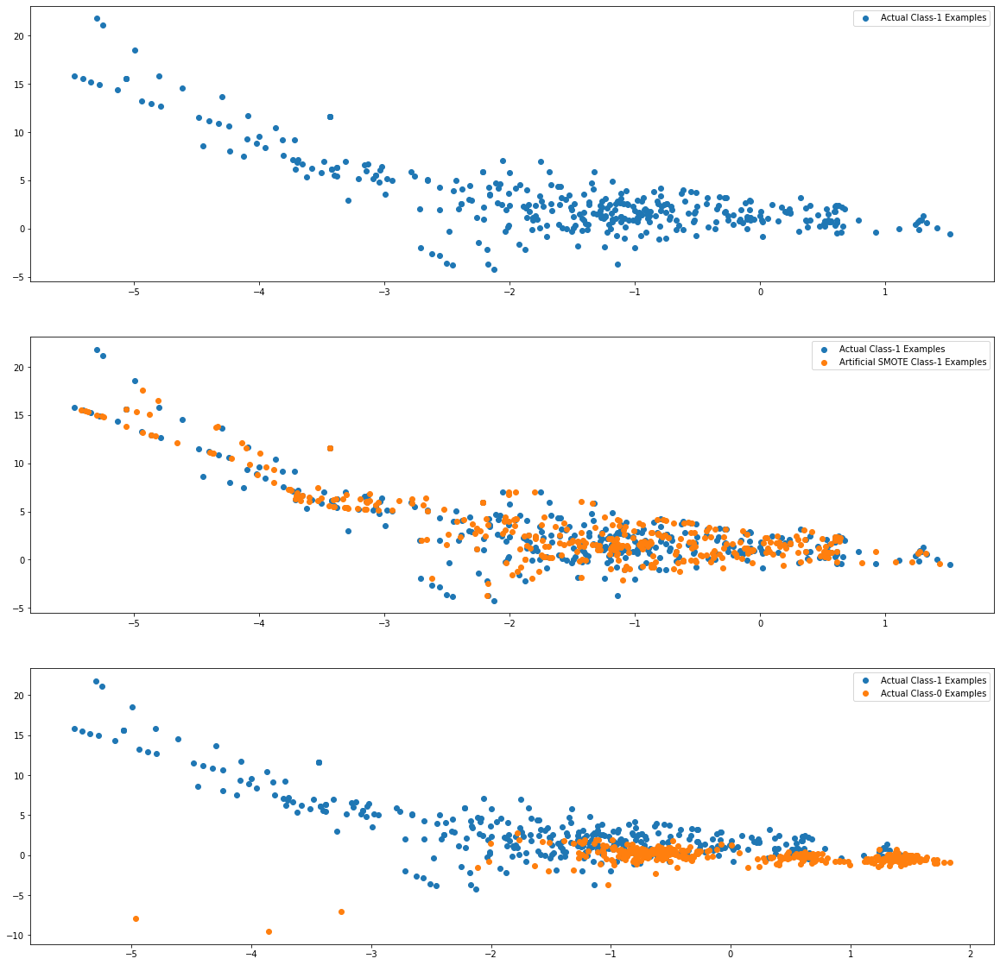

In [20]:
import warnings
warnings.filterwarnings("ignore")


sm = over_sampling.SMOTE(random_state=0)
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)
# Artificial minority samples and corresponding minority labels from SMOTE are appended
# below X_train and y_train respectively
# So to exclusively get the artificial minority samples from SMOTE, we do
X_train_smote_1 = X_train_smote[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]


plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_smote_1[:X_train_1.shape[0], 0], X_train_smote_1[:X_train_1.shape[0], 1],
            label='Artificial SMOTE Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
plt.legend()

In [14]:
#SMOTE Logistic Regression

# Random Oversampling Logistic Regression
import warnings
warnings.filterwarnings("ignore")

from imblearn import over_sampling #- import the packages
from sklearn import linear_model #import the package
from sklearn import metrics

num_C = [0.01,0.05] #--> list of values
cv_num = 0
roc = np.zeros((len(num_C),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    rand_samp = over_sampling.SMOTE(random_state=0)
    X_train_cv,y_train_cv = rand_samp.fit_resample(X_train_cv,y_train_cv)
    for id,val in enumerate(num_C):
      clf = linear_model.LogisticRegression(C=val,n_jobs=-1, random_state= 0,max_iter=1000)
      clf.fit(X_train_cv,y_train_cv)
      roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv,y_score=clf.predict_proba(X_test_cv)[:,1])
    cv_num +=1
print("AUC score ", roc)

print("Best num_C ", num_C[np.argmax(np.mean(roc,axis=1))])
print("AUC score corresponding to Best num_C ", np.max(np.mean(roc,axis=1)))


AUC score  [[0.97481178 0.98288392 0.9745683 ]
 [0.97455025 0.98315695 0.97371644]]
Best num_C  0.01
AUC score corresponding to Best num_C  0.977421335263065


In [ ]:
#SMOTE KNN

from sklearn import neighbors
from sklearn import metrics

neigh = 25
roc = np.zeros((len(range(1, neigh+1, 2)), no_of_split)) 
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    sm = over_sampling.SMOTE(random_state=0)
    X_train_cv,y_train_cv = sm.fit_resample(X_train_cv,y_train_cv)
    for id, k in enumerate(range(1, neigh+1, 3)):
        clf = neighbors.KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
        clf.fit(X_train_cv, y_train_cv)
        roc[id, cv_num] = metrics.roc_auc_score(y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
        print('Neighbour =', k, '; auc =', roc[id, cv_num], "k_fold ",cv_num)
    cv_num += 1

print('Best neighbour k:', 2*np.argmax(np.mean(roc,axis=1))+1)
print('Best auc score corresponding to Best neighbour:', np.max(np.mean(roc,axis=1)))

#Neighbour = 1 ; auc = 0.8981629509453413 k_fold  0
#Neighbour = 4 ; auc = 0.9183410603362776 k_fold  0
#Neighbour = 7 ; auc = 0.9222693014082465 k_fold  0
#Neighbour = 10 ; auc = 0.9221755662455964 k_fold  0
#Neighbour = 13 ; auc = 0.9220888083189701 k_fold  0
#Neighbour = 16 ; auc = 0.9220091991997453 k_fold  0
#Neighbour = 19 ; auc = 0.9259640338352483 k_fold  0
#Neighbour = 22 ; auc = 0.9258835668591354 k_fold  0
#Neighbour = 25 ; auc = 0.9258052731204727 k_fold  0
#Neighbour = 1 ; auc = 0.8981066755334755 k_fold  1
#Neighbour = 4 ; auc = 0.9142065332779271 k_fold  1
#Neighbour = 7 ; auc = 0.9181577077240405 k_fold  1
#Neighbour = 10 ; auc = 0.9180352057604061 k_fold  1
#Neighbour = 13 ; auc = 0.9179177937476417 k_fold  1
#Neighbour = 16 ; auc = 0.9218810353806488 k_fold  1
#Neighbour = 19 ; auc = 0.9258436479186047 k_fold  1
#Neighbour = 22 ; auc = 0.9257574618965706 k_fold  1
#Neighbour = 25 ; auc = 0.9256685307324942 k_fold  1
#Neighbour = 1 ; auc = 0.9222718108607126 k_fold  2
#Neighbour = 4 ; auc = 0.9505727361924847 k_fold  2
#Neighbour = 7 ; auc = 0.9504946129260948 k_fold  2
#Neighbour = 10 ; auc = 0.9544435553109295 k_fold  2
#Neighbour = 13 ; auc = 0.9543887088889179 k_fold  2
#Neighbour = 16 ; auc = 0.9543335765105871 k_fold  2
#Neighbour = 19 ; auc = 0.9542791304274224 k_fold  2
#Neighbour = 22 ; auc = 0.9542173066712237 k_fold  2
#Neighbour = 25 ; auc = 0.9541559404451357 k_fold  2
#Best neighbour k: 13
#Best auc score corresponding to Best neighbour: 0.9353622707270918


In [29]:
#SMOTE Random Forest
import warnings
warnings.filterwarnings("ignore")

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from imblearn import over_sampling
cv_num=0
no_trees = range(610,900,1)
no_of_split=3
roc = np.zeros((len(no_trees),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train, y_train):
  X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
  y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
  sm = over_sampling.SMOTE(random_state=0)
  X_train_cv, y_train_cv = sm.fit_resample(X_train_cv, y_train_cv)
  clf = RandomForestClassifier(criterion='entropy',min_samples_leaf=30,n_jobs=-1,warm_start=True)
  for id, tree in enumerate(no_trees):
    clf.set_params(n_estimators=tree)
    clf.fit(X_train_cv,y_train_cv)
    roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
    print('tree_no =', tree, '; auc =', roc[id, cv_num], '; cv_num =', cv_num)
  cv_num += 1

print('Optimal num_trees ', no_trees[np.argmax(np.mean(roc,axis=1))])
print('Best auc corresponding to Best num_trees :', np.max(np.mean(roc,axis=1)))

#Optimal num_trees  694
#Best auc corresponding to Best num_trees : 0.9802753050181674

tree_no = 610 ; auc = 0.9937146541515641 ; cv_num = 0
tree_no = 611 ; auc = 0.9937059612017637 ; cv_num = 0
tree_no = 612 ; auc = 0.993698526442066 ; cv_num = 0
tree_no = 613 ; auc = 0.993714654151564 ; cv_num = 0
tree_no = 614 ; auc = 0.9937184287218722 ; cv_num = 0
tree_no = 615 ; auc = 0.9937153404370747 ; cv_num = 0
tree_no = 616 ; auc = 0.9937190006264643 ; cv_num = 0
tree_no = 617 ; auc = 0.9937155691989116 ; cv_num = 0
tree_no = 618 ; auc = 0.9937074481537033 ; cv_num = 0
tree_no = 619 ; auc = 0.9937136247232983 ; cv_num = 0
tree_no = 620 ; auc = 0.9937084775819691 ; cv_num = 0
tree_no = 621 ; auc = 0.9937005852985976 ; cv_num = 0
tree_no = 622 ; auc = 0.9936913204442052 ; cv_num = 0
tree_no = 623 ; auc = 0.9937159123416668 ; cv_num = 0
tree_no = 624 ; auc = 0.9937151116752377 ; cv_num = 0
tree_no = 625 ; auc = 0.9937084775819691 ; cv_num = 0
tree_no = 626 ; auc = 0.9937000133940055 ; cv_num = 0
tree_no = 627 ; auc = 0.9936947518717579 ; cv_num = 0
tree_no = 628 ; auc = 0.993687

In [ ]:
# SMOTE XGBoost

from xgboost import XGBClassifier
from imblearn import over_sampling

num_depth = [4,5]
learning_rate = [0.14, 0.15]
initial_trees = 1125
num_trees = 1226
tree_increment = 1
trees = range(initial_trees, num_trees+1, tree_increment)
auc = np.zeros((len(trees)*len(num_depth)*len(learning_rate), no_of_split))
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    sm = over_sampling.SMOTE(random_state=0)
    X_train_cv,y_train_cv = sm.fit_resample(X_train_cv,y_train_cv)
    for lr_id, lr in enumerate(learning_rate):
        for depth_id, depth in enumerate(num_depth):
            clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30, n_estimators=initial_trees,
                                n_jobs=56)
            clf.fit(X_train_cv, y_train_cv)
            clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(initial_trees)+'_cv_num_'+str(cv_num)+\
                           '.model')
            auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)
            auc[auc_id, cv_num] = metrics.roc_auc_score(
                y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
            print('learning rate =', lr, '; depth =', depth, '; num_trees = ', initial_trees, '; auc =', auc[auc_id,
                    cv_num], '; cv_num =', cv_num)
            for tree_id,tree in enumerate(trees[1:]):
                clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30,
                                    n_estimators=tree_increment, n_jobs=56)
                clf.fit(X_train_cv, y_train_cv, xgb_model=(
                    'lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(trees[tree_id])+'_cv_num_'+str(cv_num)+'.model'))
                clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(tree)+'_cv_num_'+str(cv_num)+'.model')
                auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)+tree_id+1
                auc[auc_id, cv_num] = metrics.roc_auc_score(
                    y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
                print('learning rate =', lr, '; depth =', depth, '; num_trees =', tree, '; auc =', auc[auc_id,
                        cv_num], '; cv_num =', cv_num)
    cv_num += 1
mean_auc = np.mean(auc, axis=1)
lr_id = np.argmax(mean_auc)//(len(num_depth)*len(trees))
depth_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))//len(trees)
tree_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))%len(trees)
print('Best Learning Rate:', learning_rate[lr_id])
print('Best Depth:', num_depth[depth_id])
print('Best Trees:', trees[tree_id])
print('Best auc corresponding to Best Learning Rate, Depth & Trees :', mean_auc[np.argmax(mean_auc)])

# Best Learning Rate: 0.14
# Best Depth: 5
# Best Trees: 1167
# Best auc corresponding to Best Learning Rate, Depth & Trees : 0.9820740165368663

### Print the class distribution after applying ADASYN

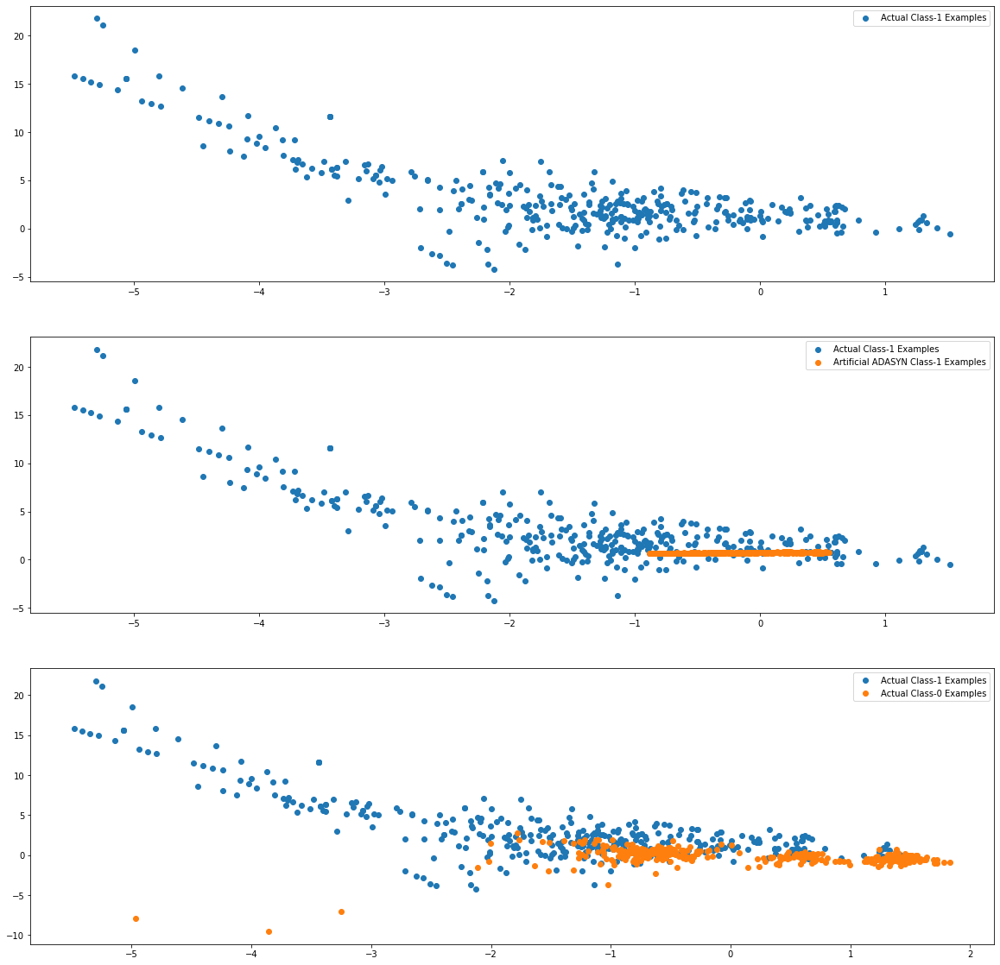

In [21]:
import warnings
warnings.filterwarnings("ignore")

from imblearn import over_sampling

ada = over_sampling.ADASYN(random_state=0)
X_train_adasyn, y_train_adasyn = ada.fit_resample(X_train, y_train)
# Artificial minority samples and corresponding minority labels from ADASYN are appended
# below X_train and y_train respectively
# So to exclusively get the artificial minority samples from ADASYN, we do
X_train_adasyn_1 = X_train_adasyn[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]



import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_adasyn_1[:X_train_1.shape[0], 0], X_train_adasyn_1[:X_train_1.shape[0], 1],
            label='Artificial ADASYN Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
plt.legend()

In [ ]:
#ADASYN KNN

from sklearn import neighbors
from sklearn import metrics

neigh = 29
roc = np.zeros((len(range(1, neigh+1, 2)), no_of_split)) 
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    sm = over_sampling.ADASYN(random_state=0)
    X_train_cv,y_train_cv = sm.fit_resample(X_train_cv,y_train_cv)
    for id, k in enumerate(range(1, neigh+1, 3)):
        clf = neighbors.KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
        clf.fit(X_train_cv, y_train_cv)
        roc[id, cv_num] = metrics.roc_auc_score(y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
        print('Neighbour =', k, '; auc =', roc[id, cv_num], "k_fold ",cv_num)
    cv_num += 1

print('Best neighbour k:', 2*np.argmax(np.mean(roc,axis=1))+1)
print('Best auc score corresponding to Best neighbour:', np.max(np.mean(roc,axis=1)))

#Best neighbour k: 13
#Best auc score corresponding to Best neighbour: 0.935243008140291

In [31]:
#ADASYN Random Forest
import warnings
warnings.filterwarnings("ignore")

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from imblearn import over_sampling
cv_num=0
no_trees = range(800,900,1)
no_of_split=3
roc = np.zeros((len(no_trees),no_of_split))
for train_idx, test_idx in st_kfold.split(X_train, y_train):
  X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
  y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
  ada = over_sampling.ADASYN(random_state=0)
  X_train_cv, y_train_cv = ada.fit_resample(X_train_cv, y_train_cv)
  clf = RandomForestClassifier(criterion='entropy',min_samples_leaf=30,n_jobs=-1,warm_start=True)
  for id, tree in enumerate(no_trees):
    clf.set_params(n_estimators=tree)
    clf.fit(X_train_cv,y_train_cv)
    roc[id,cv_num] = metrics.roc_auc_score(y_true=y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
    print('tree_no =', tree, '; auc =', roc[id, cv_num], '; cv_num =', cv_num)
  cv_num += 1

print('Optimal num_trees ', no_trees[np.argmax(np.mean(roc,axis=1))])
print('Best auc corresponding to Best num_trees :', np.max(np.mean(roc,axis=1)))

tree_no = 800 ; auc = 0.992954249805867 ; cv_num = 0
tree_no = 801 ; auc = 0.9929515046638248 ; cv_num = 0
tree_no = 802 ; auc = 0.9929532203776011 ; cv_num = 0
tree_no = 803 ; auc = 0.9929527628539275 ; cv_num = 0
tree_no = 804 ; auc = 0.9929547073295406 ; cv_num = 0
tree_no = 805 ; auc = 0.9929476157125983 ; cv_num = 0
tree_no = 806 ; auc = 0.9929396090483084 ; cv_num = 0
tree_no = 807 ; auc = 0.9929332037168765 ; cv_num = 0
tree_no = 808 ; auc = 0.9929257689571789 ; cv_num = 0
tree_no = 809 ; auc = 0.9929191348639101 ; cv_num = 0
tree_no = 810 ; auc = 0.9929169616264601 ; cv_num = 0
tree_no = 811 ; auc = 0.9929121576278862 ; cv_num = 0
tree_no = 812 ; auc = 0.9929079255339045 ; cv_num = 0
tree_no = 813 ; auc = 0.9929153602936021 ; cv_num = 0
tree_no = 814 ; auc = 0.9929696912298546 ; cv_num = 0
tree_no = 815 ; auc = 0.9929741520856731 ; cv_num = 0
tree_no = 816 ; auc = 0.9929663741832202 ; cv_num = 0
tree_no = 817 ; auc = 0.9929576812334198 ; cv_num = 0
tree_no = 818 ; auc = 0.99295

In [ ]:
# ADASYN XGBoost

from xgboost import XGBClassifier
from imblearn import over_sampling

num_depth = [3,4]
learning_rate = [0.11, 0.14, 0.15]
initial_trees = 25
num_trees = 45
tree_increment = 1
trees = range(initial_trees, num_trees+1, tree_increment)
auc = np.zeros((len(trees)*len(num_depth)*len(learning_rate), no_of_split))
cv_num = 0
for train_idx, test_idx in st_kfold.split(X_train, y_train):
    X_train_cv, X_test_cv = X_train.iloc[train_idx].to_numpy(), X_train.iloc[test_idx].to_numpy()
    y_train_cv, y_test_cv = y_train.iloc[train_idx].to_numpy(), y_train.iloc[test_idx].to_numpy()
    sm = over_sampling.ADASYN(random_state=0)
    X_train_cv,y_train_cv = sm.fit_resample(X_train_cv,y_train_cv)
    for lr_id, lr in enumerate(learning_rate):
        for depth_id, depth in enumerate(num_depth):
            clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30, n_estimators=initial_trees,
                                n_jobs=56)
            clf.fit(X_train_cv, y_train_cv)
            clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(initial_trees)+'_cv_num_'+str(cv_num)+\
                           '.model')
            auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)
            auc[auc_id, cv_num] = metrics.roc_auc_score(
                y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
            print('learning rate =', lr, '; depth =', depth, '; num_trees = ', initial_trees, '; auc =', auc[auc_id,
                    cv_num], '; cv_num =', cv_num)
            for tree_id,tree in enumerate(trees[1:]):
                clf = XGBClassifier(learning_rate=lr, max_depth=depth, min_child_weight=30,
                                    n_estimators=tree_increment, n_jobs=56)
                clf.fit(X_train_cv, y_train_cv, xgb_model=(
                    'lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(trees[tree_id])+'_cv_num_'+str(cv_num)+'.model'))
                clf.save_model('lr_'+str(lr)+'_depth_'+str(depth)+'_tree_'+str(tree)+'_cv_num_'+str(cv_num)+'.model')
                auc_id = lr_id*len(num_depth)*len(trees)+depth_id*len(trees)+tree_id+1
                auc[auc_id, cv_num] = metrics.roc_auc_score(
                    y_true = y_test_cv, y_score = clf.predict_proba(X_test_cv)[:,1])
                print('learning rate =', lr, '; depth =', depth, '; num_trees =', tree, '; auc =', auc[auc_id,
                        cv_num], '; cv_num =', cv_num)
    cv_num += 1
mean_auc = np.mean(auc, axis=1)
lr_id = np.argmax(mean_auc)//(len(num_depth)*len(trees))
depth_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))//len(trees)
tree_id = (np.argmax(mean_auc) - lr_id*len(num_depth)*len(trees))%len(trees)
print('Best Learning Rate:', learning_rate[lr_id])
print('Best Depth:', num_depth[depth_id])
print('Best Trees:', trees[tree_id])
print('Best auc corresponding to Best Learning Rate, Depth & Trees :', mean_auc[np.argmax(mean_auc)])

#learning rate = 0.11 ; depth = 3 ; num_trees =  25 ; auc = 0.9876991900801547 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 26 ; auc = 0.9876143766291418 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 27 ; auc = 0.988111533291081 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 28 ; auc = 0.9882977454262788 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 29 ; auc = 0.9882761274326963 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 30 ; auc = 0.9882625161034035 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 31 ; auc = 0.9883682612624886 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 32 ; auc = 0.9884549048081963 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 33 ; auc = 0.9882947715223998 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 34 ; auc = 0.9885366871648711 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 35 ; auc = 0.9885599064913115 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 36 ; auc = 0.9887460042455909 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 37 ; auc = 0.9891398177477322 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 38 ; auc = 0.9892439043835 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 39 ; auc = 0.9890902336195945 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 40 ; auc = 0.9890445384426831 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 41 ; auc = 0.9891885440189818 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 42 ; auc = 0.9894674618885639 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 43 ; auc = 0.989248193667941 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 44 ; auc = 0.9890278960190522 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees = 45 ; auc = 0.9892614046640192 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees =  25 ; auc = 0.9885279370246114 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 26 ; auc = 0.98865958946172 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 27 ; auc = 0.9888175495100665 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 28 ; auc = 0.9895014902117957 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 29 ; auc = 0.9895371770583448 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 30 ; auc = 0.9898918722863842 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 31 ; auc = 0.9898008822657761 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 32 ; auc = 0.9896246784609407 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 33 ; auc = 0.9898314791614552 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 34 ; auc = 0.9902314692331915 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 35 ; auc = 0.9898393714448266 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 36 ; auc = 0.9898631626758593 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 37 ; auc = 0.9895718344766279 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 38 ; auc = 0.9895175035403754 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 39 ; auc = 0.9893771581534665 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 40 ; auc = 0.9894887367393912 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 41 ; auc = 0.9894145035233327 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 42 ; auc = 0.9895166456834872 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 43 ; auc = 0.9896234774612972 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 44 ; auc = 0.9893889965785235 ; cv_num = 0
#learning rate = 0.11 ; depth = 4 ; num_trees = 45 ; auc = 0.9894493325129934 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees =  25 ; auc = 0.9869013831741322 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 26 ; auc = 0.9864723403491157 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 27 ; auc = 0.9872882766307087 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 28 ; auc = 0.9874518413440582 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 29 ; auc = 0.9875154371347031 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 30 ; auc = 0.9875913288740789 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 31 ; auc = 0.9881083306253652 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 32 ; auc = 0.9879425926745656 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 33 ; auc = 0.9876691650890679 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 34 ; auc = 0.9872129567959251 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 35 ; auc = 0.9870587713178867 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 36 ; auc = 0.986785915636981 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 37 ; auc = 0.9870370389433858 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 38 ; auc = 0.9876684788035572 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 39 ; auc = 0.9881438459005365 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 40 ; auc = 0.9879294388689466 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 41 ; auc = 0.9881607742764634 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 42 ; auc = 0.9881562562301857 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 43 ; auc = 0.9882859641916809 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 44 ; auc = 0.9881245155253224 ; cv_num = 0
#learning rate = 0.14 ; depth = 3 ; num_trees = 45 ; auc = 0.988439520574668 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees =  25 ; auc = 0.9901789683916339 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 26 ; auc = 0.9897814375096438 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 27 ; auc = 0.9895912220423011 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 28 ; auc = 0.9897870993651058 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 29 ; auc = 0.9896004297062343 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 30 ; auc = 0.9895737217617818 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 31 ; auc = 0.9898879261446984 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 32 ; auc = 0.9900625858071352 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 33 ; auc = 0.9897021715331744 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 34 ; auc = 0.9899634175508598 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 35 ; auc = 0.9900522915244768 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 36 ; auc = 0.9902343859466113 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 37 ; auc = 0.9903582032908077 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 38 ; auc = 0.9904168807019602 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 39 ; auc = 0.9905123887688462 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 40 ; auc = 0.9907663715982115 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 41 ; auc = 0.9908339707210013 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 42 ; auc = 0.9905614009923916 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 43 ; auc = 0.9905246847175769 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 44 ; auc = 0.9905818179863308 ; cv_num = 0
#learning rate = 0.14 ; depth = 4 ; num_trees = 45 ; auc = 0.9900549794760599 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees =  25 ; auc = 0.9890190314978742 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 26 ; auc = 0.9891976944924559 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 27 ; auc = 0.9893846501036234 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 28 ; auc = 0.9893264874066038 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 29 ; auc = 0.9893886534357683 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 30 ; auc = 0.9890035900738866 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 31 ; auc = 0.988750064768195 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 32 ; auc = 0.9887278748700203 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 33 ; auc = 0.9882420419190052 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 34 ; auc = 0.9883452135074257 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 35 ; auc = 0.9879255499177201 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 36 ; auc = 0.9879899463747941 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 37 ; auc = 0.9874858696672899 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 38 ; auc = 0.9874983371873984 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 39 ; auc = 0.9879646110013626 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 40 ; auc = 0.9875799479726954 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 41 ; auc = 0.9873657125124832 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 42 ; auc = 0.9872051788934721 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 43 ; auc = 0.9876257575305252 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 44 ; auc = 0.9877532350641112 ; cv_num = 0
#learning rate = 0.15 ; depth = 3 ; num_trees = 45 ; auc = 0.9874799218595318 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees =  25 ; auc = 0.990625053973496 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 26 ; auc = 0.9910151500957883 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 27 ; auc = 0.9913532029001969 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 28 ; auc = 0.9914788503390879 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 29 ; auc = 0.9913861446047035 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 30 ; auc = 0.9912032495161401 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 31 ; auc = 0.9913091090561436 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 32 ; auc = 0.9911562961491263 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 33 ; auc = 0.9911402828205464 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 34 ; auc = 0.9913117970077266 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 35 ; auc = 0.9913107103890015 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 36 ; auc = 0.991526089658398 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 37 ; auc = 0.9913848864146009 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 38 ; auc = 0.9915626343618351 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 39 ; auc = 0.9914607209635173 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 40 ; auc = 0.9913434805221306 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 41 ; auc = 0.9911057397831818 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 42 ; auc = 0.9913349591437078 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 43 ; auc = 0.9912227514627318 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 44 ; auc = 0.9911772278571982 ; cv_num = 0
#learning rate = 0.15 ; depth = 4 ; num_trees = 45 ; auc = 0.9912451701227433 ; cv_num = 0
#learning rate = 0.11 ; depth = 3 ; num_trees =  25 ; auc = 0.9915312367997271 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 26 ; auc = 0.991695201846291 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 27 ; auc = 0.9916666066166845 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 28 ; auc = 0.9916214833443654 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 29 ; auc = 0.9918932524065459 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 30 ; auc = 0.9920978226791511 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 31 ; auc = 0.9920946200134352 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 32 ; auc = 0.9920641374986746 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 33 ; auc = 0.9919758354296496 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 34 ; auc = 0.9917001202257834 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 35 ; auc = 0.9917979159110378 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 36 ; auc = 0.9919071496881346 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 37 ; auc = 0.9918926233114946 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 38 ; auc = 0.9917288870267675 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 39 ; auc = 0.9918016332908866 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 40 ; auc = 0.9918299997586563 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 41 ; auc = 0.9919254506350829 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 42 ; auc = 0.9919076072118085 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 43 ; auc = 0.9914482534434089 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 44 ; auc = 0.9915091040920117 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees = 45 ; auc = 0.9916639758555608 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees =  25 ; auc = 0.9891216311817024 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 26 ; auc = 0.9891081342333281 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 27 ; auc = 0.9896722037325467 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 28 ; auc = 0.9898877545733209 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 29 ; auc = 0.9902815680754621 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 30 ; auc = 0.990124523074463 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 31 ; auc = 0.990431292697682 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 32 ; auc = 0.9905305753348759 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 33 ; auc = 0.9903847396638825 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 34 ; auc = 0.9901575791598881 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 35 ; auc = 0.9901613537301963 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 36 ; auc = 0.9903197713022165 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 37 ; auc = 0.9904629190216268 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 38 ; auc = 0.9903411033435029 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 39 ; auc = 0.9903700417158647 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 40 ; auc = 0.9907105537100195 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 41 ; auc = 0.9904744143039287 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 42 ; auc = 0.990454626405041 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 43 ; auc = 0.9902501705133541 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 44 ; auc = 0.9900075685853723 ; cv_num = 1
#learning rate = 0.11 ; depth = 4 ; num_trees = 45 ; auc = 0.9897902448403626 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees =  25 ; auc = 0.9920512696453517 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 26 ; auc = 0.991808724907829 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 27 ; auc = 0.9920372579828445 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 28 ; auc = 0.9921384850956516 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 29 ; auc = 0.9921252169091143 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 30 ; auc = 0.9922878665751161 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 31 ; auc = 0.9919465539145325 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 32 ; auc = 0.9917141318882906 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 33 ; auc = 0.991821078047019 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 34 ; auc = 0.9921864107004722 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 35 ; auc = 0.9924182036316628 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 36 ; auc = 0.9919423218205508 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 37 ; auc = 0.9920642518795931 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 38 ; auc = 0.9919849859031238 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 39 ; auc = 0.9918766671733741 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 40 ; auc = 0.9918280552830431 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 41 ; auc = 0.9916935433229739 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 42 ; auc = 0.9918000319580287 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 43 ; auc = 0.9919267088251856 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 44 ; auc = 0.991380368368323 ; cv_num = 1
#learning rate = 0.14 ; depth = 3 ; num_trees = 45 ; auc = 0.991441790921518 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees =  25 ; auc = 0.9904876253000069 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 26 ; auc = 0.990414650274051 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 27 ; auc = 0.9901250949790551 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 28 ; auc = 0.9903574026243788 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 29 ; auc = 0.9902511427511608 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 30 ; auc = 0.9906776120055126 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 31 ; auc = 0.9907961106370022 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 32 ; auc = 0.9904822493968409 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 33 ; auc = 0.9903866269490366 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 34 ; auc = 0.990690823001591 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 35 ; auc = 0.9903781627610729 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 36 ; auc = 0.9904319217927333 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 37 ; auc = 0.9899255002764016 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 38 ; auc = 0.99010221879537 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 39 ; auc = 0.990330122775334 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 40 ; auc = 0.9903620350515749 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 41 ; auc = 0.9899743409285695 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 42 ; auc = 0.9895201343014992 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 43 ; auc = 0.9899350510830901 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 44 ; auc = 0.9900219805810939 ; cv_num = 1
#learning rate = 0.14 ; depth = 4 ; num_trees = 45 ; auc = 0.989622333652113 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees =  25 ; auc = 0.991794255721648 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 26 ; auc = 0.9919760641914865 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 27 ; auc = 0.9918872474083286 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 28 ; auc = 0.9913926643170539 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 29 ; auc = 0.9913772800835255 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 30 ; auc = 0.9907311422753361 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 31 ; auc = 0.9907728913105617 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 32 ; auc = 0.9910176092855345 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 33 ; auc = 0.9911600135289751 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 34 ; auc = 0.9913182595296177 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 35 ; auc = 0.9910393988504947 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 36 ; auc = 0.9911824893794459 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 37 ; auc = 0.9911664760508662 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 38 ; auc = 0.9913614383263235 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 39 ; auc = 0.9908344282446749 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 40 ; auc = 0.990921414933138 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 41 ; auc = 0.9910042267180786 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 42 ; auc = 0.9907918785430204 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 43 ; auc = 0.9909100340317547 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 44 ; auc = 0.9906279134964565 ; cv_num = 1
#learning rate = 0.15 ; depth = 3 ; num_trees = 45 ; auc = 0.990503238295372 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees =  25 ; auc = 0.9909755171075536 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 26 ; auc = 0.99104700518157 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 27 ; auc = 0.9909116925550718 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 28 ; auc = 0.9909220440281894 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 29 ; auc = 0.9904756724940313 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 30 ; auc = 0.9905949717919498 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 31 ; auc = 0.9907687735974984 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 32 ; auc = 0.9902188301417053 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 33 ; auc = 0.9900764258982648 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 34 ; auc = 0.9897309955246177 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 35 ; auc = 0.9892898855127074 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 36 ; auc = 0.9891615501222332 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 37 ; auc = 0.9890577494387615 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 38 ; auc = 0.9887270742035914 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 39 ; auc = 0.9886794917415261 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 40 ; auc = 0.9884392918128312 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 41 ; auc = 0.9878373050391542 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 42 ; auc = 0.9873215614779707 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 43 ; auc = 0.9873949940276003 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 44 ; auc = 0.9869564575863544 ; cv_num = 1
#learning rate = 0.15 ; depth = 4 ; num_trees = 45 ; auc = 0.9872092394160763 ; cv_num = 1
#learning rate = 0.11 ; depth = 3 ; num_trees =  25 ; auc = 0.9721120527843337 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 26 ; auc = 0.9730109850691911 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 27 ; auc = 0.9733025461321891 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 28 ; auc = 0.9736404321188882 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 29 ; auc = 0.9743866637293235 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 30 ; auc = 0.9738754310219598 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 31 ; auc = 0.9731955412775659 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 32 ; auc = 0.9731816438004556 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 33 ; auc = 0.9727233130121333 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 34 ; auc = 0.9728291168502163 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 35 ; auc = 0.9725415019844225 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 36 ; auc = 0.9727186233284995 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 37 ; auc = 0.9734122389762123 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 38 ; auc = 0.9740165218698248 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 39 ; auc = 0.9743677334209961 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 40 ; auc = 0.9743487459214051 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 41 ; auc = 0.9738561003747858 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 42 ; auc = 0.9738126350142762 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 43 ; auc = 0.9738544990193985 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 44 ; auc = 0.9735292523020056 ; cv_num = 2
#learning rate = 0.11 ; depth = 3 ; num_trees = 45 ; auc = 0.9733729485779622 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees =  25 ; auc = 0.9709319110552315 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 26 ; auc = 0.9707697738222774 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 27 ; auc = 0.9705583949111671 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 28 ; auc = 0.9703302589597549 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 29 ; auc = 0.9698706699636286 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 30 ; auc = 0.9701088143862109 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 31 ; auc = 0.9697895155602559 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 32 ; auc = 0.9695512567551461 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 33 ; auc = 0.9698998946994452 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 34 ; auc = 0.9700953172479472 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 35 ; auc = 0.9702133028252256 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 36 ; auc = 0.9701831058379241 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 37 ; auc = 0.9703236819644147 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 38 ; auc = 0.9712676809651688 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 39 ; auc = 0.9715937283602555 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 40 ; auc = 0.9710954780697811 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 41 ; auc = 0.9713774881917198 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 42 ; auc = 0.9719240079088655 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 43 ; auc = 0.9723774202484983 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 44 ; auc = 0.972221402480774 ; cv_num = 2
#learning rate = 0.11 ; depth = 4 ; num_trees = 45 ; auc = 0.9728252278442759 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees =  25 ; auc = 0.9702562534643608 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 26 ; auc = 0.970677867461305 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 27 ; auc = 0.9712338237369824 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 28 ; auc = 0.971393730510647 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 29 ; auc = 0.9706175306779659 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 30 ; auc = 0.9701966029761877 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 31 ; auc = 0.970840633798161 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 32 ; auc = 0.9717916101331023 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 33 ; auc = 0.9710970222339045 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 34 ; auc = 0.9725002670832019 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 35 ; auc = 0.9727862234023448 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 36 ; auc = 0.9727192524324015 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 37 ; auc = 0.9720421078686714 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 38 ; auc = 0.9718478291454459 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 39 ; auc = 0.9721444230396608 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 40 ; auc = 0.9728068122573232 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 41 ; auc = 0.972218428535055 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 42 ; auc = 0.9728029232513828 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 43 ; auc = 0.9729072401166061 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 44 ; auc = 0.9731056366108274 ; cv_num = 2
#learning rate = 0.14 ; depth = 3 ; num_trees = 45 ; auc = 0.9734488413850626 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees =  25 ; auc = 0.970340610578508 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 26 ; auc = 0.9701176218408403 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 27 ; auc = 0.9700312630324592 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 28 ; auc = 0.9693807124064094 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 29 ; auc = 0.9698494520047484 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 30 ; auc = 0.9704218793644083 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 31 ; auc = 0.9698622056565821 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 32 ; auc = 0.9700724979336796 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 33 ; auc = 0.9700596298993183 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 34 ; auc = 0.9700643195829521 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 35 ; auc = 0.970545355303014 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 36 ; auc = 0.971162563422252 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 37 ; auc = 0.9711960775028555 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 38 ; auc = 0.97035393614298 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 39 ; auc = 0.9704535633245693 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 40 ; auc = 0.9708542453189523 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 41 ; auc = 0.9707236204723678 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 42 ; auc = 0.9715412267800608 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 43 ; auc = 0.9708334848901824 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 44 ; auc = 0.9706884478451132 ; cv_num = 2
#learning rate = 0.14 ; depth = 4 ; num_trees = 45 ; auc = 0.9704764398301008 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees =  25 ; auc = 0.9747891186528849 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 26 ; auc = 0.9742391674599095 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 27 ; auc = 0.974130904397482 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 28 ; auc = 0.9745366192230819 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 29 ; auc = 0.9752939459386997 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 30 ; auc = 0.9758408659946922 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 31 ; auc = 0.9752672948097556 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 32 ; auc = 0.9749187712479843 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 33 ; auc = 0.9742590700197219 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 34 ; auc = 0.974563899455928 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 35 ; auc = 0.9752528254200069 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 36 ; auc = 0.9744984726501081 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 37 ; auc = 0.9748762781389597 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 38 ; auc = 0.9734319699622331 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 39 ; auc = 0.9739902138884637 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 40 ; auc = 0.9744065090978717 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 41 ; auc = 0.974755089850907 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 42 ; auc = 0.9753778455227361 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 43 ; auc = 0.975551363817192 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 44 ; auc = 0.9760650557489001 ; cv_num = 2
#learning rate = 0.15 ; depth = 3 ; num_trees = 45 ; auc = 0.9757005186332569 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees =  25 ; auc = 0.9676744682413481 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 26 ; auc = 0.9682309392384 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 27 ; auc = 0.9684174971410087 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 28 ; auc = 0.9691463997985037 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 29 ; auc = 0.9698516824640375 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 30 ; auc = 0.9699470774921036 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 31 ; auc = 0.9697271770826827 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 32 ; auc = 0.9702451583591781 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 33 ; auc = 0.9705271684811166 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 34 ; auc = 0.9703920827159537 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 35 ; auc = 0.9703021208579512 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 36 ; auc = 0.9702713519580116 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 37 ; auc = 0.9711117203887083 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 38 ; auc = 0.9712445185033183 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 39 ; auc = 0.9716819172890792 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 40 ; auc = 0.9711915593930132 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 41 ; auc = 0.9718898647243598 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 42 ; auc = 0.972047255082416 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 43 ; auc = 0.9718156304639104 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 44 ; auc = 0.972113997287304 ; cv_num = 2
#learning rate = 0.15 ; depth = 4 ; num_trees = 45 ; auc = 0.9729624868774644 ; cv_num = 2
#Best Learning Rate: 0.15
#Best Depth: 3
#Best Trees: 29
#Best auc corresponding to Best Learning Rate, Depth & Trees : 0.9853532931526644


**AUC score**
1. **Logistic Regression** 
*   Random OverSampling (0.9785223829378878)
*  smote(0.977421335263065)
2. **KNN** 
*  Random OverSampling (0.939899344652683)
* smote (0.9353622707270918) 
* adasyn(0.935243008140291)
3. **Decision Tree**  
* Random OverSampling (0.9584271661917247)
4. **Random Forest **
* Random OverSampling(0.978449386336168)
*  smote (0.986313176574552)
* adasyn (0.9867592799105228)
5. **XGBoost **
* Random OverSampling (0.9855836491612969)
* smote(0.9820740165368663)
* adasyn(0.9853532931526644)

### Selecting the best performance model
ADASYN with Random Forest

In [16]:
# ADASYN with Random Forest performs well and has the AUC score of 0.9867592799105228

import warnings
warnings.filterwarnings("ignore")

from sklearn.ensemble import RandomForestClassifier
from imblearn import over_sampling


adsyn = over_sampling.ADASYN(random_state=0)
X_train_ads, y_train_ads = adsyn.fit_resample(X_train, y_train)
clf = RandomForestClassifier(criterion='entropy', min_samples_leaf=30, n_jobs=-1, random_state=0,
                                      n_estimators=855)
clf.fit(X_train_ads, y_train_ads)
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()
print('Final Test set auc score =', metrics.roc_auc_score(y_true = y_test, y_score = clf.predict_proba(X_test)[:,1]))

Final Test set auc score = 0.9805349984449914


### Print the important features of the best model to understand the dataset

Top var = 4
2nd Top var = 14
3rd Top var = 17


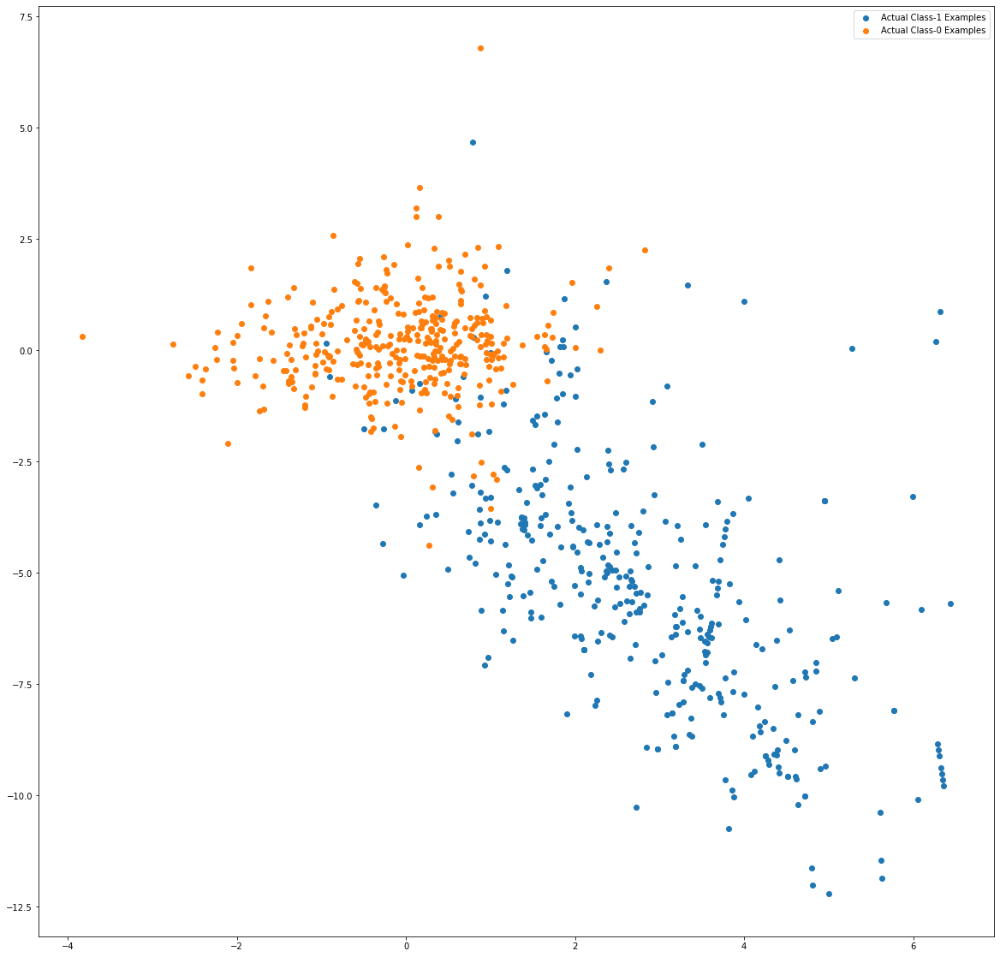

In [17]:
var_imp = []
for i in clf.feature_importances_:
    var_imp.append(i)
print('Top var =', var_imp.index(np.sort(clf.feature_importances_)[-1])+1)
print('2nd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-2])+1)
print('3rd Top var =', var_imp.index(np.sort(clf.feature_importances_)[-3])+1)

# Variable on Index-13 and Index-9 seems to be the top 2 variables
top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-1])
second_top_var_index = var_imp.index(np.sort(clf.feature_importances_)[-2])

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]

np.random.shuffle(X_train_0)

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]

plt.scatter(X_train_1[:, top_var_index], X_train_1[:, second_top_var_index], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], top_var_index], X_train_0[:X_train_1.shape[0], second_top_var_index],
            label='Actual Class-0 Examples')
plt.legend()

In [20]:
print('Train auc =', metrics.roc_auc_score(y_true = y_train_ads, y_score = clf.predict_proba(X_train_ads)[:,1]))
fpr, tpr, thresholds = metrics.roc_curve(y_train_ads, clf.predict_proba(X_train_ads)[:,1])
threshold = thresholds[np.argmax(tpr-fpr)]
print("FPR " ,fpr )
print("tpr ",tpr)
print( "threshold", threshold)

Train auc = 0.9999988029643171
FPR  [0.         0.         0.         ... 0.79315406 0.79316813 1.        ]
tpr  [0.         0.06970517 0.06973331 ... 1.         1.         1.        ]
threshold 0.7842968033783418
